In [1]:
#!/usr/bin/python
#import wradlib as wrl
import pylab as pl
from glob import glob
import warnings
warnings.filterwarnings('ignore')
try:
    get_ipython().magic("matplotlib inline")
except:
    pl.ion()
import numpy as np

import csv
import os
import datetime
import pandas as pd

#shapefile: GIS vector data format (ESRI)
import shapefile as shp  # Requires the pyshp package
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from matplotlib import ticker
import netCDF4 as nc4
from datetime import date,timedelta
import plotly.graph_objs as go
import matplotlib.lines as mlines
import seaborn as sns
import shapely

import importlib
import geopandas as gpd
import xarray as xr
import cartopy.crs as ccrs  # Projections list

import _pickle as pickle

#import external functions (need pip install ipynb)
import ipynb.fs.full.HaileventsFunctions as HF

# Notebook for validating the filtered and unfiltered datasets vs hail reports

- Upload OT data (**5-95%** thresholds filt) and hail reports data
- sea-land mask filter for OT data: retain only land OT detection (which can be verified against observations!)
- Define spatial and temporal window to check the matching between the two datasets:
    - spatial window: consider **25km** like in Punge 2017
    - for ESWD: temporal window **+-1.5h** (in Punge 2017 they used 1h but since I introduced temporal uncertainty aggregating all OTs to 1 hour it is better to consider 1.5h)
    - for UNIPOL: remove all reports at **00UTC** and consider large temporal window (**+-12h**) due to large uncertainty
- The length of the HITTED/HITTING datasets of reports/OTs respectively is the same and can be much longer than the respective unique datasets (without repetitions) because there could be more than one OT hitting the same observation as well as more than one observation hitted by the same OT -> this is why we need to clean datasets from repetitions before usage!
- Build contingency tables and compute scores

In [2]:
#Folder address containing data:
fold = '/home/ciccuz/phd/KIT/hail_data/'

In [3]:
#With geopandas: NEW VERSION!
sfg_ita = gpd.read_file(fold + "hail4_punge/geodata/ITA_adm/ITA_adm0.shp", encoding='latin-1')
sfg_deu = gpd.read_file(fold + "hail4_punge/geodata/DEU_adm/DEU_adm0.shp", encoding='latin-1')
sfg_aut = gpd.read_file(fold + "hail4_punge/geodata/AUT_adm/AUT_adm0.shp", encoding='latin-1')
sfg_che = gpd.read_file(fold + "hail4_punge/geodata/CHE_adm/CHE_adm0.shp", encoding='latin-1')
sfg_cro = gpd.read_file(fold + "hail4_punge/geodata/Croatia/mj788hg8036.shp", encoding='latin-1')
sfg_slo = gpd.read_file(fold + "hail4_punge/geodata/Slovenia/gk259nt7452.shp", encoding='latin-1')
sfg_hun = gpd.read_file(fold + "hail4_punge/geodata/Hungary/qh513vs8921.shp", encoding='latin-1')
sfg_alg = gpd.read_file(fold + "hail4_punge/geodata/algeria/rt767cn2098.shp", encoding='latin-1')
sfg_tun = gpd.read_file(fold + "hail4_punge/geodata/tunisia/TUN_adm0.shp", encoding='latin-1')
sfg_bos = gpd.read_file(fold + "hail4_punge/geodata/bosnia/bt512fj0408.shp", encoding='latin-1')
sfg_fra = gpd.read_file(fold + "hail4_punge/geodata/france/dw125xh0996.shp", encoding='latin-1')
sfg_mon = gpd.read_file(fold + "hail4_punge/geodata/montenegro/MNE_adm0.shp", encoding='latin-1')
sfg_cze = gpd.read_file(fold + "hail4_punge/geodata/czech/CZE_adm0.shp", encoding='latin-1')
sfg_svk = gpd.read_file(fold + "hail4_punge/geodata/slovakia/SVK_adm0.shp", encoding='latin-1')


#lat/lon coords to cover the whole SPHERA domain:
lonmin=6; lonmax=19; latmin=35; latmax=49
latplot=[latmin,latmax]; lonplot=[lonmin,lonmax]

#maps limits whole SPHERA domain
x_lim=lonplot
y_lim=latplot


#shapefile in vector form for considering multiple geographic shapefiles
sf_geo = [sfg_ita, sfg_aut, sfg_deu, sfg_che, sfg_cro, sfg_slo, sfg_hun, sfg_alg, sfg_tun, sfg_fra, sfg_bos,
          sfg_mon, sfg_cze, sfg_svk]

sfg_land = gpd.read_file(fold + "hail4_punge/geodata/Land/ne_10m_land.shp", encoding='latin-1')

hhmin=0; hhmax=23

In [4]:
#Read and store cities and their features to be used in the maps:
clonsel, clatsel, csizesel, cnamesel, ckindsel = HF.HF_cities(latmin,latmax,lonmin,lonmax)

### - Upload data

In [5]:
#Read ESWD hail report data: store lat, lon, hail size and datetime, and retain only data in the selected area/time
df_eswd = pd.read_csv(fold + 'hail4_punge/ESWD/ESWD_HAIL_19790101-20200531_v1_6.csv')   #Swabian Jura 2013
    
eswd_df = pd.DataFrame(columns=['datetime','lat','lon','size','QC_level'])
eswd_df['datetime'] = pd.to_datetime(df_eswd['TIME_EVENT'])
eswd_df['lat'] = df_eswd['LATITUDE']
eswd_df['lon'] = df_eswd['LONGITUDE']
eswd_df['size'] = df_eswd['MAX_HAIL_DIAMETER']
eswd_df['QC_level'] = df_eswd['QC_LEVEL']

eswd_df = eswd_df.sort_values(by='datetime').reset_index(drop=True)

#try:retain only data in the selected day and year and within hhmin and hhmax, as well as within latmin,latmax and lonmin,lonmax
eswd_df_years = eswd_df.datetime.apply(lambda x: x.year)
eswd_df_months = eswd_df.datetime.apply(lambda x: x.month)
eswd_df_days = eswd_df.datetime.apply(lambda x: x.day)
eswd_df_hours = eswd_df.datetime.apply(lambda x: x.hour)

eswd_df_sel = eswd_df.loc[(eswd_df_years >= 2016) & (eswd_df_years <= 2018) & (eswd_df_months >= 4)   #(eswd_df_years >= 1995) &
                         & (eswd_df_months <= 10)]
eswd_df_sel = eswd_df_sel.loc[(eswd_df_sel.lat >= latmin) & (eswd_df_sel.lat <= latmax)]
eswd = eswd_df_sel.loc[(eswd_df_sel.lon >= lonmin) & (eswd_df_sel.lon <= lonmax)].reset_index(drop=True)

eswd = gpd.GeoDataFrame(eswd, geometry=gpd.points_from_xy(eswd.lon, eswd.lat)) 

#split eswd dataset in the years:
eswd_2016 = eswd[eswd.datetime.dt.year ==2016]
eswd_2017 = eswd[eswd.datetime.dt.year ==2017]
eswd_2018 = eswd[eswd.datetime.dt.year ==2018]

In [6]:
#Read UNIPOL insurance data
df_unipol = pd.read_csv(fold + 'data/ESWD_insurance/Insurance_ESSL_Italy_data/original_ungridded_data/UNIPOL/Estrazione_SINISTRI_GRANDINE_E_VENTO_ITALIA_DateLatLon.csv')

#retain only data within the period considered
dfu_ev = pd.DataFrame()
dfu_ev = df_unipol.loc[(df_unipol.year >= 2016) & (df_unipol.year <= 2018) &
                      (df_unipol.month >= 4) & (df_unipol.month <= 10)].reset_index(drop=True)

#save date lat lon data in arrays
u_ev = pd.DataFrame(columns=['datetime','lon','lat'])
u_ev['datetime'] = pd.to_datetime({'year': dfu_ev['year'],'month':dfu_ev['month'],'day':dfu_ev['day'],'hour':dfu_ev['hour'],
               'minute':dfu_ev['min']})
u_ev['lon'] = np.array(dfu_ev.lon)
u_ev['lat'] = np.array(dfu_ev.lat)

u_ev = u_ev.sort_values(by='datetime').reset_index(drop=True)

u_ev_hours = u_ev.datetime.apply(lambda x: x.hour)

unipol = u_ev.loc[(u_ev.lat >= latmin) & (u_ev.lat <= latmax)]
unipol = unipol.loc[(unipol.lon >= lonmin) & (unipol.lon <= lonmax)].reset_index(drop=True)

unipol = gpd.GeoDataFrame(unipol, geometry=gpd.points_from_xy(unipol.lon, unipol.lat)) 

#remove unipol reports issued at 00UTC (11% in 2017-2018)
unipol_NO00 = unipol[unipol.datetime.dt.hour != 0]

#split unipol dataset in years:
unipol_NO00_2017 = unipol_NO00[unipol_NO00.datetime.dt.year == 2017]
unipol_NO00_2018 = unipol_NO00[unipol_NO00.datetime.dt.year == 2018]

In [7]:
df_unipol

,ind,day,month,year,hour,min,0,lon,lat
0,1,9,8,2017,19,30,0,7.773147,45.148308
1,2,28,12,2017,15,0,0,14.209063,40.973919
2,3,2,1,2018,9,0,0,15.719947,38.115585
3,4,31,8,2017,12,0,0,8.116144,45.206211
4,5,6,6,2017,13,45,0,8.944374,45.511799
...,...,...,...,...,...,...,...,...,...
119291,119292,24,7,2020,0,0,0,14.490666,42.235462
119292,119293,30,8,2020,14,30,0,13.494031,43.575127
119293,119294,28,8,2020,0,0,0,9.278058,45.587769
119294,119295,12,6,2018,16,0,0,7.468766,45.077435


In [8]:
#LIST OF DAYS WITH JULIAN DAY AND DATETIME FORMAT FOR OT DATA:

#days in 2016: 214 days (actually 211 because the following days are missing: 2016185,2016186,2016201 )
days_2016 = [2016092,2016093,2016094,2016095,2016096,2016097,2016098,2016099,2016100,2016101,2016102,2016103,2016104,
        2016105,2016106,2016107,2016108,2016109,2016110,2016111,2016112,2016113,2016114,2016115,2016116,2016117,
        2016118,2016119,2016120,2016121,2016122,2016123,2016124,2016125,2016126,2016127,2016128,2016129,2016130,
        2016131,2016132,2016133,2016134,2016135,2016136,2016137,2016138,2016139,2016140,2016141,2016142,2016143,
        2016144,2016145,2016146,2016147,2016148,2016149,2016150,2016151,2016152,2016153,2016154,2016155,2016156,
        2016157,2016158,2016159,2016160,2016161,2016162,2016163,2016164,2016165,2016166,2016167,2016168,2016169,
        2016170,2016171,2016172,2016173,2016174,2016175,2016176,2016177,2016178,2016179,2016180,2016181,2016182,
        2016183,2016184,2016185,2016186,2016187,2016188,2016189,2016190,2016191,2016192,2016193,2016194,2016195,
        2016196,2016197,2016198,2016199,2016200,2016201,2016202,2016203,2016204,2016205,2016206,2016207,2016208,
        2016209,2016210,2016211,2016212,2016213,2016214,2016215,2016216,2016217,2016218,2016219,2016220,2016221,
        2016222,2016223,2016224,2016225,2016226,2016227,2016228,2016229,2016230,2016231,2016232,2016233,2016234,
        2016235,2016236,2016237,2016238,2016239,2016240,2016241,2016242,2016243,2016244,2016245,2016246,2016247,
        2016248,2016249,2016250,2016251,2016252,2016253,2016254,2016255,2016256,2016257,2016258,2016259,2016260,
        2016261,2016262,2016263,2016264,2016265,2016266,2016267,2016268,2016269,2016270,2016271,2016272,2016273,
        2016274,2016275,2016276,2016277,2016278,2016279,2016280,2016281,2016282,2016283,2016284,2016285,2016286,
        2016287,2016288,2016289,2016290,2016291,2016292,2016293,2016294,2016295,2016296,2016297,2016298,2016299,
        2016300,2016301,2016302,2016303,2016304,2016305]

#days in 2017: missing 1 april (2017091), 213 days
days_2017 = [2017091,2017092,2017093,2017094,2017095,2017096,2017097,2017098,2017099,2017100,2017101,2017102,2017103,2017104,
        2017105,2017106,2017107,2017108,2017109,2017110,2017111,2017112,2017113,2017114,2017115,2017116,2017117,
        2017118,2017119,2017120,2017121,2017122,2017123,2017124,2017125,2017126,2017127,2017128,2017129,2017130,
        2017131,2017132,2017133,2017134,2017135,2017136,2017137,2017138,2017139,2017140,2017141,2017142,2017143,
        2017144,2017145,2017146,2017147,2017148,2017149,2017150,2017151,2017152,2017153,2017154,2017155,2017156,
        2017157,2017158,2017159,2017160,2017161,2017162,2017163,2017164,2017165,2017166,2017167,2017168,2017169,
        2017170,2017171,2017172,2017173,2017174,2017175,2017176,2017177,2017178,2017179,2017180,2017181,2017182,
        2017183,2017184,2017185,2017186,2017187,2017188,2017189,2017190,2017191,2017192,2017193,2017194,2017195,
        2017196,2017197,2017198,2017199,2017200,2017201,2017202,2017203,2017204,2017205,2017206,2017207,2017208,
        2017209,2017210,2017211,2017212,2017213,2017214,2017215,2017216,2017217,2017218,2017219,2017220,2017221,
        2017222,2017223,2017224,2017225,2017226,2017227,2017228,2017229,2017230,2017231,2017232,2017233,2017234,
        2017235,2017236,2017237,2017238,2017239,2017240,2017241,2017242,2017243,2017244,2017245,2017246,2017247,
        2017248,2017249,2017250,2017251,2017252,2017253,2017254,2017255,2017256,2017257,2017258,2017259,2017260,
        2017261,2017262,2017263,2017264,2017265,2017266,2017267,2017268,2017269,2017270,2017271,2017272,2017273,
        2017274,2017275,2017276,2017277,2017278,2017279,2017280,2017281,2017282,2017283,2017284,2017285,2017286,
        2017287,2017288,2017289,2017290,2017291,2017292,2017293,2017294,2017295,2017296,2017297,2017298,2017299,
        2017300,2017301,2017302,2017303,2017304]

#days in 2018: missing 1 april (2018091) and 17 june (2018168), 212 days
days_2018 = [2018091,2018092,2018093,2018094,2018095,2018096,2018097,2018098,2018099,2018100,2018101,2018102,2018103,2018104,
        2018105,2018106,2018107,2018108,2018109,2018110,2018111,2018112,2018113,2018114,2018115,2018116,2018117,
        2018118,2018119,2018120,2018121,2018122,2018123,2018124,2018125,2018126,2018127,2018128,2018129,2018130,
        2018131,2018132,2018133,2018134,2018135,2018136,2018137,2018138,2018139,2018140,2018141,2018142,2018143,
        2018144,2018145,2018146,2018147,2018148,2018149,2018150,2018151,2018152,2018153,2018154,2018155,2018156,
        2018157,2018158,2018159,2018160,2018161,2018162,2018163,2018164,2018165,2018166,2018167,2018168,2018169,
        2018170,2018171,2018172,2018173,2018174,2018175,2018176,2018177,2018178,2018179,2018180,2018181,2018182,
        2018183,2018184,2018185,2018186,2018187,2018188,2018189,2018190,2018191,2018192,2018193,2018194,2018195,
        2018196,2018197,2018198,2018199,2018200,2018201,2018202,2018203,2018204,2018205,2018206,2018207,2018208,
        2018209,2018210,2018211,2018212,2018213,2018214,2018215,2018216,2018217,2018218,2018219,2018220,2018221,
        2018222,2018223,2018224,2018225,2018226,2018227,2018228,2018229,2018230,2018231,2018232,2018233,2018234,
        2018235,2018236,2018237,2018238,2018239,2018240,2018241,2018242,2018243,2018244,2018245,2018246,2018247,
        2018248,2018249,2018250,2018251,2018252,2018253,2018254,2018255,2018256,2018257,2018258,2018259,2018260,
        2018261,2018262,2018263,2018264,2018265,2018266,2018267,2018268,2018269,2018270,2018271,2018272,2018273,
        2018274,2018275,2018276,2018277,2018278,2018279,2018280,2018281,2018282,2018283,2018284,2018285,2018286,
        2018287,2018288,2018289,2018290,2018291,2018292,2018293,2018294,2018295,2018296,2018297,2018298,2018299,
        2018300,2018301,2018302,2018303,2018304]

#write dataframes storing julian days and datetimes of OT days:
days_2016_df =pd.DataFrame(index=np.arange(0,len(days_2016),1), columns=['day','dtime'])
days_2017_df =pd.DataFrame(index=np.arange(0,len(days_2017),1), columns=['day','dtime'])
days_2018_df =pd.DataFrame(index=np.arange(0,len(days_2018),1), columns=['day','dtime'])

for day,ind in zip(days_2016,np.arange(0,len(days_2016),1)):
    
    dtime = datetime.datetime.strptime('2016-04-01','%Y-%m-%d') + timedelta(days=int(ind)) 
    
    days_2016_df.iloc[ind]['day'] = day
    days_2016_df.iloc[ind]['dtime'] = dtime    

for day,ind in zip(days_2017,np.arange(0,len(days_2017),1)):
    
    dtime = datetime.datetime.strptime('2017-04-01','%Y-%m-%d') + timedelta(days=int(ind)) 
    
    days_2017_df.iloc[ind]['day'] = day
    days_2017_df.iloc[ind]['dtime'] = dtime    
    
for day,ind in zip(days_2018,np.arange(0,len(days_2018),1)):
    
    dtime = datetime.datetime.strptime('2018-04-01','%Y-%m-%d') + timedelta(days=int(ind)) 
    
    days_2018_df.iloc[ind]['day'] = day
    days_2018_df.iloc[ind]['dtime'] = dtime
    
days_2016_df.dtime = pd.to_datetime(days_2016_df.dtime)
days_2017_df.dtime = pd.to_datetime(days_2017_df.dtime)
days_2018_df.dtime = pd.to_datetime(days_2018_df.dtime)

#REMOVE MISSING DAYS (after creating dataframes otherwise day and dtime are shifted and wrong!!!)

#-2016: 2016185,2016186,2016201
days_2016_df = days_2016_df[(days_2016_df.day !=2016185) & (days_2016_df.day !=2016186) & 
                            (days_2016_df.day !=2016201)]
#-2017: 2017091 
days_2017_df = days_2017_df[days_2017_df.day != 2017091]

#-2018: 2018091, 2018168
days_2018_df = days_2018_df[(days_2018_df.day != 2018091) & (days_2018_df.day != 2018168)]

In [13]:
#read OT dictionary from external file

OT_2016 = dict()

for d_ind in days_2016_df.index:
    
    day = days_2016_df['day'][d_ind]
    dtime = days_2016_df['dtime'][d_ind]
    
    with open(fold + f'data/OT_filtered_data/tempAgg_3h_5-95pThresh/{dtime.year}/OTfilt_{day}.txt', "rb") as file:  
         OT_dict = pickle.load(file)
            
    OT_2016[day] = OT_dict
    
OT_2017 = dict()

for d_ind in days_2017_df.index:
    
    day = days_2017_df['day'][d_ind]
    dtime = days_2017_df['dtime'][d_ind]
    
    with open(fold + f'data/OT_filtered_data/tempAgg_3h_5-95pThresh/{dtime.year}/OTfilt_{day}.txt', "rb") as file:  
         OT_dict = pickle.load(file)
            
    OT_2017[day] = OT_dict
    
OT_2018 = dict()

for d_ind in days_2018_df.index:
    
    day = days_2018_df['day'][d_ind]
    dtime = days_2018_df['dtime'][d_ind]

    with open(fold + f'data/OT_filtered_data/tempAgg_3h_5-95pThresh/{dtime.year}/OTfilt_{day}.txt', "rb") as file:  
         OT_dict = pickle.load(file)
            
    OT_2018[day] = OT_dict

In [14]:
#extract the full sets of all OTs and filtered OTs considering the whole sample of events
all_OTset_2016 = gpd.GeoDataFrame(columns=['lon', 'lat', 'time', 'otpmax', 'geometry'])
filt_OTset_2016 = gpd.GeoDataFrame(columns=['lon', 'lat', 'time', 'otpmax', 'geometry'])

for d_ind in days_2016_df.index:
    
    day = days_2016_df['day'][d_ind]
    
    OTday_hours = OT_2016[day]['ORIGINAL_OTs'].keys()
    
    for hour in OTday_hours:
        
        all_OTset_2016 = all_OTset_2016.append(OT_2016[day]['ORIGINAL_OTs'][hour].reset_index(drop=True))
        filt_OTset_2016 = filt_OTset_2016.append(OT_2016[day]['FILTERED_OTs'][hour].reset_index(drop=True))

all_OTset_2016 = all_OTset_2016.reset_index(drop=True)
filt_OTset_2016 = filt_OTset_2016.reset_index(drop=True) 
#select the set of removed OTs with filtering:
remv_OTset_2016 = all_OTset_2016.merge(filt_OTset_2016, how='left', indicator=True)
remv_OTset_2016 = remv_OTset_2016[remv_OTset_2016['_merge']=='left_only'].drop(columns=['_merge'])

#select OTs only over LAND:
all_OTset_2016_land = gpd.clip(all_OTset_2016, sfg_land).sort_index()
filt_OTset_2016_land = gpd.clip(filt_OTset_2016, sfg_land).sort_index()
remv_OTset_2016_land = gpd.clip(remv_OTset_2016, sfg_land).sort_index()

#convert time column to datetime format (dont know why its not kept from before!!)
all_OTset_2016_land.time = pd.to_datetime(all_OTset_2016_land.time)
filt_OTset_2016_land.time = pd.to_datetime(filt_OTset_2016_land.time)
remv_OTset_2016_land.time = pd.to_datetime(remv_OTset_2016_land.time)

In [15]:
#extract the full sets of all OTs and filtered OTs considering the whole sample of events
all_OTset_2017 = gpd.GeoDataFrame(columns=['lon', 'lat', 'time', 'otpmax', 'geometry'])
filt_OTset_2017 = gpd.GeoDataFrame(columns=['lon', 'lat', 'time', 'otpmax', 'geometry'])

for d_ind in days_2017_df.index:
    
    day = days_2017_df['day'][d_ind]
    
    OTday_hours = OT_2017[day]['ORIGINAL_OTs'].keys()
    
    for hour in OTday_hours:
        
        all_OTset_2017 = all_OTset_2017.append(OT_2017[day]['ORIGINAL_OTs'][hour].reset_index(drop=True))
        filt_OTset_2017 = filt_OTset_2017.append(OT_2017[day]['FILTERED_OTs'][hour].reset_index(drop=True))

all_OTset_2017 = all_OTset_2017.reset_index(drop=True)
filt_OTset_2017 = filt_OTset_2017.reset_index(drop=True) 
#select the set of removed OTs with filtering:
remv_OTset_2017 = all_OTset_2017.merge(filt_OTset_2017, how='left', indicator=True)
remv_OTset_2017 = remv_OTset_2017[remv_OTset_2017['_merge']=='left_only'].drop(columns=['_merge'])

#select OTs only over LAND:
all_OTset_2017_land = gpd.clip(all_OTset_2017, sfg_land).sort_index()
filt_OTset_2017_land = gpd.clip(filt_OTset_2017, sfg_land).sort_index()
remv_OTset_2017_land = gpd.clip(remv_OTset_2017, sfg_land).sort_index()

#convert time column to datetime format (dont know why its not kept from before!!)
all_OTset_2017_land.time = pd.to_datetime(all_OTset_2017_land.time)
filt_OTset_2017_land.time = pd.to_datetime(filt_OTset_2017_land.time)
remv_OTset_2017_land.time = pd.to_datetime(remv_OTset_2017_land.time)

In [16]:
#extract the full sets of all OTs and filtered OTs considering the whole sample of events
all_OTset_2018 = gpd.GeoDataFrame(columns=['lon', 'lat', 'time', 'otpmax', 'geometry'])
filt_OTset_2018 = gpd.GeoDataFrame(columns=['lon', 'lat', 'time', 'otpmax', 'geometry'])

for d_ind in days_2018_df.index:
    
    day = days_2018_df['day'][d_ind]
    
    OTday_hours = OT_2018[day]['ORIGINAL_OTs'].keys()
    
    for hour in OTday_hours:
        
        all_OTset_2018 = all_OTset_2018.append(OT_2018[day]['ORIGINAL_OTs'][hour].reset_index(drop=True))
        filt_OTset_2018 = filt_OTset_2018.append(OT_2018[day]['FILTERED_OTs'][hour].reset_index(drop=True))

all_OTset_2018 = all_OTset_2018.reset_index(drop=True)
filt_OTset_2018 = filt_OTset_2018.reset_index(drop=True) 
#select the set of removed OTs with filtering:
remv_OTset_2018 = all_OTset_2018.merge(filt_OTset_2018, how='left', indicator=True)
remv_OTset_2018 = remv_OTset_2018[remv_OTset_2018['_merge']=='left_only'].drop(columns=['_merge'])

#select OTs only over LAND:
all_OTset_2018_land = gpd.clip(all_OTset_2018, sfg_land).sort_index()
filt_OTset_2018_land = gpd.clip(filt_OTset_2018, sfg_land).sort_index()
remv_OTset_2018_land = gpd.clip(remv_OTset_2018, sfg_land).sort_index()

#convert time column to datetime format (dont know why its not kept from before!!)
all_OTset_2018_land.time = pd.to_datetime(all_OTset_2018_land.time)
filt_OTset_2018_land.time = pd.to_datetime(filt_OTset_2018_land.time)
remv_OTset_2018_land.time = pd.to_datetime(remv_OTset_2018_land.time)

### - Spatial window: build 0.23° box (approx 25km) around every OT detection

In [15]:
#define dimension of the cell: 0.23° approx 25km boxes
cell_size = 0.23

In [70]:
"""
for Filtered OT dataset 2016
"""
# create the cells in a loop
grid_cells = []

#define every cell from the coordinates their centers represented by each point (x,y) and from the cell_size
for (x,y) in zip(filt_OTset_2016_land.lon, filt_OTset_2016_land.lat):
    
    #print((x,y), (x-cell_size/2, y-cell_size/2, x+cell_size/2, y+cell_size/2) )
    grid_cells.append(shapely.geometry.box(x-cell_size/2, y-cell_size/2, x+cell_size/2, y+cell_size/2))

cell = gpd.GeoDataFrame(grid_cells, columns=['geometry'])
filt_OTset_2016_land['geometry_25km_box'] = cell.values

"""
for Unfiltered OT dataset 2016
"""
# create the cells in a loop
grid_cells = []

#define every cell from the coordinates their centers represented by each point (x,y) and from the cell_size
for (x,y) in zip(all_OTset_2016_land.lon, all_OTset_2016_land.lat):
    
    #print((x,y), (x-cell_size/2, y-cell_size/2, x+cell_size/2, y+cell_size/2) )
    grid_cells.append(shapely.geometry.box(x-cell_size/2, y-cell_size/2, x+cell_size/2, y+cell_size/2))

cell = gpd.GeoDataFrame(grid_cells, columns=['geometry'])
all_OTset_2016_land['geometry_25km_box'] = cell.values

In [71]:
"""
for Filtered OT dataset 2017
"""
# create the cells in a loop
grid_cells = []

#define every cell from the coordinates their centers represented by each point (x,y) and from the cell_size
for (x,y) in zip(filt_OTset_2017_land.lon, filt_OTset_2017_land.lat):
    
    #print((x,y), (x-cell_size/2, y-cell_size/2, x+cell_size/2, y+cell_size/2) )
    grid_cells.append(shapely.geometry.box(x-cell_size/2, y-cell_size/2, x+cell_size/2, y+cell_size/2))

cell = gpd.GeoDataFrame(grid_cells, columns=['geometry'])
filt_OTset_2017_land['geometry_25km_box'] = cell.values

"""
for Unfiltered OT dataset 2017
"""
# create the cells in a loop
grid_cells = []

#define every cell from the coordinates their centers represented by each point (x,y) and from the cell_size
for (x,y) in zip(all_OTset_2017_land.lon, all_OTset_2017_land.lat):
    
    #print((x,y), (x-cell_size/2, y-cell_size/2, x+cell_size/2, y+cell_size/2) )
    grid_cells.append(shapely.geometry.box(x-cell_size/2, y-cell_size/2, x+cell_size/2, y+cell_size/2))

cell = gpd.GeoDataFrame(grid_cells, columns=['geometry'])
all_OTset_2017_land['geometry_25km_box'] = cell.values

In [16]:
"""
for Filtered OT dataset 2018
"""
# create the cells in a loop
grid_cells = []

#define every cell from the coordinates their centers represented by each point (x,y) and from the cell_size
for (x,y) in zip(filt_OTset_2018_land.lon, filt_OTset_2018_land.lat):
    
    #print((x,y), (x-cell_size/2, y-cell_size/2, x+cell_size/2, y+cell_size/2) )
    grid_cells.append(shapely.geometry.box(x-cell_size/2, y-cell_size/2, x+cell_size/2, y+cell_size/2))

cell = gpd.GeoDataFrame(grid_cells, columns=['geometry'])
filt_OTset_2018_land['geometry_25km_box'] = cell.values

"""
for Unfiltered OT dataset 2018
"""
# create the cells in a loop
grid_cells = []

#define every cell from the coordinates their centers represented by each point (x,y) and from the cell_size
for (x,y) in zip(all_OTset_2018_land.lon, all_OTset_2018_land.lat):
    
    #print((x,y), (x-cell_size/2, y-cell_size/2, x+cell_size/2, y+cell_size/2) )
    grid_cells.append(shapely.geometry.box(x-cell_size/2, y-cell_size/2, x+cell_size/2, y+cell_size/2))

cell = gpd.GeoDataFrame(grid_cells, columns=['geometry'])
all_OTset_2018_land['geometry_25km_box'] = cell.values

In [51]:
#concat the three years together:
filt_OTset_2016_2017_2018_land = pd.concat([filt_OTset_2016_land, filt_OTset_2017_land, filt_OTset_2018_land])
all_OTset_2016_2017_2018_land = pd.concat([all_OTset_2016_land, all_OTset_2017_land, all_OTset_2018_land])

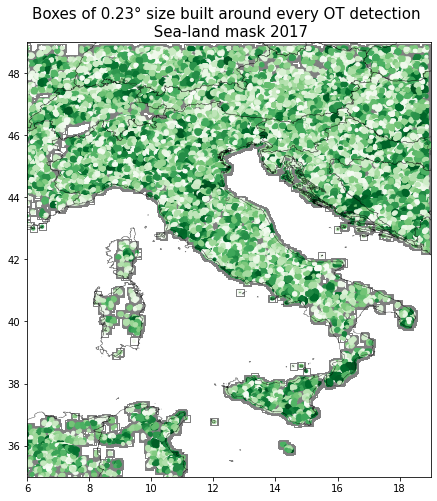

In [38]:
ax = filt_OTset_2017_land.plot(markersize=10, figsize=(12, 8), column='otpmax', cmap='Greens',zorder=2)

ax.set_ylim(y_lim)
ax.set_xlim(x_lim)
#plt.autoscale(False)

#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=3)

gpd.GeoDataFrame(filt_OTset_2017_land['geometry_25km_box'], columns=['geometry_25km_box']).rename(columns={'geometry_25km_box' : 'geometry'}).plot(ax=ax, facecolor="none", edgecolor='grey');
plt.title('Boxes of 0.23° size built around every OT detection \n Sea-land mask 2017', fontsize=15);


### - Validation with ESWD

In [32]:
#extract subset of days containing at least one OT
evdays_2018 = all_OTset_2018_land.time.dt.strftime('%Y-%m-%d').unique()
evdays_2018

array(['2018-04-04', '2018-04-05', '2018-04-09', '2018-04-10',
       '2018-04-11', '2018-04-12', '2018-04-13', '2018-04-14',
       '2018-04-15', '2018-04-16', '2018-04-17', '2018-04-18',
       '2018-04-19', '2018-04-20', '2018-04-23', '2018-04-24',
       '2018-04-25', '2018-04-26', '2018-04-27', '2018-04-28',
       '2018-04-29', '2018-04-30', '2018-05-01', '2018-05-02',
       '2018-05-03', '2018-05-04', '2018-05-05', '2018-05-06',
       '2018-05-07', '2018-05-08', '2018-05-09', '2018-05-10',
       '2018-05-11', '2018-05-12', '2018-05-13', '2018-05-14',
       '2018-05-15', '2018-05-16', '2018-05-17', '2018-05-18',
       '2018-05-19', '2018-05-20', '2018-05-21', '2018-05-22',
       '2018-05-23', '2018-05-24', '2018-05-25', '2018-05-26',
       '2018-05-27', '2018-05-28', '2018-05-29', '2018-05-30',
       '2018-05-31', '2018-06-01', '2018-06-02', '2018-06-03',
       '2018-06-04', '2018-06-05', '2018-06-06', '2018-06-07',
       '2018-06-08', '2018-06-09', '2018-06-10', '2018-

In [30]:
days_2018_df

,day,dtime
1,2018092,2018-04-02
2,2018093,2018-04-03
3,2018094,2018-04-04
4,2018095,2018-04-05
5,2018096,2018-04-06
...,...,...
209,2018300,2018-10-27
210,2018301,2018-10-28
211,2018302,2018-10-29
212,2018303,2018-10-30


#### - 2016

During 2016 a total number of 149 out of 211 days report at least 1 hailstorm-favouring OT over LAND in the filtered dataset (i.e. the **70.6%** of the days), compared to the 166 out of 211 days (78.7%) of the unfiltered (original) dataset over LAND

A total of **75** days with at least 1 **ESWD** report are reported in 2016, while the number of reports in 2016 is **437** 

#### - 2017

During 2017 a total number of 137 out of 213 days report at least 1 hailstorm-favouring OT over LAND in the filtered dataset (i.e. the **64.3%** of the days), compared to the 162 out of 213 days (76.1%) of the unfiltered (original) dataset over LAND

A total of **73** days with at least 1 **ESWD** report are reported in 2017, while the number of reports in 2017 is **480** 

A total of **72** days with at least 1 **UNIPOL** report are reported in 2017, while the number of reports in 2017 is **812**  (excluding 00utc!)

#### - 2018

During 2018 a total number of 182 out of 212 days report at least 1 hailstorm-favouring OT over LAND in the filtered dataset (i.e. the **85.8%** of the days), compared to the 193 out of 212 days (91.0%) of the unfiltered (original) dataset over LAND


A total of **80** (over 213) days with at least 1 **ESWD** report are reported in 2018, while the number of reports in 2017 is **479** 

A total of **199** days with at least 1 **UNIPOL** report are reported in 2018, while the number of reports in 2018 is **23420**  (excluding 00utc!)

#### - Analysis valid. ESWD for 2016 alone:

In [368]:
#define which set to consider for validation: filt_ or all_ 
OTset = filt_OTset_2016_land

In [369]:
eswd_HITTED = gpd.GeoDataFrame(columns=eswd.columns)
OTset_HITTING = gpd.GeoDataFrame(columns=OTset.columns)

#loop on OT detections
for OT_ind in OTset.index:
    
    OT = OTset[OTset.index == OT_ind]

    OTyear = int(OT.time.apply(lambda x: x.year))
    OTmonth = int(OT.time.apply(lambda x: x.month))
    OTday = int(OT.time.apply(lambda x: x.day))
    OThour = int(OT.time.apply(lambda x: x.hour))
    
    print(OT_ind)

    #select day before and above of OT timing
    OTtime_dAbove = pd.to_datetime(OT.time.item() + pd.to_timedelta(1, unit='d'))
    OTtime_dBefore = pd.to_datetime(OT.time.item() - pd.to_timedelta(1, unit='d'))
    OTtime_dAbove = OTtime_dAbove.replace(tzinfo=None)
    OTtime_dBefore = OTtime_dBefore.replace(tzinfo=None)

    #define eswd subset in the 3 days (before,present,and future) around OT timing: 
    #(this is done to make the loop more efficient!)
    """
    This step could be even more efficient by selecting directly only reports in a 1.5h temp window, for the moment
    lets try with +-1day and see if it is still too slow
    """
    eswd_subset = eswd_2016[(eswd_2016.datetime >= OTtime_dBefore) & (eswd_2016.datetime <= OTtime_dAbove)]
    
    #loop on eswd reports
    for eswd_ind in eswd_subset.index:

        #calculate time delta between OT and eswd report:
        tdelta = pd.Timedelta(abs(OT.time.values[0] - eswd_subset.datetime[eswd_subset.index == eswd_ind].values[0]))
        
        #condition: if difference between OT and report timing is smaller than (+-)1.5h keep the report
        if tdelta <= timedelta(minutes=90):
            
            #condition on spatial neighbourhood: if eswd report falls inside OT box:
            if eswd_subset.geometry[eswd_ind].within(OTset.geometry_25km_box[OT_ind]):

                print('Hit!')
                eswd_HITTED = eswd_HITTED.append(eswd_subset[eswd_subset.index == eswd_ind])

                OTset_HITTING = OTset_HITTING.append(OTset[OTset.index == OT_ind])
    
"""
ALLA FINE DI TUTTO BISOGNA RIPULARE I DATASET HITTED E HITTING DAI DOPPIONI!
"""

3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
277
278


1607
Hit!
Hit!
Hit!
Hit!
1608
Hit!
Hit!
Hit!
Hit!
1609
Hit!
Hit!
Hit!
Hit!
Hit!
1610
Hit!
Hit!
Hit!
Hit!
Hit!
1611
Hit!
1612
Hit!
Hit!
1613
Hit!
Hit!
1614
Hit!
Hit!
Hit!
1615
Hit!
Hit!
Hit!
1616
Hit!
1617
Hit!
1618
Hit!
1619
Hit!
1620
Hit!
1621
Hit!
1622
Hit!
1623
1624
1625
1626
1627
1628
1629
1630
1631
1632
1633
1634
Hit!
1635
Hit!
1636
1637
1638
1639
1640
1641
1642
1643
Hit!
Hit!
1644
Hit!
Hit!
1645
Hit!
1646
Hit!
1647
Hit!
1648
1649
1650
1651
1652
Hit!
1653
Hit!
1654
Hit!
Hit!
1655
1656
1657
1658
1659
1660
1661
1662
1663
1664
1665
1666
1667
1668
1669
1670
1671
1672
1673
1674
1675
1676
1677
1678
1679
1680
1681
1682
1683
1684
1685
1686
1687
1688
1689
1690
1691
1692
1693
1694
1695
1696
1697
1698
1699
Hit!
Hit!
Hit!
1700
Hit!
1701
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
1702
Hit!
Hit!
Hit!
Hit!
1703
Hit!
Hit!
1704
Hit!
Hit!
1705
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
1706
Hit!
Hit!
Hit!
Hit!
1707
Hit!
Hit!
1708
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
1709
Hit!
Hit!
Hit!
Hit!
Hit!
1710
Hit!
Hit!
Hit!
Hit!
1711


2738
2739
2740
2741
2742
2743
2744
2745
2746
2747
2748
2749
2750
2751
2752
2753
2754
2755
2756
2757
2758
2759
2760
2761
2762
2763
2764
2765
2766
2767
2768
2769
2770
2771
2772
2773
2774
2775
2776
2777
2778
2779
2780
2781
2782
Hit!
2783
Hit!
2784
2785
2786
2787
2788
2789
2790
2791
2792
2793
Hit!
2794
2795
2796
2797
2798
2799
2800
2801
2802
2803
2804
2805
2806
Hit!
Hit!
2807
Hit!
Hit!
Hit!
2808
Hit!
Hit!
Hit!
2809
2810
2811
2812
2813
2814
2815
2816
2817
2818
2819
2820
2821
2822
Hit!
Hit!
2823
Hit!
Hit!
2824
Hit!
Hit!
Hit!
2825
Hit!
Hit!
Hit!
2826
Hit!
Hit!
2827
2828
2829
2830
2831
2832
2833
2834
2835
2836
2837
2838
2839
Hit!
2840
Hit!
2841
Hit!
2842
2843
2844
2845
2846
2847
2848
2849
2850
Hit!
2851
Hit!
2852
Hit!
2853
2854
2855
2856
2857
2858
2859
2860
2861
2862
2863
2864
2865
2866
2867
2868
2869
2870
2871
2872
2873
2874
2875
2876
2877
2878
2879
2880
2881
2882
2883
2884
2885
2886
2887
2888
2889
2890
2891
2892
2893
2894
2895
2896
2897
2898
2899
2900
2901
2902
2903
2904
2905
2906
2907
2908


4203
4204
4205
4206
4207
4208
4209
4210
4211
4212
4213
4214
4215
4216
4217
4218
4219
4220
4221
4222
4223
4224
4225
4226
4227
4228
4229
4230
4231
4232
4233
4234
4235
4236
4237
4238
4239
4240
4241
4242
4243
4244
4245
4246
4247
4248
4249
4250
4251
4252
4253
4254
4255
4256
4257
4258
4259
4260
4261
4262
4263
4264
Hit!
4265
4266
4267
4268
4269
4270
4271
4272
4273
4274
4275
4276
4277
4278
4279
Hit!
4280
4281
4282
Hit!
4283
Hit!
4284
Hit!
4285
Hit!
4286
Hit!
4287
Hit!
4288
Hit!
4289
Hit!
4290
4291
4292
Hit!
4293
Hit!
4294
Hit!
4295
Hit!
4296
Hit!
4297
Hit!
4298
4299
4300
Hit!
4301
Hit!
4302
4303
4304
4305
4306
4307
4308
4309
4310
4311
4312
4313
4314
4315
4316
4317
4318
4319
4320
4321
4322
4323
4324
4325
Hit!
4326
4327
4328
4329
4330
4331
4332
4333
4334
4335
4336
4337
4338
4339
4340
4341
4342
4343
4344
4345
4346
4347
4348
4349
4350
4351
4352
4353
4354
4355
4356
4357
4358
4359
4360
4361
4362
4363
4364
4365
4366
4367
4368
4369
4370
4371
4372
4373
4374
4375
4376
4377
4378
4379
4380
4381
4382
4383


5817
5818
5819
5820
5821
5822
5823
5824
5825
5826
5827
5828
5829
5830
5831
5832
5833
5834
5835
5836
5837
5838
5839
5840
5841
5842
5843
5844
5845
5846
5847
5848
5849
5850
5851
5852
5853
5854
5855
5856
5857
5858
5859
5860
5861
5862
5863
5864
5865
5866
5892
5893
5894
5895
5896
5897
5898
5899
5900
5901
5902
5903
5904
5905
5906
5907
5908
5909
5910
5911
5912
5913
5914
5915
5916
5917
5918
5919
5920
5921
5922
5923
5924
5925
5926
5927
5928
5929
5930
5931
5932
5933
5934
5935
5936
5937
5938
5939
5940
5941
5942
5943
5944
5945
5946
5947
5948
5949
5950
5951
5952
5953
5954
5955
5956
5957
5958
5959
5960
5961
5962
5963
5964
5965
5966
5967
5968
5969
5970
5971
5972
5973
5974
5975
5976
5977
5978
5979
5980
5981
5982
5983
5984
5985
5986
5987
5988
5989
5990
5991
5992
5993
5994
6203
6204
6205
6206
6207
6208
6209
6210
6211
6212
6213
6214
6215
6216
6217
6218
6219
6220
6221
6222
6223
6224
6225
6226
6227
6228
6229
6230
6231
6232
6233
6234
6235
6236
6237
6238
6239
6240
6241
6242
6243
6244
6245
6246
6247
6248
6249


7725
7726
7727
7728
7729
7730
7731
7732
7733
7734
7735
7736
7737
7738
7739
7740
7741
7742
7743
7744
7745
7746
7747
7748
7749
7750
7751
7752
7753
7754
7755
7756
7757
7758
7759
7760
7761
7762
7763
7764
7765
7766
Hit!
7767
Hit!
7768
Hit!
7769
7770
7771
7772
7773
Hit!
7774
Hit!
7775
Hit!
7776
7777
7778
7779
7780
7781
Hit!
7782
Hit!
7783
Hit!
7784
7785
7786
7787
7788
Hit!
7789
Hit!
7790
Hit!
7791
7792
Hit!
7793
Hit!
7794
Hit!
7795
7796
7797
Hit!
7798
Hit!
7799
Hit!
7800
7801
7802
7803
7804
7805
7806
7807
7808
7809
7810
7811
7812
7813
7814
7815
7816
7817
7820
7821
7822
7823
7824
7825
7826
7827
7828
7829
7830
7836
7837
7838
7839
7840
7843
7877
7878
7881
7908
7909
7910
7914
7915
7916
7920
7921
7922
7925
7926
8023
8024
8028
8029
8030
8031
8032
8033
8034
8035
8036
8037
8042
8043
8044
8051
8052
8096
8097
8120
8121
8123
8124
8127
8130
8131
8132
8136
8137
8138
8143
8153
8154
8155
8156
8157
8159
8160
8161
8162
8163
8164
8165
8170
8171
8172
8173
8174
8175
8176
8187
8188
8189
8190
8200
8201
8202
8208


10470
10471
10472
10473
10474
10475
10476
10477
10478
10479
10480
10481
10482
10483
10484
10485
10486
10487
10488
10489
10490
10491
10492
10493
10494
10495
10496
10497
10498
10499
10500
10501
10502
10503
10616
10617
10618
10619
10620
10621
10622
10623
10624
10625
10626
10627
10628
10629
10630
10631
10632
10633
10634
10635
10636
10637
10638
10639
10640
10641
10642
10643
10644
10645
10646
10647
10648
10649
10650
10651
10652
10653
10654
10655
10656
10657
10658
10659
10660
10665
10666
10670
10671
10672
10673
10674
10680
10681
10682
10683
10684
10691
10692
10693
10694
10695
10696
10697
10698
10699
10700
10701
10702
10703
10704
10705
10706
10707
10708
10709
10710
10711
10712
10713
10714
10715
10716
10717
10718
10719
10720
10721
10722
10723
10724
10725
10726
10727
10728
10729
10730
10731
10732
10733
10734
10735
10736
10737
10738
10739
10740
10741
10742
10743
10744
10745
10746
10747
10748
10749
10750
10751
10752
10753
10754
10755
10756
10757
10758
10759
10760
10761
10762
10763
10764
10765
1076

12510
12511
12512
12513
12514
12515
12516
12517
12518
12519
12520
12521
12522
12523
12524
12525
12526
12527
12528
12529
12530
12531
12532
12533
12534
12535
12536
12537
12538
12539
12540
12541
12542
12543
12544
12545
12546
12547
12550
12551
12552
12556
12557
12558
12564
12587
12588
12589
12590
12591
12592
12593
12594
12595
12596
12597
12598
12599
12600
12601
12602
12603
12604
12605
12606
12607
12608
12609
12610
12611
12612
12613
12614
12615
12616
12617
12618
12619
12620
12621
12622
12623
12624
12625
12626
12627
12628
12629
12630
12631
12632
12633
12634
12635
12636
12637
12638
12639
12640
12641
12642
12643
12644
12645
12646
12647
12648
12649
12650
12651
12652
12653
12654
12655
12656
12657
12658
12659
12660
12661
12662
12663
12664
12665
12666
12667
12668
12669
12670
12671
12672
12673
12674
12675
12676
12677
12678
12679
12680
12681
12682
12683
12684
12685
12686
12687
12688
12689
12690
12691
12692
12693
12694
12695
12696
12697
12698
12699
12700
12701
12702
12703
12704
12705
12706
12707
1270

13965
13966
13967
13968
13969
13970
13971
13972
13973
13974
13975
13976
13977
13978
13979
13980
13981
13982
13983
13984
13985
13990
13991
13992
13993
13994
13995
13996
13997
13998
13999
14000
14001
14002
14003
14004
14005
14006
14007
14008
14009
14010
14011
14012
14013
14014
14015
14016
14017
14018
14019
14020
14021
14022
14023
14024
14025
14026
14027
14028
14029
14030
14031
14032
14033
14034
14035
14036
14037
14038
14039
14040
14041
14042
14043
14044
14045
14046
14047
14048
14049
14050
14051
14052
14053
14054
14055
14056
14057
14058
14059
14060
14061
14062
14063
14064
14065
14066
14067
14068
14069
14070
14071
14072
14073
14074
14075
14076
14077
14078
14079
14080
14081
14082
14083
14084
14085
14086
14087
14088
14089
14090
14091
14092
14093
14094
14095
14096
14097
14098
14099
14100
14101
14102
14103
14104
14105
14106
14107
14108
14109
14110
14111
14112
14113
14114
14115
14116
14117
14118
14119
14120
14121
14122
14123
14124
14125
14126
14127
14128
14129
14130
14131
14132
14133
14134
1413

15850
15851
15852
15853
15855
15857
15858
15863
15865
15879
15908
15938
15940
15941
15943
15944
15945
15946
15947
15948
15949
15950
15951
15952
15953
15954
15955
15956
15957
15958
15959
15960
15961
15962
15963
15964
15965
15966
15982
15983
15984
15985
15986
15987
15988
15989
15990
15991
15992
15993
15994
15995
15996
15997
15998
16023
16024
16025
16026
16027
16028
16029
16030
16031
16032
16033
16034
16035
16036
16037
16038
16039
16040
16041
16042
16043
16044
16045
16046
16047
16048
16049
16050
16051
16052
16053
16054
16055
16056
16057
16058
16059
16062
16063
16076
16077
16078
16079
16080
16081
16082
16083
16084
16085
16086
16087
16088
16089
16090
16093
16094
16095
16096
16097
16098
16099
16100
16101
16102
16103
16104
16105
16113
16114
16115
16116
16117
16118
16119
16120
16121
16122
16123
16124
16125
16126
16127
16128
16129
16130
16131
16132
16133
16134
16135
16136
16137
16138
16139
16140
16148
16167
16168
16169
16225
16228
16229
16230
16231
16232
16233
16234
16235
16236
16237
16238
1623

19272
19273
19274
19275
19282
19283
19284
19285
19286
19287
19288
19289
19290
19291
19292
19293
19294
19295
19309
19310
19311
19312
19313
19314
19315
19316
19317
19318
19319
19320
19321
19335
19336
19337
19338
19339
19340
19341
19342
19343
19356
19357
19358
19359
19360
19361
19374
19375
19414
19420
19421
19422
19425
19426
19427
19428
19429
19430
19431
19432
19433
19434
19435
19436
19437
19438
19439
19440
19441
19442
19443
19444
19445
19446
19447
19448
19449
19450
19451
19452
19453
19454
19513
19514
19515
19516
19517
19518
19519
19520
19528
19529
19530
19531
19532
19533
19534
19535
19536
19537
19547
19548
19549
19550
19551
19552
19553
19554
19555
19556
19557
19558
19559
19560
19561
19573
19574
19575
19576
19577
19578
19579
19580
19581
19582
19591
19592
19593
19594
19602
19603
19604
19605
19606
19607
19608
19609
19610
19611
19612
19613
19614
19615
19616
19617
19618
19619
19620
19621
19622
19623
19624
19625
19626
19627
19628
19629
19630
19631
19632
19633
19634
19635
19636
19637
19638
1963

23700
23701
23702
23703
23704
23705
23706
23707
23708
23709
23710
23711
23712
23713
23714
23715
23716
23717
23718
23719
23720
23721
23722
23723
23724
23725
23726
23727
23728
23729
23730
23731
23732
23733
23734
23735
23736
23737
23738
23739
23740
23741
23742
23743
23744
23745
23746
23747
23748
23749
23750
23751
23752
23753
23754
23755
23756
23757
23758
23759
23760
23761
23762
23763
23764
23765
23768
23769
23770
23771
23772
23773
23774
23775
23776
23777
23778
23779
23780
23781
23782
23783
23784
23785
23786
23815
23816
23817
23818
23819
23820
23821
23822
23823
23824
23825
23826
23827
23828
23837
23838
23839
23840
23841
23842
23843
23844
23845
23846
23847
23848
23849
23850
23851
23852
23853
23854
23855
23856
23857
23858
23859
23860
23861
23862
23863
23864
23865
23866
23867
23868
23869
23870
23871
23872
23873
23874
23875
23876
23877
23878
23879
23880
23881
23882
23883
23884
23885
23886
23887
23888
23889
23890
23891
23892
23893
23894
23895
23896
23897
23898
23899
23900
23901
23902
23903
2390

25007
25008
25009
25010
25011
25012
25013
25014
25015
25016
25017
25018
25019
25020
25021
25022
25023
25024
25025
25026
25027
25028
25029
25030
25031
25032
25033
25034
25035
25036
25037
25038
25039
25040
25041
25042
25043
25044
25045
25046
25047
25048
25049
25050
25051
25052
25053
25054
25055
25056
25057
25058
25059
25060
25061
25062
25063
25064
25065
25066
25067
25068
25069
25070
25071
25072
25073
25074
25075
25076
25077
25078
25079
25080
25081
25082
25083
25084
25085
25086
25087
25088
25089
25090
25091
25092
25093
25094
25095
25096
25097
25098
25099
25100
25101
25102
25103
25104
25105
25106
25107
25108
25109
25110
25111
25112
25113
25114
25115
25116
25117
25118
25119
25120
25121
25122
25123
25124
25125
25126
25127
25128
25129
25130
25131
25132
25133
25134
25135
25136
25137
25138
25139
25140
25141
25142
25143
25144
25145
25146
25147
25148
25149
25150
25151
25152
25153
25154
25155
25156
25157
25158
25159
25160
25161
25162
25163
25164
25165
25166
25167
25168
25169
25170
25171
25172
2517

26296
26297
26298
26299
26300
26301
26302
26303
26304
26305
26306
26307
26308
26309
26310
26311
26312
26313
26314
26315
26316
26317
26318
26319
26320
26321
26322
26323
26324
26325
26326
26327
26328
26329
26330
26331
26332
26333
26334
26335
26336
26337
26338
26339
26340
26341
26342
26343
26344
26345
26346
26347
26348
26349
26350
26351
26352
26353
26354
26355
26356
26357
26358
26359
26360
26361
26362
26363
26364
26365
26366
26367
26368
26369
26370
26371
26372
26373
26374
26375
26376
26377
26378
26379
26380
26381
26382
26383
26384
26385
26386
26387
26388
26389
26390
26391
26392
26393
26394
26395
26396
26397
26398
26399
26400
26401
26402
26403
26404
26405
26406
26407
26408
26409
26410
26411
26412
26413
26414
26415
26416
26417
26418
26419
26420
26421
26422
26423
26424
26425
26426
26427
26428
26429
26430
26431
26432
26433
26434
26435
26436
26437
26438
26439
26440
26441
26442
26443
26444
26445
26446
26447
26448
26449
26450
26451
26452
26453
26454
26455
26456
26457
26458
26459
26460
26461
2646

27675
27676
27677
27678
27679
27680
27681
27682
27683
27684
27685
27686
27687
27688
27689
27690
27691
27692
27693
27694
27695
27696
27697
27698
27699
27700
27701
27702
27703
27704
27705
27706
27707
27708
27709
27710
27711
27712
27713
27714
27715
27716
27717
27718
27719
27720
27721
27722
27723
27724
27725
27726
27727
27728
27729
27730
27731
27732
27733
27734
27735
27736
27737
27738
27739
27740
27741
27742
27743
27744
27745
27746
27747
27748
27749
27750
27751
27752
27753
27754
27755
27756
27758
27759
27760
27761
27762
27763
27764
27765
27766
27767
27768
27769
27770
27771
27772
27773
27774
27775
27776
27777
27778
27779
27780
27781
27782
27783
27784
27785
27786
27787
27788
27789
27790
27791
27792
27793
27794
27795
27796
27797
27798
27799
27800
27801
27802
27803
27804
27805
27806
27807
27808
27809
27810
27811
27812
27813
27814
27815
27816
27817
27818
27819
27820
27821
27822
27823
27824
27825
27826
27827
27828
27829
27830
27831
27832
27833
27834
27835
27836
27837
27838
27839
27840
27841
2784

29033
29034
29035
29036
29037
29038
29039
29040
29041
29042
29043
29044
29045
29046
29047
29048
29049
29050
29051
29052
29053
29054
29055
29056
29057
29058
29059
29060
29061
29062
29063
29064
29065
29066
29067
29068
29069
29070
29071
29072
29073
29074
29075
29076
29077
29078
29079
29080
29081
29082
29083
29084
29085
29086
29087
29088
29089
29090
29091
29092
29093
29094
29095
29096
29097
29098
29099
29100
29101
29102
29103
29104
29105
29106
29107
29108
29109
29110
29111
29112
29113
29114
29115
29116
29117
29118
29119
29120
29121
29122
29123
29124
29125
29126
29127
29128
29129
29130
29131
29132
29133
29134
29135
29136
29137
29138
29139
29140
29141
29142
29143
29144
29145
29146
29147
29148
29149
29150
29151
29152
29153
29154
29155
29156
29157
29158
29159
29160
29161
29162
29163
29164
29165
29166
29167
29168
29169
29170
29171
29172
29173
29174
29175
29176
29177
29178
29179
29180
29181
29182
29183
29184
29185
29186
29187
29188
29189
29190
29191
29192
29193
29194
29195
29196
29197
29198
2919

30486
30487
30488
30489
30490
Hit!
Hit!
30491
Hit!
30492
30493
30494
30495
30496
30497
30498
30499
30500
30501
Hit!
Hit!
30502
Hit!
Hit!
30503
Hit!
Hit!
30504
30505
30506
30507
30508
30509
30510
30511
30512
30513
30514
30515
Hit!
Hit!
30516
Hit!
Hit!
30517
Hit!
Hit!
30518
Hit!
Hit!
30519
30520
30521
30522
30523
30524
30525
30526
30527
30528
Hit!
Hit!
30529
Hit!
Hit!
30530
Hit!
Hit!
30531
Hit!
Hit!
30532
Hit!
Hit!
30533
Hit!
Hit!
30534
Hit!
30535
30536
30537
30538
30539
30540
30541
Hit!
Hit!
30542
Hit!
Hit!
30543
Hit!
Hit!
30544
Hit!
Hit!
30545
Hit!
Hit!
30546
30547
30548
30549
30550
30551
Hit!
Hit!
30552
Hit!
Hit!
30553
Hit!
Hit!
30554
Hit!
Hit!
30555
Hit!
Hit!
30556
30557
30558
30559
30560
30561
30562
30563
30564
30565
30566
30567
30568
30569
30570
30571
30572
30573
30574
30575
30576
30577
30578
30579
30580
30581
30582
30583
30584
30585
30586
30587
30588
30589
30590
30591
30592
30593
30594
30595
30596
30597
30598
30599
30600
30601
30602
30603
30604
30605
30606
30607
30608
30609
30610


31838
31839
31840
31841
31842
31843
31844
31845
31846
31847
31848
31849
31850
31851
31852
31853
31854
31855
31856
31857
31858
31859
31860
31861
31862
31863
31864
31865
31866
31867
31868
31869
31870
31871
31872
31873
31874
31875
31876
31877
31878
31879
31880
31881
31888
31889
31890
31891
31892
31893
31894
31895
31896
31897
31898
31899
31900
31901
31902
31903
31904
31905
31906
31907
31908
31909
31910
31911
31912
31913
31914
31915
31916
31917
31918
31919
31920
31921
31922
31923
31924
31925
31926
31927
31928
31929
31930
31931
31932
31933
31934
31935
31936
31937
31938
31939
31940
31941
31942
31943
31944
31945
31946
31947
31948
31951
31952
31953
31954
31957
31958
31959
31960
31961
31964
31965
31967
31968
31969
31970
31972
31974
31975
31976
31977
31978
31979
31980
31981
31982
31983
31987
31988
31994
31995
31996
31997
31998
31999
32000
32001
32002
32003
32004
32005
32006
32007
32008
32009
32010
32011
32012
32013
32014
32015
32016
32017
32018
32019
32020
32021
32022
32023
32024
32025
32026
3202

33061
Hit!
33062
Hit!
33063
Hit!
33064
33065
33066
33067
33068
33069
33070
33071
33072
Hit!
33073
Hit!
Hit!
33074
Hit!
Hit!
33075
Hit!
Hit!
33076
Hit!
Hit!
33077
Hit!
Hit!
33078
Hit!
33079
Hit!
33080
Hit!
33081
Hit!
33082
Hit!
33083
33084
33085
33086
33087
33088
33089
33090
Hit!
Hit!
33091
Hit!
Hit!
33092
Hit!
Hit!
33093
Hit!
Hit!
33094
Hit!
Hit!
33095
33096
33097
33098
33099
33100
33101
33102
33103
33104
33105
33106
33107
33108
33109
33110
33111
33112
33113
33114
33115
33116
33117
33118
33119
33120
33121
33122
33123
33124
33125
33126
33127
33128
33129
33130
33131
33132
33133
33134
33135
33136
33137
33138
33139
33140
33141
33142
33143
33144
33145
33146
33147
33148
33149
33150
33151
33152
33153
33154
33155
33156
33157
33158
33159
33160
33161
33162
33163
33164
33165
33166
33167
33168
33169
33170
33171
33172
33173
33174
33175
33176
33177
33178
33179
33180
33181
33182
33183
33184
33185
33186
33187
33188
33189
33190
33191
33192
33193
33194
33195
33196
33197
33198
33199
33200
33201
33202
332

34450
34451
34452
34453
34454
34455
34456
34457
34458
34459
34460
34461
34462
34463
34464
34465
34466
34467
34468
34469
34470
34471
34472
34473
34474
34475
34476
34477
34478
34479
34480
34481
34482
34483
34484
Hit!
Hit!
34485
Hit!
Hit!
34486
Hit!
Hit!
34487
Hit!
34488
Hit!
Hit!
34489
Hit!
Hit!
34490
Hit!
Hit!
34491
Hit!
Hit!
34492
Hit!
34493
Hit!
34494
Hit!
Hit!
34495
Hit!
Hit!
34496
Hit!
Hit!
34497
Hit!
34498
Hit!
34499
Hit!
Hit!
34500
Hit!
Hit!
34501
Hit!
Hit!
34502
Hit!
34503
34504
34505
34506
34507
34508
34509
34510
34511
34512
34532
34533
34534
34535
34536
34537
34538
34539
34540
34541
34542
34543
34544
34545
34546
34547
34548
34549
34550
34551
34552
34553
34554
34555
34556
34557
34558
34559
34560
34561
34562
34563
34564
34565
34566
34567
34568
34569
34570
34571
34572
34573
34574
34575
34576
34577
34578
34579
34580
34581
34582
34583
34584
34585
34586
34587
34588
34589
34590
34591
34592
34593
34594
34595
34596
34597
34598
34599
34600
34601
34602
34603
34604
34605
34606
34607
34608


35814
35815
35816
35817
35818
35819
35820
35821
35822
35823
35824
35825
35826
35827
35828
35829
35830
35831
35832
35833
35834
35835
35836
35837
35838
35839
35840
35841
35842
35843
35844
35845
35846
35847
35848
35849
35850
35851
35852
35853
35854
35855
35856
35857
35858
35859
35860
35861
35862
35863
35864
35865
35866
35867
35868
35869
35870
35871
35872
35873
35874
35875
35876
35877
35878
35879
35880
35881
35882
35883
35884
35885
35886
35887
35888
35889
35890
35891
35892
35893
35894
35895
35896
35897
35898
35899
35900
35901
35902
35903
35904
35905
35906
35907
35908
35909
35910
35911
35912
35913
35914
35915
35916
35917
35918
35919
35920
35921
35922
35923
35924
35925
35926
35927
35928
35929
35930
35931
35932
35933
35934
35935
35936
35937
35938
35939
35940
35941
35942
35943
35944
35945
35946
35947
35948
35949
35950
35951
35952
35953
35954
35955
35956
35957
35958
35959
35960
35961
35962
35963
35964
35965
35966
35967
35968
35969
35970
35971
35972
35973
35974
35975
35976
35977
35978
35979
3598

37153
37154
37155
37156
Hit!
37157
Hit!
37158
Hit!
37159
37160
37161
37162
37163
37164
Hit!
37165
37166
37167
37168
37169
37170
37171
37172
37173
37174
37175
37176
37177
37178
37179
37180
37181
37182
37183
37184
37185
37186
37187
37188
37189
37190
37191
37192
37193
37194
37195
37196
37197
37198
37199
37200
37201
37202
37203
37204
37205
37206
37207
37208
37209
37210
37211
37212
37213
37214
37215
37216
37217
37218
37219
37220
37221
37222
37223
37224
37225
37226
37227
37228
37229
37230
37231
37232
37233
37234
37235
37236
37237
37238
37239
37240
37241
37242
37243
37244
37245
37246
37247
37248
37249
37250
37251
37252
37253
37254
37255
37256
37257
37258
37259
37260
37261
37262
37263
37264
37265
37266
37267
37268
37269
37270
37271
37272
37273
37274
37275
37276
37277
37278
37279
37280
37281
37282
37283
37284
37285
37286
37287
37288
37289
37290
37291
37292
37293
37294
37295
37296
37297
37298
37299
37300
37301
37302
37303
37304
37305
37306
37307
37308
Hit!
Hit!
37309
Hit!
Hit!
37310
Hit!
37311
H

38417
38418
38419
38420
38421
38422
38423
38424
38425
38426
38427
38428
38429
38430
38431
38432
38433
38434
38435
38436
38437
38438
38439
38440
38441
38442
38443
38444
38445
38446
38447
38448
38449
38450
38451
38452
38453
38454
38455
38456
38457
38458
38459
38460
38461
38462
38463
38464
38465
38466
38467
38468
38469
38470
38471
38472
38473
38474
38475
38476
38477
38478
38479
38480
38481
38482
38483
38484
38485
38486
38487
38488
38489
38490
38491
38492
38493
38494
38495
38496
38497
38498
38499
38500
38501
38502
38503
38504
38505
38506
38507
38508
38509
38510
38511
38512
Hit!
38513
38514
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
38515
Hit!
Hit!
Hit!
38516
Hit!
Hit!
38517
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
38518
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
38519
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
38520
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
38521
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
38522
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
38523
Hit!
Hit!
Hit!
Hit

39663
39664
39665
39666
39667
39668
39669
39670
39671
39672
39673
39674
39675
39676
39677
39678
39679
39680
39681
39682
39683
39684
39685
39686
39687
39688
39689
39690
39691
39692
39693
39694
39695
39696
39697
39698
39699
39700
39701
39702
39703
39704
39705
39706
39707
39708
39709
39710
39711
39712
39713
39714
39715
39716
39717
39718
39719
39720
39721
39722
39723
39724
39725
39726
39727
39728
39729
39730
39731
39732
39733
39734
39735
39736
39737
39738
39739
39740
39741
39742
39743
39744
39745
39746
39747
39748
39749
39750
39751
39752
39753
39754
39755
39756
39757
39758
39759
39760
39761
39762
39763
39764
39765
39766
39767
39768
39769
39770
39771
39772
39773
39774
39775
39776
39777
39778
39779
39780
39781
39782
39783
39784
39785
39786
39787
39788
39789
39790
39791
39792
39793
39794
39795
39796
39797
39798
39799
39800
39801
39802
39803
39804
39805
39806
39807
39808
39809
39810
39811
39812
39813
39814
39815
39816
39817
39818
39819
39820
39821
39822
39823
39824
39825
39826
39827
39828
3982

Hit!
Hit!
40866
40867
40868
40869
40870
40871
40872
40873
40874
40875
40876
40877
40878
40879
40880
40881
40882
40883
40884
40885
40886
40887
40888
40889
40890
40891
40892
40893
40894
40895
40896
40897
40898
40899
40900
40901
40902
40903
40904
40905
40906
40907
40908
40909
40910
40911
40912
40913
40914
40915
40916
40917
40918
40919
40920
40921
40922
40923
40924
Hit!
40925
Hit!
40926
Hit!
40927
Hit!
40928
40929
40930
40931
40932
40933
40934
40935
40936
40937
40938
40939
40940
40941
40942
40943
40944
40945
40946
40947
Hit!
40948
Hit!
40949
Hit!
40950
Hit!
40951
Hit!
40952
40953
40954
40955
40956
40957
40958
40959
40960
40961
40962
40963
40964
40965
40966
40967
40968
40969
40970
40971
40972
40973
40974
40975
40976
40977
40978
40979
40980
40981
40982
40983
40984
40985
40986
40987
40988
40989
40990
40991
40992
40993
40994
40995
40996
40997
40998
40999
41000
41001
41002
41003
41004
41005
41006
41007
41008
41009
41010
41011
41012
41013
41014
41015
41016
41017
41018
41019
41020
41021
41022
410

Hit!
42232
Hit!
Hit!
42233
Hit!
42234
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
42235
Hit!
Hit!
Hit!
Hit!
42236
Hit!
Hit!
Hit!
42237
Hit!
Hit!
42238
Hit!
42239
42240
42241
42242
42243
42244
Hit!
Hit!
Hit!
42245
Hit!
Hit!
42246
Hit!
42247
42248
42249
42250
42251
42252
42253
42254
42255
42256
42257
42258
42259
42260
42261
42262
42263
42264
42265
42266
42267
42268
42269
42270
42271
42272
42273
42274
42275
42276
42277
42278
42279
42280
42281
42282
42283
42284
42285
42286
42287
42288
42289
42290
42291
42292
42293
42294
42295
42296
42297
42298
42299
42300
42301
42302
42303
42304
42305
42306
42307
42308
42309
42310
42311
42312
42313
42314
42315
42316
42317
42318
42319
42320
42321
42322
42323
42324
42325
42326
42327
42328
42329
42330
42331
42332
42333
42334
42335
42336
42337
42338
42339
42340
42341
42342
42343
42344
42345
42346
42347
42348
42349
42350
42351
42352
42353
42354
42355
42356
42357
42358
42359
42360
42361
42362
42363
42364
42365
42366
42367
42368
42369
42370
42371
42372
42373
42374
42375
42376


43684
43685
43686
43687
43688
43689
43690
43691
43696
43697
43698
43699
43701
43703
43704
43705
43709
43710
43713
43716
43719
43720
43723
43724
43731
43735
43736
43745
43757
43798
43799
43800
43801
43802
43803
43804
43805
43806
43807
43808
43809
43810
43811
43812
43813
43814
43815
43816
43817
43818
43819
43820
43821
43822
43823
43824
43825
43826
43827
43828
43829
43830
43831
43832
43833
43834
43835
43836
43837
43838
43839
43840
43841
43842
43843
43844
43845
43846
43847
43848
43849
43850
43851
43852
43853
43854
43855
43856
43857
43858
43859
43860
43861
43862
43863
43864
43865
43866
43867
43868
43869
43870
43871
43872
43873
43874
43875
43876
43877
43878
43879
43880
43881
43882
43883
43884
43885
43886
43887
43888
43889
43890
43891
43892
43893
43894
43895
43896
43897
43898
43899
43900
43901
43902
43903
43904
43905
43906
43907
43908
43909
43910
43911
43912
43913
43914
43915
43916
43917
43918
43919
43920
43921
43922
43923
43924
43925
43926
43927
43928
43929
43930
43931
43932
43933
43934
4393

46219
46220
46221
46222
46223
46224
46225
46226
46227
46228
46229
46230
46231
46232
46233
46234
46235
46236
46237
46238
46239
46240
46241
46242
46243
46244
46245
46246
46247
46248
46249
46250
46251
46252
46253
46254
46255
46256
46257
46258
46259
46260
46261
46262
46263
46264
46265
46266
46267
46268
46269
46270
46271
46272
46273
46274
46275
46276
46277
46278
46279
46280
46281
46282
46283
46284
46285
46286
46287
46288
46289
46290
46291
46292
46293
46294
46295
46296
46297
46298
46299
46300
46301
46302
46303
Hit!
Hit!
46304
Hit!
Hit!
46305
46306
46307
46308
46309
46310
46311
46312
Hit!
Hit!
46313
Hit!
Hit!
46314
46315
46316
46317
46318
46319
Hit!
Hit!
46320
46321
46322
46323
46324
46325
46326
46327
46328
46329
46330
46331
46332
46333
46334
46335
46336
46337
46338
46339
46340
46341
46342
46343
46344
46345
46346
46347
46348
46349
46350
46351
46352
46353
46354
46355
46356
46357
46358
46359
46360
46361
46362
46363
46364
46365
46366
46367
46368
46369
46370
46371
46372
46373
46374
46375
46376
46

47579
47580
47581
47582
47583
47584
47585
47586
47587
47588
47589
47590
47591
47592
47593
47594
47595
47596
47597
47598
47599
47600
47601
47602
47603
47604
47605
47606
47607
47608
47609
47610
47611
47612
47613
47614
47615
47616
47617
47618
47619
47620
47621
47622
47623
47624
47625
47626
47627
47628
47629
47630
47631
47632
47633
47634
47635
47636
47637
47638
47639
47640
47641
47642
47643
47644
47645
47646
47647
47648
47649
47650
47651
47652
47653
47654
47655
47656
47657
47658
47659
47660
47661
47662
47663
47664
47665
47666
47667
47668
47669
47670
47671
47672
47673
47674
47675
47676
47677
47678
47679
47680
47681
47682
47683
47684
47685
47686
47687
47688
47689
47690
47691
47692
47693
47694
47695
47696
47697
47698
47699
47700
47701
47702
47703
47704
47705
47706
47707
47708
47709
47710
47711
47712
47713
47714
47715
47716
47717
47718
47719
47720
47721
47722
47723
47724
47725
47726
47727
47728
47729
47730
47731
47732
47733
47734
47735
47736
47737
47738
47739
47740
47741
47742
47743
47744
4774

48938
48939
48940
48941
48942
48943
48944
48945
48946
48947
48948
48949
48950
48951
48952
48953
48954
48955
48956
48957
48958
48959
48960
48961
48962
48963
48964
48965
48966
48967
48968
48969
48970
48971
48972
48973
48974
48975
48976
48977
48978
48979
48980
48981
48982
48983
48984
48985
48986
48987
48988
48989
48990
48991
48992
48993
48994
48995
48996
48997
48998
48999
49000
49001
49002
49003
49004
49005
49006
49007
49008
49009
49010
49011
49012
49013
49014
49015
49016
49017
49018
49019
49020
49021
49022
49023
49024
49025
49026
49027
49028
49029
49030
49031
49032
49033
49034
49035
49036
49037
49038
49039
49040
49041
49042
49043
49044
49045
49046
49047
49048
49049
49050
49051
49052
49053
49054
49055
49056
49057
49058
49059
49060
49061
49062
49063
49064
49065
49066
49067
49068
49069
49070
49071
49072
49073
49074
49075
49076
49077
49078
49079
49080
49081
49082
49083
49084
49085
49086
49087
49088
49089
49090
49091
49092
49093
49094
49095
49096
49097
49098
49099
49100
49101
49102
49103
4910

50362
50363
50364
50365
50366
50367
50368
50369
50370
50371
50372
50373
50374
50375
50376
50377
50378
50379
50380
50381
50382
50383
50384
50385
50386
50387
50388
50389
50390
50391
50392
50393
50394
50395
50396
50397
50398
50399
50400
50401
50402
50403
50404
50405
50406
50407
50408
50409
50410
50411
50412
50413
50414
50415
50416
50417
50418
50419
50420
50421
50422
50423
50424
50425
50426
50427
50428
50429
50430
50431
50432
50433
50434
50435
50436
50437
50438
50439
50440
50441
50442
50443
50444
50445
50446
50447
50448
50449
50450
50451
50452
50453
50454
50455
50456
50457
50458
50459
50460
50461
50462
50463
50464
50465
50466
50467
50468
50469
50470
50471
50472
50473
50474
50475
50476
50477
50478
50479
50480
50481
50482
50483
50484
50485
50486
50487
50488
50489
50490
50491
50492
50493
50494
50495
50496
50497
50498
50499
50500
50501
50502
50503
50504
50505
50506
50507
50508
50509
50510
50511
50512
50513
50514
50515
50516
50517
50518
50519
50520
50521
50522
50523
50524
50525
50526
50527
5052

52109
52110
52111
52112
52113
52114
52115
52116
52117
52118
52119
52120
52121
52122
52123
52124
52125
52126
52127
52128
52129
52130
52131
52132
52133
52134
52135
52136
52137
52138
52139
52140
52141
52142
52143
52144
52145
52146
52147
52148
52149
52150
52151
52152
52153
52154
52155
52156
52157
52158
52159
52160
52161
52162
52163
52164
52165
52166
52167
52168
52169
52170
52171
52172
52173
52174
52175
52176
52177
52178
52179
52180
52181
52182
52183
52184
52185
52186
52187
52188
52189
52190
52191
52192
52193
52194
52195
52196
52197
52198
52199
52200
52201
52202
52203
52204
52205
52206
52207
52208
52209
52210
52211
52212
52213
52214
52215
52216
52217
52218
52219
52220
52221
52222
52223
52224
52225
52226
52227
52228
52229
52230
52231
52232
52233
52234
52235
52236
52237
52238
52239
52240
52241
52242
52243
52244
52245
52246
52247
52248
52249
52250
52251
52252
52253
52254
52255
52256
52257
52258
52259
52260
52261
52262
52263
52264
52265
52266
52267
52268
52269
52270
52271
52272
52273
52274
5227

53494
53495
53496
53497
53498
53499
53500
53501
53502
53503
53504
53505
53506
53507
53508
53509
53510
53511
53512
53513
53514
53515
53516
53517
53518
53519
53520
53521
53522
53523
53524
53525
53526
53527
53528
53529
53530
53531
53532
53533
53534
53535
53536
53537
53538
53539
53540
53541
53542
53543
53544
53545
53546
53547
53548
53549
53550
53551
53552
53553
53554
53555
53556
53557
53558
53559
53560
53561
53562
53563
53564
53565
53566
53567
53568
53569
53570
53571
53572
53573
53574
53575
53576
53577
53578
53579
53580
53581
53582
53583
53584
53585
53586
53587
53588
53589
53590
53591
53592
53593
53594
53595
53596
53597
53598
53599
53600
53601
53602
53603
53604
53605
53606
53607
53608
53609
53610
53611
53612
53613
53614
53615
53616
53617
53618
53619
53620
53621
53622
53623
53624
53625
53626
53627
53628
53629
53630
53631
53632
53633
53634
53635
53636
53637
53638
53639
53640
53641
53642
53643
53644
53645
53646
53647
53648
53649
53650
53651
53652
53653
53654
53655
53656
53657
53658
53659
5366

54867
54868
54869
54870
54871
54872
54873
54874
54875
54876
54877
54878
54879
54880
54881
54882
54883
54884
54885
54886
54887
54888
54889
54890
54891
54892
54893
54894
54895
54896
54897
54898
54899
54900
54901
54902
54903
54904
54905
54906
54907
54908
54909
54910
54911
54912
54913
54914
54915
54916
54917
54918
54919
54920
54921
54922
54923
54924
54925
54926
54927
54928
54929
54930
54931
54932
54933
54934
54935
54936
54937
54938
54939
54940
54941
54942
54943
54944
54945
54946
54947
54948
54949
54950
54951
54952
54953
54954
54955
54956
54957
54958
54959
54960
54961
54962
54963
54964
54965
54966
54967
54968
54969
54970
54971
54972
54973
54974
54975
54976
54977
54978
54979
54980
54981
54982
54983
54984
54985
54986
54987
54988
54989
54990
54991
54992
54993
54994
54995
54996
54997
54998
54999
55000
55001
55002
55003
55004
55005
55006
55007
55008
55009
55010
55011
55012
55013
55014
55015
55016
55017
55018
55019
55020
55021
55022
55023
55024
55025
55026
55027
55028
55029
55030
55031
55032
5503

56255
56256
56257
56258
56259
56260
56261
56262
56263
56264
56265
56266
56267
56268
56269
56270
56271
56272
56273
56274
56275
56276
56277
56278
56279
56280
56281
56282
56283
56284
56285
56286
56287
56288
56289
56290
56291
56292
56293
56294
56295
56296
56297
56298
56299
56300
56301
56302
56303
56304
56305
56306
56307
56308
56309
56310
56311
56312
56313
56314
56315
56316
56317
56318
56319
56320
56321
56322
56323
56324
56325
56326
56327
56328
56329
56330
56331
56332
56333
56334
56335
56336
56337
56338
56339
56340
56341
56342
56343
56344
56345
56346
Hit!
56347
Hit!
56348
Hit!
Hit!
56349
Hit!
56350
Hit!
Hit!
Hit!
56351
Hit!
Hit!
Hit!
Hit!
56352
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
56353
Hit!
Hit!
Hit!
56354
Hit!
Hit!
Hit!
56355
Hit!
Hit!
Hit!
Hit!
Hit!
56356
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
56357
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
56358
Hit!
Hit!
Hit!
56359
Hit!
Hit!
Hit!
Hit!
Hit!
56360
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
56361
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
56362
Hit!
Hit!
Hi

57234
57235
57236
57237
57238
57239
57240
57241
57242
57243
57244
57245
57246
57247
57248
57249
57250
57251
57252
57253
57254
57255
57256
57257
57258
57259
57260
57261
57262
57263
57264
57265
57266
57267
57268
57269
57270
57271
57272
57273
57274
57275
57276
57277
57278
57279
57280
57281
57282
57283
57284
57285
57286
57287
57288
57289
57290
57291
57292
57293
57294
57295
57296
57297
57298
57299
57300
57301
57302
57303
57304
57305
57306
57307
57308
57309
57310
57311
57312
57313
57314
57315
57316
57317
57318
57319
57320
57321
57322
57323
57324
57325
57326
57327
57328
57329
57330
57331
57332
57333
57334
57335
57336
57337
57338
57339
57340
57341
57342
57343
57344
57345
57346
57347
57348
57349
57350
57351
57352
57353
57354
57355
57356
57357
57358
57359
57360
57361
57362
57363
57364
57365
57366
57367
57368
57369
57370
57371
57372
57373
57374
57375
57376
57377
57378
57379
57380
57381
57382
57383
57384
57385
57386
57387
57388
57389
57390
57391
57392
57393
57394
57395
57396
57397
57398
57399
5740

58671
58672
58673
58674
58675
58676
58677
58678
58679
58680
58681
58682
58683
58684
58685
58686
58687
58688
58689
58690
58691
58692
58693
58694
58695
58696
58697
58698
58699
58700
58701
58702
58703
58704
58705
58706
58707
58708
58709
58710
58711
58712
58713
58714
58715
58716
58717
58718
58719
58720
58721
58722
58723
58724
58725
58726
58727
58728
58729
58730
58731
58732
58733
58734
58735
58736
58737
58738
58739
58740
58741
58742
58743
58744
58745
58746
58747
58748
58749
58750
58751
58752
58753
58754
58755
58756
58757
58758
58759
58760
58761
58762
58763
58764
58765
58766
58767
58768
58769
58770
58771
58772
58773
58774
58775
58776
58777
58778
58779
58780
58781
58782
58783
58784
58785
58786
58787
58788
58789
58790
58791
58792
58793
58794
58795
58796
58797
58798
58799
58800
58801
58802
58803
58804
58805
58806
58807
58808
58809
58810
58811
58812
58813
58814
58815
58816
58817
58818
58819
58820
58821
58826
58827
58828
58829
58830
58831
58832
58833
58834
58835
58836
58837
58838
58839
58840
5884

Hit!
Hit!
60498
Hit!
Hit!
60499
Hit!
Hit!
60500
Hit!
Hit!
60501
60502
60503
60504
60505
Hit!
60506
Hit!
Hit!
60507
Hit!
Hit!
60508
Hit!
Hit!
60509
Hit!
Hit!
60510
60511
60512
60513
60514
60515
60516
Hit!
60517
Hit!
Hit!
60518
Hit!
Hit!
60519
60520
60521
60522
60523
60524
60525
Hit!
60526
60527
60528
60529
60530
60531
60532
60533
60534
60535
60536
60537
60538
60539
60540
60541
60542
60543
60544
60545
60546
60547
60548
60549
60550
60551
60552
60553
60554
60555
60556
60557
60558
60559
60560
60561
60562
60564
60565
60568
60569
60580
60581
60585
60586
60590
60591
60592
60595
60596
60597
60598
60599
60600
60601
60602
60603
60604
60605
60606
60607
60608
60609
60610
60611
60612
60613
60614
60615
60616
60617
60618
60619
60620
60621
60622
60623
60624
60625
60626
60627
60628
60629
60630
60631
60632
60633
60634
60635
60636
60637
60638
60639
60640
60641
60642
60643
60644
60645
60646
60647
60648
60649
60650
60651
60653
60654
60683
60684
60685
60699
60700
60701
60706
60707
60708
60709
60710
60711
607

62781
62782
62783
62784
62785
62786
62787
62788
62789
62790
62791
62792
62793
62794
62795
62796
62797
62798
62799
62800
62801
62802
62803
62804
62805
62806
62807
62808
62809
62810
62811
62812
62813
62814
62815
62816
62817
62849
62850
62851
62857
62858
62859
62867
62868
62869
62870
62871
62872
62873
62874
62878
62879
62880
62881
62882
62883
62884
62885
62886
62893
62894
62895
62896
62897
62898
62899
62900
62901
62907
62908
62909
62910
62911
62912
62913
62914
62915
62916
62919
62920
62921
62922
62923
62924
62935
62968
62969
62970
62971
62972
62975
62976
62977
62981
62982
62983
62984
62988
62989
62990
62991
62992
62993
62994
62995
62996
62997
62998
62999
63000
63001
63002
63003
63004
63005
63006
63007
63008
63009
63010
63011
63012
63013
63014
63015
63016
63017
63018
63019
63023
63024
63025
63026
63027
63028
63029
63030
63031
63032
63033
63034
63035
63036
63037
63038
63039
63040
63041
63042
63043
63044
63045
63046
63047
63048
63049
63050
63051
63052
63053
63054
63055
63056
63057
63058
6305

65635
65636
65637
65638
65639
65640
65641
65642
65643
65644
65645
65646
65647
65648
65649
65650
65651
65652
65653
65654
65655
65656
65657
65658
65659
65660
65661
65662
65663
65664
65665
65666
65667
65668
65669
65692
65693
65694
65695
65696
65697
65698
65699
65700
65701
65702
65703
65704
65705
65706
65707
65708
65709
65715
65716
65724
65725
65739
65740
65759
65768
65769
65774
65775
65776
65777
65778
65779
65780
65781
65782
65783
65784
65785
65786
65787
65788
65789
65790
65791
65792
65793
65794
65795
65796
65797
65798
65799
65800
65801
65802
65821
65826
65827
65828
65829
65831
65832
65833
65834
65835
65836
65837
65838
65839
65840
65841
65842
65843
65844
65845
65846
65847
65848
65849
65850
65851
65852
65853
65854
65855
65856
65857
65858
65859
65860
65861
65862
65863
65864
65865
65866
65867
65868
65869
65870
65871
65872
65873
65874
65875
65876
65877
65878
65879
65880
65881
65882
65883
65884
65885
65886
65887
65888
65889
65890
65891
65892
65893
65894
65895
65896
65897
65898
65899
65900
6590

67030
67031
67032
Hit!
67033
Hit!
67034
67035
67036
67037
67038
Hit!
67039
Hit!
67040
Hit!
67041
67042
67043
67044
67045
67046
67047
67048
Hit!
67049
Hit!
67050
Hit!
67051
67052
67053
67054
67055
67056
67057
67058
67059
67060
67061
67062
67063
67064
67065
67066
67067
Hit!
67068
Hit!
Hit!
67069
Hit!
Hit!
67070
Hit!
67071
Hit!
67072
67073
67074
67075
67076
67077
67078
67079
67080
Hit!
67081
Hit!
Hit!
67082
Hit!
Hit!
67083
Hit!
67084
Hit!
67085
Hit!
67086
Hit!
67087
Hit!
67088
67089
67090
67091
67092
67093
67094
Hit!
Hit!
67095
Hit!
Hit!
67096
Hit!
67097
Hit!
67098
Hit!
67099
Hit!
Hit!
67100
Hit!
Hit!
67101
Hit!
67102
Hit!
67103
Hit!
67104
Hit!
67105
67106
67107
67108
67109
Hit!
67110
Hit!
67111
Hit!
67112
Hit!
67113
Hit!
Hit!
67114
Hit!
Hit!
67115
Hit!
67116
Hit!
67117
Hit!
67118
Hit!
67119
67120
67121
67122
Hit!
67123
Hit!
67124
Hit!
Hit!
67125
Hit!
Hit!
67126
Hit!
Hit!
67127
Hit!
Hit!
67128
Hit!
Hit!
67129
Hit!
Hit!
67130
67131
67132
67133
Hit!
Hit!
67134
Hit!
Hit!
67135
Hit!
Hit!
6713

68305
68306
68307
68308
68309
68310
68311
68312
68313
68314
68315
68316
68317
68318
68319
68320
68321
68322
68323
68324
68325
68326
68327
68328
68329
68330
68331
68332
68333
68334
68335
68336
68337
68338
68339
68340
68342
68343
68344
68345
68346
68347
68348
68349
68350
68351
68352
68353
68354
68355
68356
68357
68358
68359
68360
68361
68362
68363
68364
68365
68366
68367
68368
68369
68370
68371
68372
68373
68374
68375
68376
68377
68378
68379
68380
68381
68382
68383
68384
68385
68386
68387
68388
68389
68390
68391
68392
68393
68394
68395
68396
68397
68398
68399
68400
68401
68402
68403
68404
68405
68406
68407
68408
68409
68410
68411
68412
68413
68414
68415
68416
68417
68418
68419
68420
68421
68422
68423
68424
68425
68426
68427
68428
68429
68430
68431
68432
68433
68434
68435
68436
68437
68438
68439
68440
68441
68442
68443
68444
68445
68446
68447
68448
68449
68450
68451
68452
68453
68454
68455
68456
68457
68458
68459
68460
68461
68462
68463
68464
68465
68466
68467
68468
68469
68470
68471
6847

69960
69961
69962
69963
69964
69965
69966
69967
69992
69996
69997
69998
69999
70000
70001
70002
70003
70004
70005
70006
70007
70011
70012
70013
70022
70023
70044
70049
70051
70052
70053
70054
70055
70056
70061
70112
70113
70114
70115
70116
70117
70118
70119
70120
70121
70122
70123
70124
70153
70173
70174
70182
70187
70188
70189
70190
70191
70192
70193
70194
70195
70196
70197
70198
70199
70200
70201
70202
70203
70204
70205
70206
70207
70208
70209
70210
70211
70212
70213
70214
70215
70216
70217
70218
70219
70220
70221
70222
70223
70224
70225
70226
70227
70228
70229
70230
70231
70232
70233
70234
70235
70236
70237
70238
70239
70240
70241
70242
70243
70244
70245
70246
70247
70248
70249
70250
70251
70252
70253
70254
70255
70256
70257
70258
70259
70260
70261
70262
70263
70264
70265
70266
70267
70268
70269
70270
70271
70272
70273
70274
70275
70276
70277
70278
70279
70280
70281
70282
70283
70284
70285
70286
70287
70288
70289
70290
70291
70292
70293
70294
70295
70296
70297
70298
70299
70300
7030

71368
71369
71370
71371
71372
71373
71374
71375
71376
71377
71378
71379
71380
71381
71382
71383
71384
71385
71386
71387
71388
71389
71390
71391
71392
71393
71394
71395
71396
71397
71398
71399
71400
71401
71402
71403
71404
71405
71406
71407
71408
71409
71410
71411
71412
71413
71414
71415
71416
71417
71418
71419
71420
71421
71422
71423
71424
71425
71426
71427
71428
71429
71430
71431
71432
71433
71434
71435
71436
71437
71438
71439
71440
71441
71442
71443
71444
71445
71446
71447
71448
71449
71460
71461
71462
71463
71469
71470
71471
71472
71473
71474
71475
71476
71477
71482
71483
71484
71485
71486
71487
71488
71489
71490
71491
71492
71496
71497
71498
71499
71500
71501
71502
71503
71505
71506
71507
71508
71509
71510
71511
71512
71513
71514
71515
71516
71517
71518
71519
71520
71521
71522
71523
71524
71525
71526
71527
71528
71529
71530
71531
71532
71533
71534
71535
71536
71537
71538
71539
71540
71541
71542
71543
71544
71545
71546
71547
71548
71549
71550
71551
71552
71553
71554
71555
71556
7155

75093
75094
75095
75096
75097
75098
75099
75100
75101
75102
75103
75104
75105
75106
75107
75108
75109
75110
75111
75112
75113
75114
75124
75125
75126
75127
75128
75129
75135
75136
75137
75138
75229
75249
75312
75313
75314
75315
75316
75317
75318
75319
75320
75321
75322
75323
75324
75325
75326
75327
75328
75329
75334
75335
75340
75341
75346
75347
75348
75354
75371
75372
75373
75374
75465
75534
75535
75536
75537
75538
75539
75540
75541
75542
75543
75547
75555
75556
75561
75565
75566
75568
75569
75570
75571
75579
75580
75581
75584
75585
75589
75600
75601
75630
75634
75635
75708
75709
75710
75711
75712
75713
75714
75715
75716
75717
75718
75719
75720
75721
75722
75723
75724
75725
75726
75727
75728
75729
75730
75731
75732
75736
75737
75738
75739
75741
76018
76019
76035
76036
76038
76039
76276
76277
76278
76279
76280
76281
76282
76283
76284
76285
76286
76287
76288
76289
76290
76291
76292
76293
76294
76295
76296
76297
76373
76374
76375
76376
76379
76380
76381
76382
76383
76384
76385
76386
7638

77455
77456
77457
77458
77459
77460
77461
77462
77463
77464
77465
77466
77467
77468
77469
77470
77471
77472
77473
77474
77475
77476
77477
77478
77479
77480
77481
77482
77483
77484
77485
77486
77487
77488
77489
77490
77491
77492
77493
77494
77495
77496
77497
77498
77499
77500
77501
77502
77503
77504
77505
77506
77507
77508
77509
77510
77511
77512
77513
77514
77515
77516
77517
77518
77519
77520
77521
77522
77523
77524
77525
77526
77527
77528
77529
77530
77531
77532
77533
77534
77535
77536
77537
77538
77539
77540
77541
77542
77543
77544
77545
77546
77547
77548
77549
77550
77551
77552
77553
77554
77555
77556
77557
77558
77559
77560
77561
77562
77563
77564
77565
77566
77567
77568
77569
77570
77571
77572
77573
77574
77575
77576
77577
77578
77579
77580
77581
77582
77583
77584
77585
77586
77587
77588
77589
77590
77591
77592
77593
77594
77595
77596
77597
77598
77599
77600
77601
77602
77603
77604
77605
77606
77607
77608
77609
77610
77611
77612
77613
77614
77615
77616
77617
77618
77619
77620
7762

79266
79267
79268
79269
79270
79271
79272
79273
79274
79275
79276
79277
79278
79279
79280
79281
79282
79283
79284
79285
79286
79287
79288
79289
79290
79291
79292
79293
79294
79295
79296
79297
79298
79299
79300
79301
79302
79303
79304
79305
79306
79307
79308
79309
79310
79311
79312
79313
79314
79315
79316
79317
79318
79319
79320
79321
79322
79323
79324
79325
79326
79327
79328
79329
79330
79331
79332
79333
79334
79335
79336
79337
79338
79339
79340
79341
79342
79343
79344
79345
79346
79347
79348
79349
79350
79351
79352
79353
79354
79355
79356
79357
79358
79359
79360
79361
79362
79363
79364
79365
79366
79367
79368
79369
79370
79371
79372
79373
79374
79375
79376
79377
79378
79379
79380
79381
79382
79383
79384
79385
79386
79387
79388
79389
79390
79391
79392
79393
79394
79395
79396
79397
79398
79399
79400
79401
79402
79403
79404
79405
79406
79407
79408
79409
79410
79411
79412
79413
79414
79420
79421
79422
79423
79424
79425
79426
79427
79428
79429
79430
79431
79432
79433
79434
79435
79436
7943

80953
80954
80955
80956
80957
80958
80959
80960
80961
80962
80963
80964
80965
80966
80967
80968
80969
80970
80971
80997
80999
81000
81001
81002
81005
81006
81007
81026
81027
81028
81029
81030
81031
81032
81033
81034
81035
81036
81037
81038
81039
81040
81041
81042
81043
81044
81045
81046
81047
81048
81983
81994
82026
82027
82028
82029
82030
82031
82032
82033
82034
82035
82036
82037
82038
82039
82040
82041
82042
82043
82044
82045
82046
82047
82048
82049
82050
82051
82052
82053
82054
82055
82056
82057
82058
82059
82060
82061
82062
82063
82097
82098
82099
82100
82101
82102
82103
82104
82105
82106
82107
82108
82109
82110
82111
82112
82113
82114
82115
82116
82117
82118
82119
82120
82121
82122
82123
82124
82125
82126
82127
82128
82129
82130
82131
82138
82139
82140
82141
82142
82143
82144
82145
82146
82147
82148
82149
82150
82151
82152
82153
82154
82155
82156
82157
82158
82159
82160
82161
82162
82163
82164
82165
82166
82167
82229
82230
82231
82232
82233
82234
82235
82236
82237
82238
82239
8224

85453
85454
85455
85456
85457
85458
85459
85460
85461
85462
85463
85464
85465
85479
85480
85481
85482
85483
85484
85485
85486
85487
85488
85489
85490
85491
85492
85502
85503
85504
85505
85506
85507
85508
85509
85510
85511
85512
85513
85514
85515
85516
85538
85539
85540
85542
85543
85544
85545
85547
85548
85549
85550
85553
85592
85593
85594
85595
85596
85597
85598
85603
85633
85634
85635
85636
85637
85638
85639
85640
85643
85644
85645
85662
85695
85696
85697
85698
85699
85700
85701
85804
85805
85806
85809
85810
85811
85812
86224
86226
86644
86645
86646
86647
86648
86649
86650
86651
86652
86653
86654
86655
86683
86684
86685
86686
86687
86688
86689
86690
86691
86692
86696
86697
86698
86699
86700
86701
86702
86703
86704
86705
86707
86708
86709
86710
86711
86712
86713
86714
86715
86716
86717
86718
86727
86759
86760
86761
86762
86763
86764
86776
86781
86782
86785
86786
86787
86790
86791
86792
86793
86794
86795
86796
86797
86798
86799
86800
86801
86802
86803
86804
86805
86806
86807
86808
8680

88928
88929
88930
88931
88932
88933
88934
88935
88936
88937
88938
88939
88940
88941
88942
88943
88944
88945
88946
88947
88948
88949
88950
88951
88952
88953
88954
88955
88956
88957
88958
88959
88960
88961
88962
88963
88964
88965
88966
88967
88968
88969
88970
88971
88972
88973
88974
88975
88976
88977
88978
88979
88980
88981
88982
88993
88994
88995
88996
88997
88998
88999
89000
89001
89002
89003
89004
89005
89006
89007
89008
89009
89010
89011
89012
89013
89014
89015
89024
89025
89027
89028
89029
89030
89032
89033
89034
89035
89036
89037
89049
89050
89051
89052
89053
89054
89055
89056
89057
89058
89059
89060
89061
89062
89063
89064
89065
89066
89067
89068
89069
89070
89071
89072
89073
89074
89075
89076
89077
89078
89079
89080
89081
89082
89083
89084
89086
89087
89088
89089
89090
89091
89092
89093
89094
89095
89096
89097
89098
89099
89100
89548
89549
89557
89558
89559
89560
89561
89562
89563
89564
89565
89566
89567
89568
89569
89570
89571
89572
89573
89574
89575
89576
89577
89578
89579
8958

92453
92454
92455
92456
92457
92458
92459
92460
92461
92462
92463
92464
92465
92466
92467
92468
92469
92470
92471
92472
92473
92474
92475
92476
92477
92478
92479
92480
92481
92482
92545
92546
92547
92548
92549
92550
92551
92554
92555
92556
92557
92558
92559
92560
92561
92567
92568
92569
92570
92571
92572
92590
92591
92592
92593
92594
92595
92596
92597
92598
92599
92600
92601
92602
92603
92604
92605
92606
92607
92608
92609
92610
92611
92612
92613
92614
92615
92616
92617
92618
92619
92620
92621
92622
92623
92624
92625
92626
92627
92628
92648
92704
92705
92706
92707
92708
92709
92710
92711
92712
92713
92714
92715
92716
92717
92718
92719
92720
92721
92722
92723
92724
92725
92726
92727
92728
92729
92730
92731
92732
92733
92734
92735
92736
92737
92738
92739
92740
92741
92742
92743
92744
92745
92746
92747
92748
92749
92750
92751
92752
92753
92754
92755
92756
92757
92758
92759
92760
92761
92762
92763
92764
92765
92766
92767
92768
92769
92770
92771
92772
92773
92774
92775
92776
92777
92778
9277

96839
96840
96841
96842
96843
96844
96845
96846
96847
96848
96849
96850
96851
96852
96853
96854
96855
96856
96857
96858
96859
96860
96861
96862
96863
96864
96865
96866
96867
96868
96869
96870
96871
96872
96873
96874
96875
96876
96877
96878
96879
96880
96884
96885
96886
96887
96888
96889
96890
96891
96892
96893
96894
96895
96896
96897
96898
96920
96933
96934
96935
96936
96943
96944
96945
96946
96947
96948
96954
96955
96956
96957
96958
96964
97105
97106
97114
97115
97116
97142
97143
97144
97145
97146
97147
97148
97149
97150
97151
97152
97153
97154
97155
97156
97157
97165
97166
97167
97168
97169
97170
97171
97172
97173
97174
97175
97176
97177
97178
97179
97180
97182
97183
97184
97185
97186
97187
97188
97189
97190
97191
97192
97193
97201
97218
97219
97220
97221
97222
97223
97224
97225
97228
97229
97232
97233
97234
97236
97237
97238
97239
97240
97241
97242
97243
97244
97245
97246
97247
97248
97249
97250
97251
97252
97253
97254
97255
97256
97257
97258
97259
97260
97261
97262
97263
97268
9726

99720
99721
99722
99723
99724
99725
99726
99727
99728
99729
99730
99731
99732
99733
99734
99735
99736
99737
99738
99739
99740
99741
99742
99743
99744
99745
99746
99747
99748
99749
99750
99751
99752
99753
99754
99755
99756
99757
99758
99759
99760
99761
99762
99763
99764
99765
99766
99767
99768
99769
99770
99771
99772
99773
99774
99775
99776
99777
99787
99791
99793
99794
99795
99798
99799
99800
99801
99804
99805
99806
99807
99808
99809
99810
99811
99812
99813
99814
99815
99816
99817
99818
99819
99820
99821
99822
99823
99824
99825
99826
99827
99828
99829
99830
99831
99832
99833
99834
99835
99836
99837
99838
99839
99840
99841
99842
99843
99844
99845
99846
99847
99848
99849
99850
99851
99852
99853
99854
99855
99856
99857
99858
99859
99860
99861
99862
99863
99864
99865
99866
99867
99868
99869
99870
99871
99872
99873
99874
99875
99876
99877
99878
99879
99880
99881
99882
99883
99884
99885
99886
99887
99888
99889
99890
99891
99892
99893
99894
99895
99896
99897
99898
99899
99900
99901
99902
9990

105582
105583
105584
105585
105589
105592
105594
105595
105600
105601
105602
105607
105608
105610
105611
105612
105613
105614
105615
105619
105620
105621
105622
105623
105625
105626
105628
105629
105630
105631
105632
105633
105634
105635
105636
105637
105638
105639
105640
105641
105642
105653
105654
105655
105656
105657
105658
105659
105660
105661
105662
105663
105664
105665
105666
105669
105670
105671
105672
105673
105674
105675
105676
105677
105678
105679
105680
105681
105682
105683
105684
105685
105686
105687
105688
105689
105690
105691
105692
105693
105694
105695
105696
105697
105698
105699
105700
105701
105702
105703
105704
105705
105706
105707
105708
105709
105710
105711
105712
105713
105714
105715
105716
105717
105718
105719
105720
105721
105722
105723
105724
105725
105726
105727
105728
105729
105730
105731
105732
105733
105734
105735
105736
105737
105738
105739
105740
105741
105742
105743
105744
105745
105746
105747
105748
105749
105750
105751
105752
105753
105754
105755
105756

109315
109316
109317
109318
109319
109320
109321
109322
109341
109342
109343
109344
109345
109346
109347
109348
109349
109350
109351
109352
109353
109354
109355
109356
109357
109358
109359
109360
109361
109362
109363
109364
109365
109366
109367
109368
109369
109370
109371
109372
109373
109374
109375
109376
109377
109378
109379
109380
109381
109382
109383
109384
109385
109386
109387
109388
109389
109390
109391
109392
109393
109394
109395
109396
109397
109398
109399
109400
109401
109402
109403
109404
109405
109406
109407
109408
109409
109410
109411
109412
109413
109414
109415
109416
109417
109418
109419
109420
109421
109422
109423
109424
109425
109426
109427
109446
109447
109448
109449
109450
109451
109452
109453
109454
109455
109456
109457
109458
109459
109460
109461
109462
109463
109464
109465
109466
109467
109468
109469
109470
109471
109472
109473
109474
109475
109476
109477
109478
109479
109480
109481
109482
109483
109484
109485
109486
109487
109488
109489
109490
109491
109492
109493

116444
116445
116446
116447
116448
116449
116450
116451
116452
116453
116454
116455
116456
116457
116458
116459
116460
116461
116462
116463
116464
116465
116466
116467
116468
116469
116470
116471
116472
116473
116474
116475
116476
116477
116478
116479
116480
116481
116482
116483
116484
116485
116486
116487
116488
116489
116490
116517
116518
116519
116520
116521
116522
116523
116524
116525
116526
116527
116528
116529
116530
116531
116532
116533
116534
116535
116536
116537
116538
116539
116540
116541
116544
116545
116546
116547
116548
116549
116550
116551
116552
116553
116554
116555
116556
116557
116558
116559
116560
116561
116562
116563
116564
116565
116566
116567
116568
116569
116570
116571
116572
116573
116574
116575
116576
116582
116583
116584
116585
116586
116587
116588
116589
116590
116591
116592
116593
116594
116595
116596
116597
116598
116599
116600
116601
116602
116603
116604
116605
116606
116607
116608
116609
116610
116611
116612
116613
116614
116615
116616
116617
116618
116619

119407
119408
119409
119410
119411
119412
119418
119419
119420
119421
119422
119423
119424
119425
119426
119427
119428
119429
119430
119431
119432
119437
119438
119439
119440
119441
119442
119443
119444
119445
119446
119453
119454
119455
119456
119457
119458
119459
119511
119735
119771
119782
119788
119789
119790
119797
119798
119804
119805
119933
119934
119935
119936
119940
119941
119942
119943
119944
119953
119954
119955
119956
119968
119980
119981
119982
120841
120842
120843
120848
120849
120850
120851
120852
120853
120854
120855
120859
120860
120861
120862
120863
120864
120870
120871
120872
120877
120878
120897
120898
120899
120948
120949
120950
120958
120959
121311
121312
121313
121314
121315
121316
121317
121318
121319
121320
121321
121322
121323
121324
121325
121326
121327
121328
121329
121330
121331
121332
121333
121334
121335
121336
121337
121338
121339
121340
121341
121342
121343
121344
121345
121346
121347
121348
121349
121350
121351
121352
121353
121354
121355
121356
121357

124183
124186
124187
124191
124192
124193
124194
124195
124196
124197
124199
124200
124201
124202
124207
124208
124209
124213
124219
124229
124230
124231
124232
124236
124237
124238
124239
124246
124247
124256
124319
124320
124328
124361
124371
124381
124410
124421
124574
124575
124749
124757
125190
125198
125208
125221
125236
125293
125306
125307
125308


'\nALLA FINE DI TUTTO BISOGNA RIPULARE I DATASET HITTED E HITTING DAI DOPPIONI!\n'

In [370]:
#Clean HITTED and HITTING datasets from duplicates

#eswd: because the same eswd report can be detected in the vicinity of multiple OTs
eswd_HITTED_uniq = eswd_HITTED.drop_duplicates()

#OT: because the same OT can detect multiple eswd reports
OT_HITTING_uniq = OTset_HITTING[~OTset_HITTING.index.duplicated(keep='first')]

In [371]:
result_filt1_dict = dict()

result_filt1_dict['reports_HITTED'] = eswd_HITTED
result_filt1_dict['reports_HITTED_uniq'] = eswd_HITTED_uniq
result_filt1_dict['OTset_HITTING'] = OTset_HITTING
result_filt1_dict['OT_HITTING_uniq'] = OT_HITTING_uniq

In [372]:
#write dictionary to external file
#with open(fold + 'data/OTfilter_validation/2016/valid_vs_eswd/filtOTset_vs_eswd.txt', 'wb') as file:
#     pickle.dump(result_filt1_dict,file)

In [10]:
#read dictionary from external file
with open(fold + 'data/OTfilter_validation/2016/valid_vs_eswd/filtOTset_vs_eswd.txt', 'rb') as file:
     filtOTset_valid_eswd_2016 = pickle.load(file)
        
with open(fold + 'data/OTfilter_validation/2016/valid_vs_eswd/unfiltOTset_vs_eswd.txt', 'rb') as file:
     allOTset_valid_eswd_2016 = pickle.load(file)

In [11]:
#FILTERED OT SET VALIDATION
filt_eswd_HITTED_2016 = filtOTset_valid_eswd_2016['reports_HITTED']
filt_eswd_HITTED_uniq_2016 = filtOTset_valid_eswd_2016['reports_HITTED_uniq']
filt_OTset_land_HITTING_eswd_2016 = filtOTset_valid_eswd_2016['OTset_HITTING']
filt_OTset_land_HITTING_eswd_uniq_2016 = filtOTset_valid_eswd_2016['OT_HITTING_uniq']

#UNFILTERED OT SET VALIDATION
unfilt_eswd_HITTED_2016 = allOTset_valid_eswd_2016['reports_HITTED']
unfilt_eswd_HITTED_uniq_2016 = allOTset_valid_eswd_2016['reports_HITTED_uniq']
unfilt_OTset_land_HITTING_eswd_2016 = allOTset_valid_eswd_2016['OTset_HITTING']
unfilt_OTset_land_HITTING_eswd_uniq_2016 = allOTset_valid_eswd_2016['OT_HITTING_uniq']

In [22]:
filt_OTset_2016_land

,lon,lat,time,otpmax,geometry
3,7.207142,35.429855,2016-04-06 12:00:00+00:00,0.71,POINT (7.20714 35.42986)
4,6.708143,35.391144,2016-04-06 12:00:00+00:00,0.59,POINT (6.70814 35.39114)
5,6.744858,35.393143,2016-04-06 12:00:00+00:00,0.59,POINT (6.74486 35.39314)
6,6.709143,35.356426,2016-04-06 12:00:00+00:00,0.59,POINT (6.70914 35.35643)
7,6.744858,35.356426,2016-04-06 12:00:00+00:00,0.65,POINT (6.74486 35.35643)
...,...,...,...,...,...
125236,15.702858,37.977283,2016-10-27 10:00:00+00:00,0.61,POINT (15.70286 37.97728)
125293,16.021286,37.975285,2016-10-27 11:00:00+00:00,0.68,POINT (16.02129 37.97528)
125306,15.985572,37.939575,2016-10-27 11:00:00+00:00,0.68,POINT (15.98557 37.93958)
125307,16.020287,37.937572,2016-10-27 11:00:00+00:00,0.68,POINT (16.02029 37.93757)


In [21]:
filt_OTset_land_HITTING_eswd_uniq_2016

,lon,lat,time,otpmax,geometry,geometry_25km_box
1032,7.193142,47.444286,2016-05-10 16:00:00+00:00,0.54,POINT (7.19314 47.44429),"POLYGON ((7.308142414093018 47.32928634643554,..."
1033,7.193142,47.407570,2016-05-10 16:00:00+00:00,0.60,POINT (7.19314 47.40757),"POLYGON ((7.308142414093018 47.2925698852539, ..."
1034,7.227858,47.405571,2016-05-10 16:00:00+00:00,0.60,POINT (7.22786 47.40557),"POLYGON ((7.34285758972168 47.29057098388672, ..."
1035,7.263572,47.406570,2016-05-10 16:00:00+00:00,0.60,POINT (7.26357 47.40657),"POLYGON ((7.378571739196778 47.29157043457031,..."
1393,9.753572,45.734001,2016-05-14 15:00:00+00:00,0.63,POINT (9.75357 45.73400),"POLYGON ((9.868571510314942 45.61900115966797,..."
...,...,...,...,...,...,...
116827,14.622429,42.054428,2016-10-15 08:00:00+00:00,0.87,POINT (14.62243 42.05443),"POLYGON ((14.73742889404297 41.93942810058594,..."
117091,14.660143,42.094143,2016-10-15 09:00:00+00:00,0.92,POINT (14.66014 42.09414),"POLYGON ((14.77514289855957 41.97914291381836,..."
117092,14.693857,42.090145,2016-10-15 09:00:00+00:00,0.92,POINT (14.69386 42.09015),"POLYGON ((14.80885719299316 41.97514511108398,..."
117098,14.658142,42.055428,2016-10-15 09:00:00+00:00,0.92,POINT (14.65814 42.05543),"POLYGON ((14.77314208984375 41.94042755126953,..."


In [17]:
#Fraction of eswd events hitted by filtered OTs:
frac_filt_eswd_HITTED_2016 = len(filt_eswd_HITTED_uniq_2016)/len(eswd_2016)
print('Fraction of eswd events hitted by filtered OTs= ', frac_filt_eswd_HITTED_2016)

#Fraction of missed eswd events by filtered OTs:
filt_eswd_MISSED_2016 = eswd_2016[~eswd_2016.index.isin(filt_eswd_HITTED_uniq_2016.index)]
frac_filt_eswd_MISSED_2016 = len(filt_eswd_MISSED_2016)/len(eswd_2016)
print('Fraction of eswd events missed by filtered OTs= ', frac_filt_eswd_MISSED_2016)

#Fraction of filtered OTs hitting at least 1 eswd report 
frac_filt_OTs_land_HITTING_2016 = len(filt_OTset_land_HITTING_eswd_uniq_2016)/len(filt_OTset_2016_land)
print('Fraction of filtered OTs hitting at least 1 eswd report= ', frac_filt_OTs_land_HITTING_2016)

#Fraction of filtered OTs missing eswd reports
filt_OTset_land_MISSING_eswd_2016 = filt_OTset_2016_land[~filt_OTset_2016_land.index.isin(filt_OTset_land_HITTING_eswd_uniq_2016.index)]
frac_filt_OTs_land_MISSING_eswd_2016 = len(filt_OTset_land_MISSING_eswd_2016)/len(filt_OTset_2016_land)
print('Fraction of filtered OTs missing eswd reports= ', frac_filt_OTs_land_MISSING_eswd_2016)

Fraction of eswd events hitted by filtered OTs=  0.5903890160183066
Fraction of eswd events missed by filtered OTs=  0.4096109839816934
Fraction of filtered OTs hitting at least 1 eswd report=  0.028146834639000636
Fraction of filtered OTs missing eswd reports=  0.9718531653609994


In [19]:
#Fraction of eswd events hitted by UNfiltered OTs:
frac_unfilt_eswd_HITTED_2016 = len(unfilt_eswd_HITTED_uniq_2016)/len(eswd_2016)
print('Fraction of eswd events hitted by UNFILTERED OTs= ', frac_unfilt_eswd_HITTED_2016)

#Fraction of missed eswd events by UNfiltered OTs:
unfilt_eswd_MISSED_2016 = eswd_2016[~eswd_2016.index.isin(unfilt_eswd_HITTED_uniq_2016.index)]
frac_unfilt_eswd_MISSED_2016 = len(unfilt_eswd_MISSED_2016)/len(eswd_2016)
print('Fraction of eswd events missed by UNFILTERED OTs= ', frac_unfilt_eswd_MISSED_2016)

#Fraction of UNfiltered OTs hitting at least 1 eswd report 
frac_unfilt_OTs_land_HITTING_2016 = len(unfilt_OTset_land_HITTING_eswd_uniq_2016)/len(all_OTset_2016_land)
print('Fraction of UNFILTERED OTs hitting at least 1 eswd report= ', frac_unfilt_OTs_land_HITTING_2016)

#Fraction of UNfiltered OTs missing eswd reports
unfilt_OTset_land_MISSING_eswd_2016 = all_OTset_2016_land[~all_OTset_2016_land.index.isin(unfilt_OTset_land_HITTING_eswd_uniq_2016.index)]
frac_unfilt_OTs_land_MISSING_eswd_2016 = len(unfilt_OTset_land_MISSING_eswd_2016)/len(all_OTset_2016_land)
print('Fraction of UNFILTERED OTs missing eswd reports= ', frac_unfilt_OTs_land_MISSING_eswd_2016)

Fraction of eswd events hitted by UNFILTERED OTs=  0.665903890160183
Fraction of eswd events missed by UNFILTERED OTs=  0.3340961098398169
Fraction of UNFILTERED OTs hitting at least 1 eswd report=  0.02341319961543537
Fraction of UNFILTERED OTs missing eswd reports=  0.9765868003845646


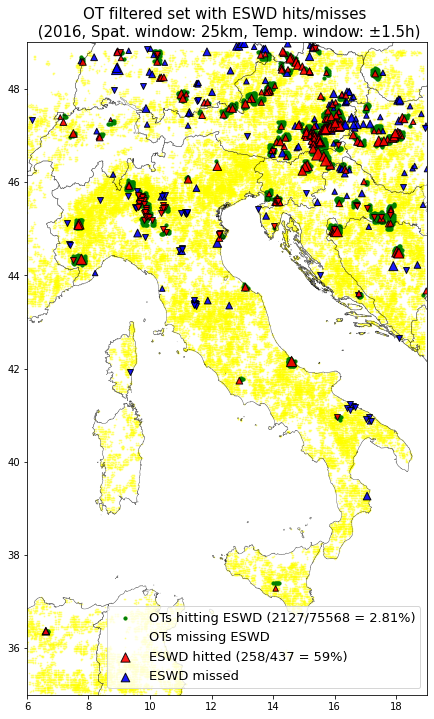

In [397]:
fig, ax = plt.subplots(figsize = (20,12))

plt.ylim(y_lim) #y_lim
plt.xlim(x_lim)  #x_lim

#OTs HITTING:
filt_OTset_land_HITTING_eswd_uniq_2016.plot(ax=ax, markersize=10, column='otpmax', color='green',
                                  zorder=2, label='OTs hitting ESWD (2127/75568 = 2.81%)')   

filt_OTset_land_MISSING_eswd_2016.plot(ax=ax, markersize=1, column='otpmax', color='yellow',
                                  zorder=1,alpha=0.3, label='OTs missing ESWD') 

#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=3)

#ESWD REPORTS:

#HITTED
#divide dataset in subsets with info on size of hail or not:
filt_eswd_HITTED_uniq_2016_NOsize = filt_eswd_HITTED_uniq_2016.loc[np.isnan(filt_eswd_HITTED_uniq_2016['size']) == True].reset_index(drop=True)
filt_eswd_HITTED_uniq_2016_wsize = filt_eswd_HITTED_uniq_2016.loc[np.isnan(filt_eswd_HITTED_uniq_2016['size']) == False].reset_index(drop=True)

pl.scatter(filt_eswd_HITTED_uniq_2016_wsize.lon, filt_eswd_HITTED_uniq_2016_wsize.lat, 
           15*filt_eswd_HITTED_uniq_2016_wsize['size'], c='red',marker="^", edgecolor='k',alpha=0.9, zorder=5, 
           label='ESWD hitted (258/437 = 59%)')
pl.scatter(filt_eswd_HITTED_uniq_2016_NOsize.lon, filt_eswd_HITTED_uniq_2016_NOsize.lat, 35,
                c='red',marker="v", edgecolor='k',alpha=0.9,zorder=5)
#MISSED
#divide dataset in subsets with info on size of hail or not:
filt_eswd_MISSED_2016_NOsize = filt_eswd_MISSED_2016.loc[np.isnan(filt_eswd_MISSED_2016['size']) == True].reset_index(drop=True)
filt_eswd_MISSED_2016_wsize = filt_eswd_MISSED_2016.loc[np.isnan(filt_eswd_MISSED_2016['size']) == False].reset_index(drop=True)

pl.scatter(filt_eswd_MISSED_2016_wsize.lon, filt_eswd_MISSED_2016_wsize.lat, 15*filt_eswd_MISSED_2016_wsize['size'],
           c='blue',marker="^", edgecolor='k',alpha=0.9, zorder=4, label='ESWD missed') 
pl.scatter(filt_eswd_MISSED_2016_NOsize.lon, filt_eswd_MISSED_2016_NOsize.lat, 35,
           c='blue',marker="v", edgecolor='k',alpha=0.9, zorder=4)   


#cell.plot(ax=ax, facecolor="none", edgecolor='grey');
plt.title('OT filtered set with ESWD hits/misses \n (2016, Spat. window: 25km, Temp. window: ±1.5h)',
          fontsize=15);
plt.legend(loc='best', fontsize=13)

plt.savefig('/home/ciccuz/phd/KIT/scripts/plots/OT_filter_validation/vsESWD_2016-2018/OTfilt_eswd_valid_2016.png', 
            dpi=300, bbox_inches='tight');

#### - Analysis valid. ESWD for 2017 alone:

In [403]:
#define which set to consider for validation: filt_ or all_ 
OTset = all_OTset_2017_land

In [404]:
eswd_HITTED = gpd.GeoDataFrame(columns=eswd.columns)
OTset_HITTING = gpd.GeoDataFrame(columns=OTset.columns)

#loop on OT detections
for OT_ind in OTset.index:
    
    OT = OTset[OTset.index == OT_ind]

    OTyear = int(OT.time.apply(lambda x: x.year))
    OTmonth = int(OT.time.apply(lambda x: x.month))
    OTday = int(OT.time.apply(lambda x: x.day))
    OThour = int(OT.time.apply(lambda x: x.hour))
    
    print(OT_ind)

    #select day before and above of OT timing
    OTtime_dAbove = pd.to_datetime(OT.time.item() + pd.to_timedelta(1, unit='d'))
    OTtime_dBefore = pd.to_datetime(OT.time.item() - pd.to_timedelta(1, unit='d'))
    OTtime_dAbove = OTtime_dAbove.replace(tzinfo=None)
    OTtime_dBefore = OTtime_dBefore.replace(tzinfo=None)

    #define eswd subset in the 3 days (before,present,and future) around OT timing: 
    #(this is done to make the loop more efficient!)
    """
    This step could be even more efficient by selecting directly only reports in a 1.5h temp window, for the moment
    lets try with +-1day and see if it is still too slow
    """
    eswd_subset = eswd_2017[(eswd_2017.datetime >= OTtime_dBefore) & (eswd_2017.datetime <= OTtime_dAbove)]
    
    #loop on eswd reports
    for eswd_ind in eswd_subset.index:

        #calculate time delta between OT and eswd report:
        tdelta = pd.Timedelta(abs(OT.time.values[0] - eswd_subset.datetime[eswd_subset.index == eswd_ind].values[0]))
        
        #condition: if difference between OT and report timing is smaller than (+-)1.5h keep the report
        if tdelta <= timedelta(minutes=90):
            
            #condition on spatial neighbourhood: if eswd report falls inside OT box:
            if eswd_subset.geometry[eswd_ind].within(OTset.geometry_25km_box[OT_ind]):

                print('Hit!')
                eswd_HITTED = eswd_HITTED.append(eswd_subset[eswd_subset.index == eswd_ind])

                OTset_HITTING = OTset_HITTING.append(OTset[OTset.index == OT_ind])
    
"""
ALLA FINE DI TUTTO BISOGNA RIPULARE I DATASET HITTED E HITTING DAI DOPPIONI!
"""

12
13
14
15
16
17
19
243
244
275
276
277
285
317
318
319
320
338
339
340
349
350
351
352
353
354
355
392
393
394
395
396
397
398
399
400
401
402
403
404
405
406
407
409
410
412
418
421
422
423
424
425
426
427
428
429
438
439
440
441
467
469
470
471
472
473
474
475
476
477
478
479
480
508
509
510
511
539
540
541
542
543
544
545
546
547
548
549
550
552
553
554
555
556
557
558
559
560
562
563
564
565
574
575
576
577
578
579
580
581
582
583
584
585
586
587
588
589
590
591
592
593
594
595
596
597
598
599
600
601
602
603
604
605
607
661
662
663
664
665
666
667
668
671
672
673
674
677
678
679
680
681
682
685
686
687
688
689
693
701
702
703
704
705
706
707
708
709
710
711
712
713
714
715
716
717
718
720
721
722
723
724
725
726
727
728
729
730
731
732
733
736
737
739
741
742
743
744
745
746
747
748
749
750
751
752
753
756
757
758
759
760
761
762
763
764
765
766
767
768
769
780
1002
1081
1082
1083
1087
1088
1089
1094
1095
1096
1101
1165
1166
1167
1168
1169
1170
1171
1172
1173
1198
1216
1217
1278

3825
3826
3827
3828
3829
3830
3831
3832
3833
3834
3835
3836
3837
3838
3839
3840
3841
3842
3843
3844
3845
3846
3847
3848
3849
3850
3851
3852
3853
3854
3855
3856
3857
3858
3859
3881
3882
3883
3884
3885
3886
3887
3888
3889
3890
3891
3892
3893
3894
3895
3896
3897
3898
3899
3900
3915
3916
3918
3922
3923
3924
3925
3926
3927
3928
3929
3930
3931
3932
3933
3934
3935
3936
3937
3938
3939
3940
3941
3943
3944
3948
3950
3954
Hit!
3955
Hit!
3956
Hit!
3959
Hit!
3960
Hit!
3964
Hit!
3968
Hit!
3969
Hit!
3972
Hit!
3973
3974
3975
3976
3977
3978
3979
Hit!
3994
3995
3996
3997
3998
3999
4000
4001
Hit!
4002
Hit!
4008
4009
4014
4015
4016
4017
4018
4019
4020
4021
4022
4023
4026
4030
4031
4032
4033
4034
4036
4099
4100
4101
4102
4103
4104
4105
4106
4107
4108
4109
4110
4111
4112
4113
4114
4115
4116
4117
4118
4119
4120
4121
4122
4123
4124
4125
4126
4127
4128
4129
4130
4131
4132
4133
4134
4135
4136
4137
4138
4139
4140
4141
4142
4143
4144
4145
4146
4147
4148
4149
4150
4151
4152
4153
4154
4155
4156
4157
4158
4159
4160


6678
6679
6680
6681
6682
6683
6684
6685
6686
6687
6688
6689
6690
6691
6692
6693
6694
6695
6696
6697
6698
6699
6700
6701
6702
6703
6704
6705
6706
6707
6708
6709
6710
6711
6712
6713
6714
6715
6716
6717
6718
6719
6720
6721
6722
6723
6724
6725
6726
6727
6728
6729
6730
6731
6732
6733
6734
6735
6736
6737
6738
6739
6740
6741
6742
6743
6744
6745
6746
6747
6748
6749
6750
6751
6752
6753
6754
6755
6756
6757
6758
6759
6760
6761
6762
6763
6764
6765
6766
6767
6768
6769
6770
6771
6772
6773
6774
6775
6776
6777
6778
6779
6780
6781
6782
6783
6784
6785
6786
6787
6788
6789
6790
6791
6792
6793
6794
6795
6796
6797
6798
6799
6800
6801
6802
6803
6804
6805
6806
6807
6808
6809
6810
6811
6812
6813
6814
6815
6816
6817
6818
6819
6820
6821
6822
6823
6824
6825
6826
6827
6828
6829
6830
6831
6832
6833
6834
6835
6836
6837
6838
6839
6840
6841
6842
6843
6844
6845
6846
6847
6848
6849
6850
6851
6852
6853
6854
6855
6856
6857
6858
6859
6860
6861
6862
6863
6864
6865
6866
6867
6868
6869
6870
6871
6872
6873
6874
6875
6876
6877


8220
8221
8222
8223
8224
8225
8226
8227
8228
8229
8230
8231
8232
8233
8234
8235
8236
8237
8238
8239
8240
8241
8242
8243
8244
8245
8246
8247
8248
8249
8250
8251
8252
8253
8254
8255
8256
8257
8258
8259
8260
8261
8262
8263
8264
8265
8266
8267
8268
8269
8270
8271
8272
8273
8274
8275
8276
8277
8278
8279
8280
8281
8282
8283
8284
8285
8286
8287
8288
8289
8290
8291
8292
8293
8294
8295
8296
8297
8298
8299
8300
8301
8302
8303
8304
8305
8306
8307
8308
8309
8310
8311
8312
8313
8314
8315
8316
8317
8318
8319
8320
8321
8322
8323
8324
8325
8326
8327
8328
8329
8330
8331
8332
8333
8334
8335
8336
8337
Hit!
8338
Hit!
8339
Hit!
8340
Hit!
8341
Hit!
8342
Hit!
8343
Hit!
8344
Hit!
8345
Hit!
8346
Hit!
8347
Hit!
8348
Hit!
8349
Hit!
8350
8351
8352
8353
8354
8355
8356
8357
8358
8359
8360
8361
8362
8363
8364
8365
8366
8367
8368
Hit!
8369
Hit!
8370
Hit!
8371
Hit!
8372
Hit!
8373
8374
8375
8376
Hit!
8377
8378
8379
8380
8381
8382
8383
8384
8385
8386
8387
8388
8389
8390
8391
8392
8393
8394
8395
8396
8397
8398
8399
8400


9894
9895
9896
9897
9898
9899
9900
9901
9902
9903
9904
9905
9906
9907
9908
9909
9910
Hit!
9911
9912
Hit!
9913
Hit!
9914
Hit!
9915
Hit!
9916
9917
Hit!
9918
Hit!
9919
Hit!
9920
Hit!
9921
9922
9923
9924
9925
9926
9927
9928
9929
9930
9931
9932
9933
9934
9935
9936
9937
9938
9939
9940
9941
9942
9943
9944
9945
9946
9947
9948
9949
9950
9951
9952
Hit!
9953
9954
Hit!
9955
Hit!
9956
9957
9958
9959
9960
9961
9962
9963
9964
9965
9966
9967
9968
9969
9970
9971
9972
9973
9974
9975
9976
9977
9978
9979
9980
9981
9982
9983
9984
9985
9986
9987
9988
9989
9990
9991
9992
9993
9994
9995
9996
9997
9998
9999
10000
10001
10002
10003
10004
10005
10006
10007
10017
10018
10019
10020
10021
10022
10023
10024
10025
10026
10027
10028
10029
10030
10031
10032
10033
10034
10035
10036
10037
10038
10039
10040
10041
10042
10043
10044
10045
10046
10047
10048
10049
10050
10051
10052
10053
10054
10055
10056
10057
10058
10059
10067
10068
10069
10070
10071
10072
10073
10074
10075
10076
10077
10078
10079
10080
10081
10082
10083
10

11847
11848
11849
11850
11851
11852
11853
11854
11855
11856
11857
11858
11859
11860
11861
11862
11863
11864
11865
11866
11867
11868
11869
11870
11871
11872
11873
11874
11875
11876
11877
11878
11879
11880
11881
11882
11883
11884
11885
11886
11887
11888
11889
11890
11891
11892
11893
11894
11895
11896
11897
11898
11899
11900
11901
11902
11903
11904
11905
11906
11907
11908
11909
11910
11911
11912
11913
11914
11915
11916
11917
11918
11919
11920
11921
11922
11923
11924
11925
11926
11927
11928
11929
11930
11931
11932
11933
11934
11935
11936
11937
11938
11939
11940
11941
11942
11943
11944
11945
11946
11947
11948
11949
11950
11951
11952
11953
11954
11955
11956
11957
11958
11959
11960
11961
11962
11963
11964
11965
11966
11967
11968
11969
11970
11971
11972
11973
11974
11975
11976
11977
11978
11979
11980
11981
11982
11983
11984
11985
11986
11987
11988
11989
11990
11991
11992
11993
11994
11995
11996
11997
11998
11999
12000
12001
12002
12003
12004
12005
12006
12007
12008
12009
12010
12011
12012
1201

13228
13229
13230
13231
13232
13233
13234
13235
13236
13237
13238
13239
13240
13241
13242
13243
13244
13245
13246
13247
13248
13249
13250
13251
13252
13253
13254
13255
13256
13257
13258
13259
13260
13261
13262
13263
13264
13265
13266
13267
13268
13269
13270
13271
13272
13273
13274
13275
13276
13277
13278
13279
13280
13281
13282
13283
13284
13285
13286
13287
13288
13289
13290
13291
13292
13293
13294
13295
13296
13297
13298
13299
13300
13301
13302
13303
13304
13305
13306
13307
13308
13309
13310
13311
13312
13313
13314
13315
13316
13317
13318
13319
13320
13321
13322
13323
13324
13325
13326
13327
13328
13329
13330
13331
13332
13333
13334
13335
13336
13337
13338
13339
13340
13341
13342
13343
13344
13345
13346
13347
13348
13349
13350
13351
13352
13353
13354
13355
13356
13357
13358
13359
13360
13361
13362
13363
13364
13365
13366
13367
13368
13369
13370
13371
13372
13373
13374
13375
13376
13377
13378
13379
13380
13381
13382
13383
13384
13385
13386
13387
13388
13389
13390
13391
13392
13393
1339

14605
14606
14607
14608
14609
14610
14611
14612
14613
14614
14615
14616
14617
14618
14619
14620
14621
14622
14623
14624
14625
14626
14627
14628
14629
14630
14631
14632
14633
14634
14635
14636
14637
14638
14639
14640
14641
14642
14643
14644
14645
14646
14647
14648
14649
14650
14651
14652
Hit!
14653
Hit!
14654
Hit!
14655
14656
14657
14658
14659
14660
14661
14662
Hit!
14663
Hit!
14664
Hit!
14665
Hit!
14666
Hit!
14667
Hit!
14668
14669
14670
14671
Hit!
14672
Hit!
14673
Hit!
14674
Hit!
14675
Hit!
14676
Hit!
14677
14678
14679
Hit!
14680
Hit!
14681
Hit!
14682
Hit!
14683
14684
14685
14686
14687
14688
14689
14690
14691
14692
14693
14694
14695
14696
14697
14698
14699
14700
14701
14702
14703
14704
14705
14706
14707
14708
14709
14710
14711
14712
14713
14714
14715
14716
14717
14718
14719
14720
14721
14722
14723
14724
14725
14726
14727
14728
14729
14730
14731
14732
14733
14734
14735
14736
14737
14738
14739
14740
14741
14742
14743
14744
14745
14746
14747
14748
14749
14750
14751
14752
14753
14754
14755

16025
16026
16027
16028
16029
16030
16031
16032
16033
16034
16035
16036
16037
16038
16039
16040
16041
16042
16043
16044
16045
16046
16047
16048
16049
16050
16051
16052
16053
16054
16055
16056
16057
16058
16059
16060
16061
16062
16063
16064
16065
16066
16067
16068
16069
16070
16071
16072
16073
16074
16075
16076
16077
16078
16079
16080
16081
16082
16083
16084
16085
16086
16087
16088
16089
16090
16091
16092
16093
16094
16095
16096
16097
16098
16099
16100
16101
16102
16103
16104
16105
16106
16107
16108
16109
16110
16111
16112
16113
16114
16115
16116
16117
16118
16119
16120
16121
16122
16123
16124
16125
16126
16127
16128
16129
16130
16131
16132
16133
16134
16135
16136
16137
16138
16139
16140
16141
16142
16143
16144
16145
16146
16147
16148
16149
16150
16151
16152
16153
16154
16155
16156
16157
16158
16159
16160
16161
16162
16163
16164
16165
16166
16167
16168
16169
16170
16171
16172
16173
16174
16175
16176
16177
16178
16179
16180
16181
16182
16183
16184
16185
16186
16187
16188
16189
16190
1619

17439
17440
17441
17442
17443
17444
17445
17446
17447
17448
17449
17450
17451
17452
17453
17454
17455
17456
17457
17458
17459
17460
17461
17462
17463
17464
17465
17466
17467
17468
17469
17470
17471
17472
17473
17474
17475
17476
17477
17478
17479
17480
17481
17482
17483
17484
17485
17486
17487
17488
17489
17490
17491
17492
17493
17494
17495
17496
17497
17498
17499
17500
17501
17502
17503
17504
17505
17506
17507
17508
17509
17510
17511
17512
17513
17514
17515
17516
17517
17518
17519
17520
17521
17522
17523
17524
17525
17526
17527
17528
17529
17530
17531
17532
17533
17534
17535
17541
17542
17543
17544
17545
17546
17547
17548
17549
17550
17551
17552
17553
17554
17555
17576
17577
17578
17579
17581
17582
17583
17584
17585
17586
17587
17588
17589
17590
17591
17592
17593
17594
17595
17596
17597
17598
17599
17600
17601
17602
17603
17604
17605
17606
17607
17608
17609
17610
17611
17612
17613
17614
17615
17616
17617
17618
17619
17620
17621
17622
17623
17624
17625
17626
17627
17628
17629
17630
1763

18881
18882
18883
18884
18885
18886
18887
18888
18889
18890
18891
18896
18901
18902
18903
18908
18909
18910
18917
18918
18919
18929
Hit!
Hit!
Hit!
Hit!
18932
18933
18935
18936
18937
18938
18939
18940
18941
18942
18943
18944
18988
18989
18990
18991
18992
18993
18994
18995
18996
18997
18998
18999
19000
19001
19002
19003
19004
19005
19006
19007
19008
19009
19010
19011
19012
19013
19014
19015
19016
19017
19018
19019
19020
19021
19022
19023
19024
19025
19026
19027
19028
19029
19030
19031
19032
19033
19034
19035
19036
19037
19038
19039
19040
19041
19042
19043
19044
19045
19046
19047
19048
19049
19050
19051
19052
19053
19054
19055
19056
19057
19058
19059
19060
19061
19062
19063
19064
19065
19066
19067
19068
19069
19070
19071
19072
19073
19074
19075
19076
19077
19078
19079
19080
19081
19082
19083
19084
19085
19086
19087
19088
19089
19090
19091
19092
19093
19094
19095
19096
19097
19098
19099
19100
19101
19102
19103
19104
19105
19106
19107
19108
19109
19110
19111
19112
19113
19114
19115
19116
19

20555
20556
20557
20558
20559
20560
20561
20562
20563
20564
20565
20566
20567
20568
20569
20570
20571
20572
20573
20574
20575
20576
20577
20578
20579
20580
20581
20582
20583
20584
20585
20586
20587
20588
20589
20590
20591
20592
20593
20594
20595
20596
20597
20598
20599
20600
20601
20602
20603
20604
20605
20606
20607
20608
20609
20610
20611
20612
20613
20614
20615
20616
20617
20618
20619
20620
20621
20622
20623
20624
20625
20626
20627
20628
20629
20630
20631
20632
20633
20634
20635
20636
20637
20638
20639
20640
20641
20642
20643
20644
20645
20646
20647
20648
20649
20650
20651
20652
20653
20654
20655
20656
20657
20658
20659
20660
20661
20662
20663
20664
20665
20666
20667
20668
20669
20670
20671
20672
20673
20674
20675
20676
20677
20678
20679
20680
20681
20682
20683
20684
20685
20686
20687
20688
20689
20690
20691
20692
20693
20694
20695
20696
20697
20698
20699
20700
20701
20702
20703
20704
20705
20706
20707
20708
20709
20710
20711
20712
20713
20714
20715
20716
20717
20718
20719
20720
2072

22085
22086
22087
22088
22089
22090
22091
22092
22093
22094
22095
22096
22097
22098
22099
22100
22101
22102
22103
22104
22105
22106
22107
22108
22109
22110
22111
22112
22113
22114
22115
22116
22117
22118
22119
22120
22121
22122
22123
22124
22125
22126
22127
22128
22129
22130
22131
22132
22133
22134
22135
22136
22137
22138
22139
22140
22141
22142
22143
22144
22145
22146
22147
22148
22149
22150
22151
22152
22153
22154
22155
22156
22157
22158
22159
22160
22161
22162
22163
22164
22165
22166
22167
22168
22169
22170
22171
22172
22173
22174
22175
22176
22177
22178
22179
22180
22181
22182
22183
22184
22185
22186
22187
22188
22189
22190
22191
22192
22193
22194
22195
22196
22197
22198
22199
22200
22201
22202
22203
22204
22205
22206
22207
22208
22209
22210
22211
22212
22213
22214
22215
22216
22217
22218
22219
22220
22221
22222
22223
22224
22225
22226
22227
22228
22229
22230
22231
22232
22233
22234
22235
22236
22237
22238
22239
22240
22241
22242
22243
22244
22245
22246
22247
22248
22249
22250
2225

Hit!
23466
23467
23468
23469
Hit!
23470
Hit!
23471
23472
23473
Hit!
23474
Hit!
23475
Hit!
23476
23477
Hit!
23478
Hit!
23479
Hit!
23480
23481
Hit!
23482
Hit!
23483
Hit!
23484
Hit!
23485
Hit!
23486
23487
23488
23489
23490
23491
23492
23493
23494
23495
23496
23497
23498
23499
23500
23501
23502
23503
23504
23505
23506
23507
23508
23509
23510
23511
23512
23513
23514
23515
23516
23517
23518
23519
23520
23521
23522
23523
23524
23525
23526
23527
23528
23529
23530
23531
23532
23533
23534
23535
23536
23537
23538
23539
23540
23541
23542
23543
23544
23545
23546
23547
23548
23549
23550
23551
23552
23553
23554
23555
23556
23557
23558
23559
23560
23561
23562
23563
23564
23565
23566
23567
23568
23569
23570
23571
23572
23573
23574
23575
23576
23577
23578
23579
23580
23581
23582
23583
23584
23585
23586
23587
23588
23589
23590
23591
23592
23593
23594
23595
23596
23597
23598
23599
23600
23601
23602
23603
23604
23605
23606
23607
23608
23609
23610
23611
23612
23613
23614
23615
23616
23617
23618
23619
23620


24679
24680
24681
24682
24683
24684
24685
24686
24687
24688
24689
24690
24691
24692
24693
24694
24695
24696
24697
24698
24699
24700
24701
24702
24703
24704
24705
24706
24707
24708
24709
24710
24711
24712
24713
24714
24715
24716
24717
24718
24719
24720
24721
24722
24723
24724
24725
24726
24727
24728
24729
24730
24731
24732
24733
24734
24735
24736
24737
24738
24739
24740
24741
24742
24743
24744
24745
24746
24747
24748
24749
24750
24751
24752
24753
24754
24755
24756
24757
24758
24759
24760
24761
24762
24763
24764
24765
24766
24767
24768
24769
24770
24771
24772
24773
24774
24775
24776
24777
24778
24779
24780
24781
24782
24783
24784
24785
24786
24787
24788
24789
24803
24809
24810
24818
24822
24825
24831
24832
24833
24834
24835
24836
24837
24838
24839
24840
24841
24842
24843
24844
24845
24846
24847
24848
24849
24850
24851
24852
24853
24854
24855
24856
24857
24858
24859
24860
24861
24862
24863
24864
24865
24866
24867
24868
24869
24870
24871
24872
24873
24874
24875
24876
24877
24878
24879
2488

26002
26003
26004
26005
26006
26007
26008
26009
26010
26011
26012
26013
26014
26015
26016
26017
26018
26019
26020
26021
26022
26023
26024
26025
26026
26027
26028
26029
26030
26031
26032
26033
26034
26035
26036
26037
26038
26039
26040
26041
26042
26043
26044
26045
26046
26047
26048
26049
26050
26051
26052
26053
26054
26055
26056
26057
26058
26059
26060
26061
26062
26063
26064
26065
26066
26067
26068
26069
26070
26071
26072
26073
26074
26075
26076
26077
26078
26079
26080
26081
26082
26083
26084
26085
26086
26087
26088
26089
26090
26091
26092
26093
26094
26095
26096
26097
26098
26099
26100
26101
26102
26103
26104
26105
26106
26107
26108
Hit!
26109
Hit!
26110
Hit!
26111
Hit!
26112
Hit!
26113
26114
26115
26116
26117
26118
26119
Hit!
26120
Hit!
26121
Hit!
26122
Hit!
26123
Hit!
26124
26125
26126
26127
26128
26129
26130
Hit!
Hit!
26131
Hit!
Hit!
26132
Hit!
Hit!
26133
Hit!
26134
26135
26136
26137
26138
26139
Hit!
Hit!
26140
Hit!
Hit!
26141
Hit!
Hit!
26142
Hit!
Hit!
26143
26144
26145
26146
26147

27321
27322
27323
27324
27325
27326
27327
27328
27329
27330
27331
27332
27333
27334
27335
27336
27337
27338
27339
27340
27341
27342
27343
27344
27345
27346
27347
27348
27349
27350
27351
27352
27353
27354
27355
27356
27357
27358
27359
27360
27361
27362
27363
27364
27365
27366
27367
27368
27369
27370
27371
27372
27373
27374
27375
27376
27377
27378
27379
27380
27381
27382
27383
27384
27385
27386
27387
27388
27389
27390
27391
27392
27393
27394
27395
27396
27397
27398
27399
27400
27401
27402
27403
27404
27405
27406
27407
27408
27409
27410
27411
27412
27413
27414
27415
27416
27417
27418
27419
27420
27421
27422
27423
27424
27425
27426
27427
27428
27429
27430
27431
27432
27433
27434
27435
27436
27437
27438
27439
27440
27441
27442
27443
27444
27445
27446
27447
27448
27449
27450
27451
27452
27453
27454
27455
27456
27457
27458
27459
27460
27461
27462
27463
27464
27465
27466
27467
27468
27469
27470
27471
27472
27473
27474
27475
27476
27477
27478
27479
27480
27481
27482
27483
27484
27485
27486
2748

28658
28659
28660
28661
28662
28663
28664
28665
28666
28667
28668
28669
28670
28671
28672
28673
28674
28675
28676
28677
28678
28679
28680
28681
28682
28683
28684
28685
28686
28687
28688
28689
28690
28691
28692
28693
28694
28695
28696
28697
28698
28699
28700
28701
28702
28703
28704
28705
28706
28707
28708
28709
28710
28711
28712
28713
28714
28715
28716
28717
28718
28719
28720
28721
28722
28723
28724
28725
28726
28727
28728
28729
28730
28731
28732
28733
28734
28735
28736
28737
28738
28739
28740
28741
28742
28743
28744
28745
28746
28747
28748
28749
28750
28751
28752
28753
28754
28755
28756
28757
28758
28759
28760
28761
28762
28763
28764
28765
28766
28767
28768
28769
28770
28771
28772
28773
28774
28775
28776
28777
28778
28779
28780
28781
28782
28783
28784
28785
28786
28787
28788
28789
28790
28791
28792
28793
28794
28795
28796
28797
28798
28799
28800
28801
28802
28803
28804
28805
28806
28807
28808
28809
28810
28811
28812
28813
28814
28815
28816
28817
28818
28819
28820
28821
28822
28823
2882

30007
30008
30009
30010
30011
30012
30013
30014
30015
30016
30017
30018
30019
30020
30021
30022
30023
30024
30025
30026
30027
30028
30029
30030
30031
30032
30033
30034
30035
30036
30037
30038
30039
30040
30041
30042
30043
30044
30045
30046
30047
30048
30049
30050
30051
30052
30053
30054
30055
30056
30057
30058
Hit!
30059
Hit!
30060
Hit!
30061
30062
30063
30064
Hit!
30065
Hit!
30066
Hit!
30067
Hit!
30068
Hit!
30069
Hit!
30070
30071
30072
30073
30074
Hit!
30075
Hit!
30076
Hit!
30077
Hit!
30078
Hit!
30079
Hit!
30080
30081
30082
Hit!
30083
30084
30085
30086
30087
30088
30089
30090
30091
30092
30093
30094
30095
30096
30097
30098
30099
30100
30101
30102
30103
30104
30105
30106
30107
30108
30109
30110
30111
30112
30113
30114
30115
30116
30117
30118
30119
30120
30121
30122
30123
30124
30125
30126
30127
30128
30129
30130
30131
30132
30133
30134
30135
30136
30137
30138
30139
30140
30141
30142
30143
30144
30145
30146
30147
30148
30149
30150
30151
30152
30153
30154
30155
30156
30157
30158
30159
30

31306
31307
31308
31309
31310
31311
31312
31313
31314
31315
31316
31317
31318
31319
31320
31321
31322
31323
31324
31325
31326
31327
31328
31329
31330
31331
31332
31333
31334
31335
31336
31337
31338
31339
31340
31341
31342
31343
31344
31345
31346
31347
31348
31349
31350
31351
31352
31353
31354
31355
31356
31357
31358
31359
31360
31361
31362
31363
31364
31365
31367
31368
31369
31377
31379
31380
31381
31382
31383
31384
31385
31386
31387
31388
31389
31390
31391
31392
31393
31394
31395
31396
31397
31398
31399
31400
31401
31402
31403
31404
31405
31406
31407
31408
31409
31410
31411
31412
31413
31414
31415
31416
31417
31418
31419
31420
31421
31422
Hit!
31423
Hit!
31424
Hit!
31425
Hit!
31426
Hit!
31427
Hit!
31428
Hit!
31429
31430
Hit!
31431
Hit!
31432
Hit!
31433
Hit!
31434
31435
31436
31437
31438
31439
31440
31441
31442
31443
31444
31445
31446
31447
31448
31449
31450
31451
31452
31453
31454
31455
31456
31457
31458
31459
31460
31461
31462
31463
31464
31465
31466
31467
31468
31469
31470
31471
314

32487
32488
32489
32490
32491
32492
32493
32494
32495
32496
32497
32498
32499
32500
32501
32502
32503
Hit!
Hit!
Hit!
32504
Hit!
Hit!
Hit!
32505
Hit!
Hit!
Hit!
32506
Hit!
Hit!
Hit!
32507
32508
32509
Hit!
Hit!
32510
Hit!
Hit!
32511
Hit!
Hit!
32512
Hit!
Hit!
32513
Hit!
Hit!
32514
Hit!
Hit!
32515
32516
Hit!
Hit!
32517
Hit!
Hit!
32518
Hit!
Hit!
32519
Hit!
Hit!
32520
Hit!
Hit!
32521
Hit!
32522
Hit!
32523
Hit!
32524
Hit!
32525
Hit!
32526
32527
32528
32529
32530
32531
32532
32533
32534
32535
32536
32537
32538
32539
32540
32541
32542
32543
32544
32545
32546
32547
32548
32549
32550
32551
32552
32553
32554
32555
32556
32557
32558
32559
32560
32561
32562
Hit!
32563
Hit!
Hit!
32564
Hit!
Hit!
32565
Hit!
Hit!
32566
Hit!
Hit!
32567
32568
Hit!
Hit!
32569
Hit!
Hit!
32570
Hit!
Hit!
32571
Hit!
Hit!
32572
32573
Hit!
Hit!
32574
Hit!
Hit!
32575
Hit!
Hit!
32576
Hit!
Hit!
Hit!
32577
Hit!
Hit!
32578
Hit!
Hit!
32579
Hit!
Hit!
Hit!
32580
Hit!
Hit!
32581
32582
32583
32584
32585
32586
32587
32588
32589
32590
32591


33797
33798
33799
33800
33801
33802
33803
33804
33805
33806
33807
33808
33809
33810
33811
33812
33813
33814
33815
33816
33817
33818
33819
33820
33821
33822
33823
33824
33825
33826
33827
33828
33829
33830
33831
33832
33833
33834
33835
33836
33837
33838
33839
33840
33841
33842
33843
33844
33845
33846
33847
33848
33849
33850
33851
33852
33853
33854
33855
33856
33857
33858
33859
33860
33861
33862
33863
33864
33865
33866
33867
33868
33869
33870
33871
33872
33873
33874
33875
33876
33877
33878
33879
33880
33881
33882
33883
33884
33885
33886
33887
33888
33889
33890
33891
33892
33893
33894
33895
33896
33897
33898
33899
33900
33901
33902
33903
33904
33905
33906
33907
33908
33909
33910
33911
33912
33913
33914
33915
33916
33917
33918
33919
33920
33921
33922
33923
33924
33925
33926
33927
33928
33929
33930
33931
33932
33933
33934
33935
33936
33937
33938
33939
33940
33941
33942
33943
33944
33945
33946
33947
33948
33949
33950
33951
33952
33953
33954
33955
33956
33957
33958
33959
33960
33961
33962
3396

35170
35171
35172
35173
35174
35175
35176
35177
35178
35179
35180
35181
35182
35183
35184
35185
35186
35187
35188
35189
35190
35191
35192
35193
35194
35195
35196
35197
35198
35199
35200
35201
35202
35203
35204
35205
35206
35207
35208
35209
35210
35211
35212
35213
35214
35215
35216
35217
35218
35219
35220
35221
35222
35223
35224
35225
35226
35227
35228
35229
35230
35231
35232
35233
35234
35235
35236
35237
35238
35239
35240
35241
35242
35243
35244
35245
35246
35247
35248
35249
35250
35251
35252
35253
35254
35255
35256
35257
35258
35259
35260
35261
35262
35263
35264
35265
35266
35267
35268
35269
35270
35271
35272
35273
35274
35275
35276
35277
35278
35279
35280
35281
35282
35283
35284
35285
35286
35287
35288
35289
35290
35291
35292
35293
35294
35295
35296
35297
35298
35299
35300
35301
35302
35303
35304
35305
35306
35307
35308
35309
35310
35311
35312
35313
35314
35315
35316
35317
35318
35319
35320
35321
35322
35323
35324
35325
35326
35327
35328
35329
35330
35331
35332
35333
35334
35335
3533

36461
Hit!
Hit!
Hit!
Hit!
36462
36463
36464
36465
36466
36467
36468
36469
36470
36471
36472
36473
36474
36475
36476
36477
36478
36479
36480
36481
36482
36483
36484
36485
36486
36487
36488
36489
36490
36491
36492
36493
36494
36495
Hit!
Hit!
Hit!
36496
Hit!
Hit!
Hit!
Hit!
36497
Hit!
Hit!
Hit!
Hit!
36498
36499
36500
36501
36502
36503
36504
36505
36506
36507
36508
36509
36510
36511
36512
36513
36514
36515
36516
36517
36518
36519
36520
36521
36522
36523
36524
36525
36526
36527
36528
36529
36530
36531
36532
36533
36534
36535
36536
36537
36538
36539
36540
36541
36542
36543
36544
36545
36546
36547
36548
36549
36550
36551
36552
36553
36554
36555
36556
36557
36558
36559
36560
36561
36562
36563
36564
36565
36566
36567
36568
36569
36570
36571
36572
36573
36574
36575
36576
36577
36578
36579
36580
36581
36582
36583
36584
36585
36586
36587
36588
36589
36590
36591
36592
36593
36594
36595
36596
36597
36598
36599
36600
36601
36602
36603
36604
36605
36606
36607
36608
36609
36610
36611
36612
36613
36614
3

37646
37647
37648
37649
37650
37651
37652
37653
37654
37655
37656
37657
37658
37659
37660
37661
37662
37663
37664
37665
37666
37667
37668
37669
37670
37671
37672
37673
37674
37675
37676
37677
37678
37679
37680
37681
37682
37683
37684
37685
37686
37687
37688
37689
37690
37691
37692
37693
37694
37695
37696
37697
37698
37699
37700
37701
37702
37703
37704
37705
37706
37707
37708
37709
37710
37711
37712
37713
37714
37715
37716
37717
37718
37719
37720
37721
37722
37723
37724
37725
37726
37727
37728
37729
37730
37731
37732
37733
37734
37735
37736
37737
37738
37739
37740
37741
37742
37743
37744
37745
37746
37747
37748
37749
37750
37751
37752
37753
37754
37755
37756
37757
37758
37759
37760
37761
37762
37763
37764
37765
37766
37767
37768
37769
37770
37771
37772
37773
37774
37775
37776
37777
37778
37779
37780
37781
37782
37783
37784
Hit!
37785
37786
37787
37788
37789
37790
37791
37792
37793
37794
37795
37796
37797
37798
37799
37800
37801
37802
37807
37823
37824
37829
37830
37831
37832
37833
37834

39402
39403
39404
39405
39406
39407
39408
39409
39410
39411
39412
39413
39414
39415
39416
39417
39418
39419
39420
39421
39422
39423
39424
39425
39426
39427
39428
39429
39430
39431
39432
39433
39434
39435
39436
39437
39438
39439
39440
39441
39442
39443
39444
39445
39446
39447
39448
39449
39450
39451
39452
39453
39454
39455
39456
39457
39458
39459
39460
39461
39462
39463
39464
39465
39466
39467
39468
39469
39470
39471
39472
39473
39474
39475
39476
39477
39478
39479
39480
39481
39482
39483
39484
39485
39486
39487
39488
39489
39490
39491
39492
39493
39494
39495
39496
39497
39498
39499
39500
39501
39502
39503
39504
39505
39506
39507
39508
39509
39510
39511
39512
39513
39514
39515
39516
39517
39518
39519
39520
39521
39522
39523
39524
39525
39526
39527
39528
39529
39530
39531
39532
39533
39534
39535
39536
39537
39538
39539
39540
39541
39542
39543
39544
39545
39546
39547
39548
39549
39550
39551
39552
39553
39554
39555
39556
39557
39558
39559
39560
39561
39578
39579
39593
39594
39607
39608
3960

41123
41124
41125
41126
41127
41128
41129
41130
41131
41132
41133
41134
41135
41136
41137
41138
41139
41140
41141
41142
41143
41144
41145
41146
41147
41148
41149
41150
41151
41152
41153
41154
41155
41156
41157
41158
41159
41160
41161
41162
41163
41164
41165
41166
41167
41168
41169
41170
41171
41172
41173
41174
41175
41176
41177
41178
41179
41180
41181
41182
41183
41184
41185
41186
41187
41188
41189
41190
41191
41192
41193
41194
41195
41196
41197
41198
41199
41200
41201
41202
41203
41204
41205
41206
41207
41208
41209
41210
41211
41212
41213
41214
41215
41216
41217
41218
41219
41220
41221
41222
41223
41224
41225
41226
41227
41228
41229
41230
41231
41232
41233
41234
41235
41236
41237
41238
41239
41240
41241
41242
41243
41244
41245
41246
41247
41248
41249
41250
41251
41252
41253
41254
41255
41256
41257
41258
41259
41260
41261
41262
41379
41380
41381
41382
41383
41384
41412
41413
41414
41421
41422
41423
41424
41425
41426
41445
41448
41449
41452
41453
41455
41456
41457
41458
41459
41460
4146

42676
42677
42678
42679
42680
42681
42682
42683
42684
42685
42686
42687
42688
42689
42690
42691
42692
42693
42694
42695
42696
42697
42698
42699
42700
42701
42718
42719
42720
42721
42722
42723
42724
42725
42726
42727
42728
42729
42730
42731
42732
42733
42734
42735
42736
42737
42738
42739
42740
42741
42748
42749
42750
42751
42752
42753
42754
42755
42756
42757
42758
42759
42760
42761
42762
42763
42764
42767
42768
42770
42771
42772
42773
42774
42780
42781
42782
42783
42784
42785
42786
42787
42788
42789
42790
42791
42792
42793
42794
42795
42796
42797
42798
42799
42800
42801
42802
42803
42804
42805
42806
42807
42808
42809
42810
42811
42812
42813
42814
42815
42816
42817
42818
42819
42820
42821
42822
42823
42824
42825
42826
42827
42828
42829
42830
42831
42832
42833
42834
42835
42836
42837
42838
42839
42840
42841
42842
42843
42844
42845
42846
42847
42848
42849
42850
42851
42852
42853
42854
42855
42856
42857
42858
42859
42860
42861
42862
42863
42864
42865
42866
42867
42868
42869
42870
42871
4287

43928
43929
43930
43931
43932
43933
43934
43935
43936
43937
43938
43939
43940
43941
43942
43943
43944
43945
43946
43947
43948
43949
43950
43951
43952
43953
43954
43955
43956
43957
43958
43959
43960
43961
43962
43963
43964
43965
43966
43967
43968
43969
43970
43971
43972
43973
43974
43975
43976
43977
43978
43979
43980
43981
43982
43983
43984
43985
43986
43987
43988
43989
43990
43991
43992
43993
43994
43995
43996
Hit!
43997
43998
43999
Hit!
44065
44066
44067
44068
44069
44070
44071
44072
44073
44074
44075
44076
44077
44078
44079
44080
44081
44082
44083
44084
44085
44086
44087
44088
44089
44090
44091
44092
44093
44094
44095
44096
44097
44098
44099
44100
44101
44102
44103
44104
44105
44106
44107
44108
44109
44110
44111
44112
44113
44114
44115
44116
44117
44118
44119
44120
44121
44122
44123
44124
44125
44126
44127
44128
44129
44130
44131
44132
44133
44134
44135
44136
44137
44138
44139
44140
44141
44142
44143
44144
44145
44146
44147
44148
44149
44150
44151
44152
44153
44154
44155
44156
44157


46150
46151
46152
46153
46154
46155
46156
46157
46158
46159
46160
46161
46162
46163
46164
46165
46166
46167
46168
46169
46170
46171
46172
46173
46174
46175
46176
46177
46178
46179
46180
46181
46182
46183
46184
46185
46186
46187
46188
46189
46190
46191
46192
46193
46194
46195
46196
46197
46198
46199
46200
46201
46202
46203
46204
46205
46206
46207
46208
46209
46210
46211
46212
46213
46214
46215
46216
46217
46218
46219
46220
46221
46222
46223
46224
46225
46226
46227
46228
46229
46230
46231
46232
46233
46234
46235
46236
46237
46238
46239
46240
46241
46242
46243
46244
46245
46246
46247
46248
46249
46250
46251
46252
46253
46254
46255
46256
46257
46258
46259
46260
46261
46262
46263
46264
46265
46266
46267
46268
46269
46270
46271
46272
46273
46274
46275
46276
46277
46278
46279
46280
46281
46282
46283
46284
46285
46286
46287
46288
46289
46290
46291
46292
46293
46294
46295
46296
46297
46298
46299
46300
46301
46302
46303
46304
46305
46306
46307
46308
46309
46310
46311
46312
46313
46314
46315
4631

47514
47515
47516
47517
47518
47519
47520
47521
47522
47523
47524
47525
47526
47527
47528
47529
47530
47531
47532
47533
47534
47535
47536
47537
47538
47539
47540
47541
47542
47543
47544
47545
47546
47547
47548
47549
47550
47551
47552
47553
47554
47555
47556
47557
47558
47559
47560
47561
47562
47563
47564
47565
47566
47567
47568
47569
47570
47571
47572
47573
47574
47575
47576
47577
47578
47579
47580
47581
47582
47583
47584
47585
47586
47587
47588
47589
47590
47591
47592
47593
47594
47595
47596
47597
47598
47599
47600
47601
47602
47603
47604
47605
47606
47607
47608
47609
47610
47611
47612
47613
47614
47615
47616
47617
47618
47619
47620
47621
47622
47623
47624
47625
47626
47627
47628
47629
47630
47631
47632
47633
47634
47635
47636
47637
47638
47639
47640
47641
47642
47643
47644
47645
47646
47647
47648
47649
47650
47651
47652
47653
47654
47655
47656
47657
47658
47659
47660
47661
47662
47663
47664
47665
47666
47667
47668
47669
47670
47671
47672
47673
47674
47675
47676
47677
47678
47679
4768

49000
49001
49002
49003
49004
49005
49006
49007
49008
49009
49010
49011
49012
49013
49014
49015
49016
49017
49018
49019
49020
49021
49022
49023
49024
49025
49026
49027
49028
49029
49030
49031
49032
49033
49034
49035
49036
49037
49038
49039
49040
49041
49042
49043
49044
49045
49046
49047
49048
49049
49050
49051
49052
49053
49054
49055
49056
49057
49058
49059
49060
49061
49062
49063
49064
49065
49066
49067
49068
49069
49070
49071
49072
49073
49074
49075
49076
49077
49078
49079
49080
49081
49082
49083
49084
49085
49086
49087
49088
49089
49090
49091
49092
49093
49094
49095
49096
49097
49098
49099
49100
49101
49102
49103
49104
49105
49106
49107
49108
49109
49110
49111
49112
49113
49114
49115
49116
49117
49118
49119
49120
49121
49122
49123
49124
49125
49126
49127
49128
49129
49130
49131
49132
49133
49134
49135
49136
49137
49138
49139
49140
49141
49142
49143
49144
49145
49146
49147
49148
49149
49150
49151
49152
49153
49154
49155
49156
49157
49158
49159
49160
49161
49162
49163
49164
49165
4916

50702
50703
50704
50705
50706
50707
50708
50709
50710
50711
50712
50713
50714
50715
50716
50717
50718
50719
50720
50721
50722
50723
50724
50725
50726
50727
50728
50729
50730
50731
50732
50733
50734
50735
50736
50737
50738
50739
50740
50741
50742
50743
50744
50745
50746
50747
50748
50749
50750
50751
50752
50755
50759
50760
50765
50770
50771
50776
50777
50778
50779
50789
50790
50791
50792
50803
50804
50816
50817
50830
50856
50859
50860
50861
50862
50863
50864
50865
50866
50867
50868
50869
50870
50871
50872
50873
50874
50875
50876
50877
50878
50879
50880
50881
50882
50883
50884
50885
50886
50887
50888
50889
50890
50891
50892
50893
50894
50895
50896
50897
50898
50899
50900
50901
50902
50903
50904
50905
50906
50907
50908
50909
50910
50911
50912
50913
50914
50915
50916
50917
50918
50919
50920
50921
50922
50923
50924
50925
50926
50927
50928
50929
50930
50931
50932
50933
50934
50935
50936
50937
50938
50939
50940
50941
50942
50943
50944
50945
50946
50947
50948
50949
50950
50951
50952
50953
5095

52895
52896
52897
52898
52899
52900
52901
52902
52903
52904
52905
52906
52907
52908
52909
52910
52911
52912
52913
52914
52915
52916
52917
52918
52919
52920
52921
52922
52923
52924
52925
52926
52927
52928
52929
52930
52931
52932
52933
52934
52935
52936
52937
52938
52939
52940
52941
52942
52943
52944
52945
52946
52947
52948
52949
52950
52951
52952
52953
52954
52955
52956
52957
52958
52959
52960
52961
52962
52963
52964
52965
52966
52967
52968
52969
52970
52971
52972
52973
52974
52975
52976
52977
52978
52979
52980
52981
52982
52983
52984
52985
52986
52987
52988
52989
52990
52991
52992
52993
52994
52995
52996
52997
52998
52999
53000
53001
53002
53003
53004
53005
53006
53007
53008
53009
53010
53011
53012
53013
53014
53015
53016
53017
53018
53019
53020
53021
53022
53023
53024
53025
53026
53027
53028
53029
53030
53031
53032
53033
53034
53035
53036
53037
53038
53039
53040
53041
53042
53043
53044
53045
53046
53047
53048
53049
53050
53051
53052
53053
53054
53055
53056
53057
53058
53059
53060
5306

54329
54330
54331
54332
54333
54334
54335
54336
54337
54338
54339
54340
54341
54342
54343
54344
54345
54346
Hit!
54347
Hit!
54348
54349
54350
Hit!
54351
Hit!
54352
54353
54354
54355
54356
54357
54358
Hit!
54359
Hit!
54360
Hit!
54361
54362
54363
Hit!
54364
54365
54366
54367
54368
54369
54370
54371
54372
54373
54374
54375
54376
54377
54378
54379
54380
54381
54382
54383
54384
54385
54386
54387
54388
54389
54390
54391
54392
54393
54394
54395
54396
54397
54398
54399
54400
54401
54402
54403
54404
54405
54406
54407
54408
54409
54410
54411
54412
54413
54414
54415
54416
54417
54418
54419
54420
54421
54422
54423
54424
54425
54426
54427
54428
54429
54430
54431
54432
54433
54434
54435
54436
54437
54438
54439
54440
54441
54442
54443
54444
54445
54446
54447
54448
54449
54450
54451
Hit!
54452
Hit!
54453
Hit!
54454
Hit!
54455
Hit!
54456
Hit!
54457
Hit!
54458
Hit!
54459
Hit!
54460
Hit!
54461
54462
54463
54464
54465
54466
54467
54468
54469
54470
54471
54472
54473
54474
54475
54476
54477
54478
54479
5448

55311
Hit!
Hit!
55312
55313
55314
55315
55316
55317
55318
55319
55320
55321
55322
55323
55324
55325
Hit!
Hit!
Hit!
55326
Hit!
Hit!
55327
55328
55329
55330
55331
55332
55333
55334
55335
55336
55337
55338
55339
55340
55341
55342
Hit!
Hit!
Hit!
Hit!
Hit!
55343
Hit!
Hit!
Hit!
55344
Hit!
Hit!
55345
55346
55347
55348
55349
55350
55351
55352
55353
55354
55355
55356
55357
55358
55359
Hit!
Hit!
Hit!
55360
Hit!
Hit!
55361
55362
55363
55364
55365
55366
55367
55368
55369
55370
55371
55372
55373
55374
Hit!
Hit!
55375
55376
55377
55378
55379
55380
55381
55382
55383
55384
55385
55386
55387
55388
55389
55390
55391
55392
55393
55394
55395
55396
55397
55398
55399
55400
55401
55402
55403
55404
55405
55406
55407
55408
55409
55410
55411
55412
55413
55414
55415
55416
55417
55418
55419
55420
55421
55422
55423
55424
55425
55426
55427
55428
55429
55430
55431
55432
55433
55434
55435
55436
55437
55438
55439
55440
55441
55442
55443
55444
55445
55446
55447
55448
55449
55450
55451
55452
55453
55454
55455
55456
5545

56653
56654
56655
56656
56657
56658
56659
56660
56661
56662
56663
56664
56665
56666
56667
56668
56669
56670
56671
56672
56673
56674
56675
56676
56677
56678
56679
56680
56681
56682
56683
56684
56685
56686
56687
56688
56689
56690
56691
56692
56693
56694
56695
56696
56697
56698
56699
56700
56701
56702
56703
56704
56705
56706
56707
56708
56709
56710
56711
56712
56713
56714
56715
56716
56717
56718
56719
56720
56721
56722
56723
56724
56725
56726
56727
56728
56729
56730
56731
56732
56733
56734
56735
56736
56737
56738
56739
56740
56741
56742
56743
56744
56745
56746
56747
56748
56749
56750
56751
56752
56753
56754
56755
56756
56757
56758
56759
56760
56761
56762
56763
56764
56765
56766
56767
56768
56769
56770
56771
56772
56773
56774
56775
56776
56777
56778
56779
56780
56781
56782
56783
56784
56785
56786
56787
56788
56789
56790
56791
56792
56793
56794
56795
56796
56797
56798
56799
56800
56801
56802
56803
56804
56805
56806
56807
56808
56809
56810
56811
56812
56813
56814
56815
56816
56817
56818
5681

58032
58033
58034
58035
58036
58037
58038
58039
58040
58041
58042
58043
58044
58045
58046
58047
58048
58049
58050
58051
58052
58053
58054
58055
58056
58057
58058
58059
58060
58061
58062
58063
58064
58065
58066
58067
58068
58069
58070
58071
58072
58073
58074
58075
58076
58077
58078
58079
58080
58081
58082
58083
58084
58085
58086
58087
58088
58089
58090
58091
58092
58093
58094
58095
58096
58097
58098
58099
58100
58101
58102
58103
58104
58105
58106
58107
58108
58109
58110
58111
58112
58113
58114
58115
58116
58117
58118
58119
58120
58121
58122
58123
58124
58125
58126
58127
58128
58129
58130
58131
58132
58133
58134
58135
58136
58137
58138
58139
58140
58141
58142
58143
58144
58145
58146
58147
58148
58149
58150
58151
58152
58153
58154
58155
58156
58157
58158
58159
58160
58161
58162
58163
58164
58165
58166
58167
58168
58169
58170
58171
58172
58173
58174
58175
58176
58177
58178
58179
58180
58181
58182
58183
58184
58185
58186
58187
58188
58189
58190
58191
58192
58193
58194
58195
58196
58197
5819

59397
59398
59399
59400
59401
59402
59403
59404
59405
59406
59407
59408
59409
59410
59411
59412
59413
59414
59415
59416
59417
59418
59419
59420
59421
59422
59423
59424
59425
59426
59427
59428
59429
59430
59431
59432
59433
59434
59435
59436
59437
59438
59439
59440
59441
59442
59443
59444
59445
59446
59447
59448
59449
59450
59451
59452
59453
59454
59455
59456
59457
59458
59459
59460
59461
59462
59463
59464
59465
59466
59467
59468
59469
59470
59471
59472
59473
59474
59475
59476
59477
59478
59479
59480
59481
59482
59483
59484
59485
59486
59487
59488
59489
59490
59491
59492
59493
59494
59495
59496
59497
59498
59499
59500
59501
59502
59503
59504
59505
59506
59507
59508
59509
59510
59511
59512
59513
59514
59515
59516
59517
59518
59519
59520
59521
59522
59523
59524
59525
59526
59527
59528
59529
59530
59531
59532
59533
59534
59535
59536
59537
59538
59539
59540
59541
59542
59543
59544
59545
59546
59547
59548
59549
59550
59551
59552
59553
59554
59555
59556
59557
59558
59559
59560
59561
59562
5956

60748
60749
60750
60751
60752
60753
60754
60755
60756
60757
60758
60759
60760
60761
60762
60763
60764
60765
60766
60767
60768
60769
60770
60771
60772
60773
60774
60775
60776
60777
60778
60779
60780
60781
60782
60783
60784
60785
60786
60787
60788
60789
60790
60791
60792
60793
60794
60795
60796
60797
60798
60799
60800
60801
60802
60803
60804
60805
60806
60807
60808
60809
60810
60811
60812
60813
60814
60815
60816
60817
60818
60819
60820
60821
60822
60823
60824
60825
60826
60827
60828
60829
60830
60831
60832
60833
60834
60835
60836
60837
60838
60839
60840
60841
60842
60843
60844
60845
60846
60847
60848
60849
60850
60851
60852
60853
60854
60855
60856
60857
60858
60859
60860
60861
60862
60863
60864
60865
60866
60867
60868
60869
60870
60871
60872
60873
60874
60875
60876
60877
60878
60879
60880
60881
60882
60883
60884
60885
60886
60887
60888
60889
60890
60891
60892
60893
60894
60895
60896
60897
60898
60899
60900
60901
60902
60903
60904
60905
60906
60907
60908
60909
60910
60911
60912
60913
6091

62022
62023
62024
62025
62026
62027
62028
62029
62030
62031
62032
62033
62034
62035
62036
62037
62038
62039
62040
62041
62042
62043
62044
62045
62046
62047
62048
62049
62050
62051
62052
62053
62054
62055
62056
62057
62058
62059
62060
62061
62062
62063
62064
62065
62066
62067
62068
62069
62070
62071
62072
62073
62074
62075
62076
62077
62078
62079
62080
62081
62082
62083
62084
62085
62086
62087
62088
62089
62090
62091
62092
62093
62094
62095
62096
62097
62098
62099
62100
62101
62102
62103
62104
62105
62106
62107
62108
62109
62110
62111
62112
62113
62114
62115
62116
62117
62118
62119
62120
62121
62122
62123
62124
62125
62126
62127
62128
62129
62130
62131
62132
62133
62134
62135
62136
62137
62138
62139
62140
62141
62142
62143
62144
62145
62146
62147
62148
62149
62150
62151
62152
62153
62154
62155
62156
62157
62158
62159
62160
62161
62162
62163
62164
62165
62166
62167
62168
62169
62170
62171
62172
62173
62174
62175
62176
62177
62178
62179
62180
62181
62182
62183
62184
62185
62186
62187
6218

63163
63164
63165
63166
63167
63168
63169
63170
63171
63172
63173
63174
63175
63176
63177
63178
63179
63180
63181
63182
63183
63184
63185
63186
63187
63188
63189
63190
63191
63192
63193
63194
63195
63196
63197
63198
63199
63200
63201
63202
63203
63204
63205
63206
63207
63208
63209
63210
63211
63212
63213
63214
63215
63216
63217
63218
63219
63220
63221
63222
63223
63224
63225
63226
63227
63228
63229
63230
63231
63232
63233
63234
63235
63236
63237
63238
63239
63240
63241
63242
63243
63244
63245
63246
63247
63248
63249
63250
63251
63252
63253
63254
63255
63256
63257
63258
63259
63260
63261
63262
63263
63264
63265
63266
63267
63268
63269
63270
63271
63272
63273
63274
63275
63276
63277
63278
63279
63280
63281
63282
63283
63284
63285
63286
63287
63288
63289
63290
63291
63292
63293
63294
63295
63296
63297
63298
63299
63300
63301
63302
63303
63304
63305
63306
63307
63308
63309
63310
63311
63312
63313
63314
63315
63316
63317
63318
63319
63320
63321
63322
63323
63324
63325
63326
63327
63328
6332

64451
64452
64453
64454
64455
64456
64457
64458
64459
64460
64461
64462
64463
64464
64465
64466
64467
64468
64469
64470
64471
64472
64473
64474
64475
64476
64477
64478
64479
64480
64481
64482
64483
64484
64485
64486
64487
64488
64489
64490
64491
64492
64493
64494
64495
64496
64497
64498
64499
64500
64501
64502
64503
64504
64505
64506
64507
64508
64509
64510
64511
64512
64513
64514
64515
64516
64517
64518
64519
64520
64521
64522
64523
64524
64525
64526
64527
64528
64529
64530
64531
64532
64533
64534
64535
64536
64537
64538
64539
64540
64541
64542
64543
64544
64545
64546
64547
64548
64549
64550
64551
64552
64553
64554
64555
64556
64557
64558
64559
64560
64561
64562
64563
64564
64568
64569
64570
64571
64572
64580
64581
64582
64583
64584
64592
64593
64594
64595
64596
64597
64598
64605
64606
64607
64608
64609
64610
64611
64616
64617
64618
64619
64620
64621
64622
64628
64629
64630
64631
64632
64645
64646
64647
64648
64649
64650
64651
64652
64653
64654
64655
64656
64657
64658
64659
64660
6466

65653
65654
65655
65656
65657
65658
65659
65660
65661
65662
65663
65664
65665
65666
65667
65668
65669
65670
65671
65672
65673
65674
65675
65676
65677
65678
65679
65680
65681
65682
65683
65684
65685
65686
65687
65688
65689
65690
65691
65692
65693
65694
65695
65696
65697
65698
65699
65700
65701
65702
65703
65704
65705
65706
65707
65708
65709
65710
65711
65721
65722
65727
65728
65729
65730
65731
65732
65733
65734
65735
65736
65737
65738
65739
65740
65741
65742
65743
65744
65746
65747
65748
65749
65750
65751
65754
65772
65778
65779
65780
65783
65795
65809
65810
65822
65823
65835
65836
65850
65910
Hit!
65911
Hit!
65912
Hit!
65913
Hit!
65914
Hit!
65915
Hit!
65916
Hit!
65917
Hit!
65918
65919
65920
65921
65922
65923
65924
65925
65926
65927
65928
65929
65930
65931
65932
65933
65934
65935
65936
65937
65938
65939
65940
65941
65942
65943
65944
65945
65946
65947
65948
65949
65950
65951
65952
65953
65954
65955
65956
65957
65958
65959
65960
65961
65962
65963
65964
65965
65966
65967
65968
65969
65970


67576
67577
67578
67579
67580
67581
67582
67583
67584
67585
67586
67587
67588
67589
67590
67591
67592
67593
67594
67595
67596
67597
67598
67599
67600
67601
67602
67603
67604
67605
67606
67607
67608
67609
67610
67611
67612
67613
67614
67615
67616
67617
67618
67619
67620
67621
67622
67623
67624
67625
67626
67627
67628
67629
67630
67631
67632
67633
67634
67635
67636
67637
67638
67639
67640
67641
67642
67643
67644
67645
67646
67647
67648
67649
67650
67651
67652
67653
67654
67655
67656
67657
67658
67659
67660
67661
67662
67663
67664
67665
67666
67667
67668
67669
67670
67671
67672
67673
67674
67675
67676
67677
67678
67679
67680
67681
67682
67683
67684
67685
67686
67687
67688
67689
67690
67691
67692
67693
67694
67695
67696
67697
67698
67699
67700
67701
67702
67703
67704
67705
67706
67707
67708
67709
67710
67711
67712
67713
67714
67715
67716
67717
67718
67719
67720
67721
67722
67723
67724
67725
67726
67727
67728
67729
67730
67731
67732
67733
67734
67735
67736
67737
67738
67739
67740
67741
6774

70154
70155
70156
70157
70158
70159
70160
70161
70162
70163
70164
70165
70166
70167
70168
70169
70170
70171
70172
70173
70174
70175
70176
70177
70178
70179
70180
70181
70182
70183
70184
70185
70186
70187
70188
70189
70190
Hit!
70191
70192
70193
70194
70195
70196
70197
70198
70199
70200
70201
Hit!
70202
Hit!
70203
70204
70205
70206
70207
70208
70209
70210
70211
70212
70213
70214
70215
70216
70217
70218
70219
70220
70221
70222
70223
70224
70225
70226
70227
70228
70229
70230
70231
70232
70233
70234
70235
70236
70237
70238
70239
70240
70241
70242
70243
70244
70245
70246
70247
70248
70249
70250
70251
70252
70253
70254
70255
70256
70257
70258
70259
70260
70261
70262
70263
70264
70265
70266
70267
70268
70269
70270
70271
70272
70273
70274
70275
70276
70277
70278
70279
70280
70281
70282
70283
70284
70285
70286
70287
70288
70289
70290
70291
70292
70293
70294
70295
70296
70297
70298
70299
70300
70301
70302
70303
70304
70305
70306
70307
70308
70309
70310
70311
70312
70313
70314
70315
70316
70317
7

71481
71482
71483
71484
71485
71486
71487
71488
71489
71490
71491
71492
71493
71494
71495
71496
71497
71498
71499
71500
71501
71502
71503
71504
71505
71506
71507
71508
71509
71510
71511
71512
71513
71514
71515
71516
71517
71518
71519
71520
71521
71522
71523
71524
71525
71526
71527
71528
71529
71530
71531
71532
71533
71534
71535
71536
71537
71538
71539
71540
71541
71542
71543
71544
71545
71546
71547
71548
71549
71550
71551
71552
71553
71554
71555
71556
71557
71558
71559
71560
71561
71562
71563
71564
71565
71566
71567
71568
71569
71570
71571
71572
71573
71574
71575
71576
71577
71578
71579
71580
71581
71582
71583
71584
71585
71586
71587
71588
71589
71590
71591
Hit!
71592
Hit!
71593
Hit!
71594
Hit!
71595
Hit!
71596
Hit!
71597
71598
71599
71600
71601
71602
71603
Hit!
71604
Hit!
71605
Hit!
71606
Hit!
71607
Hit!
71608
Hit!
71609
71610
71611
71612
71613
71614
71615
Hit!
71616
Hit!
71617
Hit!
71618
Hit!
71619
Hit!
71620
71621
71622
71623
71624
Hit!
71625
Hit!
71626
71627
71628
71629
71630
71631

72822
72823
72824
72825
72826
72827
72828
72829
72830
72831
72832
72833
72834
72835
72836
72837
72838
72839
72840
72841
72842
72843
72844
72845
72846
72847
72848
72849
72850
72851
72852
72853
72854
72855
72856
72857
72858
72859
72860
72861
72862
72863
72864
72865
72866
72867
72868
72869
72870
72871
72872
72873
72874
72875
72876
72877
72878
72879
72880
72881
72882
72883
72884
72885
72886
72887
72888
72889
72890
72891
72892
72893
72894
72895
72896
72897
72898
72899
72900
72901
72902
72903
72904
72905
72906
72907
72908
72909
72910
72911
72912
72913
72914
72915
72916
72917
72918
72919
72920
72921
72922
72923
72924
72925
72926
72927
72928
72929
72930
72931
72932
72933
72934
72935
72936
72937
72938
72939
72940
72941
72942
72943
72944
72945
72946
72947
72948
72949
72950
72951
72952
72953
72954
72955
72956
72957
72958
72959
72960
72961
72962
72963
72964
72965
72966
72967
72968
72969
72970
72971
72972
72973
72974
72975
72976
72977
72978
72979
72980
72981
72982
72983
72984
72985
72986
72987
7298

74011
74012
74013
74014
74015
74016
74017
74018
74019
74020
74021
74022
74023
74024
74025
74026
74027
74028
74029
74030
74031
74032
74033
74034
74035
74036
74037
74038
74039
74040
74041
74042
74043
74044
74045
74046
74047
74048
74049
74050
74051
74052
74053
74054
74055
74056
74057
74058
74059
74060
74061
74062
74063
74064
74065
74066
74067
74068
74069
74070
74071
74072
74073
74074
74075
74076
74077
74078
74079
74080
74081
74082
74083
74084
74085
74086
74087
74088
74089
74090
74091
74092
74093
74094
74095
74096
74097
74098
74099
74100
74101
74102
74103
74104
74105
74106
74107
74108
74109
74110
74111
74112
74113
74114
74115
74116
74117
74118
74119
74120
74121
74122
74123
74124
74125
74126
74127
74128
74129
74130
74131
74132
74133
74134
74135
74136
74137
74138
74139
74140
74141
74142
74143
74144
74145
74146
74147
74148
74149
74150
74151
74152
74153
74154
74155
74156
74157
74158
74159
74160
74161
74162
74163
74164
74165
74166
74167
74168
74169
74170
74171
74172
74173
74174
74175
74176
7417

75367
75368
75369
75370
75371
75372
75373
75374
75375
75376
75377
75378
75379
75380
75381
75382
75383
75384
75385
75386
75387
75388
75389
75390
75391
75392
75393
75394
75395
75396
75397
75398
75399
75400
75401
75402
75403
75404
75405
75406
75407
75408
75409
75410
75411
75412
75413
75414
75415
75416
75417
75418
75419
75420
75421
75422
75423
75424
75425
75426
75427
75428
75429
75430
75431
75432
75433
75434
75435
75436
75437
75438
75439
75440
75441
75442
75443
75444
75445
75446
75447
75448
75449
75450
75451
75452
75453
75454
75455
75456
75457
75458
75459
75460
75461
75462
75463
75464
75465
75466
75467
75468
75469
75470
75471
75472
75473
75474
75475
75476
75477
75478
75479
75480
75481
75482
75483
75484
75485
75486
75487
75488
75489
75490
75491
75492
75493
75494
75495
75496
75497
75498
75499
75500
75501
75502
75503
75504
75505
75506
75507
75508
75509
75510
75511
75512
75513
75514
75515
75516
75517
75518
75519
75520
75521
75522
75523
75524
75525
75526
75527
75528
75529
75530
75531
75532
7553

76811
76812
76813
76814
76815
76816
76817
76818
76819
76820
76821
76822
76823
76824
76825
76826
76827
76828
76829
76830
76831
76832
76833
76834
76835
76836
76837
76838
76839
76840
76841
76842
76843
76844
76845
76846
76847
76848
76849
76850
76851
76852
76853
76854
76855
76856
76857
76858
76859
76860
76861
76862
76863
76864
76865
76866
76867
76868
76869
76870
76871
76872
76873
76874
76875
76876
76877
76878
76879
76880
76881
76882
76883
76884
76885
76886
76887
76888
76889
76890
76891
76892
76893
76894
76895
76896
76897
76898
76899
76900
76901
76902
76903
76904
76905
76906
76907
76908
76909
76910
76911
76912
76913
76914
76915
76916
76917
76918
76919
76920
76921
76922
76923
76924
76925
76926
76927
76928
76929
76930
76931
76932
76933
76934
76935
76936
76937
76938
76939
76940
76941
76942
76943
76944
76945
76946
76947
76948
76949
76950
76951
76952
76953
76954
76955
76956
76957
76958
76959
76960
76961
76962
76963
76964
76965
76966
76967
76968
76969
76970
76971
76972
76973
76974
76975
76976
7697

78184
78185
78186
78187
78188
78189
78190
78191
78192
78193
78194
78195
Hit!
78196
Hit!
78197
Hit!
78198
Hit!
78199
Hit!
78200
Hit!
78201
Hit!
78202
Hit!
78203
78204
78205
78206
Hit!
78207
Hit!
78208
Hit!
78209
Hit!
78210
Hit!
78211
Hit!
78212
78213
78214
78215
78216
Hit!
78217
Hit!
78218
Hit!
78219
Hit!
78220
Hit!
78221
Hit!
78222
78223
78224
Hit!
78225
Hit!
78226
Hit!
78227
Hit!
78228
78229
78230
78231
Hit!
78232
78233
78234
78235
Hit!
78236
Hit!
78237
78238
78239
78240
78241
78242
78243
78244
Hit!
78245
Hit!
78246
Hit!
Hit!
Hit!
78247
Hit!
78248
78249
78250
78251
78252
78253
78254
78255
Hit!
Hit!
Hit!
78256
Hit!
Hit!
Hit!
78257
Hit!
Hit!
Hit!
78258
78259
78260
78261
Hit!
Hit!
Hit!
78262
Hit!
Hit!
Hit!
78263
78264
78265
78266
78267
78268
78269
78270
78271
78272
78273
78274
78275
78276
78277
78278
78279
78280
78281
78282
78283
78284
78285
78286
78287
78288
78289
78290
78291
78292
Hit!
78293
Hit!
78294
Hit!
78295
Hit!
78296
78297
78298
78299
78300
78301
78302
Hit!
78303
Hit!
78304
Hit!

79378
79379
79380
79381
79382
79383
79384
79385
79386
79387
79388
79389
79390
79391
79392
79393
79394
79395
79396
79397
79398
79399
79400
79401
79402
79403
79404
79405
79406
79407
79408
79409
79410
79411
79412
79413
79414
79415
79416
79417
79418
79419
79420
79421
79422
79423
79424
79425
79426
79427
79428
79429
79430
79431
79432
79433
79434
79435
79436
79437
79438
79439
79440
79441
79442
79443
79444
79445
79446
79447
79448
79449
79450
79451
79452
79453
79454
79455
79456
79457
79458
79459
79460
79461
79462
79463
79464
79465
79466
79467
79468
79469
79470
79471
79472
79473
79474
79475
79476
79477
79478
79479
79480
79481
79482
79483
79484
79485
79486
79487
79488
79489
79490
79491
79492
79493
79494
79495
79496
79497
79498
79499
79500
79501
79502
79503
79504
79505
79506
79507
79508
79509
79510
79511
79512
79513
79514
79515
79516
79517
79518
79519
79520
79521
79522
79523
79524
79525
79526
79527
79528
79529
79530
79531
79532
79533
79534
79535
79536
79537
79538
79539
79540
79541
79542
79543
7954

80668
80669
80670
80671
80672
80673
80674
80675
80676
80677
80678
80679
80680
80681
80682
80683
80684
80685
80686
80687
80688
80689
80690
80691
80692
80693
80694
80695
80696
80697
80698
80699
80700
80701
80702
80703
80704
80705
80706
80707
80708
80709
80710
80711
80712
80713
80714
80715
80716
80717
80718
80719
80720
80721
80722
80723
80724
80725
80726
80727
80728
80729
80730
80731
80732
80733
80734
80735
80736
80737
80738
80739
80740
80741
80742
80743
80744
80745
80746
80747
80748
80749
80750
80751
80752
80753
80754
80755
80756
80757
80758
80759
80760
80761
80762
80763
80764
80765
80766
Hit!
80767
Hit!
80768
Hit!
80769
Hit!
80770
80771
Hit!
80772
Hit!
80773
80774
80775
80776
80777
80778
80779
80780
80781
80782
80783
80784
80785
80786
80787
80788
80789
80790
80791
80792
80793
Hit!
80794
Hit!
Hit!
80795
Hit!
Hit!
80796
Hit!
80797
Hit!
Hit!
80798
Hit!
Hit!
80799
Hit!
80800
Hit!
80801
Hit!
80802
Hit!
80803
80804
80805
80806
80807
80808
80809
80810
80811
80812
80813
80814
80815
80816
80817


81930
81931
81932
81933
81934
81935
81936
81937
81938
81939
81940
81941
81942
81943
81944
81945
81946
81947
81948
81949
81950
81951
81952
81953
81954
81955
81956
81957
81958
81959
81960
81961
81962
81963
81964
81965
81966
81967
81968
81969
81970
81971
81972
81973
81974
81975
81976
81977
81978
81979
81980
81981
81982
81983
81984
81985
81986
81987
81988
81989
81990
81991
81992
81993
81994
81995
81996
81997
81998
81999
82000
82001
82002
82003
82004
82005
82006
82007
82008
82009
82010
82011
82012
82013
82014
82015
82016
82017
82018
82019
82020
82029
82034
82061
82062
82063
82064
82065
82066
82067
82068
82069
82070
82071
82072
82073
82074
82075
82076
82077
82078
82087
82088
82089
82090
82100
82101
82102
82103
82104
82105
82106
82107
82115
82116
82117
82118
82119
82120
82121
82128
82129
82130
82131
82132
82133
82134
82135
82140
82141
82142
82143
82144
82145
82146
82147
82148
82149
82150
82151
82155
82156
82157
82158
82159
82160
82161
82162
82163
82168
82169
82170
82171
82172
82173
82174
8217

83589
83590
83591
83592
83593
83594
83595
83596
83597
83598
83599
83600
83601
83602
83603
83604
83605
83606
83607
83608
83609
83610
83611
83612
83613
83614
83615
83616
83617
83618
83619
83620
83621
83622
83623
83624
83625
83626
83627
83628
83629
83630
83631
83632
83633
83634
83635
83636
83637
83638
83639
83640
83641
83642
83643
83644
83645
83646
83647
83648
83649
83650
83651
83652
83653
83654
83655
83656
83657
83658
83659
83660
83661
83662
83663
83664
83665
83666
83667
83668
83669
83670
83671
83672
83673
83674
83675
83676
83677
83678
83679
83680
83681
83682
83683
83684
83685
83686
83687
83688
83689
83690
83691
83692
83693
83694
83695
83696
83697
83698
83699
83700
83701
83702
83703
83704
83705
83706
83707
83708
83709
83710
83711
83712
83713
83714
83715
83716
83717
83718
83719
83720
83721
83722
83723
83724
83725
83726
83727
83728
83729
83730
83731
83732
83733
83734
83735
83736
83737
83738
83739
83740
83741
83742
83743
83744
83745
83746
83747
83748
83749
83750
83751
83752
83753
83754
8375

85222
85223
85224
85225
85226
85227
85229
85230
85231
85232
85233
85234
85235
85236
85237
85238
85239
85240
85241
85242
85243
85244
85245
85246
85247
85248
85249
85250
85251
85252
85253
85254
85255
85256
85257
85258
85259
85260
85261
85262
85263
85264
85265
85266
85267
85268
85269
85270
85271
85272
85273
85274
85275
85276
85277
85278
85279
85280
85281
85282
85283
85284
85285
85286
85287
85288
85289
85290
85291
85292
85293
85294
85295
85296
85297
85298
85299
85300
85301
85302
85303
85304
85305
85306
85307
85308
85309
85310
85311
85312
85313
85314
85315
85316
85317
85318
85319
85320
85321
85322
85323
85324
85325
85326
85327
85328
85329
85330
85331
85332
85333
85334
85335
85336
85337
85338
85339
85340
85341
85342
85343
85344
85345
85346
85347
85348
85349
85350
85351
85352
85353
85354
85355
85356
85357
85358
85359
85360
85361
85362
85363
85364
85365
85366
85367
85368
85369
85370
85371
85372
85373
85374
85375
85376
85377
85378
85379
85380
85381
85382
85383
85384
85385
85386
85387
85388
8538

86829
86830
86831
86832
86833
86834
86835
86836
86837
86838
86839
86840
86841
86842
86843
86844
86845
86846
86847
86848
86849
86850
86851
86852
86853
86854
86855
86856
86857
86858
86859
86860
86861
86862
86863
86864
86865
86866
86867
86868
86869
86870
86871
86872
86873
86874
86875
86876
86877
86878
86879
86880
86881
86882
86883
86884
86885
86886
86887
86888
86889
86890
86891
86892
86893
86894
86895
86896
86897
86898
86899
86900
86901
86902
86903
86904
86905
86906
86907
86908
86909
86910
86911
86912
86913
86914
86915
86916
86917
86918
86919
86920
86921
86922
86923
86924
86925
86926
86927
86928
86929
86930
86931
86932
86933
86934
86935
86936
86937
86938
86939
86940
86941
86942
86943
86944
86945
86946
86947
86948
86949
86950
86951
86952
86953
86954
86955
86956
86957
86958
86959
86960
86961
86962
86963
86964
86965
86966
86967
86968
86969
86970
86971
86972
86973
86974
86975
86976
86977
86978
86979
86980
86981
86982
86983
86984
86985
86986
86987
86988
86989
86990
86991
86992
86993
86994
8699

88239
88240
88241
88242
88243
88244
88245
88246
88247
88248
88249
88250
88251
88252
88253
88254
88255
88256
88257
88258
88259
88260
88261
88262
88263
88264
88265
88266
88267
88268
88269
88270
88271
88272
88273
88274
88275
88276
88277
88278
88279
88280
88281
88282
88283
88284
88285
88286
88287
88288
88289
88290
88291
88292
88293
88294
88295
88296
88297
88298
88299
88300
88301
88302
88303
88304
88305
88306
88307
88308
88309
88310
88311
88312
88313
88314
88315
88316
88317
88318
88319
88320
88321
88322
88323
88324
88325
88326
88327
88328
88329
88330
88331
88332
88333
88334
88337
88338
88339
88340
88341
88363
88364
88365
88366
88367
88368
88369
88370
88371
88372
88373
88374
88375
88376
88377
88378
88379
88380
88381
88382
88383
88384
88385
88386
88387
88388
88389
88390
88391
88392
88393
88394
88395
88396
88397
88398
88399
88400
88401
88402
88403
88404
88405
88406
88407
88408
88409
88410
88411
88412
88413
88414
88415
88416
88417
88418
88419
88420
88421
88422
88423
88424
88425
88426
88427
8842

89727
89728
89729
89730
89731
89732
89733
89734
89735
89736
89737
89738
89739
89740
89741
89742
89743
89744
89745
89746
89747
89748
89749
89750
89751
89752
89753
89754
89755
89756
89757
89758
89759
89760
89761
89762
89763
89764
89765
89766
89767
89768
89769
89770
89771
89772
89773
89774
89775
89776
89777
89778
89779
89780
89781
89782
89783
89784
89785
89786
89787
89788
89789
89790
89791
89792
89793
89794
89795
89796
89797
89798
89799
89800
89801
89802
89803
89804
89805
89806
89807
89808
89809
89810
89811
89812
89813
89814
89815
89816
89817
89818
89819
89820
89821
89822
89823
89824
89825
89826
89827
89828
89829
89830
89831
89832
89833
89834
89835
89836
89837
89838
89839
89840
89841
89842
89843
89844
89845
89846
89847
89848
89849
89850
89851
89852
89853
89854
89855
89856
89857
89858
89859
89860
89861
89862
89863
89864
89865
89866
89867
89868
89869
89870
89871
89872
89873
89874
89875
89876
89877
89878
89879
89880
89881
89882
89883
89884
89885
89886
89887
89888
89889
89890
89891
89892
8989

91073
91074
91075
91076
91077
91078
91079
91080
91081
91082
91083
91084
91085
91086
91087
91088
91089
91090
91091
91092
91093
91094
91095
91096
91097
91098
91099
91100
91101
91102
91103
91104
91105
91106
91107
91108
91109
91110
91111
91112
91113
91114
91115
91116
91117
91118
91119
91120
91121
91122
91123
91124
91125
91126
91127
91128
91129
91130
91131
91132
91133
91134
91135
91136
91137
91138
91139
91140
91141
91142
91143
91144
91145
91146
91147
91148
91149
91150
91151
91152
91153
91154
91155
91156
91157
91158
91159
91160
91161
91162
91163
91164
91165
91166
91167
91168
91169
91170
Hit!
91171
91172
91173
Hit!
Hit!
91174
Hit!
Hit!
91175
Hit!
Hit!
91176
91177
91178
Hit!
Hit!
91179
Hit!
Hit!
91180
Hit!
Hit!
91181
Hit!
91182
Hit!
Hit!
91183
Hit!
Hit!
91184
Hit!
Hit!
91185
91186
Hit!
Hit!
91187
Hit!
Hit!
91188
91189
91190
91191
91192
91193
Hit!
91194
Hit!
Hit!
91195
Hit!
Hit!
91196
91197
91198
91199
91200
91201
91202
91203
91204
Hit!
91205
Hit!
91206
Hit!
91207
Hit!
91208
Hit!
91209
Hit!
912

Hit!
92367
92368
92369
92370
Hit!
Hit!
92371
92372
92373
92374
92375
92376
92377
92378
92379
92380
92381
92382
92383
92384
92385
92386
92387
92388
92389
92390
92391
92392
92393
92394
92395
92396
92397
92398
92399
92400
92401
92402
92403
92404
92405
92406
92407
92408
92409
92410
92411
92412
92413
92414
92415
92416
92417
92418
92419
92420
92421
92422
92423
92424
92425
92426
92427
92428
92429
92430
92431
92432
92433
92434
92435
92436
92437
92438
92439
92440
92441
92442
92443
92444
92445
92446
92447
92448
92449
92450
92451
92452
92453
92454
92455
92456
92457
92458
92459
92460
92461
92462
92463
92464
92465
92466
92467
92468
92469
92470
92471
92472
92473
92474
92475
92476
92477
92478
92479
92480
92481
92482
92483
92484
92485
92486
92487
92488
92489
92490
92491
92492
92493
92494
92495
92496
92497
92498
92499
92500
92501
92502
92503
92504
92505
92506
92507
92508
92509
92510
92511
92512
92513
92514
92515
92516
92517
92518
92519
92520
92521
92522
92523
92524
92525
92526
92527
92528
92529
92530
9

93708
93709
93710
93711
93712
93713
93714
93715
93716
93717
93718
93719
93720
93721
93722
93723
93724
93725
93726
93727
93728
93729
93730
93731
93732
93733
93734
93735
93736
93737
93738
93739
93740
93741
93742
93743
93744
93745
93746
93747
93748
93749
93750
93751
93752
93753
93754
93755
93756
93757
93758
93759
93760
93761
93762
93763
93764
93765
93766
93767
93768
93769
93770
93771
93772
93773
93774
93775
93776
93777
93778
93779
93780
93781
93782
93783
93784
93785
93786
93787
93788
93789
93790
93791
93792
93793
93794
93795
93796
93797
93798
93799
93800
93801
93802
93803
93804
93805
93806
93807
93808
93809
93810
93811
93812
93813
93814
93815
93816
93817
93818
93819
93820
93821
93822
93823
93824
93825
93826
93827
93828
93829
93830
93831
93832
93833
93834
93835
93836
93837
93838
93839
93840
93841
93842
93843
93844
93845
93846
93847
93848
93849
93850
93851
93852
93853
93854
93855
93856
93857
93858
93859
93860
93861
93862
93863
93864
93865
93866
93867
93868
93869
93870
93871
93872
93873
9387

95076
95077
95078
95079
95080
95081
95082
95083
95084
95085
95086
95087
95088
95089
95090
95091
95092
95093
95094
95095
95096
95097
95098
95099
95100
95101
95102
95103
95104
95105
95106
95107
95108
95109
95110
95111
95112
95113
95114
95115
95116
95117
95118
95119
95120
95121
95122
95123
95124
95125
95126
95127
95128
95129
95130
95131
95132
95133
95134
95135
95136
95137
95138
95139
95140
95141
95142
Hit!
Hit!
Hit!
95143
Hit!
Hit!
Hit!
95144
Hit!
Hit!
Hit!
Hit!
95145
Hit!
Hit!
Hit!
95146
Hit!
Hit!
Hit!
95147
95148
95149
95150
95151
95152
95153
95154
95155
95156
95157
95158
95159
95160
95161
95162
95163
95164
95165
95166
95167
95168
95169
95170
95171
95172
95173
95174
95175
95176
95177
95178
95179
95180
95181
95182
95183
95184
95185
95186
95187
95188
95189
95190
95191
95192
95193
95194
95195
95196
95197
95198
95199
95200
95201
95202
95203
95204
95205
95206
95207
95208
95209
95210
95211
95212
95213
95214
95215
95216
95217
95218
95219
95220
95221
95222
95223
95224
95225
95226
95227
95228
95

96412
96413
96414
96415
96416
96417
96418
96419
96420
96421
96422
96423
96424
96425
96426
96427
96428
96429
96430
96431
96432
96433
96434
96435
96436
96437
96438
96439
96440
96441
96442
96443
96444
96445
96446
96447
96448
96449
96450
96451
96452
96453
96454
96455
96456
96457
96458
96459
96460
96461
96462
96463
96464
96465
96466
96467
96468
96469
96470
96471
96472
96473
96474
96475
96476
96477
96478
96479
96480
96481
96482
96483
96484
96485
96486
96487
96488
96489
96490
96491
96492
96493
96494
96495
96496
96497
96498
96499
96500
96501
96502
96503
96504
96505
96506
96507
96508
96509
96510
96511
96512
96513
96514
96515
96516
96517
96518
96519
96520
96521
96522
96523
96524
96525
96526
96527
96528
96529
96530
96531
96532
96533
96534
96535
96536
96537
96538
96539
96540
96541
96542
96543
96544
96545
96546
96547
96548
96549
96550
96551
96552
96553
96554
96555
96556
96557
96558
96559
96560
96561
96562
96563
96564
96565
96566
96567
96568
96569
96570
96571
96572
96573
96574
96575
96576
96577
9657

97719
97720
97721
97722
97723
97724
97725
97726
97727
97728
97729
97730
97731
97732
97733
97734
97735
97736
97737
97738
97739
97740
97741
97742
97743
97744
97745
97746
97747
97748
97749
97750
97751
97752
97753
97754
97755
97756
97757
97758
97759
97760
97761
97762
97763
97764
97765
97766
97767
97768
97769
97770
97771
97772
97773
97774
97775
97776
97777
97778
97779
97780
97781
97782
97783
97784
97785
97786
97787
97788
97789
97790
97791
97792
97793
97794
97795
97796
97797
97798
97799
97800
97801
97802
97803
97804
Hit!
97805
Hit!
97806
Hit!
97807
97808
97809
97810
97811
97812
97813
97814
97815
Hit!
97816
Hit!
97817
Hit!
97818
Hit!
97819
Hit!
97820
Hit!
97821
Hit!
97822
97823
97824
97825
97826
97827
97828
97829
97830
97831
97832
Hit!
97833
Hit!
97834
Hit!
97835
Hit!
97836
Hit!
97837
Hit!
97838
Hit!
97839
97840
97841
97842
97843
Hit!
97844
97845
97846
97847
97848
Hit!
97849
Hit!
97850
Hit!
97851
Hit!
97852
Hit!
97853
Hit!
97854
97855
97856
97857
Hit!
97858
Hit!
97859
Hit!
97860
97861
97862
9

98882
98883
Hit!
Hit!
Hit!
Hit!
Hit!
98884
Hit!
Hit!
Hit!
Hit!
Hit!
98885
Hit!
Hit!
Hit!
Hit!
Hit!
98886
98887
98888
98889
98890
98891
98892
98893
Hit!
98894
Hit!
98895
Hit!
98896
Hit!
98897
Hit!
98898
Hit!
98899
Hit!
98900
Hit!
98901
Hit!
98902
Hit!
98903
Hit!
98904
Hit!
98905
Hit!
98906
98907
98908
98909
98910
98911
98912
98913
98914
98915
98916
98917
98918
98919
98920
98921
98922
98923
98924
98925
98926
98927
98928
98929
98930
98931
98932
98933
98934
98935
98936
98937
98938
98939
98940
98941
98942
98943
98944
98945
98946
98947
98948
98949
98950
98951
98952
98953
98954
98955
98956
98957
98958
98959
98960
98961
98962
98963
98964
98965
98966
98967
98968
98969
98970
98971
98972
98973
98974
98975
98976
98977
98978
98979
98980
98981
98982
98983
98984
98985
98986
98987
98988
98989
98990
98991
98992
98993
98994
98995
98996
98997
98998
98999
99000
99001
99002
99003
99004
99005
99006
99007
99008
99009
99010
99011
99012
99013
99014
99015
99016
99017
99018
99019
99020
99021
99022
99023
99024
99

100100
100101
100102
100103
100104
100105
100106
100107
100108
100109
100110
100111
100112
100113
100114
100115
100116
100117
100118
100119
100120
100121
100122
100123
100124
100125
100126
100127
100135
100136
100137
100138
100139
100144
100145
100146
100147
100148
100149
100150
100151
100152
100153
100154
100155
100157
100158
100159
100160
100161
100162
100163
100164
100165
100166
100167
100168
100169
100170
100171
100172
100173
100174
100175
100176
100177
100178
100179
100180
100181
100183
100184
100185
100186
100187
100188
100189
100190
100196
100197
100198
100199
100200
100201
100208
100209
100210
100215
100216
100217
100218
100219
100220
100221
100222
100223
100224
100225
100226
100227
100228
100229
100230
100231
100232
100234
100235
100236
100237
100238
100239
100240
100241
100242
100243
100244
100245
100246
100248
100249
100250
100251
100252
100253
100254
100255
100256
100257
100258
100260
100261
100262
100263
100264
100265
100266
100267
100268
100269
100270
100271
100272
100273

101614
101615
101616
101617
101618
101619
101620
101621
101622
101623
101624
101625
101626
101627
101628
101629
101630
101631
101632
101633
101634
101635
101636
101637
101638
101639
101640
101641
101642
101643
101644
101645
101646
101647
101648
101649
101650
101651
101652
101653
101654
101655
101656
101657
101658
101659
101660
101661
101662
101663
101664
101665
101666
101667
101668
101669
101670
101671
101672
101673
101674
101675
101676
101677
101678
101679
101680
101681
101682
101683
101684
101685
101686
101687
101688
101689
101690
101691
101692
101693
101694
101695
101696
101697
101698
101699
101700
101701
101702
101703
101704
101705
101706
101707
101708
101709
101710
101711
101712
101713
101714
101715
101716
101717
101718
101719
101720
101721
101722
101723
101724
101725
101726
101727
101728
101729
101730
101731
101732
101733
101734
101735
101736
101737
101738
101739
101740
101741
101742
101743
101744
101745
101746
101747
101748
101749
101750
101751
101752
101753
101754
101755
101756

102746
102747
102748
102749
102750
102751
102752
102753
102754
102755
102756
102757
102758
102759
102760
102761
102762
102763
102764
102765
102766
102767
102768
102769
102770
102771
102772
102773
102774
102775
102776
102777
102778
102779
102780
102781
102782
102783
102784
102785
102786
102787
102788
102789
102790
102791
102792
102793
102794
102795
102796
102797
102798
102799
102800
102801
102802
102803
102804
102805
102806
102807
102808
102809
102810
102811
102812
102813
102814
102815
102816
102817
102818
102819
102820
102821
102822
102823
102824
102825
102826
102827
102828
102829
102830
102831
102832
102833
102834
102835
102836
102837
102838
102839
102840
102841
102842
102843
102844
102845
102846
102847
102848
102849
102850
102851
102852
102853
102854
102855
102856
102857
102858
102859
102860
102861
102862
102863
102864
102865
102866
102867
102868
102869
102870
102871
102872
102873
102874
102875
102876
102877
102878
102879
102880
102881
102882
102883
102884
102885
102886
102887
102888

103887
103888
103889
103890
103891
103892
103893
Hit!
103894
Hit!
103895
103896
103897
103898
103899
103900
103901
103902
103903
103904
103905
103906
103907
103908
103909
103910
103911
103912
103913
103914
103915
103916
103917
103918
103919
103920
103921
103922
103923
103924
103925
103926
103927
103928
103929
103930
103931
103932
103933
103934
103935
103936
103937
103938
103939
103940
103941
103942
103943
103944
103945
103946
103947
103948
103949
103950
103951
103952
103953
103954
103955
103956
103957
103958
103959
103960
103961
103962
103963
103964
103965
103966
103967
103968
103969
103970
103971
103972
103973
103974
103975
103976
103977
103978
103979
103980
103981
103982
103983
103984
103985
103986
103987
103988
103989
103990
103991
103992
103993
103994
103995
103996
103997
103998
103999
104000
104001
104002
104003
104004
104005
104006
104007
104008
104009
104010
104011
104012
104013
104014
104015
104016
104017
104018
104019
104020
104021
Hit!
Hit!
Hit!
104022
Hit!
Hit!
Hit!
104023
1

104877
104878
104879
Hit!
Hit!
Hit!
Hit!
104880
Hit!
Hit!
Hit!
Hit!
104881
Hit!
Hit!
Hit!
Hit!
104882
Hit!
Hit!
104883
104884
104885
104886
104887
104888
104889
104890
104891
104892
104893
104894
104895
104896
104897
104898
104899
104900
104901
104902
104903
104904
104905
104906
104907
104908
104909
104910
104911
104912
104913
104914
104915
104916
104917
104918
104919
104920
104921
104922
104923
104924
104925
104926
104927
104928
104929
104930
104931
104932
104933
104934
104935
104936
104937
104938
104939
104940
104941
104942
104943
104944
104945
104946
104947
104948
104949
104950
104951
104952
104953
104954
104955
104956
104957
104958
104959
104960
104961
104962
104963
104964
104965
104966
104967
104968
104969
104970
104971
104972
104973
104974
104975
104976
104977
104978
104979
104980
104981
104982
104983
104984
104985
104986
104987
104988
104989
104990
104991
104992
104993
104994
104995
104996
104997
104998
104999
105000
105001
105002
105003
105004
105005
105006
105007
105008
105009

105965
105966
105967
105968
105969
105970
105971
105972
105973
105974
105975
105976
105977
105978
105979
105980
105981
105982
105983
105984
105985
105986
105987
105988
105989
105990
105991
105992
105993
105994
105995
105996
105997
105998
105999
106000
106001
106002
106003
106004
106005
106006
106007
106008
106009
106010
106011
106012
106013
106014
106015
106016
106017
106018
106019
106020
106021
106022
106023
106024
106025
106026
106027
106028
106029
106030
106031
106032
106033
106034
106035
106036
106037
106038
106039
106040
106041
106042
106043
106044
106045
106046
106047
106048
106049
106050
106051
106052
106053
106054
106055
106056
106057
106058
106059
106060
106061
106062
106063
106064
106065
106066
106067
106068
106069
106070
106071
106072
106073
106074
106075
106076
106077
106078
106079
106080
106081
106082
106083
106084
106085
106086
106087
106088
106089
106090
106091
106092
106093
106094
106095
106096
106097
106098
106099
106100
106101
106102
106103
106104
106105
106106
106107

Hit!
Hit!
Hit!
Hit!
107403
Hit!
Hit!
Hit!
Hit!
107404
107405
107406
107407
107408
107409
107410
107411
107412
107413
107414
107415
107416
107417
107418
107419
107420
107421
107422
107423
107424
107425
107426
107427
107428
107429
107430
107431
107432
107433
107434
107435
107436
107437
107438
107439
107440
107441
107442
107443
107444
107445
107446
107447
107448
107449
107450
107451
107452
107453
107454
107455
107456
107457
107458
107459
107460
107461
107462
107463
107464
107465
107466
107467
107468
107469
107470
107471
107472
107473
107474
107475
107476
107477
107478
107479
107480
107481
107482
107483
107484
107485
107486
107487
107488
107489
107490
107491
107492
107493
107494
107495
107496
107497
107498
107499
107500
107501
107502
107503
107504
107505
107506
107507
107508
107509
107510
107511
107512
107513
107514
107515
107516
107517
107518
107519
107520
107521
107522
107523
107524
107525
107526
107527
107528
107529
107530
107531
107532
107533
107534
107535
107536
107537
107538
107539
1

Hit!
108589
Hit!
108590
Hit!
108591
Hit!
108592
108593
108594
108595
108596
108597
108598
108599
108600
108601
108602
108603
108604
108605
108606
Hit!
108607
Hit!
108608
Hit!
108609
Hit!
108610
Hit!
108611
108612
108613
108614
108615
108616
108617
108618
108619
108620
108621
108622
108623
108624
108625
108626
108627
Hit!
108628
Hit!
108629
Hit!
108630
Hit!
108631
108632
108633
108634
108635
108636
108637
108638
108639
108640
108641
108642
108643
108644
108645
108646
108647
108648
Hit!
108649
Hit!
108650
Hit!
108651
Hit!
108652
108653
108654
108655
108656
108657
108658
108659
108660
108661
108662
108663
108664
108665
108666
108667
Hit!
108668
Hit!
108669
Hit!
108670
108671
108672
108673
108674
108675
108676
108677
108678
108679
108680
108681
108682
108683
108684
108685
108686
108687
108688
108689
108690
108691
108692
108693
108694
108695
108696
108697
108698
108699
108700
108701
108702
108703
108704
108705
108706
108707
108708
108709
108710
108711
108712
108713
108714
108715
108716
1087

109709
109710
109711
109712
109713
109714
109715
109716
109717
109718
109719
109720
109721
109722
109723
109724
109725
109726
109727
109728
109729
109730
109731
109732
109733
109734
109735
109736
109737
109738
109739
109740
109741
109742
109743
109744
109745
109746
109747
109748
109749
109750
109751
109752
109753
109754
109755
109756
109757
109758
109759
109760
109761
109762
109763
109764
109765
109766
109767
109768
109769
109770
109771
109772
109773
109774
109775
109776
109777
109778
109779
109780
109781
109782
109783
109784
109785
109786
109787
109788
109789
109790
109791
109792
109793
109794
109795
109796
109797
109798
109799
109800
109801
109802
109803
109804
109805
109806
109807
109808
109809
109810
109811
109812
109813
109814
109815
109816
109817
109818
109819
109820
109821
109822
109823
109824
109825
109826
109827
109828
109829
109830
109831
109832
109833
109834
109835
109836
109837
109838
109839
109840
109841
109842
109843
109844
109845
109846
109847
109848
109849
109850
109851

110883
110884
Hit!
110885
Hit!
110886
110887
110888
110889
110890
110891
110892
110893
110894
110895
110896
110897
110898
110899
110900
110901
110902
110903
110904
110905
110906
110907
110908
110909
110910
110911
110912
110913
110914
110915
110916
110917
110918
110919
110920
110921
110922
110923
110924
110925
110926
110927
110928
110929
110930
110931
110932
110933
110934
110935
110936
110937
110938
110939
110940
110941
110942
110943
110944
110945
110946
110947
110948
110949
110950
110951
110952
110953
110954
110955
110956
110957
110958
110959
110960
110961
110962
110963
110964
110965
110966
110967
110968
110969
110970
110971
110972
110973
110974
110975
110976
110977
110978
110979
110980
110981
110982
110983
110984
110985
110986
110987
110988
110989
110990
110991
110992
110993
110994
110995
110996
110997
110998
110999
111000
111001
111002
111003
111004
111005
111006
111007
111008
111009
111010
111011
111012
111013
111014
111015
111016
111017
111018
111019
111020
111021
111022
111023
111

112066
112067
112068
112069
112070
112071
112072
112073
112074
112075
112076
112077
112078
112079
112080
112081
112082
112083
112084
112085
112086
112089
112090
112091
112092
112093
112094
112095
112096
112097
112098
112099
112100
112101
112102
112103
112104
112105
112106
112107
112108
112109
112110
112111
112112
112113
112114
112115
112116
112117
112118
112119
112120
112121
112122
112123
112124
112125
112126
112127
112128
112129
112130
112131
112132
112133
112134
112135
112136
112137
112138
112139
112140
112141
112142
112143
112144
112152
112153
112154
112155
112156
112157
112158
112159
112160
112161
112162
112163
112164
112165
112166
112167
112168
112169
112170
112171
112172
112173
112174
112175
112176
112177
112178
112179
112180
112181
112182
112183
112184
112185
112186
112187
112188
112189
112190
112191
112192
112193
112194
112195
112196
112197
112198
112199
112200
112201
112202
112203
112204
112205
112206
112207
112208
112209
112210
112211
112212
112213
112214
112215
112216
112217

113461
113462
113463
113464
113465
113466
113467
113468
113469
113470
113471
113472
113473
113474
113475
113476
113477
113478
113479
113480
113481
113482
113483
113484
113485
113486
113487
113488
113489
113490
113491
113492
113493
113494
113495
113496
113497
113498
113499
113500
113501
113502
113503
113504
113505
113506
113507
113508
113509
113510
113511
113512
113513
113514
113515
113516
113517
113518
113519
113520
113521
113522
113523
113524
113525
113526
113527
113528
113529
113530
113531
113532
113533
113534
113535
113536
113537
113538
113539
113540
113541
113542
113543
113544
113545
113546
113547
113548
113549
113550
113551
113552
113553
113554
113555
113556
113557
113558
113559
113560
113561
113562
113563
113564
113565
113566
113567
113568
113569
113570
113571
113572
113573
113574
113575
113576
113577
113578
113579
113580
113581
113582
113583
113584
113585
113586
113587
113588
113589
113590
113591
113592
113593
113594
113595
113596
113597
113598
113599
113600
113601
113602
113603

114644
114645
114646
114647
114648
114649
114650
114651
114652
114653
114654
114655
114656
114657
114659
114660
114662
114663
114664
114665
114666
114667
114668
114669
114670
114671
114672
114673
114674
114675
114676
114677
114678
114679
114680
114681
114682
114683
114684
114685
114686
114687
114688
114689
114690
114691
114692
114693
114694
114695
114696
114697
114698
114699
114700
114701
114702
114703
114704
114705
114706
114707
114708
114709
114710
114711
114712
114713
114714
114715
114716
114717
114718
114719
114720
114721
114722
114723
114724
114725
114726
114727
114728
114729
114730
114731
114732
114733
114734
114735
114736
114737
114738
114739
114740
114741
114742
114743
114744
114745
114746
114747
114748
114749
114750
114751
114752
114753
114754
114755
114756
114757
114758
114759
114760
114761
114762
114763
114764
114765
114766
114767
114768
114769
114770
114771
114772
114773
114774
114775
114776
114777
114778
114779
114780
114781
114782
114783
114784
114785
114786
114787
114788

115843
115844
115845
115846
115847
115848
115849
115850
115851
115852
115853
115854
115855
115856
115857
115858
115859
115860
115861
115862
115863
115864
115865
115866
115867
115868
115869
115870
115871
115872
115873
115874
115875
115876
115877
115878
115879
115880
115881
115882
115883
115884
115885
115886
115887
115888
115889
115890
115891
115892
115893
115894
115895
115896
115897
115898
115899
115900
115901
115902
115903
115904
115905
115906
115907
115908
115909
115910
115911
115912
115913
115914
115915
115916
115917
115918
115919
115920
115921
115922
115923
115924
115925
115926
115927
115928
115929
115930
115931
115932
115933
115934
115935
115936
115937
115938
115939
115940
115941
115942
115943
115944
115945
115946
115947
115948
115949
115950
115951
115952
115953
115954
115955
115956
115957
115958
115959
115960
115961
115962
115963
115964
115965
115966
115967
115968
115969
115970
115971
115972
115973
115974
115975
115976
115977
115978
115979
115980
115981
115982
115983
115984
115985

117024
117025
117026
117027
117028
117029
117030
117031
117032
117033
117034
117035
117036
117037
117038
117039
117040
117041
117042
117043
117044
117045
117046
117047
117048
117049
117050
117051
117052
117053
117054
117055
117056
117057
117058
117059
117060
117061
117062
117063
117064
117065
117066
117067
117068
117069
117070
117071
117072
117073
117074
117075
117076
117077
117078
117079
117080
117081
117082
117083
117084
117085
117086
117087
117088
117089
117090
117091
117092
117093
117094
117095
117096
117097
117098
117099
117100
117101
117102
117103
117104
117105
117106
117107
117108
117109
117110
117111
117112
117113
117114
117115
117116
117117
117118
117119
117120
117121
117122
117123
117124
117125
117126
117127
117128
117129
117130
117131
117132
117133
117134
117135
117136
117137
117138
117139
117140
117141
117142
117143
117144
117145
117146
117147
117148
117149
117150
117151
117152
117153
117154
117155
117156
117157
117158
117159
117160
117161
117162
117163
117164
117165
117166

118318
118319
118321
118322
118323
118324
118325
118326
118327
118328
118329
118330
118331
118332
118333
118334
118335
118336
118337
118338
118339
118340
118341
118342
118343
118344
118345
118346
118347
118348
118349
118350
118351
118352
118353
118354
118355
118356
118357
118358
118359
118360
118361
118362
118363
118364
118365
118366
118367
118368
118369
118370
118371
118373
118374
118375
118376
118377
118378
118379
118380
118381
118382
118383
118384
118385
118386
118387
118388
118389
118390
118391
118392
118393
118394
118395
118396
118397
118398
118399
118400
118402
118403
118404
118405
118406
118407
118408
118409
118410
118411
118413
118415
118416
118417
118419
118420
118421
118424
118427
118428
118429
118430
118431
118432
118433
118434
118435
118436
118437
118438
118439
118440
118441
118442
118443
118444
118445
118446
118447
118448
118449
118450
118451
118452
118453
118454
118455
118456
118457
118458
118459
118460
118461
118462
118463
118464
118465
118466
118467
118468
118469
118470

119605
119606
119607
119608
119609
119610
119611
119612
119613
119614
119615
119616
119617
119618
119619
119620
119621
119622
119623
119624
119625
119626
119627
119628
119629
119630
119631
119632
119633
119634
119635
119636
119637
119638
119639
119640
119641
119642
119643
119644
119645
119646
119647
119648
119649
119650
119651
119652
119653
119654
119655
119656
119657
119658
119659
119660
119661
119662
119663
119664
119665
119666
119667
119668
119669
119670
119671
119672
119673
119674
119675
119676
119677
119678
119679
119680
119681
119682
119683
119684
119685
119686
119687
119688
119689
119690
119691
119692
119693
119694
119695
119696
119697
119698
119699
119700
119701
119702
119703
119704
119705
119706
119707
119708
119709
119710
119711
119712
119713
119714
119715
119716
119717
119718
119719
119720
119721
119722
119723
119724
119725
119726
119727
119728
119729
119730
119731
119732
119733
119734
119735
119736
119737
119738
119739
119740
119741
119742
119743
119744
119745
119746
119747

120771
120772
120773
120774
120775
120776
120777
120778
120779
120780
120781
120782
120783
120784
120785
120786
120787
120788
120789
120790
120791
120792
120793
120794
120795
120796
120797
120798
120799
120800
120801
120802
120803
120804
120805
120806
120807
120808
120809
120810
120811
120812
120813
120814
120815
120816
120817
120818
120819
120820
120821
120822
120823
120824
120825
120826
120827
120828
120829
120830
120831
120832
120833
120834
120835
120836
120837
120838
120839
120840
120841
120842
120843
120844
120845
120846
120847
120848
120849
120850
120851
120852
120853
120854
120855
120856
120857
120858
120859
120860
120861
120862
120863
120864
120865
120866
120867
120868
120869
120870
120871
120872
120873
120874
120875
120876
120877
120878
120879
120880
120881
120882
120883
120884
120885
120886
120887
120888
120889
120890
120891
120892
120893
120894
120895
120896
120897
120898
120899
120900
120901
120902
120903
120904
120905
120906
120907
120908
120909
120910
120911
120912
120913

121919
121920
121921
121922
Hit!
121923
Hit!
121924
Hit!
121925
Hit!
121926
121927
121928
121929
121930
121931
Hit!
121932
Hit!
121933
Hit!
121934
Hit!
121935
Hit!
121936
Hit!
121937
121938
121939
121940
121941
121942
121943
121944
Hit!
121945
Hit!
121946
Hit!
121947
Hit!
121948
Hit!
121949
Hit!
121950
121951
121952
121953
121954
121955
121956
121957
121958
121959
121960
121961
121962
121963
121964
121965
121966
121967
121968
121969
121970
121971
121972
121973
121974
121975
121976
121977
121978
121979
121980
121981
121982
121983
121984
121985
121986
121987
121988
121989
121990
121991
121992
121993
121994
121995
121996
121997
121998
121999
122000
122001
122002
122003
122004
122005
122006
122007
122008
122009
122010
122011
122012
122013
122014
122015
122016
122017
122018
122019
122020
122021
122022
122023
122024
122025
122026
122027
122028
122029
122030
122031
122032
122033
122034
122035
122036
122037
122038
122039
122040
122041
122042
122043
122044
122045
122046
122047
122048
122049
122

Hit!
Hit!
123270
Hit!
Hit!
123271
Hit!
123272
Hit!
123273
Hit!
123274
Hit!
Hit!
123275
Hit!
Hit!
123277
Hit!
123278
Hit!
123324
123325
123326
123327
123328
123329
123330
123331
123332
123333
123334
123335
123336
123337
123338
123339
123340
123341
123342
123343
123344
123345
123346
123347
123348
123349
123350
123351
123352
123353
123354
123355
123356
123357
123358
123359
123360
123361
123362
123363
123364
123365
123366
123367
123368
123369
123370
123371
123372
123373
123374
123375
123376
123377
123378
123379
123380
123381
123382
123383
123384
123385
123386
123387
123388
123389
123390
123391
123392
123393
123394
123395
123396
123397
123398
123399
123400
123401
123402
123403
123404
123405
123406
123407
123408
123409
123410
123411
123412
123413
123414
123415
123416
123417
123418
123419
123420
123421
123422
123423
123424
123425
123426
123427
123428
123429
123430
123431
123432
123433
123434
123435
123436
123437
123438
123439
123440
123441
123442
123443
123444
123445
123446
123447
123448
1234

124812
124813
124814
124815
124816
124817
124818
124819
124820
124821
124822
124823
124824
124825
124826
124827
124828
124829
124830
124831
124832
124833
124834
124835
124836
124837
124838
124839
124840
124841
124842
124843
124844
124845
124846
124847
124848
124849
124850
124851
124852
124853
124854
124855
124856
124857
124858
124859
124860
124861
124862
124863
124864
124865
124866
124867
124868
124869
124870
124871
124872
124873
124874
124875
124876
124877
124878
124879
124880
124881
124882
124883
124884
124885
124886
124887
124888
124889
124890
124891
124896
124897
124898
124899
124900
124901
124902
124903
124904
124905
124906
124907
124908
124909
124910
124911
124912
124913
124914
124915
124916
124917
124918
124919
124920
124921
124922
124923
124924
124925
124926
124927
124928
124929
124930
124931
124932
124933
124934
124935
124936
124937
124938
124939
124940
124941
124942
124943
124944
124945
124946
124947
124948
124949
124950
124951
124952
124953
124954
124955
124956
124957
124958

126172
126173
126174
126175
126176
126177
126178
126179
126180
126181
126182
126183
126184
126185
126186
126187
126188
126189
126190
126191
126192
126193
126194
126195
126196
126197
126198
126199
126200
126201
126202
126203
126204
126205
126206
126207
126208
126209
126210
126211
126212
126213
126214
126215
126216
126217
126218
126219
126220
126221
126222
126223
126224
126225
126226
126227
126228
126229
126230
126231
126232
126233
126234
126235
126236
126237
126238
126239
126240
126241
126242
126243
126244
126245
126246
126247
126248
126249
126250
126251
126252
126253
126254
126255
126256
126257
126258
126259
126260
126261
126262
126263
126264
126265
126266
126267
126268
126269
126270
126271
126272
126273
126274
126275
126276
126277
126278
126279
126280
126281
126282
126283
126284
126285
126286
126287
126288
126289
126290
126291
126292
126293
126294
126295
126296
126297
126298
126299
126300
126301
126302
126303
126304
126305
126306
126307
126308
126309
126310
126311
126312
126313
126314

127576
127577
127578
127579
127581
127582
127583
127590
127591
127592
127597
127598
127599
127600
127603
127655
127656
127657
127658
127659
127660
127661
127662
127663
127664
127666
127667
127668
127669
127670
127671
127672
127673
127674
127675
127679
127680
127681
127682
127683
127684
127685
127686
127687
127688
127693
127694
127695
127696
127697
127698
127699
127700
127705
127706
127707
127708
127709
127710
127711
127722
127723
127724
127725
127726
127727
127728
127729
127730
127731
127732
127733
127734
127735
127736
127737
127743
127762
127763
127764
127765
127766
127767
127768
127769
127770
127771
127772
127773
127774
127775
127776
127777
127778
127779
127780
127781
127782
127783
127784
127785
127786
127791
127792
127793
127794
127795
127796
127797
127804
127805
127806
127807
127808
127809
127810
127818
127819
127820
127821
127822
127823
127824
127825
127826
127833
127834
127835
127836
127837
127838
127839
127840
127846
127847
127848
127849
127850
127855
127856
127857
127858
127859

130368
130369
130370
130371
130372
130373
130374
130375
130376
130377
130378
130379
130380
130381
130382
130383
130384
130385
130386
130387
130388
130389
130390
130391
130392
130393
130394
130395
130396
130397
130398
130399
130400
130401
130402
130403
130404
130405
130406
130407
130408
130409
130410
130411
130412
130413
130414
130415
130416
130417
130418
130419
130420
130421
130422
130423
130424
130425
130426
130427
130428
130429
130430
130431
130450
130451
130452
130453
130454
130455
130456
130457
130458
130459
130460
130461
130462
130463
130467
130468
130469
130472
130473
130474
130481
130482
130483
130484
130485
130486
130494
130495
130496
130497
130498
130499
130500
130506
130507
130508
130515
130516
130517
130525
130526
130536
130537
130538
130546
130547
130555
130556
130563
130564
130565
130566
130567
130569
130570
130571
130572
130573
130574
130575
130601
130607
130608
130637
130638
130639
130640
130641
130642
130643
130644
130645
130646
130647
130648
130649
130650
130651
130652

133824
133825
133826
133827
133828
133829
133830
133831
133832
133833
133834
133835
133836
133837
133838
133839
133840
133841
133842
133843
133844
133845
133846
133847
133848
133849
133850
133851
133852
133853
133854
133855
133856
133857
133858
133859
133860
133861
133864
133865
133866
133867
133868
133869
133870
133871
133872
133873
133874
133875
133876
133877
133878
133879
133880
133881
133882
133883
133884
133885
133886
133887
133888
133889
133890
133891
133892
133893
133894
133895
133896
133897
133898
133899
133900
133901
133902
133903
133904
133905
133906
133907
133908
133909
133910
133911
133912
133913
133914
133915
133916
133917
133918
133919
133920
133921
133922
133923
133924
133925
133926
133927
133928
133929
133930
133931
133932
133933
133934
133935
133936
133937
133938
133939
133940
133941
133942
133943
133944
133945
133946
133947
133948
133949
133950
133951
133952
133953
133954
133955
133956
133957
133958
133959
133960
133961
133962
133963
133964
133965
133966
133967
133968

136224
136236
136237
136238
136276
136277
136278
136279
136280
136281
136282
136283
136286
136299
136300
136301
136304
136307
136308
136333
136369
136498
136504
136505
136597
136598
136599
136600
136601
136602
136603
136604
136605
136606
136607
136608
136609
136611
136612
136756
136757
136758
136872
136873
136875
136876
136877
136878
136879
136880
136881
136882
136883
136884
136885
136886
136887
136888
136889
136890
136891
136892
136893
136894
136895
136896
136897
136898
136899
136900
136905
136906
136914
136971
137046
137047
137048
137049
137050
137051
137052
137053
137054
137055
137056
137057
137068
137069
137070
137071
137072
137073
137074
137075
137076
137077
137079
137080
137081
137089
137090
137091
137092
137093
137094
137103
137270
137271
137275
137276
137277
137281
137282
137283
137284
137285
137286
137287
137288
137289
137290
137291
137292
137570
137571
137575
137580
137581
137582
137583
137584
137585
137586
137587
137588
137589
137590
137591
137592
137593
137594
137595
137596

142165
142166
142167
142168
142169
142170
142171
142172
142173
142174
142175
142176
142177
142178
142179
142180
142181
142182
142183
142184
142185
142186
142187
142188
142189
142190
142191
142192
142193
142194
142195
142196
142197
142198
142199
142200
142201
142202
142203
142204
142205
142206
142207
142208
142209
142210
142211
142212
142213
142214
142215
142216
142217
142218
142219
142220
142221
142222
142223
142224
142225
142226
142227
142228
142229
142230
142231
142232
142233
142234
142235
142236
142237
142238
142239
142240
142241
142242
142243
142244
142245
142246
142247
142248
142249
142250
142251
142252
142253
142254
142255
142256
142257
142258
142259
142260
142261
142262
142263
142264
142265
142266
142267
142268
142269
142270
142271
142272
142273
142274
142275
142276
142277
142278
142279
142280
142281
142282
142283
142284
142285
142286
142287
142288
142289
142290
142291
142292
142293
142294
142295
142296
142297
142298
142299
142300
142301
142302
142303
142304
142305
142306
142307

144102
144131
144132
144133
144134
144135
144136
144137
144138
144139
144140
144141
144142
144143
144144
144145
144146
144147
144148
144149
144150
144151
144152
144153
144154
144155
144156
144157
144158
144159
144161
144162
144163
144166
144167
144181
144232
144233
144234
144237
144238
144265
144266
144267
144268
144269
144270
144271
144272
144273
144274
144275
144276
144277
144278
144279
144280
144281
144282
144283
144284
144285
144286
144287
144288
144289
144290
144291
144292
144293
144294
144295
144296
144297
144362
144363
144364
144365
144366
144367
144368
144369
144370
144371
144372
144373
144374
144375
144376
144377
144378
144379
144380
144381
144382
144383
144384
144385
144386
144387
144388
144389
144390
144391
144392
144393
144394
144395
144396
144397
144398
144399
144400
144401
144402
144403
144404
144405
144406
144407
144408
144409
144410
144411
144412
144413
144414
144415
144416
144418
144419
144420
144421
144422
144423
144424
144425
144426
144427
144431
144432
144433
144434

146628
146629
146630
146631
146632
146633
146634
146635
146636
146637
146638
146639
146640
146641
146642
146643
146644
146645
146646
146647
146648
146649
146650
146651
146652
146653
146654
146655
146656
146657
146658
146659
146660
146661
146662
146663
146664
146665
146666
146667
146668
146669
146670
146671
146672
146673
146674
146675
146676
146677
146678
146679
146680
146681
146682
146683
146684
146685
146686
146687
146688
146689
146690
146691
146692
146693
146694
146695
146696
146697
146698
146699
146700
146701
146702
146703
146704
146705
146706
146707
146708
146711
146712
146713
146714
146715
146716
146717
146718
146719
146720
146721
146722
146723
146724
146727
146728
146737
146742
146743
146744
146745
146748
146749
146869
146870
146871
146872
146875
146876
146877
146878
146879
146880
146887
146888
146889
146890
146891
146892
146897
146898
146899
146900
146901
146902
146903
146906
146907
146908
146909
146910
146911
146912
146913
146914
146915
146916
146917
146918
146919
146920
146921

149805
149806
149807
149808
149811
149812
149813
149814
149815
149818
149819
149820
149821
149822
149823
149824
149825
149831
149832
149833
149834
149835
149836
149837
149838
149844
149845
149846
149847
149848
149849
149857
149858
149859
149860
149867
149931
149933
149934
149935
149936
149937
149938
149939
149941
149942
149943
149946
149947
149948
149951
149952
149953
149954
149955
149957
149958
149959
149964
149967
149968
149978
149979
149985
149989
149995
149997
149998
149999
150002
150003
150004
150005
150006
150011
150012
150013
150014
150023
150024
150025
150026
150027
150028
150029
150034
150038
150039
150040
150041
150045
150046
150049
150050
150051
150052
150053
150056
150057
150059
150060
150061
150062
150064
150070
150071
150072
150082
150083
150088
150096
150097
150100
150101
150102
150103
150104
150112
150113
150114
150115
150121
150220
150221
150222
150223
150224
150225
150226
150227
150228
150229
150230
150233
150234
150235
150239
150245
150246
150247
150248
150255
150256

153292
153293
153294
153295
153296
153297
153299
153301
153302
153303
153306
153307
153308
153309
153310
153311
153312
153313
153314
153315
153316
153317
153318
153319
153320
153321
153322
153323
153324
153325
153326
153327
153328
153329
153330
153331
153332
153333
153334
153335
153336
153337
153338
153339
153342
153343
153344
153349
153350
153353
153354
153360
153365
153374
153375
153376
153385
153386
153387
153388
153389
153390
153391
153392
153393
153394
153395
153396
153397
153398
153399
153400
153401
153402
153403
153404
153405
153406
153407
153408
153409
153410
153411
153412
153413
153414
153415
153416
153417
153418
153419
153420
153421
153422
153423
153424
153425
153426
153427
153428
153429
153430
153433
153434
153435
153436
153439
153447
153464
153465
153467
153468
153469
153470
153471
153472
153473
153474
153475
153476
153477
153478
153479
153480
153481
153482
153486
153491
153493
153494
153495
153499
153505
153506
153508
153515
153549
153550
153551
153552
153553
153554
153555

154808
154809
154810
154811
154812
154813
154814
154815
154816
154817
154818
154819
154820
154821
154822
154823
154824
154825
154826
154827
154828
154829
154830
154831
154832
154833
154834
154835
154836
154837
154838
154839
154840
154841
154842
154843
154844
154845
154846
154847
154848
154849
Hit!
154850
Hit!
154851
Hit!
154852
154853
154854
154855
154856
154857
Hit!
154858
Hit!
154859
154860
154861
154862
154863
154864
154865
154866
154867
154868
154869
154870
154871
154872
154873
154874
154875
154876
154877
154878
154879
154880
154881
154882
154883
154884
154885
154886
154887
154888
154889
154890
154891
154892
154893
154894
154895
154896
154897
154898
154899
154900
154901
154902
154903
154904
154905
154906
154907
154908
154909
154910
154911
154912
154913
154914
154915
154916
154917
154918
154919
154920
154921
154922
154923
154924
154925
154926
154927
154928
154929
154930
154931
154932
154933
154934
154935
154936
154937
154938
154939
154940
154941
154942
154943
154944
154945
154946
15

156169
156170
156171
156172
156173
156174
156175
156176
156177
156178
156179
156180
156181
156182
156183
156184
156185
156186
156187
156188
156189
156190
156191
156192
156193
156194
156195
156196
156197
156198
156199
156200
156201
156202
156203
156204
156205
156206
156207
156208
156209
156210
156211
156212
156213
156214
156215
156216
156217
156218
156219
156220
156221
156222
156223
156224
156225
156226
156227
156228
156229
156230
156231
156232
156233
156234
156241
156242
156243
156244
156245
156246
156247
156248
156249
156250
156251
156252
156253
156254
156255
156256
156257
156258
156259
156260
156261
156262
156263
156264
156265
156266
156267
156268
156269
156270
156271
156272
156273
156274
156275
156276
156277
156278
156279
156280
156281
156282
156283
156284
156285
156286
156287
156288
156289
156290
156291
156292
156293
156294
156295
156296
156297
156298
156299
156300
156301
156302
156303
156304
156305
156306
156307
156308
156309
156310
156311
156312
156313
156314
156315
156316
156317

157624
157625
157626
157627
157628
157629
157630
157631
157632
157633
157634
157635
157636
157637
157638
157639
157640
157641
157642
157643
157644
157645
157646
157647
157648
157649
157650
157651
157652
157653
157654
157655
157656
157657
157658
157659
157660
157661
157662
157663
157664
157665
157666
157667
157668
157669
157670
157671
157672
157673
157674
157675
157676
157677
157678
157679
157680
157681
157682
157683
157684
157685
157686
157687
157688
157689
157690
157691
157692
157693
157694
157695
157696
157697
157698
157699
157700
157701
157702
157703
157704
157705
157706
157707
157708
157709
157710
157711
157712
157713
157714
157715
157716
157717
157718
157719
157720
157721
157722
157723
157724
157725
157726
157727
157728
157729
157730
157731
157732
157733
157734
157735
157736
157737
157738
157739
157740
157741
157742
157743
157744
157745
157746
157747
157748
157749
157750
157751
157752
157753
157754
157755
157756
157757
157758
157759
157760
157761
157762
157763
157764
157765
157766

158851
158852
158853
158854
158855
158856
158857
158858
158859
158860
158861
158862
158863
158864
158865
158866
158867
158868
158869
158870
158871
158872
158873
158874
158875
158876
158877
158878
158879
158880
158881
158882
158883
158884
158885
158886
158887
158888
158889
158890
158891
158892
158893
158894
158895
158896
158897
158898
158899
158900
158901
158902
158903
158904
158905
158906
158907
158908
158909
158910
158911
158912
158913
158914
158915
158916
158917
158918
158919
158920
158921
158922
158923
158924
158925
158926
158927
158928
158929
158930
158931
158932
158933
158934
158935
158936
158937
158938
158939
158940
158941
158942
158943
158944
158945
158946
158947
158948
158949
158950
158951
158952
158953
158954
158955
158956
158957
158958
158959
158960
158961
158962
158963
158964
158965
158966
158967
158968
158969
158970
158971
158972
158973
158974
158975
158976
158977
158978
158979
158980
158981
158982
158983
158984
158985
158986
158987
158988
158989
158990
158991
158992
158993

161212
161213
161214
161215
161216
161217
161218
161219
161220
161221
161222
161223
161224
161225
161226
161227
161228
161229
161230
161231
161232
161233
161236
161237
161238
161239
161240
161241
161242
161243
161244
161245
161246
161271
161272
161273
161274
161292
161293
161294
161295
161296
161335
161336
161337
161338
161339
161340
161341
161342
161343
161344
161345
161346
161347
161348
161349
161350
161351
161352
161353
161354
161355
161356
161357
161358
161359
161360
161361
161362
161363
161364
161365
161366
161367
161368
161369
161370
161432
161433
161434
161435
161436
161437
161438
161439
161440
161441
161442
161443
161444
161445
161446
161447
161448
161449
161450
161451
161452
161453
161454
161455
161456
161457
161458
161459
161460
161461
161462
161463
161464
161607
161608
161609
161610
161611
161612
161613
161614
161615
161616
161617
161618
161619
161620
161621
161622
161623
161624
161625
161626
161941
161942
161943
161944
161945
161946
161947
161948
161949
161950
161951
161952

165263
165264
165265
165266
165275
165276
165277
165278
165279
165280
165281
165282
165283
165284
165285
165286
165287
165288
165289
165290
165291
165292
165293
165294
165295
165305
165306
165307
165308
165309
165310
165311
165312
165313
165314
165315
165316
165317
165318
165319
165329
165330
165331
165332
165333
165334
165335
165336
165337
165338
165339
165340
165341
165342
165343
165344
165345
165346
165347
165355
165356
165357
165358
165359
165360
165361
165362
165363
165364
165365
165366
165367
165368
165369
165370
165371
165374
165375
165376
165377
165378
165379
165380
165381
165382
165383
165384
165385
165386
165387
165399
165400
165401
165402
165403
165404
165405
165406
165407
165430
165431
165432
165433
165434
165435
165436
165437
165438
165439
165440
165466
165467
165468
165469
165470
165641
165642
165643
165689
165760
165775
165776
165777
165778
165779
165780
165781
165790
165791
165792
165793
165794
165795
165796
165797
165802
165803
165804
165805
165806
165815
165816
165905

179028
179029
179030
179031
179032
179033
179034
179035
179049
179050
179051
179052
179053
179054
179055
179275
179276
179277
179291
179292
179293
179308
179309
179310
179319
179320
179321
179322
179323
179324
179326
179327
179328
179329
179330
179331
179332
179335
179336
179337
179338
179339
179340
179341
179342
179343
179346
179347
179348
179349
179350
179351
179352
179353
179358
179359
179360
179361
179362
179363
179364
179373
179374
179375
179376
179391
179500
179501
179502
179503
179504
179566
179567
179568
179569
179570
179571
179572
179573
179574
179575
179576
179577
179578
179579
179594
179595
179596
179597
179598
179599
179600
179601
179602
179603
179604
179605
179606
179607
179608
179609
179610
179611
179612
179613
179614
179615
179616
179617
179618
179619
179620
179621
179622
179623
179624
179625
179626
179627
179628
179640
179641
179642
179643
179644
179645
179646
179647
179648
179649
179650
179651
179652
179653
179654
179655
179656
179657
179658
179659
179660
179661
179662

184556
184557
184558
184559
184560
184561
184562
184563
184564
185050
185051
185052
185061
185062
185063
185078
185256
185257
185977
185978
185979
185980
185981
185982
185983
185984
185985
185986
185987
185988
185989
185990
185991
185992
185993
185994
185995
185996
185997
185998
185999
186000
186001
186002
186003
186004
186005
186006
186007
186008
186009
186010
186011
186012
186013
186014
186015
186016
186017
186018
186019
186020
186021
186022
186023
186024
186025
186026
186027
186028
186029
186030
186031
186032
186033
186034
186035
186036
186037
186038
186039
186040
186041
186042
186043
186044
186045
186046
186047
186048
186049
186050
186051
186052
186053
186054
186055
186056
186057
186058
186059
186060
186061
186062
186063
186064
186065
186066
186067
186068
186069
186070
186071
186072
186073
186074
186075
186076
186079
186080
186081
186083
186084
186085
186088
186089
186090
186091
186092
186093
186094
186095
186096
186097
186098
186099
186100
186101
186104
186105
186106
186107
186110

188360
188361
188362
188363
188364
188365
188366
188367
188368
188369
188370
188371
188372
188373
188374
188375
188376
188377
188378
188379
188380
188381
188382
188383
188384
188385
188386
188387
188388
188389
188390
188391
188392
188393
188394
188395
188402
188413
188414
188415
188416
188417
188418
188419
188420
188421
188422
188433
188434
188435
188436
188461
188462
188464
188465
188466
188471
188549
188550
188551
188552
188554
189611


'\nALLA FINE DI TUTTO BISOGNA RIPULARE I DATASET HITTED E HITTING DAI DOPPIONI!\n'

In [408]:
#Clean HITTED and HITTING datasets from duplicates

#eswd: because the same eswd report can be detected in the vicinity of multiple OTs
eswd_HITTED_uniq = eswd_HITTED.drop_duplicates()

#OT: because the same OT can detect multiple eswd reports
OT_HITTING_uniq = OTset_HITTING[~OTset_HITTING.index.duplicated(keep='first')]

In [409]:
result_filt1_dict = dict()

result_filt1_dict['reports_HITTED'] = eswd_HITTED
result_filt1_dict['reports_HITTED_uniq'] = eswd_HITTED_uniq
result_filt1_dict['OTset_HITTING'] = OTset_HITTING
result_filt1_dict['OT_HITTING_uniq'] = OT_HITTING_uniq

In [410]:
#write dictionary to external file
#with open(fold + 'data/OTfilter_validation/2017/valid_vs_eswd/unfiltOTset_vs_eswd.txt', 'wb') as file:
#     pickle.dump(result_filt1_dict,file)

In [25]:
#read dictionary from external file
with open(fold + 'data/OTfilter_validation/2017/valid_vs_eswd/filtOTset_vs_eswd.txt', 'rb') as file:
     filtOTset_valid_eswd_2017 = pickle.load(file)
        
with open(fold + 'data/OTfilter_validation/2017/valid_vs_eswd/unfiltOTset_vs_eswd.txt', 'rb') as file:
     allOTset_valid_eswd_2017 = pickle.load(file)

In [26]:
#FILTERED OT SET VALIDATION
filt_eswd_HITTED_2017 = filtOTset_valid_eswd_2017['reports_HITTED']
filt_eswd_HITTED_uniq_2017 = filtOTset_valid_eswd_2017['reports_HITTED_uniq']
filt_OTset_land_HITTING_eswd_2017 = filtOTset_valid_eswd_2017['OTset_HITTING']
filt_OTset_land_HITTING_eswd_uniq_2017 = filtOTset_valid_eswd_2017['OT_HITTING_uniq']

#UNFILTERED OT SET VALIDATION
unfilt_eswd_HITTED_2017 = allOTset_valid_eswd_2017['reports_HITTED']
unfilt_eswd_HITTED_uniq_2017 = allOTset_valid_eswd_2017['reports_HITTED_uniq']
unfilt_OTset_land_HITTING_eswd_2017 = allOTset_valid_eswd_2017['OTset_HITTING']
unfilt_OTset_land_HITTING_eswd_uniq_2017 = allOTset_valid_eswd_2017['OT_HITTING_uniq']

In [27]:
#Fraction of eswd events hitted by filtered OTs:
frac_filt_eswd_HITTED_2017 = len(filt_eswd_HITTED_uniq_2017)/len(eswd_2017)
print('Fraction of eswd events hitted by filtered OTs= ', frac_filt_eswd_HITTED_2017)

#Fraction of missed eswd events by filtered OTs:
filt_eswd_MISSED_2017 = eswd_2017[~eswd_2017.index.isin(filt_eswd_HITTED_uniq_2017.index)]
frac_filt_eswd_MISSED_2017 = len(filt_eswd_MISSED_2017)/len(eswd_2017)
print('Fraction of eswd events missed by filtered OTs= ', frac_filt_eswd_MISSED_2017)

#Fraction of filtered OTs hitting at least 1 eswd report 
frac_filt_OTs_land_HITTING_2017 = len(filt_OTset_land_HITTING_eswd_uniq_2017)/len(filt_OTset_2017_land)
print('Fraction of filtered OTs hitting at least 1 eswd report= ', frac_filt_OTs_land_HITTING_2017)

#Fraction of filtered OTs missing eswd reports
filt_OTset_land_MISSING_eswd_2017 = filt_OTset_2017_land[~filt_OTset_2017_land.index.isin(filt_OTset_land_HITTING_eswd_uniq_2017.index)]
frac_filt_OTs_land_MISSING_eswd_2017 = len(filt_OTset_land_MISSING_eswd_2017)/len(filt_OTset_2017_land)
print('Fraction of filtered OTs missing eswd reports= ', frac_filt_OTs_land_MISSING_eswd_2017)

Fraction of eswd events hitted by filtered OTs=  0.7041666666666667
Fraction of eswd events missed by filtered OTs=  0.29583333333333334
Fraction of filtered OTs hitting at least 1 eswd report=  0.032668596122586525
Fraction of filtered OTs missing eswd reports=  0.9673314038774135


In [28]:
#Fraction of eswd events hitted by UNfiltered OTs:
frac_unfilt_eswd_HITTED_2017 = len(unfilt_eswd_HITTED_uniq_2017)/len(eswd_2017)
print('Fraction of eswd events hitted by UNFILTERED OTs= ', frac_unfilt_eswd_HITTED_2017)

#Fraction of missed eswd events by UNfiltered OTs:
unfilt_eswd_MISSED_2017 = eswd_2017[~eswd_2017.index.isin(unfilt_eswd_HITTED_uniq_2017.index)]
frac_unfilt_eswd_MISSED_2017 = len(unfilt_eswd_MISSED_2017)/len(eswd_2017)
print('Fraction of eswd events missed by UNFILTERED OTs= ', frac_unfilt_eswd_MISSED_2017)

#Fraction of UNfiltered OTs hitting at least 1 eswd report 
frac_unfilt_OTs_land_HITTING_2017 = len(unfilt_OTset_land_HITTING_eswd_uniq_2017)/len(all_OTset_2017_land)
print('Fraction of UNFILTERED OTs hitting at least 1 eswd report= ', frac_unfilt_OTs_land_HITTING_2017)

#Fraction of UNfiltered OTs missing eswd reports
unfilt_OTset_land_MISSING_eswd_2017 = all_OTset_2017_land[~all_OTset_2017_land.index.isin(unfilt_OTset_land_HITTING_eswd_uniq_2017.index)]
frac_unfilt_OTs_land_MISSING_eswd_2017 = len(unfilt_OTset_land_MISSING_eswd_2017)/len(all_OTset_2017_land)
print('Fraction of UNFILTERED OTs missing eswd reports= ', frac_unfilt_OTs_land_MISSING_eswd_2017)

Fraction of eswd events hitted by UNFILTERED OTs=  0.7854166666666667
Fraction of eswd events missed by UNFILTERED OTs=  0.21458333333333332
Fraction of UNFILTERED OTs hitting at least 1 eswd report=  0.030037265965248364
Fraction of UNFILTERED OTs missing eswd reports=  0.9699627340347516


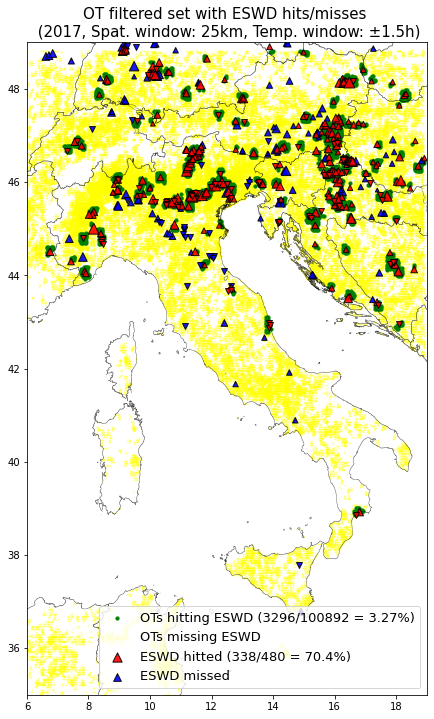

In [420]:
fig, ax = plt.subplots(figsize = (20,12))

plt.ylim(y_lim) #y_lim
plt.xlim(x_lim)  #x_lim

#OTs HITTING:
filt_OTset_land_HITTING_eswd_uniq_2017.plot(ax=ax, markersize=10, column='otpmax', color='green',
                                  zorder=2, label='OTs hitting ESWD (3296/100892 = 3.27%)')   

filt_OTset_land_MISSING_eswd_2017.plot(ax=ax, markersize=1, column='otpmax', color='yellow',
                                  zorder=1,alpha=0.3, label='OTs missing ESWD') 

#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=3)

#ESWD REPORTS:

#HITTED
#divide dataset in subsets with info on size of hail or not:
filt_eswd_HITTED_uniq_2017_NOsize = filt_eswd_HITTED_uniq_2017.loc[np.isnan(filt_eswd_HITTED_uniq_2017['size']) == True].reset_index(drop=True)
filt_eswd_HITTED_uniq_2017_wsize = filt_eswd_HITTED_uniq_2017.loc[np.isnan(filt_eswd_HITTED_uniq_2017['size']) == False].reset_index(drop=True)

pl.scatter(filt_eswd_HITTED_uniq_2017_wsize.lon, filt_eswd_HITTED_uniq_2017_wsize.lat, 
           15*filt_eswd_HITTED_uniq_2017_wsize['size'], c='red',marker="^", edgecolor='k',alpha=0.9, zorder=5, 
           label='ESWD hitted (338/480 = 70.4%)')
pl.scatter(filt_eswd_HITTED_uniq_2017_NOsize.lon, filt_eswd_HITTED_uniq_2017_NOsize.lat, 35,
                c='red',marker="v", edgecolor='k',alpha=0.9,zorder=5)
#MISSED
#divide dataset in subsets with info on size of hail or not:
filt_eswd_MISSED_2017_NOsize = filt_eswd_MISSED_2017.loc[np.isnan(filt_eswd_MISSED_2017['size']) == True].reset_index(drop=True)
filt_eswd_MISSED_2017_wsize = filt_eswd_MISSED_2017.loc[np.isnan(filt_eswd_MISSED_2017['size']) == False].reset_index(drop=True)

pl.scatter(filt_eswd_MISSED_2017_wsize.lon, filt_eswd_MISSED_2017_wsize.lat, 15*filt_eswd_MISSED_2017_wsize['size'],
           c='blue',marker="^", edgecolor='k',alpha=0.9, zorder=4, label='ESWD missed') 
pl.scatter(filt_eswd_MISSED_2017_NOsize.lon, filt_eswd_MISSED_2017_NOsize.lat, 35,
           c='blue',marker="v", edgecolor='k',alpha=0.9, zorder=4)   


#cell.plot(ax=ax, facecolor="none", edgecolor='grey');
plt.title('OT filtered set with ESWD hits/misses \n (2017, Spat. window: 25km, Temp. window: ±1.5h)',
          fontsize=15);
plt.legend(loc='best', fontsize=13)

plt.savefig('/home/ciccuz/phd/KIT/scripts/plots/OT_filter_validation/vsESWD_2016-2018/OTfilt_eswd_valid_2017.png', 
            dpi=300, bbox_inches='tight');

#### - Analysis valid. ESWD for 2018 alone:

In [42]:
#define which set to consider for validation: filt_ or all_ 
OTset = all_OTset_2018_land

In [43]:
eswd_HITTED = gpd.GeoDataFrame(columns=eswd.columns)
OTset_HITTING = gpd.GeoDataFrame(columns=OTset.columns)

#loop on OT detections
for OT_ind in OTset.index:
    
    OT = OTset[OTset.index == OT_ind]

    OTyear = int(OT.time.apply(lambda x: x.year))
    OTmonth = int(OT.time.apply(lambda x: x.month))
    OTday = int(OT.time.apply(lambda x: x.day))
    OThour = int(OT.time.apply(lambda x: x.hour))
    
    print(OT_ind)

    #select day before and above of OT timing
    OTtime_dAbove = pd.to_datetime(OT.time.item() + pd.to_timedelta(1, unit='d'))
    OTtime_dBefore = pd.to_datetime(OT.time.item() - pd.to_timedelta(1, unit='d'))
    OTtime_dAbove = OTtime_dAbove.replace(tzinfo=None)
    OTtime_dBefore = OTtime_dBefore.replace(tzinfo=None)

    #define eswd subset in the 3 days (before,present,and future) around OT timing: 
    #(this is done to make the loop more efficient!)
    """
    This step could be even more efficient by selecting directly only reports in a 1.5h temp window, for the moment
    lets try with +-1day and see if it is still too slow
    """
    eswd_subset = eswd_2018[(eswd_2018.datetime >= OTtime_dBefore) & (eswd_2018.datetime <= OTtime_dAbove)]
    
    #loop on eswd reports
    for eswd_ind in eswd_subset.index:

        #calculate time delta between OT and eswd report:
        tdelta = pd.Timedelta(abs(OT.time.values[0] - eswd_subset.datetime[eswd_subset.index == eswd_ind].values[0]))
        
        #condition: if difference between OT and report timing is smaller than (+-)1.5h keep the report
        if tdelta <= timedelta(minutes=90):
            
            #condition on spatial neighbourhood: if eswd report falls inside OT box:
            if eswd_subset.geometry[eswd_ind].within(OTset.geometry_25km_box[OT_ind]):

                print('Hit!')
                eswd_HITTED = eswd_HITTED.append(eswd_subset[eswd_subset.index == eswd_ind])

                OTset_HITTING = OTset_HITTING.append(OTset[OTset.index == OT_ind])
    
"""
ALLA FINE DI TUTTO BISOGNA RIPULARE I DATASET HITTED E HITTING DAI DOPPIONI!
"""

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
40
41
42
43
44
45
46
47
87
88
89
90
91
92
93
111
112
113
114
115
116
117
118
125
126
127
128
129
130
132
133
134
135
136
140
141
142
143
144
145
146
147
148
149
150
151
155
159
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
229
230
231
232
233
237
238
239
244
245
248
310
311
312
313
314
315
316
317
318
319
320
321
322
323
324
325
326
327
328
329
330
331
332
333
334
335
336
337
338
339
340
341
342
343
344
345
346
347
348
349
350
351
352
353
354
355
356
357
358
359
360
361
362
363
364
365
366
367
373
374
375
376
377
378
379
380
381
382
383
384
385
386
387
388
435
436
437
438
439
440
441
442
443
444
445
446
447
448
449
451
469
470
471
472
473
474
475
476
477
478
479
480
481
482
483
484
485
486
487
488
489
490
491

3353
3354
3355
3356
3357
3358
3359
3360
3361
3362
3363
3364
3365
3366
3367
3368
3369
3402
3403
3404
3405
3406
3407
3408
3409
3410
3411
3412
3413
3414
3415
3416
3417
3418
3419
3420
3421
3422
3423
3424
3425
3426
3427
3428
3429
3430
3431
3432
3433
3434
3435
3436
3437
3438
3439
3440
3441
3442
3443
3444
3445
3446
3447
3448
3449
3450
3451
3452
3453
3454
3455
3456
3457
3458
3459
3460
3461
3462
3463
3464
3465
3466
3467
3468
3469
3470
3471
3472
3473
3474
3475
3476
3477
3478
3479
3480
3481
3482
3483
3484
3485
3486
3487
3488
3489
3490
3491
3492
3493
3494
3495
3496
3497
3498
3499
3500
3501
3502
3503
3504
3505
3506
3507
3508
3509
3510
3511
3512
3513
3514
3515
3516
3517
3518
3519
3520
3521
3522
3523
3524
3525
3526
3527
3528
3529
3530
3531
3532
3533
3534
3535
3536
3537
3538
3539
3540
3541
3542
3543
3544
3545
3546
3547
3548
3549
3550
3551
3552
3553
3554
3555
3556
3557
3558
3559
3560
3561
3562
3563
3564
3565
3566
3567
3568
3569
3570
3571
3572
3573
3574
3575
3576
3577
3578
3579
3580
3581
3582
3583
3584


5148
5149
5150
5151
5152
5153
5154
5155
5156
5157
5158
5159
5160
5161
5162
5163
5164
5165
5166
5167
5168
5169
5170
5171
5172
5173
5174
5175
5176
5177
5178
5179
5180
5181
5182
5183
5184
5185
5186
5187
5188
5189
5190
5193
5194
5195
5196
5197
5198
5199
5200
5201
5202
5203
5204
5205
5206
5207
5208
5209
5210
5211
5212
5213
5214
5215
5216
5217
5218
5219
5220
5221
5222
5223
5224
5225
5226
5227
5228
5229
5230
5231
5232
5233
5234
5235
5236
5237
5238
5239
5240
5250
5251
5252
5253
5254
5255
5256
5257
5258
5259
5260
5261
5262
5263
5264
5265
5266
5267
5268
5269
5270
5271
5272
5273
5274
5275
5279
5280
5281
5282
5283
5284
5285
5286
5287
5288
5289
5290
5291
5292
5293
5294
5295
5296
5297
5298
5299
5300
5301
5302
5303
5304
5305
5306
5307
5308
5309
5310
5311
5312
5313
5314
5315
5316
5317
5318
5319
5320
5321
5322
5323
5324
5325
5326
5327
5328
5329
5330
5331
5332
5333
5334
5335
5336
5337
5338
5339
5340
5341
5342
5343
5344
5345
5346
5347
5348
5349
5350
5351
5352
5353
5354
5355
5356
5357
5358
5359
5360
5361


7795
7796
7797
7798
7799
7800
7801
7802
7803
7804
7805
7806
7807
7808
7809
7810
7811
7812
7813
7814
7815
7816
7817
7818
7819
7820
7821
7822
7823
7824
7825
7826
7827
7828
7829
7830
7831
7832
7833
7834
7835
7836
7837
7838
7839
7840
7841
7842
7843
7844
7845
7846
7847
7848
7849
7850
7851
7852
7853
7854
7855
7856
7857
7858
7859
7860
7861
7862
7863
7864
7865
7866
7867
7868
7869
7870
7871
7872
7873
7874
7875
7876
7877
7878
7879
7880
7881
7882
7883
7884
7885
7886
7887
7888
7889
7890
7891
7892
7893
7894
7895
7896
7897
7898
7899
7900
7936
7937
7938
7939
7940
7941
7942
7943
7944
7945
7946
7947
7948
7949
7950
7951
7952
7953
7954
7955
7956
7957
7958
7959
7960
7961
7962
7963
7964
7965
7966
7967
7968
7969
7970
7971
7972
7973
7974
7975
7976
7977
7978
7979
7980
7981
7982
7983
7984
7985
7986
7987
7988
7989
7990
7991
7992
7993
7994
7995
7996
7997
7998
7999
8000
8001
8002
8003
8004
8005
8006
8007
8008
8009
8010
8011
8012
8013
8014
8015
8016
8017
8018
8019
8020
8021
8022
8023
8024
8025
8026
8027
8028
8029


10685
10686
10687
Hit!
Hit!
Hit!
Hit!
10688
Hit!
Hit!
Hit!
Hit!
Hit!
10689
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
10690
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
10691
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
10692
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
10693
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
10694
Hit!
10695
Hit!
10696
Hit!
10697
10698
10699
Hit!
10700
Hit!
10701
Hit!
10702
10703
10704
10705
10706
10707
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
10708
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
10709
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
10710
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
10711
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
10712
Hit!
Hit!
Hit!
Hit!
10713
Hit!
Hit!
Hit!
10714
Hit!
Hit!
10715
Hit!
Hit!
Hit!
10716
Hit!
Hit!
Hit!
10717
Hit!
Hit!
Hit!
10718
10719
10720
10721
Hit!
10722
Hit!
10723
10724
10725
10726
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
10727
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
10728
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
H

11745
11746
11747
11748
11749
11750
11751
11752
11753
11754
11755
11756
11757
11758
11759
11760
11761
11762
11763
11764
11765
11766
11767
11768
11769
11770
11771
11772
11773
11774
11775
11776
Hit!
Hit!
Hit!
Hit!
11777
Hit!
Hit!
Hit!
Hit!
11778
11779
11780
11781
11782
11783
Hit!
Hit!
11784
Hit!
Hit!
Hit!
11785
Hit!
Hit!
Hit!
Hit!
11786
Hit!
Hit!
Hit!
Hit!
11787
Hit!
Hit!
Hit!
Hit!
Hit!
11788
11789
11790
11791
11792
11793
11794
Hit!
Hit!
11795
Hit!
Hit!
Hit!
11796
Hit!
Hit!
Hit!
Hit!
11797
Hit!
Hit!
Hit!
Hit!
11798
11799
11800
11801
11802
11803
11804
11805
11806
11807
Hit!
11808
11809
11810
11811
11812
11813
11814
11815
11816
11817
Hit!
Hit!
11818
Hit!
Hit!
11819
Hit!
Hit!
Hit!
11820
Hit!
Hit!
Hit!
11821
Hit!
Hit!
Hit!
11822
Hit!
Hit!
11823
11824
11825
11826
11827
11828
11829
11830
11831
11832
11833
11834
11835
11836
11837
11838
11839
11840
11841
11842
11843
11844
11845
11846
11847
11848
11849
11850
11851
11852
11853
11854
11855
11856
11857
11858
11859
11860
11861
11862
11863
11864
11865

13649
13650
13651
13652
13653
13654
13655
13656
13657
13658
13659
13660
13661
13662
13663
13664
13665
13666
13667
13668
13669
13670
13671
13672
13673
13674
13675
13676
13677
13678
13679
13680
13681
13682
13683
13684
13685
13686
13687
13690
13691
13692
13693
13697
13700
13701
13702
13703
13704
13705
13706
13707
13708
13709
13710
13711
13712
13713
13714
13715
13716
13717
13718
13719
13720
13721
13722
13723
13724
13725
13726
13727
13728
13729
13730
13731
13732
13733
13734
13735
13736
13737
13738
13739
13740
13741
13742
13745
13746
13747
13748
13749
13750
13751
13753
13754
13755
13756
13757
13758
13759
13760
13761
13762
13766
13767
13768
13769
13770
13771
13772
13773
13774
13775
13776
13777
13778
13779
13780
13781
13782
13783
13784
13785
13786
13787
13788
13789
13790
13791
13792
13793
13794
13795
13796
13797
13798
13799
13800
13802
13807
13818
13819
13823
13824
13826
13827
13830
13836
13838
13839
13840
13841
13842
13843
13844
13845
13846
13847
13848
13849
13850
13851
13852
13853
13854
1385

14970
14971
14972
14973
14974
14975
14976
14977
14978
14979
14980
14981
14982
14983
14984
14985
14986
14987
14988
14989
14990
14991
14992
14993
14994
14995
14996
14997
14998
14999
15000
15001
15002
15003
15004
15005
15006
15007
15008
15009
15010
15011
15012
15013
15014
15015
15016
15017
15018
15019
15020
15021
15022
15023
15024
15025
15026
15027
15028
15029
15030
15031
15032
15033
15034
15035
15036
15037
15038
15039
15040
15041
15042
15043
15044
15045
15046
15047
15048
15049
15050
15051
15052
15053
15054
15055
15056
15057
15058
15059
15060
15061
15062
15063
15064
15065
15066
15067
15068
15069
15070
15071
15072
15073
15074
15075
15076
15077
15078
15079
15080
15081
15082
15083
15084
15085
15086
15087
15088
15089
15090
15091
15092
15093
15094
15095
15096
15097
15098
15099
15100
15101
15102
15103
15104
15105
15106
15107
15108
15109
15110
15111
15112
15113
15114
15115
15116
15117
15118
15119
15120
15121
15122
15123
15124
15125
15126
15127
15128
15129
15130
15131
15132
15133
15134
15135
1513

16377
16378
16379
16380
16381
16382
16383
16384
16385
16386
16387
16388
16389
16390
16391
16392
16393
16394
16395
16396
16397
16398
16399
16400
16401
16402
16403
16404
16405
16406
Hit!
Hit!
16407
Hit!
Hit!
16408
Hit!
16409
Hit!
Hit!
16410
Hit!
Hit!
16411
Hit!
Hit!
16412
Hit!
16413
Hit!
16414
Hit!
16415
Hit!
Hit!
16416
Hit!
Hit!
16417
Hit!
Hit!
16418
Hit!
16419
16420
Hit!
16421
Hit!
16422
Hit!
16423
Hit!
Hit!
16424
Hit!
Hit!
16425
Hit!
Hit!
16426
16427
16428
Hit!
16433
16434
16435
16436
16437
16438
16439
16440
16441
16442
16443
Hit!
16444
Hit!
16445
Hit!
16446
Hit!
Hit!
16447
16448
Hit!
16449
Hit!
16450
Hit!
16451
Hit!
Hit!
16452
Hit!
Hit!
16453
Hit!
Hit!
16454
Hit!
Hit!
16455
Hit!
Hit!
16456
16457
Hit!
16458
Hit!
16459
Hit!
16460
Hit!
Hit!
16461
Hit!
Hit!
16462
Hit!
Hit!
16463
Hit!
16464
Hit!
Hit!
16465
Hit!
16466
Hit!
16467
Hit!
Hit!
16468
Hit!
Hit!
16469
Hit!
Hit!
16470
Hit!
16471
Hit!
Hit!
16472
Hit!
Hit!
16473
Hit!
16474
Hit!
Hit!
16475
Hit!
Hit!
16476
Hit!
Hit!
16477
Hit!
16478
Hi

17815
17816
17817
17818
17819
17820
17821
17822
17823
17824
17825
17826
17827
17828
17829
17830
17831
17832
17833
17834
17835
17836
17837
17838
17839
17840
17841
17842
17843
17844
17845
17846
17847
17848
17849
17850
17851
17852
17853
17854
17855
17856
17857
17858
17859
17860
17861
17862
17863
17864
17865
17866
17867
17868
17869
17870
17871
17872
17873
17874
17875
17876
17877
17878
17879
17880
17881
17882
17883
17884
17885
17886
17887
17888
17889
17890
17891
17892
17893
17894
17895
17896
17897
17898
17899
17900
17901
17902
17903
17904
17905
17906
17907
17908
17909
17910
17911
17912
17913
17914
17915
17916
17917
17918
17919
17920
17921
17922
17923
17924
17925
17926
17927
17928
17929
17930
17931
17932
17933
17934
17935
17936
17937
17938
17939
17940
17941
17942
17943
17944
17945
17946
17947
17948
17949
17950
17951
17952
17953
17954
17955
17956
17957
17958
17959
17960
17961
17962
17963
17964
17965
17966
17967
17968
17969
17970
17971
17972
17973
17974
17975
17976
17977
17978
17979
17980
1798

19124
19125
19126
19127
19128
19129
19130
19131
19132
19133
19134
19135
19136
19137
19138
19139
19140
19141
19142
19143
19144
19145
19146
19147
19148
19149
19150
19151
19152
19153
19154
19155
19156
19157
19158
19159
19160
19161
19162
19163
19164
19165
19166
19167
19168
19169
19170
19171
19172
19173
19174
19175
19176
19177
19178
19179
19180
19181
19182
19183
19184
19185
19186
19187
19188
19189
19190
19191
19192
19193
19194
19195
19196
19197
19198
19199
19200
19201
19202
19203
19204
19205
19206
19207
19208
19209
19210
19211
19212
19213
19214
19215
19216
19217
19218
19219
19220
19221
19222
19223
19224
19225
19226
19227
19228
19229
19230
19231
19232
19233
19234
19235
19236
19237
19238
19239
19240
19241
19242
19243
19244
19245
19246
19247
19248
19249
19250
19251
19252
19253
19254
19255
19256
19257
19258
19259
19260
19261
19262
19263
19264
19265
19266
19267
19268
19269
19270
19271
19272
19273
19274
19275
19276
19277
19278
19279
19280
19281
19282
19283
19284
19285
19286
19287
19288
19289
1929

20481
20482
20483
20484
20485
20486
20487
20488
20489
20490
20491
20492
20493
20494
20495
20496
20497
20498
20499
20500
20515
20516
20517
20527
20562
20563
20597
20598
20599
20600
20601
20602
20603
20604
20605
20606
20607
20608
20609
20610
20611
20612
20613
20614
20615
20616
20617
20618
20619
20620
20621
20622
20623
20624
20625
20626
20627
20628
20629
Hit!
20630
Hit!
20631
Hit!
Hit!
Hit!
20632
Hit!
Hit!
20633
20634
20635
20636
20637
20638
20639
20640
20641
20642
20643
20644
20645
20646
20647
20648
20649
20650
20651
20652
20653
20654
20655
Hit!
Hit!
Hit!
20656
Hit!
Hit!
Hit!
20658
20659
20660
20661
20662
20663
20664
20665
20666
20667
20668
20669
20670
20671
20672
20673
20674
20675
20676
20677
20678
20679
20680
20681
20682
20683
20684
20685
20686
20687
20688
20689
20690
20691
20692
20693
20694
20695
20696
20697
20698
20699
20700
20701
20702
20703
20704
20705
20706
20707
20708
20709
20710
20711
20712
20713
20714
20715
20716
20717
20718
20719
20720
20721
20722
20723
20724
20725
20726
20727

22042
22043
22044
22045
22046
22047
22048
22049
22050
22051
22052
22053
22054
22055
22056
22057
22058
22059
22060
22061
22062
22063
22064
22065
22066
22067
22068
22069
22070
22071
22072
22073
22074
22075
22076
22077
22078
22079
22080
22081
22082
22083
22084
22085
22086
22087
22088
22089
22090
22091
22092
22093
22094
22095
22096
22097
22098
22099
22100
22101
22102
22103
22104
22105
22106
22107
22108
22109
22110
22111
22112
22113
22114
22115
22116
22117
22118
22119
22120
22121
22122
22123
22124
22125
22126
22127
22128
22129
22130
22131
22132
22133
22134
22135
22136
22137
22138
22139
22140
22141
22142
22143
22144
22145
22146
22147
22148
22149
22150
22151
22152
22153
22154
22155
22156
22157
22158
22159
22160
22161
22162
22163
22164
22165
22166
22167
22168
22169
22170
22171
22172
22173
22174
22175
22176
22177
22178
22179
22180
22181
22182
22183
22184
22185
22186
22187
22188
22189
22190
22191
22192
22193
22194
22195
22196
22197
22198
22199
22200
22201
22202
22203
22204
22205
22206
22207
2220

23490
23491
23492
23493
23494
23495
23496
23497
23498
23499
23500
23501
23502
23503
23504
23505
23506
23507
23508
23509
23517
23518
23519
23520
23531
23532
23533
23534
23535
23536
23539
23540
23541
23542
23543
23544
23545
23546
23547
23548
23549
23550
23551
23552
23553
23554
23555
23556
23557
23558
23559
23560
23561
23562
23563
23564
23565
23566
23567
23568
23569
23570
23571
23572
23573
23574
23575
23576
23577
23578
23579
23580
23581
23582
23583
23584
23585
23586
23587
23588
23589
23590
23591
23592
23593
23594
23595
23596
23597
23598
23599
23600
23601
23602
23603
23604
23605
23606
23607
23608
23609
23610
23611
23612
23613
23614
23615
23616
23617
23618
23619
23620
23621
23622
23623
23624
23625
23626
23627
23628
23629
23630
23631
23632
23633
23634
23635
23636
23638
23639
23640
23641
23642
23643
23644
23645
23646
23647
23648
23649
23650
23651
23652
23653
23654
23655
23656
23657
23658
23659
23660
23661
23662
23663
23664
23665
23666
23667
23668
23669
23670
23671
23672
23673
23674
23675
2367

26274
26275
26276
26277
26308
26309
26310
26311
26312
26313
26314
26315
26316
26317
26318
26319
26320
26321
26322
26323
26324
26325
26326
26327
26328
26329
26330
26331
26332
26333
26334
26335
26336
26337
26338
26339
26340
26341
26342
26343
26344
26345
26358
26359
26360
26361
26362
26363
26364
26365
26366
26367
26368
26369
26370
26371
26372
26373
26374
26375
26376
26377
26379
26380
26397
26398
26399
26400
26401
26402
26403
26404
26405
26406
26407
26408
26409
26410
26411
26412
26413
26414
26415
26416
26417
26418
26419
26420
26421
26422
26423
26424
26425
26426
26427
26428
26429
26430
26431
26432
26433
26434
26435
26436
26437
26438
26439
26440
26441
26442
26443
26444
26445
26446
26447
26448
26485
26486
26487
26488
26489
26492
26493
26566
26567
26568
26569
26570
26571
26572
26595
26596
26597
26598
26599
26600
26601
26602
26603
26604
26605
26606
26607
26608
26609
26610
26611
26612
26613
26614
26615
26616
26617
26618
26619
26620
26621
26622
26623
26624
26625
26626
26627
26628
26629
26630
2663

28136
28137
28138
28139
28140
28141
28142
28143
28144
28145
28146
28147
28148
28149
28150
28151
28152
28153
28154
28155
28156
28157
28158
28159
28160
28161
28162
28163
28164
28165
28166
28167
28168
28169
28170
28171
28172
28173
28174
28175
28176
28177
28178
28179
28180
28181
28182
28183
28184
28185
28186
28187
28188
28189
28190
28191
28192
28193
28194
28195
28196
28197
28198
28199
28200
28201
28202
28203
28204
28205
28206
28207
28208
28209
28210
28211
28212
28213
28214
28215
28216
28217
28218
28219
28220
28221
28222
28223
28224
28225
28226
28227
28228
28229
28230
28231
28232
28233
28234
28235
28236
28237
28238
28239
28240
28241
28242
28243
28244
28245
28246
28247
28248
28249
28250
28251
28252
28253
28254
28255
28256
28257
28258
28259
28260
28261
28262
28263
28264
28265
28266
28267
28268
28269
28270
28271
28272
28273
28274
28275
28276
28277
28278
28279
28280
28281
28282
28283
28284
28285
28286
28287
28288
28289
28290
28291
28292
28293
28294
28295
28296
28297
28298
28299
28300
28301
2830

29512
29513
29514
29515
29516
29517
29518
29519
29520
29521
29522
29523
29524
29525
29526
29527
29528
29529
29530
29531
29532
29533
29534
29535
29536
29537
29538
29539
29540
29541
29542
29543
29544
29545
29546
29547
29548
29549
29550
29551
29552
29553
29554
29555
29556
29557
29558
29559
29560
29561
29562
29563
29564
29565
29566
29567
29568
29569
29570
29571
29572
29573
29574
29575
29576
29577
29578
29579
29580
29581
29582
29583
29584
29585
29586
29587
29588
29589
29590
29591
29592
29593
29594
29595
29596
29597
29598
29599
29600
29601
29602
29603
29604
29605
29606
29607
29608
29609
29610
29611
29612
29613
29614
29615
29616
29617
29618
29619
29620
29621
29622
29623
29624
29625
29626
29627
29628
29629
29630
29631
29632
29633
29634
29635
29636
29637
29638
29639
29640
29641
29642
29643
29644
29645
29646
29647
29648
29649
29650
29651
29652
29653
29654
29655
29656
29657
29658
29659
29660
29661
29662
29663
29664
29665
29666
29667
29668
29669
29670
29671
29672
29673
29674
29675
29676
29677
2967

30843
30844
30845
30846
30847
30848
30849
30850
30851
30852
30853
30854
30855
30856
30857
30858
30859
30860
30861
30862
30863
30864
30865
30866
30867
30868
30869
30870
30871
30872
30873
30874
30875
30876
30877
30878
30879
30880
30881
30882
30883
30884
30885
30886
30887
30888
30889
30890
30891
30892
30893
30894
30895
30896
30897
30898
30899
30900
30901
30902
30903
30904
30905
30906
30907
30908
30909
30910
30911
30912
30913
30914
30915
30916
30917
30918
30919
30920
30921
30922
30923
30924
30925
30926
30927
30928
30929
30930
30931
30932
30933
30934
30935
30936
30937
30938
30939
30940
30941
30942
30943
30944
30945
30946
30947
30948
30949
30950
30951
30952
30953
30954
30955
30956
30957
30958
30959
30960
30961
30962
30963
30964
30965
30966
30967
30968
30969
30970
30971
30972
30973
30974
30975
30976
30977
30978
30979
30980
30981
30982
30983
30984
30985
30986
30987
30988
30989
30990
30991
30992
30993
30994
30995
30996
30997
30998
30999
31000
31001
31002
31003
31004
31005
31006
31007
31008
3100

32228
32229
32230
32231
32232
32233
32234
32235
32236
32237
32238
32239
32240
32241
32242
32243
32244
32245
32246
32247
32248
32249
32250
32251
32252
32253
32254
32255
32256
32257
32258
32259
32260
32261
32262
32263
32264
32265
32266
32267
32268
32269
32270
32271
32272
32273
32274
32275
32276
32277
32278
32279
32280
32281
32282
32283
32284
32285
32286
32287
32288
32289
32290
32291
32292
32293
32294
32295
32296
32297
32298
32299
32300
32301
32302
32303
32304
32305
32306
32307
32308
32309
32310
32311
32312
32313
32314
32315
32316
32317
32318
32319
32320
32321
32322
32323
32324
32325
32326
32327
32328
32329
32330
32331
32332
32333
32334
32335
32336
32337
32338
32339
32340
32341
32342
32343
32344
32345
32346
32347
32348
32349
32350
32351
32352
32353
32354
32355
32356
32357
32358
32359
32360
32361
32362
32363
32364
32365
32366
32367
32368
32369
32370
32371
32372
32373
32374
32375
32376
32377
32378
32379
32380
32381
32382
32383
32384
32385
32386
32387
32388
32389
32390
32391
32392
32393
3239

33578
33579
33580
33581
33582
33583
33584
33585
33586
33587
33588
33589
33590
33591
33592
33593
33594
33595
33596
33597
33598
33599
33600
33601
33602
33603
33604
33605
33606
33607
33608
33609
33610
33611
33612
33613
33614
33615
33616
33617
33618
33619
33620
33621
33622
33623
33624
33625
33626
33627
33628
33629
33630
33631
33632
33633
33634
33635
33636
33637
33638
33639
33640
33641
33642
33643
33644
33645
33646
33647
33648
33649
33650
33651
33652
33653
33654
33655
33656
33657
33658
33659
33660
33661
33662
33663
33664
33665
33666
33667
33668
33669
33670
33671
33672
33673
33674
33675
33676
33677
33678
33679
33680
33681
33682
33683
33684
33685
33686
33687
33688
33689
33691
33692
33693
33694
33695
33696
33697
33698
33699
33700
33701
33702
33703
33704
33705
33706
33707
33708
33709
33710
33711
33712
33713
33714
33715
33716
33717
33718
33719
33720
33721
33722
33723
33724
33725
33726
33727
33728
33729
33730
33731
33732
33733
33734
33735
33736
33737
33738
33739
33740
33741
33742
33743
33744
3374

35230
35231
35232
35233
35234
35235
35236
35237
35238
35239
35240
35241
35242
35243
35244
35245
35246
35247
35248
35249
35250
35251
35252
35253
35254
35255
35256
35257
35258
35259
35260
35261
35262
35263
35264
35265
35266
35267
35268
35269
35270
35271
35272
35273
35274
35275
35276
35277
35278
35279
35280
35281
35282
35283
35284
35285
35286
35287
35288
35289
35290
35291
35292
35293
35294
35295
35296
35297
35298
35299
35300
35301
35302
35303
35304
35305
35306
35307
35308
35309
35310
35311
35312
35313
35314
35315
35316
35317
35318
35319
35320
35321
35322
35323
35324
35325
35326
35327
35328
35329
35330
35331
35332
35333
35334
35335
35336
35337
35338
35339
35340
35341
35342
35343
35344
35345
35346
35347
35348
35349
35350
35351
35352
35353
35354
35355
35356
35357
35358
35359
35360
35361
35362
35363
35364
35365
35366
35367
35368
35369
35370
35371
35372
35373
35374
35375
35376
35377
35378
35379
35380
35381
35382
35383
35384
35385
35386
35387
35388
35389
35390
35391
35392
35393
35394
35395
3539

36882
36883
36884
36885
36886
36887
36888
36889
36890
36891
36892
36893
36894
36895
36896
36897
36898
36899
36900
36901
36902
36903
36904
36905
36906
36907
36908
36909
36910
36911
36912
36913
36914
36915
36916
36917
36918
36919
36920
36983
36984
36985
36986
36987
36988
36989
36990
36991
36992
36993
36994
36995
36996
36997
36998
36999
37000
37001
37002
37003
37004
37005
37006
37007
37008
37009
37010
37011
37012
37013
37014
37015
37016
37017
37018
37019
37020
37021
37022
37023
37024
37025
37026
37027
37028
37029
37030
37031
37032
37033
37034
37035
37036
37037
37038
37039
37040
37041
37042
37043
37112
37113
37114
37115
37116
37117
37118
37119
37120
37121
37122
37123
37124
37125
37126
37127
37128
37129
37130
37131
37132
37133
37134
37135
37136
37137
37138
37139
37140
37141
37142
37143
37144
37145
37146
37147
37148
37149
37150
37151
37152
37153
37154
37155
37156
37157
37158
37160
37161
37162
37163
37173
37174
37177
37179
37204
37205
37206
37207
37208
37209
37210
37211
37212
37213
37214
3721

38421
38422
38423
38424
38425
38426
38427
38428
38429
38430
38431
38432
38433
38434
38435
38436
38437
38438
38439
38440
38441
38442
38443
38444
38445
38446
38447
38448
38449
38450
38451
38452
38453
38454
38455
38456
38457
38458
38459
38460
38461
38462
38463
38464
38465
38466
38467
38468
38469
38470
38471
38472
38473
38474
38475
38476
38477
38478
38479
38480
38481
38482
38483
38484
38485
38486
38487
38488
38489
38490
38491
38492
38493
38494
38495
38496
38497
38498
38499
38500
38501
38502
38503
38504
38505
38506
38507
38508
38509
38510
38511
38512
38513
38514
38515
38516
38517
38518
38519
38520
38521
38522
38523
38524
38525
38526
38527
38528
38529
38530
38531
38532
38533
38534
38535
38536
38537
38538
38539
38540
38541
38542
38543
38544
38545
38546
38547
38548
38549
38550
38551
38552
38553
38554
38555
38556
38557
38558
38559
38560
38561
38562
38563
38564
38565
38566
38567
38568
38569
38570
38571
38572
38573
38574
38575
38576
38577
38578
38579
38580
38581
38582
38583
38584
38585
38586
3858

39779
39780
39781
39782
39783
39784
39785
39786
39787
39788
39789
39790
39791
39792
39793
39794
39795
39796
39797
39798
39799
39800
39801
39802
39803
39804
39805
39806
39807
39808
39809
39810
39811
39812
39813
39814
39815
39816
39817
39818
39819
39820
39821
39822
39823
39824
39825
39826
39827
39828
39829
39830
39831
39832
39833
39834
39835
39836
39837
39838
39839
39840
39841
39842
39843
39844
39845
39846
39847
39848
39849
39850
39851
39852
39853
39854
39855
39856
39857
39858
39859
39860
39861
39862
39863
39864
39865
39866
39867
39868
39869
39870
39871
39872
39873
39874
39875
39876
39877
39878
39879
39880
39881
39882
39883
39884
39885
39886
39887
39888
39889
39890
39891
39892
39893
39894
39895
39896
39897
39898
39899
39900
39901
39902
39903
39904
39905
39906
39907
39908
39909
39910
39911
39912
39913
39914
39915
39916
39917
39918
39919
39920
39921
39922
39923
39924
39925
39926
39927
39928
39929
39930
39931
39932
39933
39934
39935
39936
39937
39938
39939
39940
39941
39942
39943
39944
3994

41046
41047
41048
41049
41050
41051
41052
41053
41054
41055
41056
41057
41058
41059
41060
41061
41062
41063
41064
41065
41066
41067
41068
41069
41070
41071
41072
41073
41074
41075
41076
41077
41078
41079
41080
41081
41082
41083
41084
41085
41086
41087
41088
41089
41090
41091
41092
41093
41094
41095
41096
41097
41098
41099
41100
41101
41102
41103
41104
41105
41106
41107
41108
41109
41110
41111
41112
41113
41114
41115
41116
41117
41118
41119
41120
41121
41122
41123
41124
41125
41126
41127
41128
41129
41130
41131
41132
41133
41134
41135
41136
41137
41138
41139
41140
41141
41142
41143
41144
41145
41146
41147
41148
41149
41150
41151
41152
41153
41154
41155
41156
41157
41158
41159
41160
41161
41162
41163
41164
41165
41166
41167
41168
41169
41170
41171
41172
41173
41174
41175
41176
41177
41178
41179
41180
41181
41182
41183
41184
41185
41186
41187
41188
41189
Hit!
41190
41191
41192
41193
41194
41195
41196
41197
41198
41199
41200
41201
41202
41203
Hit!
41204
41205
41206
41207
41208
41209
41210


42394
42395
42396
42397
42398
42399
42400
42401
42402
42403
42404
42405
42406
42407
42408
42409
42410
42411
42412
42413
42414
42415
42416
42417
42418
42419
42420
42421
42422
42423
42424
42425
42426
42427
42428
42429
42430
42431
42432
42433
42434
42435
42436
42437
42438
42439
42440
42441
42442
42443
42444
42445
42446
42447
42448
42449
42450
42451
42452
42453
42454
42455
42456
42457
42458
42459
42460
42461
42462
42463
42464
42465
42466
42467
42468
42469
42470
42471
42472
42473
42474
42475
42476
42477
42478
42479
42480
42481
42482
42483
42484
42485
42486
42487
42488
42489
42490
42491
42492
42493
42494
42495
42496
42497
42498
42499
42500
42501
42502
42503
42504
42505
42506
42507
42508
42509
42510
42511
42512
42513
42514
42515
42516
42517
42518
42519
42520
42521
42522
42523
42524
42525
42526
42527
42528
42529
42530
42531
42532
42533
42534
42535
42536
42537
42538
42539
42540
42541
42542
42543
42544
42545
42546
42547
42548
42549
42550
42551
42552
42553
42554
42555
42556
42557
42558
42559
4256

43638
43639
43640
43641
43642
43643
43644
43645
43646
43647
43648
43649
43650
43651
43652
43653
43654
43655
43656
43657
43658
43659
43660
43661
43662
43663
43664
43665
43666
43667
43668
43669
43670
43671
43672
43673
43674
43675
43676
43677
43678
43679
43680
43681
43682
43683
43684
43685
43686
43687
43688
43689
43690
43691
43692
43693
43694
43695
43696
43697
43698
43699
43700
43701
43702
43703
43704
43705
43706
43707
43708
43709
43710
43711
43712
43713
43714
43715
43716
43717
43718
43719
43720
43721
43722
43723
43724
43725
43726
43727
43728
43729
43730
43731
43732
43733
43734
43735
43736
43737
43738
43739
43740
43741
43742
43743
43744
43745
43746
43747
43748
43749
43750
43751
43752
43753
43754
43755
43756
43757
43758
43759
43760
43761
43762
43763
43764
43765
43766
43767
43768
43769
43770
43771
43772
43773
43774
43775
43776
43777
43778
43779
43780
43781
43782
43783
43784
43785
43786
43787
43788
43789
43790
43791
43792
43793
43794
43795
43796
43797
43798
43799
43800
43801
43802
43803
4380

45281
45282
45283
45284
45285
45286
45287
45288
45289
45290
45291
45292
45293
45294
45295
45296
45297
45298
45299
45300
45301
45302
45303
45304
45305
45306
45307
45308
45309
45310
45311
45312
45313
45314
45315
45316
45317
45318
45319
45320
45321
45322
45323
45324
45325
45326
45327
45328
45329
45330
45331
45332
45333
45334
45335
45336
45337
45338
45339
45340
45341
45342
45343
45344
45345
45346
45347
45348
45349
45350
45351
45352
45353
45354
45355
45356
45357
45358
45359
45360
45361
45362
45363
45364
45365
45366
45367
45368
45369
45370
45371
45372
45373
45374
45375
45376
45377
45378
45379
45380
45381
45382
45383
45384
45385
45386
45387
45388
45389
45390
Hit!
45391
Hit!
45392
45393
45394
Hit!
45395
Hit!
45396
Hit!
45397
Hit!
45398
45399
45400
45401
45402
45403
Hit!
45404
Hit!
45405
Hit!
45406
Hit!
45407
45408
45409
45410
45411
45412
Hit!
45413
45414
45415
45416
45417
45418
45419
45420
45421
45422
45423
45424
45425
45426
45427
45428
45429
45430
45431
45432
45433
45434
45435
45436
45437
Hit

46569
46570
46571
46572
46573
46574
46575
46576
46577
46578
46579
46580
46581
46582
46583
46584
46585
46586
46587
46588
46589
46590
46591
46592
46593
46594
46595
46596
46597
46598
46599
46600
46601
46602
46603
46604
46605
46606
46607
46608
46609
46610
46611
46612
46613
46614
46615
46616
46617
46618
46619
46620
46621
Hit!
46622
46623
46624
46625
Hit!
46626
46627
46628
46629
46630
46631
46632
46633
46634
46635
46636
46637
46638
46639
46640
46641
46642
46643
46644
46645
46646
46647
46648
46649
46650
46651
46652
46653
46654
46655
46656
46657
46658
46659
46660
46661
46662
46663
46664
46665
46666
46667
46668
46669
46670
46671
46672
46673
46674
46675
46676
46677
46678
46679
46680
46681
46682
46683
46684
46685
46686
46687
46688
46689
46690
46691
46692
46693
46694
46695
46696
46697
46698
46699
46700
46701
46702
46703
46704
46705
46706
46707
46708
46709
46710
46711
46712
46713
46714
46715
46716
46717
46718
46719
46720
46721
46722
46723
46724
46725
46726
46727
46728
46729
46730
46731
46732
46733


48387
48388
48389
48390
48391
48392
48393
48394
48395
48396
48397
48398
48399
48400
48401
48402
48403
48404
48405
48406
48407
48408
48409
48410
48411
48414
48415
48416
48417
48418
48419
48420
48421
48422
48423
48424
48425
48426
48427
48428
48429
48430
48431
48432
48433
48434
48435
48436
48437
48438
48439
48450
Hit!
48451
Hit!
48452
Hit!
48453
Hit!
48454
48455
Hit!
48456
Hit!
48457
48458
48459
48460
48461
48462
48463
48464
48465
48466
48467
48468
48469
48470
48471
48472
48473
48474
48475
48476
48477
48478
48479
48480
48481
48482
48483
48484
48485
48486
48487
48488
48489
48490
48491
48492
48493
48494
48495
48496
48497
48498
48499
48500
48501
48502
48503
48504
48505
48506
48507
48508
48509
48510
48511
48512
48513
48514
48515
48516
48517
48518
48519
48520
48521
48522
48523
48524
48525
48526
48527
48528
48529
48530
48531
48532
48533
48534
48535
48536
48537
48538
48539
48540
48541
48542
48543
48544
48545
48546
48547
48548
48549
48550
48551
48552
48553
48554
48555
48556
48557
48558
48559
4856

49985
49986
49987
49988
49989
49990
49991
49992
49993
49994
49995
49996
49997
49998
49999
50000
50001
50002
50003
50004
50005
50006
50007
50008
50009
50010
50011
50012
50013
50014
50015
50016
50017
50018
50019
50020
50021
50022
50023
50024
50025
50026
50027
50028
50029
50030
50031
50032
50033
50034
50035
50036
50037
50049
50050
50051
50052
50053
50054
50055
50056
50057
50058
50059
50060
50061
50062
50063
50064
50065
50066
50067
50068
50069
50070
50071
50072
50073
50074
50075
50076
50077
50078
50079
50080
50081
50082
50083
50084
50085
50086
50087
50088
50089
50090
50091
50092
50093
50094
50095
50096
50097
50098
50099
50100
50101
50102
50103
50104
50105
50106
50107
50108
50109
50110
50111
50112
50113
50114
50115
50116
50117
50118
50119
50120
50121
50122
50123
50124
50125
50126
50127
50128
50129
50130
50131
50132
50133
50134
50135
50136
50137
50138
50139
50140
50141
50142
50143
50144
50145
50146
50147
50148
50149
50150
50151
50152
50153
50154
50155
50156
50157
50158
50159
50160
50161
5016

51701
51702
51703
51704
51705
51706
51707
51708
51709
51710
51711
51712
51713
51714
51715
51716
51717
51718
51719
51720
51721
51722
51723
51724
51725
51726
51727
51728
51729
51730
51731
51732
51733
51734
51735
51736
51737
51738
51739
51740
51741
51742
51743
51744
51745
51746
51747
51748
51749
51750
51751
51752
51753
51754
51755
51756
51757
51758
51759
51760
51761
51762
51763
51764
51765
51766
51767
51768
51769
51770
51771
51772
51773
51774
51775
51776
51777
51778
51779
51780
51781
51782
51783
51784
51785
51786
51787
51788
51789
51790
51791
51792
51793
51794
51795
51796
51797
51798
51799
51800
51801
51802
51803
51804
51805
51806
51807
51808
51809
51810
51811
51812
51813
51814
51815
51816
51817
51818
51819
51820
51821
51822
51823
51824
51825
51826
51827
51828
51829
51830
51831
51832
51833
51834
51835
51836
51837
51838
51839
51840
51841
51842
51843
51846
51847
51848
51849
51850
51851
51852
51853
51854
51855
51856
51862
51863
51864
51865
51866
51867
51868
51869
51870
51871
51872
51873
5187

53231
53232
53233
53234
53235
53236
53237
53238
53239
53240
53241
53242
53243
53244
53245
53246
53247
53248
53249
53250
53251
53252
53253
53254
53255
53256
53257
53258
53259
53260
53261
53262
53263
53264
53265
53266
53267
53268
53269
53270
53271
53272
53273
53274
53275
53276
53277
53278
53279
53280
53281
53282
53283
53284
53285
53286
53287
53288
53289
53290
53291
53292
53293
53294
53295
53296
53297
53298
53301
53302
53303
53304
53305
53306
53307
53308
53309
53310
53313
53314
53315
53316
53317
53318
53319
53320
53321
53322
53323
53324
53325
53326
53327
53328
53329
53330
53331
53332
53333
53334
53335
53336
53337
53338
53339
53340
53341
53342
53343
53344
53345
53346
53347
53348
53349
53350
53351
53352
53353
53354
53355
53356
53357
53358
53359
53360
53361
53362
53363
53364
53365
53366
53367
53368
53369
53370
53371
53372
53373
53374
53375
53376
53377
53378
53379
53380
53381
53382
53383
53384
53385
53386
53387
53388
53389
53390
53391
53392
53393
53394
53395
53396
53397
53398
53399
53400
5340

54677
54678
54679
54680
54681
54682
54683
54684
54685
54686
54687
54688
54689
54690
54691
54692
54693
54694
54695
54696
54697
54698
54699
54700
54701
54702
54703
54704
54705
54706
54707
54708
54709
54710
54711
54712
54713
54714
54715
54716
54717
54718
54719
54720
54721
54722
54723
54724
54725
54726
54727
54728
54729
54730
54731
54732
54733
54734
54735
54736
54737
54738
54739
54740
54741
54742
54743
54744
54745
54746
54747
54748
54749
54750
54751
54752
54753
54754
54755
54756
54757
54758
54759
54760
54761
54762
54763
54764
54765
54766
54767
54768
54769
54770
54771
54772
54773
54774
54775
54776
54777
54778
54779
54780
54781
54782
54783
54784
54785
54786
54787
54788
54789
54790
54791
54792
54793
54794
54795
54796
54797
54798
54799
54800
54801
54802
54803
54804
54805
54806
54807
54808
54809
54810
54811
54812
54813
54814
54815
54816
54817
54818
54819
54820
54821
54822
54823
54824
54825
54826
54827
54828
54829
54830
54831
54832
54833
54834
54835
54836
54837
54838
54839
54840
54841
54842
5484

57318
57319
57320
57321
57322
57323
57324
57325
57326
57327
57328
57329
57330
57331
57332
57333
57334
57335
57336
57337
57338
57339
57340
57341
57342
57343
57344
57345
57346
57347
57348
57349
57350
57351
57352
57353
57354
57355
57356
57357
57358
57359
57360
57361
57362
57363
57364
57365
57366
57367
57368
57369
57370
57371
57372
57373
57374
57375
57376
57377
57378
57379
57380
57381
57382
57383
57384
57385
57386
57387
57388
57389
57390
57391
57392
57393
57394
57395
57396
57397
57398
57399
57400
57401
57402
57403
57404
57405
57406
57407
57408
57409
57410
57411
57412
57413
57414
57415
57416
57417
57418
57419
57420
57421
57422
57423
57424
57425
57426
57427
57428
57429
57430
57431
57432
57433
57434
57435
57436
57437
57438
57439
57440
57441
57442
57443
57444
57445
57446
57447
57448
57449
57450
57451
57452
57453
57454
57455
57456
57457
57458
57459
57460
57461
57462
57463
57464
57465
57466
57467
57468
57469
57470
57471
57472
57473
57474
57475
57476
57477
57478
57479
57480
57481
57482
57483
5748

58632
58633
58634
58635
58636
58637
58638
58639
58640
58641
58642
58643
58644
58645
58646
58647
58648
Hit!
Hit!
Hit!
58649
Hit!
Hit!
Hit!
58650
Hit!
Hit!
58651
Hit!
Hit!
58653
58664
58665
58666
58667
58668
58669
58670
58671
58672
58673
58674
58675
58676
58677
58678
58679
58680
58681
58682
58683
58684
58685
58686
58687
58688
58689
58690
58691
58692
58693
58694
58695
58696
58697
58698
58699
58700
58701
58702
58703
58704
58705
58706
58707
58708
58709
58710
58711
58712
58713
58714
58715
58716
58717
58718
58719
58720
58721
58722
58723
58724
58725
58726
58727
58728
58729
58730
58731
58732
58733
58734
58735
58736
58737
58738
58739
58740
58741
58742
58743
58744
58745
58746
58747
58748
58749
58750
58751
58752
58753
58754
58755
58756
58757
58758
58759
58760
58761
58762
58763
58764
58765
58766
58767
58768
58769
58770
58771
58772
58773
58774
58775
58776
58777
58778
58779
58780
58781
58782
58783
58784
58785
58786
58787
58788
58789
58790
58791
58792
58793
58794
58795
58796
58797
58798
58799
58800
58

60037
60038
60039
60040
60041
60042
60043
60044
60045
60046
60047
60048
60049
60050
60051
60052
60053
60054
60055
60056
60057
60058
60059
60060
60061
60062
60063
60064
60065
60066
60067
60068
60069
60070
60071
60072
60073
60074
60075
60076
60077
60078
60079
60080
60081
60082
60083
60084
60085
60086
60087
60088
60089
60090
60091
60092
60093
60094
60095
60096
60097
60098
60099
60100
60101
60102
60103
60104
60105
60106
60107
60108
60109
60110
60111
60112
60113
60114
60115
60116
60117
60118
60119
60120
60121
60122
60123
60124
60125
60126
60127
60128
60129
60130
60131
60132
60133
60134
60135
60136
60137
60138
60139
60140
60141
60142
60143
60144
60145
60146
60147
60148
60149
60150
60151
60152
60153
60154
60155
60156
60157
60158
60159
60160
60161
60162
60163
60164
60165
60166
60167
60168
60169
60170
60171
60172
60173
60174
60175
60176
60177
60178
60179
60180
60181
60182
60183
60184
60185
60186
60187
60188
60189
60190
60191
60192
60193
60194
60195
60196
60197
60198
60199
60200
60201
60202
6020

61478
61479
61480
61481
61482
61483
61484
61485
61486
61487
61488
61489
61490
61491
61492
61493
61494
61495
61496
61497
61498
61499
61500
61501
61502
61503
61504
61505
61506
61507
61508
61509
61510
61511
61512
61513
61514
61515
61516
61517
61518
61519
61520
61521
61522
61523
61524
61525
61526
61527
61528
61529
61530
61531
61532
61533
61534
61535
61536
61537
61538
61539
61540
61541
61542
61543
61544
61545
61546
61547
61548
61549
61550
61551
61552
61553
61554
61555
61556
61557
61558
61559
61560
61561
61562
61563
61564
61565
61566
61567
61568
61569
61570
61571
61572
61573
61574
61575
61576
61577
61578
61579
61580
61581
61582
61583
61584
61585
61586
61587
61588
61589
61590
61591
61592
61593
61594
61595
61596
61597
61598
61599
61600
61601
61602
61603
61604
61605
61606
61607
61608
61609
61610
61611
61612
61613
61614
61615
61616
61617
61618
61619
61620
61621
61622
61623
61624
61625
61626
61627
61628
61629
61630
61631
61632
61633
61634
61635
61636
61637
61638
61639
61640
61641
61642
61643
6164

63357
63358
63359
63360
63361
63362
63363
63364
63365
63366
63367
63368
63369
63370
63371
63372
63373
63374
63375
63376
63377
63378
63379
63380
63381
63382
63383
63384
63385
63386
63387
63388
63389
63390
63391
63392
63393
63394
63395
63396
63397
63398
63399
63400
63401
63405
63406
63407
63408
63409
63410
63411
63412
63413
63414
63415
63416
63417
63418
63419
63420
63421
63422
63423
63424
63425
63426
63427
63428
63431
63432
63433
63434
63435
63436
63437
63438
63439
63440
63441
63442
63443
63444
63445
63446
63447
63448
63449
63450
63451
63452
63453
63454
63455
63456
63457
63458
63459
63460
63461
63462
63463
63464
63465
63466
63467
63468
63469
63470
63471
63472
63473
63474
63475
63476
63477
63478
63479
63480
63481
63482
63483
63484
63485
63486
63487
63488
63489
63490
63491
63492
63493
63494
63495
63496
63497
63498
63499
63500
63501
63502
63503
63504
63505
63506
63507
63508
63509
63510
63511
63512
63513
63514
63515
63516
63517
63518
63519
63520
63521
63522
63523
63524
63525
63526
63527
6352

65313
65314
65315
65316
65317
65318
65319
65320
65321
65322
65323
65324
65325
65326
65327
65328
65329
65330
65331
65332
65333
65334
65335
65336
65337
65338
65339
65340
65341
65342
65343
65344
65345
65346
65347
65348
65349
65350
65351
65352
65353
65354
65355
65356
65357
65358
65359
65360
65361
65362
65363
65364
65365
65366
65367
65368
65369
65370
65371
65372
65373
65374
65375
65376
65377
65378
65379
65380
65381
65382
65383
65384
65385
65386
65387
65388
65389
65390
65391
65392
65393
65394
65395
65396
65397
65398
65399
65400
65401
65402
65403
65404
65405
65406
65407
65408
65409
65410
65411
65412
65413
65414
65415
65416
65417
65418
65419
65420
65421
65422
65423
65424
65425
65426
65427
65428
65429
65430
65431
65432
65433
65434
65435
65436
65437
65438
65439
65440
65441
65442
65443
65444
65445
65446
65447
65448
65449
65450
65451
65452
65453
65454
65455
65456
65457
Hit!
65458
Hit!
65459
Hit!
65460
Hit!
65461
Hit!
65462
65463
65464
65465
65466
Hit!
65467
Hit!
65468
Hit!
65469
Hit!
65470
65471
6

66527
66528
66529
66530
66531
66532
66533
66534
66535
66536
66537
66538
66539
66540
66541
66542
66543
66544
66545
66546
66547
66548
66549
66550
66551
66552
66553
66554
66555
66556
66557
66558
66559
66560
66561
66562
66563
66564
66565
66566
66567
66568
66569
66570
66571
66572
66573
66574
Hit!
Hit!
Hit!
Hit!
66575
Hit!
Hit!
Hit!
Hit!
66576
Hit!
Hit!
Hit!
66577
Hit!
Hit!
Hit!
66578
66579
66580
66581
66582
66583
66584
66585
66586
66587
66588
66589
66590
66591
66592
66593
66594
66595
66596
66597
66598
66599
66600
Hit!
Hit!
Hit!
66601
66602
66603
66604
66605
66606
66607
66608
66609
66610
66611
66612
66613
66614
66615
66616
66617
66618
66619
66620
66621
66622
66623
66624
66625
66626
66627
66628
66629
66630
66631
66632
66633
66634
66635
66636
66637
66638
66639
66640
66641
66642
66643
66644
66645
66646
66647
66648
66649
66650
66651
66652
66653
66654
66655
66656
66657
66658
66659
66660
66661
66662
66663
66664
66665
66666
66667
66668
66669
66670
66671
66672
66673
66674
66675
66676
66677
66678
666

67840
67841
67842
67843
67844
67845
67846
67847
67848
67849
67850
67851
67852
67853
67854
67855
67856
67857
67858
67859
67860
67861
67862
67863
67864
67865
67866
67867
67868
67869
67870
67871
67872
67873
67874
67875
67876
67877
67878
67879
67880
67881
67882
67883
67884
67885
Hit!
67886
Hit!
67887
Hit!
67888
Hit!
67889
67890
67891
Hit!
67892
67893
67894
67895
Hit!
67896
Hit!
67897
Hit!
67898
Hit!
67899
67900
67901
67902
67903
67904
67905
67906
Hit!
67907
67908
67909
67910
67911
67912
67913
67914
67915
67916
67917
67918
67919
67920
67921
67922
Hit!
67923
Hit!
67924
67925
67926
67927
67928
67929
67930
67931
67932
67933
67934
67935
67936
67937
67938
67939
67940
67941
Hit!
67942
67943
67944
67945
Hit!
67946
67947
67948
67949
67950
67951
67952
67953
67954
67955
Hit!
67956
Hit!
67957
67958
67959
67960
Hit!
67961
Hit!
67962
67963
67964
67965
67966
Hit!
67967
Hit!
67968
Hit!
67969
67970
67971
67972
67973
67974
67975
67976
67977
67978
Hit!
67979
Hit!
67980
67981
67982
67983
67984
67985
67986
679

69091
69092
69093
69094
69095
69096
69097
69098
69099
69100
69101
69102
69103
69104
69105
69106
69107
69108
69109
69110
69111
69112
69113
69114
69115
69116
69117
69118
69119
69120
69121
69122
69123
69124
69125
69126
69127
69128
69129
69130
69131
69132
69133
69134
69135
69136
69137
69138
69139
69140
69141
69142
69143
69144
69145
69146
69147
69148
69149
69150
69151
69152
69153
69154
69155
69156
69157
69158
69159
69160
69161
69162
69163
69164
69165
69166
69167
69168
69169
69170
69171
69172
69173
69174
69175
69176
69177
69178
69179
69180
69181
69182
69183
69184
69185
69186
69187
69188
69189
69190
69191
69192
69193
69194
69195
69196
69197
69198
69199
69200
69201
Hit!
69202
Hit!
69203
Hit!
69204
Hit!
69205
Hit!
69206
Hit!
69207
Hit!
69208
Hit!
69209
Hit!
69210
69211
69212
69213
69214
69215
69216
Hit!
69217
Hit!
69218
Hit!
69219
Hit!
69220
Hit!
69221
Hit!
69222
69223
69224
69225
69226
69227
69228
69229
69230
69231
69232
Hit!
69233
Hit!
69234
Hit!
69235
Hit!
69236
Hit!
69237
Hit!
69238
69239
6

70560
70561
70562
70575
70576
70591
70592
70608
70609
70610
70611
70612
70613
70614
70615
70616
70617
70618
70619
70620
70621
70622
70623
70624
70625
70626
70627
70628
70629
70630
70631
70632
70633
70635
70636
70637
70638
70639
70640
70641
70642
70643
70644
70645
70646
70647
70648
70649
70650
70651
70652
70653
70654
70655
70656
70657
70658
70659
70660
70661
70662
70663
70664
70665
70666
70667
70668
70669
70670
70671
70672
70673
70674
70675
70676
70677
70678
70679
70680
70681
70682
70683
70684
70685
70686
70687
70688
70689
70690
70691
70692
70693
70694
70695
70696
70697
70698
70699
70700
70701
70702
70703
70704
70705
70706
70707
70708
70709
70710
70711
70712
70713
70714
70715
70716
70717
70718
70719
70720
70721
70722
70723
70724
70725
70726
70727
70728
70729
70730
70731
70732
70733
70734
70735
70736
70737
70738
70739
70740
70741
70742
70743
70744
70745
70746
70747
70748
70749
70750
70751
70752
70753
70754
70755
70756
70757
70758
70759
70760
70761
70762
70763
70764
70765
70766
70767
7076

72236
72237
72238
72239
72240
72241
72242
72243
72244
72245
72246
72247
72248
72249
72250
72251
72252
72253
72254
72255
72256
72257
72258
72259
72260
72261
72262
72263
72264
72265
72266
72267
72268
72269
72270
72271
72272
72273
72274
72275
72276
72277
72278
72279
72280
72281
72282
72283
72284
72285
72286
72287
72288
72289
72290
72291
72292
72293
72294
72295
72296
72297
72298
72299
72300
72301
72302
72303
72304
72305
72306
72307
72308
72309
72310
72311
72312
72313
72314
72315
72316
72317
72318
72319
72320
72321
72322
72323
72324
72325
72326
72327
72328
72329
72330
72331
72332
72333
72334
72335
72336
72337
72338
72339
72340
72343
72344
72347
72348
72349
72350
72351
72352
72353
72354
72355
72356
72357
72358
72359
72360
72361
72362
72363
72364
72365
72366
72367
72368
72369
72370
72371
72372
72379
72380
72381
72382
72383
72384
72385
72386
72387
72388
72389
72390
72391
72392
72393
72394
72395
72396
72397
72398
72399
72400
72401
72402
72403
72404
72405
72406
72407
72408
72409
72410
72411
7241

75519
75520
75521
75522
75523
75524
75525
75526
75527
75528
75529
75530
75531
75532
75533
75534
75535
75536
75537
75538
75539
75540
75541
75542
75543
75544
75545
75546
75547
75548
75549
75550
75551
75552
75553
75554
75555
75556
75557
75558
75559
75560
75561
75562
75563
75564
75565
75566
75567
75568
75569
75570
75571
75572
75573
75574
75575
75576
75577
75578
75583
75584
75585
75586
75587
75588
75590
75591
75592
75593
75594
75595
75596
75597
75598
75599
75600
75601
75602
75603
75604
75605
75606
75607
75608
75609
75610
75611
75612
75613
75614
75615
75616
75617
75618
75619
75620
75621
75622
75623
75624
75625
75626
75627
75628
75629
75630
75631
75632
75633
75634
75635
75636
75637
75638
75639
75640
75641
75642
75643
75644
75645
75646
75647
75648
75649
75650
75651
75652
75653
75654
75655
75656
75657
75658
75659
75660
75661
75662
75663
75664
75665
75666
75667
75668
75669
75670
75671
75672
75673
75674
75675
75676
75677
75678
75679
75680
75681
75682
75683
75684
75685
75686
75687
75688
75689
7569

78276
78277
78278
78279
78280
78281
78282
78283
78284
78285
78286
78288
78289
78290
78291
78292
78293
78294
78295
78296
78297
78298
78299
78300
78301
78373
78376
78377
78378
78379
78380
78381
78382
78383
78384
78385
78387
78388
78389
78393
78394
78395
78396
78397
78398
78399
78403
78404
78405
78406
78407
78408
78411
78412
78413
78416
78417
78418
78419
78420
78421
78424
78425
78426
78427
78428
78429
78430
78431
78432
78433
78437
78438
78439
78440
78441
78442
78443
78448
78449
78450
78451
78452
78453
78454
78459
78460
78465
78466
78471
78472
78473
78474
78475
78476
78477
78478
78479
78480
78481
78482
78483
78484
78485
78486
78487
78489
78490
78491
78492
78493
78494
78497
78498
78499
78500
78501
78502
78590
78591
78592
78593
78594
78595
78596
78597
78598
78599
78600
78601
78602
78603
78604
78605
78606
78607
78608
78609
78610
78611
78616
78617
78626
78627
78628
78629
78630
78631
78632
78633
78634
78635
78636
78637
78638
78639
78640
78641
78642
78643
78644
78645
78646
78647
78648
78649
7865

80236
80237
80238
80239
80240
80241
80242
80243
80244
80245
80246
80247
80248
80249
80250
80251
80252
80253
80254
80255
80256
80257
80258
80259
80260
80261
80262
80263
80264
80265
80266
80267
80268
80269
80270
80271
80272
80273
80274
80275
80276
80277
80278
80279
80280
80281
80282
80283
80284
80285
80286
80287
80288
80289
80290
80291
80292
80293
80294
80295
80296
80297
80298
80299
80300
80301
80302
80303
80304
80305
80306
80307
80308
80309
80310
80311
80312
80313
80314
80315
80316
80317
80318
80319
80320
80321
80322
80323
80324
80325
80326
80327
80328
80329
80330
80331
80332
80333
80334
80335
80336
80337
80338
80339
80340
80341
80342
80343
80344
80345
80346
80347
80348
80349
80350
80351
80352
80353
80354
80355
80356
80357
80358
80359
80360
80361
80362
80363
80364
80365
80366
80367
80368
80369
80370
80371
80372
80373
80374
80375
80376
80377
80378
80379
80380
80381
80382
80383
80384
80385
80386
80387
80388
80389
80390
80391
80392
80393
80394
80395
80396
80397
80398
80399
80400
80401
8040

81476
81477
81478
81479
81480
81481
81482
81483
81484
81485
81486
81487
81488
81489
81490
81491
81492
81493
81494
81495
81496
81497
81498
81499
81500
81501
81502
81503
81504
81505
81506
81507
81508
81509
81510
81511
81512
81513
81514
81515
81516
81517
81518
81519
81520
81521
81522
81523
81524
81525
81526
81527
81528
81529
81530
81531
81532
81533
81534
81535
81536
81537
81538
81539
81540
81541
81542
81543
81544
81545
81546
81547
81548
81549
81550
81551
81552
81553
81554
81555
81556
81557
81558
81559
81560
81561
81562
81563
81564
81565
81566
81567
81568
81569
81570
81571
81572
81573
81574
81575
81576
81577
81578
81579
81580
81581
81582
81583
81584
81585
81586
81593
81594
81595
81596
81597
81598
81599
81600
81601
81607
81608
81609
81610
81611
81612
81613
81614
81615
81616
81620
81621
81622
81623
81624
81636
81637
81638
81639
81640
81641
81642
81643
81645
81646
81647
81648
81649
81650
81651
81652
81653
81694
81695
81708
81709
81835
81842
81843
81844
81849
81850
81851
81852
81853
81854
8185

85686
85687
85688
85712
85942
85943
85944
85945
85946
85947
85948
85949
85950
85951
85952
85953
85954
85955
85956
85957
85958
85959
85960
85961
85962
85963
85964
85965
85966
85967
85968
85969
85970
85971
85972
85973
85974
85975
85976
85977
85978
85979
85980
85981
85982
85983
85984
85985
85986
85987
85988
85989
85990
85991
85992
85993
85994
85995
85996
85997
85998
85999
86000
86001
86002
86003
86004
86005
86006
86007
86008
86009
86010
86011
86012
86013
86014
86015
86016
86017
86018
86019
86020
86021
86022
86023
86024
86025
86026
86027
86028
86029
86030
86031
86032
86033
86034
86035
86036
86037
86038
86039
86040
86041
86042
86043
86044
86045
86046
86047
86048
86049
86050
86051
86052
86053
86054
86055
86056
86057
86058
86059
86060
86061
86062
86063
86064
86065
86066
86067
86068
86069
86070
86071
86072
86073
86074
86075
86076
86077
86078
86079
86080
86081
86082
86083
86084
86085
86086
86087
86088
86089
86090
86091
86092
86093
86094
86095
86096
86097
86098
86099
86100
86101
86102
86103
8610

87280
87281
87282
87283
87284
87285
87286
87287
87288
87289
87290
87291
87292
87293
87294
87295
87296
87297
87298
87299
87300
87301
87302
87303
87304
87305
87306
87307
87308
87309
87310
87311
87312
87313
87314
87315
87316
87317
87318
87319
87320
87321
87322
87323
87324
87325
87326
87327
87328
87329
87330
87331
87332
87333
87334
87335
87336
87337
87338
87339
87340
87341
87342
87343
87344
87345
87346
87347
87348
87349
87350
87351
87352
87353
87354
87355
87356
87357
87358
87359
87360
87361
87362
87363
87364
87365
87366
87367
87368
87369
87370
87371
87372
87373
87374
87375
87376
87377
87378
87379
87380
87381
87382
87383
87384
87385
87386
87387
87388
87389
87390
Hit!
87391
Hit!
87392
Hit!
87393
Hit!
87394
87395
Hit!
87396
Hit!
87397
Hit!
87398
Hit!
87399
Hit!
87400
87401
87402
87403
87404
Hit!
87405
Hit!
87406
Hit!
87407
Hit!
87408
Hit!
87409
87410
87411
87412
87413
Hit!
87414
Hit!
87415
Hit!
87416
Hit!
87417
87418
87419
87420
87421
87422
87423
87424
87425
87426
87427
87428
87429
87430
8743

88505
88506
88507
88508
88509
88510
88511
88512
88513
88514
88515
88516
88517
88518
88519
88520
88521
88522
88523
88524
88525
88526
88527
88528
88529
88530
88531
88532
88533
88534
88535
88536
88537
88538
88539
88540
88541
88542
88543
88544
88545
88546
88547
88548
88549
88550
88551
88552
88553
88554
88555
88556
88557
88558
88559
88560
88561
88562
88563
88564
88565
88566
88567
88568
88569
88570
88571
88572
88573
88574
88575
88576
88577
88578
88579
88580
88581
88582
88583
88584
88585
88586
88587
88588
88589
88590
88591
88592
88593
88594
88595
88596
88597
88598
88599
88600
88601
88602
88603
88604
88605
88606
88607
88608
88609
88610
88611
88612
88613
88614
88615
88616
88617
88618
88619
88620
88621
88622
88623
88624
88625
88626
88627
88628
88629
88630
88631
88632
88633
88634
88635
88636
88637
88638
88639
88640
88641
88642
88643
88644
88645
88646
88647
88648
88649
88650
88651
88652
88653
88654
88655
88656
88657
88658
88659
88660
88661
88662
88663
88664
88665
88666
88667
88668
88669
88670
8867

90031
90032
90033
90034
90035
90036
90037
90038
90039
90040
90041
90042
90043
90044
90045
90046
90047
90048
90049
90050
90051
90052
90053
90054
90055
90056
90057
90058
90059
90060
90061
90062
90063
90064
90065
90066
90067
90068
90069
90070
90071
90072
90073
90074
90075
90076
90077
90078
90079
90080
90081
90082
90083
90084
90085
90086
90087
90088
90089
90090
90091
90092
90093
90094
90095
90096
90097
90098
90099
90100
90101
90102
90103
90104
90105
90106
90107
90108
90109
90110
90111
90112
90113
90114
90115
90116
90117
90118
90119
90120
90121
90122
90123
90124
90125
90126
90127
90128
90129
90130
90131
90132
90133
90134
90135
90136
90137
90138
90139
90140
90141
90142
90143
90144
90145
90146
90147
90148
90149
90150
90151
90152
90153
90154
90155
90156
90157
90158
90159
90160
90161
90162
90163
90164
90165
90166
90167
90168
90169
90170
90171
90172
90173
90174
90175
90176
90177
90178
90179
90180
90181
90182
90183
90184
90185
90186
90187
90188
90189
90190
90191
90192
90193
90194
90195
90196
9019

91466
Hit!
Hit!
Hit!
91467
Hit!
91468
91469
91470
91471
91472
91473
91474
91475
91476
91477
91478
91479
91480
91481
91482
91483
91484
91485
91486
91487
91488
91489
91490
91491
91492
91493
91494
91495
91496
91497
91498
91499
91500
91501
91502
91503
91504
91505
91506
91507
91508
91509
91510
91511
91512
91513
91514
91515
91516
91517
91518
91519
91520
91521
91522
91523
91524
91525
91526
91527
91528
91529
91530
91531
91532
91533
91534
91535
91536
91537
91538
91539
91540
91541
91542
91543
91544
91545
91546
91547
91548
91549
91550
91551
91552
91553
91554
91555
91556
91557
91558
91559
91560
91561
91562
91563
91564
91565
91566
91567
91568
91569
91570
91571
91572
91573
91574
91575
91576
91577
91578
91579
91580
91581
91582
91583
91584
91585
91586
91587
91588
91589
91590
91591
91592
91593
91594
91595
91596
91597
91598
91599
91600
91601
91602
91603
91604
91605
91606
91607
91608
91609
91610
91611
91612
91613
91614
91615
91616
91617
91618
91619
91620
91621
91622
91623
91624
91625
91626
91627
91628
91

92780
Hit!
92781
Hit!
92782
Hit!
92783
Hit!
92784
Hit!
92785
92786
92787
92788
92789
92790
92791
92792
92793
92794
Hit!
92795
Hit!
92796
Hit!
92797
Hit!
92798
Hit!
92799
Hit!
92800
92801
92802
92803
92804
Hit!
92805
Hit!
92806
Hit!
92807
Hit!
92808
Hit!
92809
92810
Hit!
92811
Hit!
92812
92813
92814
92815
92816
92817
92818
92819
92820
92821
92822
92823
92825
92826
92827
Hit!
92828
Hit!
92829
Hit!
92830
92833
Hit!
92834
Hit!
92835
Hit!
92839
Hit!
92840
Hit!
92844
Hit!
92845
Hit!
92846
Hit!
92850
Hit!
92851
Hit!
92855
Hit!
92858
92859
92860
92861
92862
92863
92864
92865
92866
92867
92868
92869
92870
92871
92872
92873
92874
92875
92876
92877
92878
92879
92880
92881
92882
92883
92887
92888
92889
92890
92891
92892
92893
92894
92895
92896
92897
92898
92899
92900
92901
92902
92903
92904
92905
92906
92907
92908
92909
92910
92911
92912
92913
92914
92915
92916
92917
92918
92919
92920
92921
92922
92923
92924
92925
92926
92927
92928
92929
92930
92931
92932
92933
92934
92935
92936
92937
92938
92939


94875
94876
94877
94878
94879
94880
94881
94882
94883
94884
94885
94886
94887
94888
94889
94890
94891
94892
94893
94894
94895
94896
94897
94898
94899
94900
94901
94902
94903
94904
94905
94906
94907
94908
94909
94910
94911
94912
94913
94914
94915
94916
94917
94918
94919
94920
94921
94922
94923
94924
94925
94926
94927
94928
94929
94930
94931
94932
94933
94934
94935
94936
94946
94947
94948
94949
94950
94951
94952
94953
94954
94955
94956
94957
94958
94959
94960
94961
94962
94963
94964
94965
94966
94967
94968
94969
94970
94971
94972
94973
94974
94975
94976
94977
94978
94979
94980
94981
94982
94983
94984
94985
94986
94987
94988
94989
94990
94991
94992
94993
94994
94995
94996
94997
94998
94999
95000
95001
95002
95003
95004
95005
95006
95007
95008
95009
95010
95064
95070
95071
95072
95073
95074
95081
95083
95084
95085
95086
95087
95096
95102
95103
95107
95109
95110
95117
95118
95129
95130
95131
95140
95141
95157
95158
95169
95170
95171
95172
95173
95183
95184
95185
95186
95187
95188
95189
9519

96894
96895
96896
96897
96898
96899
96900
96901
96902
96903
96904
96905
96906
96907
96908
96909
96910
96911
96912
96913
96914
96915
96916
96917
96918
96919
96920
96921
96922
96923
96924
96925
96926
96927
96928
96929
96930
96931
96932
96933
96934
96935
96936
96937
96938
96939
96940
96941
96942
96943
96944
96945
96946
96947
96948
96949
96950
96951
96952
96953
96954
96955
96956
96957
96958
96959
96960
96961
96962
96963
96964
96965
96966
96967
96968
96969
96970
96971
96972
96973
96974
96975
96976
96977
96978
96979
96980
96981
96982
96983
96984
96985
96986
96987
96988
96989
96990
96991
96992
96993
96994
96995
96996
96997
96998
96999
97000
97001
97002
97003
97004
97005
97006
97007
97008
97009
97010
97011
97012
97013
97014
97015
97016
97017
97018
97019
97020
97021
97022
97023
97024
97025
97026
97027
97028
97029
97030
97031
97032
97033
97034
97035
97036
97037
97038
97039
97040
97041
97042
97043
97044
97045
97046
97047
97048
97049
97050
97051
97052
97053
97054
97055
97056
97057
97058
97059
9706

98175
98176
98177
98178
98179
98180
98181
98182
98183
98184
98185
98186
98187
98188
98189
98190
98191
98192
98193
98194
98195
98196
98197
98198
98199
98200
98201
98202
98203
98204
98205
98206
98207
98208
98209
98210
98211
98212
98213
98214
98215
98216
98217
98218
98219
98220
98221
98222
98223
98224
98225
98226
98227
98228
98229
98230
98231
98232
98233
98234
98235
98236
98237
98238
98239
98240
98241
98242
98243
98244
98245
98246
98247
98248
98249
98250
98251
98252
98253
98254
98255
98256
98257
98258
98259
98260
98261
98262
98263
98264
98265
98266
98267
98268
98269
98270
98271
98272
98273
98274
98275
98276
98277
98278
98279
98280
98281
98282
98283
98284
98285
98286
98287
98288
98289
98290
98291
98292
98293
98294
98295
98296
98297
98298
98299
98300
98301
98302
98303
98304
98305
98306
98307
98308
98309
98310
98311
98312
98313
98314
98315
98316
98317
98318
98319
98320
98321
98322
98323
98324
98325
98326
98327
98328
98329
98330
98331
98332
98333
98334
98335
98336
98337
98338
98339
98340
9834

99545
99551
99552
99553
99554
99555
99556
99557
99558
99578
99579
99580
99583
99584
99585
99586
99591
99592
99593
99594
99595
99596
99597
99599
99600
99601
99602
99603
99604
99605
99606
99609
99610
99611
99612
99613
99614
99615
99616
99617
99618
99619
99620
99623
99624
99625
99626
99627
99628
99629
99630
99631
99632
99633
99634
99635
99636
99637
99638
99639
99640
99641
99642
99644
99645
99646
99647
99648
99649
99650
99651
99652
Hit!
99653
Hit!
99654
99655
99656
99657
Hit!
99658
Hit!
99659
Hit!
99660
Hit!
99662
Hit!
99663
Hit!
99664
Hit!
99668
99669
99670
99671
99672
99673
99674
99675
99676
99677
99678
99679
99680
99681
99682
99683
99684
99685
99686
99687
99688
99689
99690
99691
99692
99693
99694
99695
99696
99697
99698
99699
99700
99701
99702
99703
99704
99705
99706
99707
99708
99709
99710
99711
99712
99713
99714
99715
99716
99717
99718
99719
99720
99721
99722
99723
99724
99725
99726
99727
99728
99729
99730
99731
99732
99733
99734
99735
99736
99737
99738
99739
99740
99741
99742
99743
9

100739
100740
100741
100742
100743
100744
100745
100746
100747
100748
100749
100750
100751
100752
100753
100754
100755
100756
100757
100758
100759
100760
100761
100762
100763
100764
100765
100766
100767
100768
100769
100770
100771
100772
100773
100774
100775
100776
100777
100778
100779
100780
100781
100782
100783
100784
100785
100786
100787
100788
100789
100790
100791
100802
100803
100804
100805
100806
100807
100808
100809
100810
100811
100812
100813
100814
100815
100816
100817
100818
100819
100820
100821
100822
100823
100824
100825
100826
100827
100828
100829
100830
100831
100832
100833
100834
100835
100836
100837
100838
100839
100840
100841
100842
100843
100844
100845
100846
100847
100848
100849
100850
100851
100852
100853
100854
100855
100856
100857
100858
100859
100860
100861
100862
100863
100864
100865
100866
100867
100868
100869
100870
100871
100872
100873
100874
100875
100876
100877
100878
100879
100880
100881
100882
100883
100884
100885
100886
100887
100888
100889
100890
100891

102104
102105
102106
102107
102108
102109
102110
102111
102112
102113
102114
102115
102116
102117
102118
102119
102120
102121
102122
102123
102124
102125
102126
102127
102128
102129
102130
102131
102132
102133
102134
102135
102136
102137
102138
102139
102140
102141
102142
102143
102144
102145
102146
102147
102148
102149
102150
102151
102152
102153
102154
102155
102156
Hit!
102157
102158
102159
102160
102161
Hit!
102162
Hit!
102163
Hit!
102164
Hit!
102165
Hit!
102166
102167
102168
102169
102170
102171
102172
102173
Hit!
102174
Hit!
102175
Hit!
102176
Hit!
102177
Hit!
102178
Hit!
102179
102180
102181
102182
102183
102184
102185
102186
102187
102188
102189
102190
102191
Hit!
102192
Hit!
102193
Hit!
102194
102195
102196
102197
102198
102199
102200
102201
102202
102203
102204
Hit!
102205
Hit!
102206
Hit!
102207
102208
102209
102210
102211
102212
102213
102214
102215
102216
102217
102218
102219
102220
102221
102222
102223
102224
102225
102226
102227
102228
102229
102230
102231
102232
102233


103279
103280
103281
103282
103283
103284
103285
103286
103287
103288
103289
103290
103291
103292
103293
103294
103295
103296
103297
103298
103299
103300
103301
103302
103303
103304
103305
103306
103307
103308
103309
103310
103311
103312
103313
103314
103315
103316
103317
103318
103319
103320
103321
103322
103323
103324
103325
103326
103327
103328
103329
103330
103331
103332
103333
103334
103335
103336
103337
103338
103339
103340
103341
103342
103343
103344
103345
103346
103347
103348
103349
103350
103351
103352
103353
103354
103355
103356
103357
103358
103359
103360
103361
103362
103363
103364
103365
103366
103367
103368
103369
103370
103371
103372
103373
103374
103375
103376
103377
103378
103379
103380
103381
103382
103383
103384
103385
103386
Hit!
103387
Hit!
103388
Hit!
103389
Hit!
103390
103391
Hit!
103392
Hit!
103393
Hit!
103394
103395
Hit!
103396
Hit!
103397
103398
103399
103400
103401
103402
103403
103404
103405
103406
103407
103408
103409
103410
103411
103412
103413
103414
103

106693
106694
106695
106696
106697
106698
106699
106700
106701
106702
106703
106704
106705
106706
106707
106708
106709
106710
106711
106712
106713
106714
106715
106716
106717
106718
106719
106720
106721
106722
106723
106724
106725
106726
106727
106728
106729
106730
106731
106732
106733
106734
106735
106736
106750
106751
106752
106753
106754
106755
106756
106757
106758
106759
106760
106761
106762
106763
106764
106765
106766
106767
106768
106769
106770
106771
106772
106773
106774
106775
106776
106777
106778
106779
106780
106781
106782
106783
106784
106785
106786
106787
106788
106789
106790
106791
106792
106793
106814
106815
106816
106817
106818
106819
106820
106821
106822
106823
106824
106825
106826
106827
106828
106829
106830
106831
106832
106833
106834
106835
106836
106837
106838
106839
106840
106841
106842
106843
106844
106845
106846
106847
106848
106849
106850
106851
106852
106853
106854
106855
106856
106884
106885
106892
106893
106899
106900
106907
106908
106909
106913
106914
106915

108206
108207
108208
108209
108210
108211
108212
108213
108214
108215
108216
108217
108218
108219
108220
108221
108222
108223
108224
108225
108226
108227
108228
108229
108230
108231
108232
108233
108234
108235
108236
108237
108238
108239
108240
108241
108242
108243
108244
108245
108246
108247
108248
108249
108250
108251
108252
108253
108254
108255
108256
108257
108258
108259
108260
108261
108262
108263
108264
108265
108266
108267
108268
108269
108270
108271
108272
108273
108274
108275
108276
108277
108278
108279
108280
108281
108282
108283
108284
108285
108286
108287
108288
108289
108290
108291
108292
108293
108294
108295
108296
108297
108298
108299
108300
108301
108302
108303
108304
108305
108306
108307
108308
108309
108310
108311
108312
108313
108314
108315
108316
108321
108322
108323
108324
108325
108326
108327
108328
108329
108330
108331
108332
108333
108334
108335
108336
108337
108338
108339
108340
108341
108342
108343
108344
108345
108346
108347
108348
108349
108350
108351
108352

109411
109412
109413
109414
109415
109416
109417
109418
109419
109420
109421
109422
109423
109424
109425
109426
109427
109428
109429
109430
109431
109432
109433
109434
109435
109436
109437
109438
109439
109440
109441
109442
109443
109444
109445
109446
109447
109448
109449
109450
109451
109452
109453
109454
109455
109456
109457
109458
109459
109460
109461
109462
109463
109464
109465
109466
109467
109468
109469
109470
109471
109472
109473
109474
109475
109476
109477
109478
109479
109480
109481
109482
109483
109484
109485
109486
109487
109488
109489
109490
109491
109492
109493
109494
109495
109496
109497
109498
109499
109500
109501
109502
109503
109504
109505
109506
109507
109508
109509
109510
109511
109512
109513
109514
109515
109516
109517
109518
109519
109520
109521
109522
109523
109524
109525
109526
109527
109528
109529
109530
109531
109532
109533
109534
109535
109536
109537
109538
109539
109540
109541
109542
109543
109544
109545
109546
109547
109548
109549
109550
109551
109552
109553

110596
110597
110598
110599
110600
110601
110602
110603
110604
110605
110606
110607
110608
110609
110610
110611
110612
110613
110614
110615
110616
110617
110618
110619
110620
110621
110622
110623
110629
110630
110631
110632
110633
110634
110635
110636
110637
110638
110639
110640
110641
110642
110643
110644
110645
110646
110647
110648
110649
110650
110651
110652
110653
110672
110673
110674
110675
110676
110677
110678
110679
110680
110681
110682
110683
110684
110685
110686
110687
110688
110689
110690
110691
110692
110693
110694
110695
110696
110697
110698
110699
110700
110701
110702
110703
110704
110705
110706
110707
110708
110709
110710
110711
110712
110713
110714
110715
110716
110719
110720
110721
110723
110724
110725
110726
110727
110728
110729
110730
110731
110732
110738
110739
110740
110741
110742
110743
110744
110745
110746
110747
110748
110749
110750
110751
110752
110753
110754
110755
110756
110761
110764
110765
110766
110767
110768
110769
110770
110771
110772
110773
110774
110775

111813
111814
111815
111816
111817
111818
111819
111820
111821
111822
111823
111824
111825
111826
111827
111828
111829
111830
111831
111832
111833
111834
111835
111836
111837
111838
111839
111840
111841
111842
111843
111844
111845
111846
111847
111848
111849
111850
111851
111852
111853
111854
111855
111856
111857
111858
111859
111860
111861
111862
111863
111864
111865
111866
111867
111868
111869
111870
111871
111872
111873
111874
111875
111876
111877
111878
111879
111880
111881
111882
111883
111884
111885
111886
111887
111888
111889
111890
111891
111892
111893
111894
111895
111896
111897
111898
111899
111900
111901
111902
111903
111904
111905
111906
111907
111908
111909
111910
111911
111912
111913
111914
111915
111916
111917
111918
111919
111920
111921
111922
111923
111924
111925
111926
111927
111928
111929
111930
111931
111932
111933
111934
111935
111936
111937
111938
111939
111940
111941
111942
111943
111944
111945
111946
111947
111948
111949
111950
111951
111952
111953
111954
111955

112981
112982
112983
112984
112985
112986
112987
112988
112989
112990
112991
112992
112993
112994
112995
112996
112997
112998
Hit!
112999
Hit!
113000
113001
113002
113003
113004
113005
Hit!
113006
Hit!
113007
Hit!
113008
113009
113010
113011
113012
113013
113014
113015
Hit!
113016
Hit!
113017
Hit!
113018
Hit!
113019
113020
113021
113022
113023
113024
113025
113026
113027
113028
113029
113030
113031
113032
113033
113034
113035
113036
113037
113038
113039
113040
113041
113042
113043
113044
113045
113046
113047
113048
113049
113050
113051
113052
113053
113054
113055
113056
113057
113058
113059
113060
113061
113062
113063
113064
113065
113066
113067
113068
113069
113070
113071
113072
113073
113074
113075
113076
113077
113078
113079
113080
113081
113082
113083
113084
113085
113086
113087
113088
113089
113090
113091
113092
113093
113094
113095
113096
113097
113098
113099
113100
113101
113102
113103
113104
113105
113106
113107
113108
113109
113110
113111
113112
113113
113114
113115
113116
113

114164
114165
114166
114167
114168
114169
114170
Hit!
114171
Hit!
114172
Hit!
114173
Hit!
114174
114175
114176
114177
114178
Hit!
114179
Hit!
114180
Hit!
114181
Hit!
114182
114183
114184
114185
114186
114187
114188
114189
114190
114191
114192
114193
114194
114195
114196
114197
114198
114199
114200
114201
114202
114203
114204
114205
114206
114207
114208
114209
114210
114211
114212
114213
114214
114215
114216
114217
114218
114219
114220
114221
114222
114223
114224
114225
114226
114227
114228
114229
114230
114231
114232
114233
114234
114235
114236
114237
114238
114239
114240
114241
114242
114243
114244
114245
114246
114247
114248
114249
114250
114251
114252
114253
114254
114255
114256
114257
114258
114259
114260
114261
114262
114263
114264
114265
114266
114267
114268
114269
114270
114271
114272
114273
114274
114275
114276
114277
114278
114279
114280
114281
114282
114283
114284
114285
114286
114287
114288
114289
114290
114291
114292
114293
114294
114295
114296
114297
114298
114299
114300
1

115435
115436
115437
115438
115439
115440
115441
115442
115443
115444
115445
115446
115447
115448
115449
115450
115451
115452
115453
115454
115455
115456
115457
115458
115459
115460
115461
115462
115463
115464
115465
115466
115467
115468
115469
115470
115471
115472
115473
115474
115475
115476
115477
115478
115479
115480
115481
115482
115483
115484
115485
115486
115487
115488
115489
115490
115491
115492
115493
115494
115495
115496
115497
115498
115499
115500
115501
115502
115503
115504
115505
115506
115507
115508
115509
115510
115511
115512
115513
115514
115515
115516
115517
115518
115519
115520
115521
115522
115523
115524
115525
115526
115527
115528
115529
115530
115531
115532
115533
115534
115535
115536
115537
115538
115539
115540
115541
115542
115543
115544
115545
115546
115547
115548
115549
115550
115551
115552
115553
115554
115555
115556
115557
115558
115559
115560
115561
115562
115563
115564
115565
115566
115567
115568
115569
115570
115571
115572
115573
115574
115575
115576
115577

116632
116633
116634
116635
116636
116637
116638
116639
116640
116641
116642
116643
116644
116645
116646
116647
116648
116649
116650
116651
116652
116653
116654
116655
116656
116657
116658
116659
116660
116661
116662
116663
116664
116665
116666
116667
116668
116669
116670
116671
116672
116673
116674
116675
116676
116677
116678
116679
116680
116681
116682
116683
116684
116685
116686
116687
116688
116689
116690
116691
116692
116693
116694
116695
116696
116697
116698
116699
116700
116701
116702
116703
116704
116705
116706
116707
116708
116709
116710
116711
116712
116713
116714
116715
116716
116717
116718
116719
116720
116721
116722
116723
116724
116725
116726
116727
116728
116729
116730
116731
116732
116733
116734
116735
116736
116737
116738
116739
116740
116741
116742
116743
116744
116745
116746
116747
116748
116749
116750
116751
116752
116753
116754
116755
116756
116757
116758
116759
116760
116761
116762
116763
116764
116765
116766
116767
116768
116769
116770
116771
116772
116773
116774

117816
117817
117818
117819
117820
117821
117822
117823
117824
117825
117826
117827
117828
117829
117830
117831
117832
117833
117834
117835
117836
117837
117838
117839
117840
117841
117842
117843
117844
117845
117846
117847
117848
117849
117850
117851
117852
117853
117854
117855
117856
117857
117858
117859
117860
117861
117862
117863
117864
117865
117866
117867
117868
117869
117870
117871
117872
117873
117874
117875
117876
117877
117878
117879
117880
117881
117882
117883
117884
117885
117886
117887
117888
117889
117890
117891
117892
117893
117894
117895
117896
117897
117898
117899
117900
117901
117902
117903
117904
117905
117906
117907
117908
117909
117910
117911
117912
117913
117914
117915
117916
117917
117918
117919
117920
117921
117922
117923
117924
117925
117926
117927
117932
117933
117934
117935
117936
117937
117938
117939
117940
117941
117942
117943
117944
117945
117946
117947
117948
117949
117950
117951
117952
117953
117954
117955
117956
117957
117958
117959
117960
117961
117962

119065
119066
119067
119068
119069
119070
119071
119072
119073
119074
119075
119076
119077
119078
119079
119080
119081
119082
119083
119084
119085
119086
119087
119088
119089
119090
119091
119092
119093
119094
119095
119096
119097
119098
119099
119100
119101
119102
119103
119104
119105
119106
119107
119108
119109
119110
119111
119112
119113
119114
119115
119116
119117
119118
119119
119120
119121
119122
119123
119124
119125
119126
119127
119128
119129
119130
119131
119132
119133
119134
119135
119136
119137
119138
119139
119140
119141
119142
119143
119144
119145
119146
119147
119148
119149
119150
119151
119152
119153
119154
119155
119156
119157
119158
119159
119160
119161
119162
119163
119164
119165
119166
119167
119168
119169
119170
119171
119172
119173
119174
119175
119176
119177
119178
119179
119180
119181
119182
119183
119184
119185
119186
119187
119188
119189
119190
119191
119192
119193
119194
119195
119196
119197
119198
119199
119200
119201
119202
119203
119204
119205
119206
119207

120381
120382
120383
120384
120385
120386
120387
120388
120389
120390
120391
120392
120393
120394
120395
120396
120397
120398
120399
120400
120401
120402
120403
120404
120405
120406
120407
120408
120409
120410
120411
120412
120413
120414
120415
120416
120417
120418
120419
120420
120421
120422
120423
120424
120425
120426
120427
120428
120429
120430
120431
120432
120433
120434
120435
120436
120437
120438
120439
120440
120441
120442
120443
120444
120445
120446
120447
120448
120449
120450
120451
120452
120453
120454
120455
120456
120457
120458
120459
120460
120461
120462
120463
120464
120465
120466
120467
120468
120469
120470
120471
120472
120473
120474
120475
120476
120477
120478
120479
120480
120481
120482
120483
120484
120485
120486
120487
120488
120489
120490
120491
120492
120493
120494
120495
120496
120497
120498
120499
120500
120501
120502
120503
120504
120505
120506
120507
120508
120509
120510
120511
120512
120513
120514
120515
120516
120517
120518
120519
120520
120521
120522
120523

122056
122057
122058
122059
122066
122067
122068
122074
122075
122076
122077
122078
122079
122080
122081
122082
122083
122087
122088
122089
122090
122091
122092
122095
122096
122097
122098
122099
122103
122104
122105
122106
122107
122108
122109
122110
122113
122114
122115
122116
122117
122118
122119
122120
122121
122122
122123
122124
122125
122126
122127
122129
122130
122131
122132
122133
122134
122135
122136
122141
122142
122149
122150
122151
122164
122165
122166
122167
122168
122169
122170
122171
122172
122173
122174
122175
122176
122177
122178
122179
122180
122181
122182
122183
122184
122185
122186
122204
122205
122206
122210
122211
122212
122214
122215
122216
122217
122218
122219
122220
122221
122222
122223
122224
122225
122226
122227
122228
122229
122230
122231
122232
122233
122234
122238
122239
122250
122251
122252
122253
122254
122255
122256
122257
122258
122259
122260
122261
122262
122263
122264
122265
122266
122267
122268
122269
122270
122271
122272
122273
122274
122275
122276

123321
123322
123323
123324
123325
123326
123327
123328
123329
123330
123331
123332
123333
123334
123335
123336
123337
123338
123339
123340
123341
123342
123343
123344
123345
123346
123347
123348
123349
123350
123351
123352
123353
123354
123355
123356
123357
123358
123359
123360
123361
123362
123363
123364
123365
123366
123367
123368
123369
123370
123371
123372
123373
123374
123375
123376
123377
123378
123379
123380
123381
123382
123383
123384
123385
123386
123387
123388
123389
123390
123391
123392
123393
123394
123395
123396
123397
123398
123399
123400
123401
123402
123403
123404
123405
123406
123407
123408
123409
123410
123411
123412
123413
123414
123415
123416
123417
123418
123419
123420
123421
123422
123423
123424
123425
123426
123427
123428
123429
123430
123431
123432
123433
123434
123435
123436
123437
123438
123439
123440
123441
123442
123443
123444
123445
123446
123447
123448
123449
123450
123451
123452
123453
123454
123455
123456
123457
123458
123459
123460
123461
123462
123463

124819
124820
124821
124822
124823
124824
124825
124826
124827
124828
124829
124859
124860
124861
124863
124864
124865
124866
124867
124868
124869
124870
124871
124872
124873
124874
124875
124876
124877
124878
124879
124880
124881
124882
124883
124884
124885
124886
124887
124888
124889
124890
124891
124892
124893
124894
124895
124896
124897
124898
124899
124900
124901
124902
124903
124904
124905
124906
124907
124908
124909
124910
124911
124912
124913
124914
124915
124916
124917
124918
124919
124920
124921
124922
124923
124924
124925
124926
124927
124928
124929
124930
124931
124932
124933
124934
124935
124936
124937
124938
124939
124940
125039
125040
125042
125043
125044
125045
125046
125047
125048
125049
125050
125051
125052
125053
125054
125055
125056
125057
125058
125059
125060
125061
125062
125063
125064
125065
125066
125067
125068
125069
125070
125071
125072
125073
125150
125162
125163
125164
125169
125202
125203
125209
125210
125211
125214
125215
125216
125218
125219
125223
125224

126586
126587
126588
126589
126590
126591
126592
126593
126594
126595
126596
126597
126598
126599
126600
126601
126602
126603
126604
126605
126606
126607
126608
126609
126610
126611
126612
126613
126614
126615
126616
126617
126618
126619
126620
126621
126622
126623
126624
126625
126626
126627
126628
126629
126630
126631
126632
126633
126634
126635
126636
126637
126638
126639
126640
126641
126642
126643
126644
126645
126646
126647
126648
126649
126650
126651
126652
126653
126654
126655
126656
126657
126658
126659
126660
126661
126662
126663
126664
126665
126666
126667
126668
126669
126670
126671
126672
126673
126674
126675
126676
126677
126678
126679
126680
126681
126682
126683
126684
126685
126686
126687
126688
126689
126690
126700
126701
126702
126703
126704
126705
126706
126707
126708
126717
126718
126719
126720
126721
126722
126723
126724
126725
126726
126727
126728
126729
126730
126731
126732
126733
126734
126735
126736
126737
126738
126739
126740
126741
126742
126743
126744
126745

128541
128542
128543
128544
128545
128546
128547
128548
128549
128550
128551
128552
128553
128554
128555
128556
128557
128558
128559
128561
128562
128563
128564
128565
128566
128567
128570
128571
128572
128573
128574
128575
128576
128577
128583
128584
128585
128586
128587
128588
128592
128593
128600
128611
128612
128617
128618
128620
128621
128622
128623
128624
128625
128626
128627
128628
128629
128630
128631
128632
128633
128634
128635
128636
128637
128638
128639
128640
128641
128642
128643
128644
128645
128646
128647
128648
128649
128650
128651
128652
128653
128654
128655
128656
128657
128658
128659
128660
128661
128662
128663
128664
128665
128666
128667
128668
128669
128670
128671
128672
128673
128674
128675
128676
128677
128678
128679
128680
128681
128682
128683
128684
128685
128686
128687
128688
128689
128690
128691
128692
128693
128694
128695
128696
128697
128698
128699
128700
128701
128702
128703
128704
128705
128706
128707
128708
128709
128710
128711
128712
128713
128714
128715

129792
129793
129794
129795
129796
129797
129798
129799
129800
129801
129802
129803
129804
129805
129806
129807
129808
129809
129810
129811
129812
129813
129814
129815
129816
129817
129818
129819
129820
129821
129822
129823
129824
129825
129826
129827
129828
129829
129830
129831
129832
129833
129834
129835
129836
129837
129838
129839
129840
129841
129842
129843
129844
129845
129846
129847
129848
129849
129850
129851
129852
129853
129854
129855
129856
129857
129858
129859
129860
129861
129862
129863
129864
129865
129866
129867
129868
129869
129870
129871
129872
129873
129874
129875
129876
129877
129878
129879
129880
129881
129882
129893
129894
129895
129896
129897
129927
129928
129933
129934
129963
129969
129970
129971
129972
129973
130020
130021
130022
130023
130024
130025
130026
130030
130031
130032
130033
130034
130037
130038
130039
130040
130041
130042
130043
130044
130045
130046
130047
130048
130049
130050
130051
130052
130053
130054
130055
130056
130057
130058
130059
130060
130158

131454
131455
131456
131457
131458
131459
131460
131461
131462
131463
131464
131465
131466
131467
131468
131469
131470
131471
131472
131473
131474
131475
131476
131477
131478
131479
131480
131481
131482
131483
131484
131485
131486
131487
131488
131489
131490
131491
131492
131493
131494
131495
131496
131497
131498
131499
131500
131501
131502
131503
131504
131505
131506
131507
131508
131509
131510
131511
131512
131513
131514
131515
131516
131517
131518
131519
131520
Hit!
131521
Hit!
131522
Hit!
131523
131524
131525
Hit!
131526
Hit!
131527
Hit!
131528
131529
131530
131531
131532
131533
131534
131535
131536
131537
131538
131539
131540
131541
131542
131543
131544
131545
131546
131547
131548
131549
131550
131551
131552
131553
131554
131555
131556
131557
131558
131559
131560
131561
131562
131563
131564
131565
131566
131567
131568
131569
131570
131571
131572
131573
131574
131575
131576
131577
131578
131579
131580
131581
131582
131583
131584
131585
131586
131587
131588
131589
131590
131591
1315

132703
132704
132705
132706
132707
132708
132709
132710
132711
132712
132713
132714
132715
132716
132717
132718
132719
132720
132721
132722
132723
132724
132725
132726
132727
132728
132729
132730
132731
132732
132733
132734
132735
132736
132737
132738
132739
132740
132741
132742
132743
132744
132745
132746
132747
132748
132749
132750
132751
132752
132753
132754
132755
132756
132757
132758
132759
132760
132761
132762
132763
132764
132765
132766
132767
132768
132769
132770
132771
132772
132773
132774
132775
132776
132777
132778
132779
132780
132781
132782
132783
132784
132785
132786
132787
132788
132789
132790
132791
132792
132793
132794
132795
132796
132797
132798
132799
132800
132801
132802
132803
132804
132805
132806
132807
132808
132809
132810
132811
132812
132813
132814
132815
132816
132817
132818
132819
132820
132821
132822
132823
132824
132825
132826
132827
132828
132829
132830
132831
132832
132833
132834
132835
132836
132837
132838
132839
132840
132841
132842
132843
132844
132845

134923
134924
134925
134926
134927
134928
134929
134930
134931
134932
134933
134934
134935
134936
134937
134938
134939
134940
134941
134942
134943
134944
134945
134946
135095
135096
135097
135098
135099
135100
135101
135102
135103
135104
135105
135106
135107
135108
135109
135110
135111
135112
135113
135114
135115
135116
135117
135118
135119
135120
135121
135122
135123
135124
135125
135126
135127
135128
135129
135130
135131
135132
135133
135134
135135
135136
135137
135138
135139
135140
135141
135142
135143
135144
135145
135146
135147
135148
135149
135150
135151
135152
135153
135154
135155
135156
135157
135158
135159
135160
135161
135162
135163
135165
135166
135359
135392
135393
135395
135396
135401
135402
135403
135405
135410
135411
135416
135417
135420
135446
135447
135448
135449
135450
135451
135452
135453
135454
135455
135456
135457
135458
135459
135460
135461
135462
135463
135464
135465
135466
135467
135468
135469
135470
135471
135472
135473
135474
135475
135476
135477
135478
135479

137613
137614
137615
137616
137617
137618
137619
137620
137621
137622
137623
137624
137625
137626
137627
137628
137629
137630
137631
137632
137636
137637
137638
137639
137645
137646
137647
137648
137649
137650
137651
137657
137658
137659
137660
137661
Hit!
137662
Hit!
137663
Hit!
137664
137669
137670
137671
Hit!
137672
Hit!
137673
Hit!
137674
Hit!
137675
Hit!
137684
137685
137686
137687
137697
137698
137716
137717
137718
137719
137720
137721
137722
137723
137724
137725
137726
137727
137728
137729
137730
137731
137732
137733
137734
137735
137736
137737
137738
137739
137740
137741
137742
137743
137744
137745
137746
137747
137748
137749
137750
137751
137752
137753
137754
137755
137756
137757
137758
137759
137760
137761
137762
137763
137764
137765
137766
137767
137768
137769
137770
137771
137772
137773
137774
137775
137776
137777
137778
137779
137780
137781
137782
137783
137784
137785
137786
137787
137788
137789
137790
137791
137792
137793
137794
137795
137796
137797
137798
137799
137800
1

139896
139897
139898
139899
139900
139969
139970
139971
139972
139973
139974
139975
139976
139977
139978
140375
140650
140824
140825
140826
140827
140828
140829
140830
140831
140832
141020
141021
141022
141023
141024
141025
141235
141236
141237
141238
141239
141240
141241
141244
141245
141246
141247
141248
141249
141251
141252
141253
141254
141255
141256
141257
141258
141259
141260
141261
141274
141275
141276
141277
141278
141420
141421
141422
141423
141424
141425
141426
141427
141428
141429
141430
141431
141432
141433
141434
141435
141436
141462
141463
141464
141465
141466
141467
141468
141469
141470
141471
141472
141473
141474
141475
141476
141477
141493
141494
141495
141496
141497
141498
141499
141500
141501
141502
141503
141504
141505
141506
141507
141508
141509
141510
141511
141512
141513
141514
141515
141516
141517
141518
141519
141520
141521
141522
141523
141524
141525
141526
141527
141528
141529
141530
141531
141532
141533
141534
141535
141536
141537
141538
141539
141540
141541

144417
144418
144419
144420
144421
144422
144423
144424
144425
144426
144427
144428
144429
144430
144431
144432
144433
144434
144435
144436
144437
144438
144439
144440
144441
144442
144443
144444
144445
144446
144447
144449
144450
144451
144452
144453
144455
144456
144478
144479
144480
144482
144524
144525
144528
144532
144626
144972
144973
144974
144975
144976
144977
145062
145063
145064
145065
145066
145068
145069
145070
145071
145074
145255
145328
145329
145330
145331
145332
145333
145334
145335
145376
145377
145378
145379
145380
145381
145382
145383
145384
145385
145386
145387
145388
145389
145390
145391
145392
145393
145394
145395
145396
145397
145398
145399
145400
145401
145402
145403
145404
145406
145407
145408
145409
145410
145411
145412
145413
145414
145415
145416
145417
145418
145419
145420
145421
145422
145426
145427
145428
145429
145430
145431
145432
145433
145434
145435
145436
145437
145438
145439
145440
145441
145442
145443
145444
145445
145446
145447
145448
145449
145450

148816
148817
148818
148819
148820
148821
148822
148823
148824
148825
148826
148827
148860
148861
148862
148863
148864
148865
148866
148867
148868
148869
148870
148871
148872
148873
148874
148875
148876
148877
148878
148879
148880
148881
148882
148883
148884
148885
148886
148887
148888
148889
148890
148891
148892
148893
148894
148895
148896
148897
148898
148899
148900
148901
148902
148903
148904
148905
148906
148907
148908
148909
148910
148911
148912
148913
148914
148915
148916
148917
148919
148920
148921
148922
148923
148924
148925
148926
148927
148928
148931
148932
148933
148934
148935
148936
148937
148939
148940
148941
148942
148943
148944
148945
148946
148947
148949
148950
148951
148952
148953
148954
148955
148956
148957
148958
148959
148960
148961
148962
148963
148964
148965
148966
148967
148968
148969
148970
148973
148974
148975
148976
148981
148988
148989
148994
148995
148996
148997
148998
148999
149000
149001
149004
149005
149006
149007
149008
149009
149010
149011
149012
149013

150243
150244
150245
150246
150247
150248
150249
150250
150251
150252
150253
150254
150255
150256
150257
150258
150259
150260
150261
150271
150272
150301
150302
150303
150304
150305
150306
150307
150308
150309
150310
150311
150312
150313
150314
150315
150316
150317
150318
150319
150320
150321
150322
150323
150324
150325
150326
150327
150328
150329
150330
150331
150332
150333
150334
150335
150336
150337
150338
150339
150340
150341
150342
150343
150344
150345
150346
150347
150349
150350
150351
150352
150353
150354
150355
150358
150359
150360
150387
150391
150392
150393
150394
150395
150396
150397
150398
150399
150400
150401
150402
150403
150404
150405
150406
150407
150408
150409
150410
150411
150412
150413
150414
150415
150416
150417
150418
150419
150420
150421
150422
150423
150424
150425
150426
150427
150442
150443
150444
150445
150446
150447
150448
150449
150450
150458
150459
150460
150461
150462
150463
150464
150465
150466
150467
150468
150469
150470
150471
150472
150473
150474
150475

155095
155096
155097
155098
155099
155100
155101
155102
155103
155104
155105
155106
155107
155108
155109
155110
155111
155112
155113
155114
155115
155116
155117
155118
155119
155120
155121
155122
155123
155124
155125
155126
155127
155128
155129
155130
155131
155132
155236
155237
155245
155272
155273
155274
155275
155276
155277
155976
155982
155983
155984
155985
156240
156241
156242
156243
156244
156256
156257
156258
156259
156260
156261
156262
156263
156264
156265
156266
156267
156268
156269
156270
156271
156272
156273
156274
156275
156276
156277
156278
156279
156280
156281
156282
156283
156284
156285
156286
156288
156289
156290
156291
156293
156294
156295
156296
156297
156298
156300
156319
156320
156321
156322
156323
156324
156325
156326
156327
156328
156329
156330
156331
156332
156333
156334
156335
156336
156337
156338
156339
156340
156341
156342
156343
156344
156345
156346
156347
156348
156349
156350
156351
156352
156353
156354
156355
156356
156357
156358
156359
156360
156361
156362

158886
158887
158888
158889
158890
158891
158892
158893
158894
158895
158896
158897
158898
158899
158900
158901
158902
158903
158904
158905
158906
158907
158908
158909
158910
158911
158912
158913
158914
158915
158916
158917
158918
158919
158920
158921
158922
158923
158924
158925
158926
158927
158928
158929
158930
158931
158932
158933
158934
158935
158936
158937
158938
158939
158940
158941
158942
158943
158944
158945
158946
158947
158948
158949
158950
158951
158953
158954
158958
158959
158960
158961
158962
158963
158966
158967
158968
158969
158970
158971
158972
158973
158974
158975
158976
158977
158978
158979
158980
158981
158986
158987
158988
158989
158990
158991
158992
158993
159004
159005
159006
159007
159008
159009
159010
159011
159012
159013
159014
159015
159016
159017
159018
159019
159020
159021
159022
159023
159024
159025
159026
159027
159028
159029
159030
159031
159032
159033
159034
159035
159036
159037
159038
159039
159040
159041
159042
159043
159044
159045
159046
159047
159048

162184
162185
162186
162187
162188
162189
162190
162191
162192
162193
162194
162195
162196
162197
162198
162199
162200
162201
162202
162203
162204
162205
162206
162207
162208
162209
162210
162211
162212
162213
162214
162215
162216
162217
162218
162219
162220
162221
162222
162223
162224
162225
162226
162227
162228
162229
162230
162231
162232
162233
162234
162235
162236
162237
162238
162239
162240
162241
162242
162243
162244
162245
162246
162247
162248
162249
162250
162251
162252
162253
162254
162255
162256
162257
162258
162259
162260
162261
162262
162263
162264
162265
162266
162267
162268
162269
162270
162271
162274
162275
162276
162277
162278
162279
162282
162283
162284
162285
162286
162287
162291
162292
162293
162294
162295
162296
162297
162298
162299
162300
162301
162302
162303
162304
162305
162306
162307
162308
162309
162310
162311
162312
162313
162314
162315
162316
162317
162318
162319
162320
162321
162322
162323
162324
162325
162326
162327
162328
162329
162330
162331
162332
162333

164162
164163
164164
164165
164166
164168
164169
164170
164171
164172
164173
164174
164175
164176
164177
164178
164179
164180
164181
164182
164183
164184
164185
164186
164187
164188
164189
164190
164191
164192
164193
164194
164195
164196
164197
164198
164199
164200
164201
164202
164203
164204
164205
164206
164207
164208
164209
164210
164211
164212
164213
164214
164215
164216
164217
164218
164219
164220
164221
164222
164223
164224
164225
164226
164227
164228
164229
164230
164231
164232
164233
164234
164235
164236
164237
164238
164239
164240
164241
164242
164243
164244
164245
164246
164247
164248
164249
164250
164251
164252
164253
164254
164255
164256
164257
164258
164259
164260
164261
164262
164263
164264
164271
164272
164273
164274
164275
164276
164277
164278
164279
164280
164281
164289
164290
164291
164292
164293
164294
164295
164301
164302
164303
164308
164309
164310
164311
164312
164313
164314
164315
164316
164317
164318
164319
164320
164321
164322
164323
164324
164325
164326
164327

166369
166370
166371
166372
166373
166374
166375
166376
166377
166378
166379
166380
166381
166382
166383
166384
166385
166386
166387
166388
166389
166390
166391
166392
166393
166394
166395
166396
166397
166398
166399
166400
166401
166402
166403
166404
166405
166406
166407
166408
166409
166410
166411
166412
166413
166414
166415
166416
166417
166418
166419
166420
166421
166422
166423
166424
166425
166426
166427
166428
166429
166430
166431
166432
166433
166434
166435
166436
166437
166438
166439
166440
166441
166442
166443
166444
166445
166446
166447
166448
166449
166450
166451
166452
166453
166454
166455
166456
166457
166458
166459
166460
166461
166462
166463
166467
166468
166473
166498
166499
166500
166501
166502
166503
166504
166505
166506
166507
166508
166509
166510
166511
166512
166513
166514
166515
166516
166517
166518
166519
166520
166521
166522
166523
166524
166525
166526
166527
166528
166529
166530
166531
166532
166533
166534
166535
166536
166537
166538
166539
166541
166543
166560

169161
169162
169163
169164
169165
169166
169167
169168
169169
169170
169171
169172
169173
169174
169175
169176
169177
169178
169179
169180
169181
169182
169183
169184
169185
169186
169187
169188
169189
169190
169191
169192
169193
169194
169195
169196
169197
169198
169199
169200
169201
169202
169203
169204
169205
169206
169207
169208
169209
169210
169211
169212
169213
169214
169215
169216
169217
169218
169219
169220
169221
169222
169223
169224
169225
169226
169227
169228
169229
169230
169231
169232
169233
169234
169235
169236
169237
169238
169239
169240
169241
169242
169243
169244
169245
169246
169247
169248
169249
169250
169251
169252
169253
169254
169255
169256
169257
169258
169259
169260
169261
169262
169263
169264
169265
169266
169267
169268
169269
169270
169271
169272
169273
169274
169275
169276
169277
169278
169279
169280
169281
169282
169283
169284
169285
169286
169287
169288
169289
169290
169291
169292
169293
169294
169295
169296
169297
169298
169299
169300
169301
169302
169303

170778
170779
170780
170781
170782
170783
170784
170785
170786
170787
170788
170789
170790
170791
170792
170793
170794
170795
170796
170797
170798
170799
170800
170801
170802
170803
170804
170806
170807
170808
170809
170811
170812
170834
170906
170907
170908
170909
170910
170911
170912
170913
170914
170915
170916
170917
170918
170920
170924
170926
170927
170931
170937
170950
170956
170957
170958
170963
170964
170965
170966
170974
171083
171084
171085
171086
171087
171088
171089
171090
171091
171092
171093
171094
171095
171096
171097
171098
171099
171100
171101
171102
171103
171104
171105
171106
171107
171108
171109
171114
171115
171116
171117
171118
171119
171120
171121
171122
171123
171124
171125
171126
171127
171128
171129
171130
171131
171132
171133
171134
171135
171140
171141
171142
171143
171146
171150
171151
171152
171156
171157
171160
171163
171169
171172
171176
171177
171181
171183
171184
171188
171189
171190
171191
171192
171193
171199
171200
171201
171202
171203
171204
171205

172640
172641
172642
172643
172644
172645
172646
172647
172648
172649
172650
172651
172652
172653
172654
172655
172656
172657
172658
172659
172660
172661
172662
172663
172664
172665
172666
172667
172668
172669
172670
172671
172672
172673
172674
172675
172676
172677
172678
172679
172680
172681
172682
172683
172684
172685
172686
172687
172688
172689
172690
172691
172692
172693
172694
172695
172696
172697
172698
172699
172700
172701
172702
172703
172704
172705
172706
172707
172708
172709
172710
172711
172712
172713
172714
172715
172716
172717
172718
172719
172720
172721
172722
172723
172724
172725
172726
172727
172728
172729
172730
172731
172732
172733
172734
172735
172736
172737
172738
172739
172740
172741
172742
172743
172744
172745
172746
172747
172748
172749
172750
172751
172752
172753
172754
172755
172756
172757
172758
172759
172760
172761
172762
172763
172764
172765
172766
172767
172768
172769
172770
172771
172772
172773
172774
172775
172776
172777
172778
172779
172783
172786
172788

174373
174374
174375
174376
174377
174378
174379
174518
174519
174520
174521
174522
174523
174524
174525
174526
174527
174528
174529
174530
174531
174532
174533
174534
174535
174536
174537
174538
174539
174540
174541
174542
174543
174544
174545
174546
174547
174548
174549
174550
174551
174552
174553
174554
174555
174556
174557
174558
174559
174560
174561
174562
174659
174660
174661
174662
174663
174664
174665
174666
174667
174668
174669
174670
174671
174672
174673
174674
174675
174676
174677
174678
174679
174680
174681
174682
174683
174684
174685
174686
174687
174688
174689
174690
174691
174692
174693
174694
174695
174696
174697
174698
174699
174700
174701
174702
174703
174704
174705
174706
174707
174708
174709
174710
174711
174712
174713
174714
174715
174716
174717
174718
174719
174757
174758
174759
174760
174761
174762
174763
174764
174765
174766
174767
174768
174769
174770
174771
174772
174773
174774
174775
174776
174777
174778
174779
174780
174781
174782
174783
174784
174785
174786

175982
175983
175984
175985
175986
175987
175988
175989
175990
175991
175992
175993
175994
175995
175996
175997
175998
175999
176000
176001
176002
176003
176004
176005
176006
176007
176008
176009
176010
176011
176012
176013
176014
176015
176016
176017
176018
176019
176020
176021
176022
176023
176024
176025
176026
176027
176028
176029
176030
176031
176032
176033
176034
176035
176036
176037
176038
176039
176040
176041
176042
176043
176044
176045
176046
176047
176048
176049
176050
176051
176052
176053
176054
176055
176056
176057
176058
176059
176060
176061
176062
176063
176064
176065
176066
176067
176068
176069
176070
176071
176072
176073
176074
176075
176076
176077
176078
176079
176080
176081
176082
176083
176084
176085
176086
176087
176088
176089
176090
176091
176092
176093
176094
176095
176096
176097
176098
176099
176100
176101
176102
176103
176104
176105
176106
176107
176108
176109
176110
176111
176112
176113
176114
176115
176116
176117
176118
176119
176120
176121
176122
176123
176124

177266
177267
177268
177269
177270
177271
177272
177273
177274
177275
177276
177277
177278
177279
177280
177281
177282
177283
177284
177285
177286
177287
177288
177289
177290
177291
177292
177293
177294
177295
177296
177297
177298
177299
177300
177301
177302
177303
177304
177305
177306
177307
177308
177309
177310
177311
177312
177313
177314
177315
177316
177317
177318
177319
177320
177321
177322
177323
177324
177325
177326
177327
177328
177329
177330
177331
177332
177333
177334
177335
177336
177337
177338
177339
177340
177341
177342
177343
177344
177345
177346
177347
177348
177349
177350
177351
177352
177353
177354
177355
177356
177357
177358
177359
177360
177361
177362
177363
177364
177365
177366
177367
177368
177371
177372
177373
177374
177375
177376
177377
177378
177379
177380
177381
177382
177383
177384
177385
177386
177387
177388
177389
177391
177392
177393
177394
177395
177396
177397
177398
177401
177402
177403
177404
177405
177406
177407
177410
177411
177412
177413
177414
177418

179269
179274
179275
179276
179277
179278
179279
179280
179281
179282
179283
179284
179285
179286
179287
179288
179289
179290
179291
179292
179293
179294
179295
179296
179298
179299
179300
179301
179302
179303
179304
179305
179306
179307
179308
179309
179310
179311
179312
179313
179314
179315
179316
179317
179318
179319
179320
179321
179322
179323
179324
179325
179326
179327
179328
179329
179330
179331
179332
179333
179334
179335
179336
179337
179338
179339
179340
179341
179342
179343
179344
179345
179346
179347
179348
179349
179350
179351
179352
179353
179354
179355
179356
179357
179358
179359
179360
179361
179362
179363
179364
179365
179366
179367
179368
179369
179370
179371
179372
179373
179374
179375
179376
179377
179378
179379
179380
179381
179382
179383
179384
179385
179386
179387
179388
179389
179390
179391
179392
179393
179394
179395
179396
179397
179398
179399
179400
179401
179402
179403
179404
179405
179406
179407
179408
179409
179410
179411
179412
179413
179414
179415
179416

181314
181315
181316
181317
181318
181319
181320
181321
181322
181323
181324
181325
181326
181327
181328
181329
181330
181331
181332
181333
181334
181335
181336
181337
181338
181339
181340
181341
181342
181343
181344
181345
181346
181347
181348
181349
181350
181351
181352
181353
181354
181355
181356
181357
181358
181359
181360
181361
181362
181363
181364
181365
181366
181367
181368
181369
181370
181371
181372
181373
181374
181375
181376
181377
181378
181379
181380
181381
181382
181383
181384
181385
181386
181387
181388
181389
181390
181391
181392
181393
181394
181395
181396
181397
181398
181399
181400
181401
181402
181403
181404
181405
181406
181407
181408
181409
181410
181411
181412
181413
181414
181415
181416
181417
181418
181419
181420
181421
181422
181423
181424
181425
181426
181427
181428
181429
181430
181431
181432
181433
181434
181435
181436
181437
181438
181439
181440
181441
181442
181443
181444
181445
181446
181447
181448
181449
181450
181451
181452
181453
181454
181455
181456

183114
183115
183116
183117
183118
183119
183120
183121
183122
183123
183124
183125
183126
183127
183128
183129
183130
183131
183132
183133
183134
183135
183136
183137
183138
183139
183140
183141
183142
183143
183144
183145
183146
183147
183148
183149
183150
183151
183152
183153
183154
183155
183156
183157
183158
183159
183160
183161
183162
183163
183164
183165
183166
183167
183168
183169
183170
183171
183172
183173
183174
183175
183176
183177
183178
183179
183180
183181
183182
183183
183184
183185
183186
183187
183188
183189
183190
183191
183192
183193
183194
183195
183196
183197
183198
183199
183200
183201
183202
183203
183204
183205
183206
183207
183208
183209
183210
183211
183212
183213
183214
183215
183216
183217
183218
183219
183220
183221
183222
183223
183224
183225
183226
183227
183228
183229
183230
183231
183232
183233
183234
183235
183236
183237
183238
183239
183240
183241
183242
183243
183244
183245
183246
183247
183248
183249
183250
183251
183252
183253
183254
183255
183256

185169
185170
185171
185172
185173
185174
185177
185219
185220
185221
185222
185223
185224
185225
185226
185227
185228
185229
185230
185231
185232
185233
185234
185235
185236
185237
185238
185239
185240
185241
185242
185243
185244
185245
185246
185247
185248
185249
185250
185251
185252
185253
185254
185255
185256
185257
185258
185259
185260
185261
185262
185263
185264
185265
185266
185267
185268
185269
185270
185271
185272
185273
185274
185275
185276
185277
185278
185279
185280
185281
185282
185283
185284
185285
185286
185287
185290
185291
185298
185299
185300
185301
185302
185303
185304
185310
185311
185312
185313
185314
185315
185316
185317
185318
185319
185325
185326
185327
185328
185329
185330
185331
185332
185333
185334
185335
185336
185337
185338
185339
185340
185341
185342
185343
185344
185345
185346
185347
185348
185349
185350
185351
185352
185353
185354
185355
185356
185357
185358
185359
185360
185361
185362
185363
185364
185365
185366
185367
185368
185369
185370
185371
185372

189693
189694
189695
189696
189697
189698
189699
189700
189701
189702
189703
189704
189705
189706
189707
189708
189709
189710
189711
189790
189863
189864
189865
189866
189867
189939
189940
189944
189945
189946
189947
189948
189953
189954
189955
189959
190295
190296
190302
190303
190484
190522
190523
190525
190526
190637
190638
190639
190640
190681
190682
190701
190703
190704
190707
190708
190709
190710
190711
190712
190713
190714
190715
190716
190717
190718
190720
190721
190722
190723
190724
190725
190726
190727
190728
190729
190730
190731
190732
190733
190734
190735
190736
190737
190747
190748
190749
190750
190751
190752
190753
190754
190755
190756
190757
190758
190759
190760
190761
190762
190763
190764
190765
190766
190767
190768
190769
190770
190771
190772
190773
190774
190775
190776
190777
190778
190779
190780
190781
190782
190783
190784
190785
190786
190787
190788
190789
190790
190791
190792
190793
190794
190795
190796
190797
190798
190799
190800
190801
190802
190803
190804
190805

195074
195075
195076
195077
195078
195079
195080
195081
195082
195083
195084
195085
195086
195087
195088
195090
195091
195092
195093
195094
195098
195099
195100
195101
195102
195103
195104
195105
195106
195107
195108
195109
195110
195111
195112
195113
195114
195115
195116
195117
195118
195119
195120
195121
195122
195123
195124
195125
195126
195127
195128
195129
195130
195131
195132
195133
195134
195135
195136
195137
195138
195139
195140
195141
195142
195143
195144
195145
195146
195147
195148
195149
195150
195151
195152
195153
195154
195155
195156
195157
195158
195159
195160
195161
195162
195163
195164
195165
195166
195167
195168
195169
195170
195171
195172
195173
195174
195175
195176
195177
195178
195181
195182
195183
195184
195190
195191
195192
195193
195194
195195
195196
195197
195198
195199
195200
195201
195202
195203
195204
195205
195206
195207
195208
195209
195210
195211
195212
195213
195214
195215
195216
195217
195218
195219
195220
195221
195222
195223
195224
195225
195226
195227

198512
198513
198514
198515
198516
198517
198518
198519
198520
198521
198522
198523
198524
198525
198526
198527
198528
198529
198530
198531
198532
198533
198534
198535
198536
198537
198538
198539
198540
198541
198542
198543
198544
198545
198546
198547
198548
198549
198550
198551
198552
198553
198554
198555
198556
198557
198558
198559
198580
198585
198586
198595
198757
198761
198762
198763
198764
198765
198766
198767
198768
198769
198770
198771
198772
198773
198774
198775
198776
198777
198778
198779
198780
198781
198782
198783
198784
198785
198786
198787
198788
198789
198790
198791
198792
198793
198794
198795
198796
198797
198798
198799
198800
198801
198802
198803
198804
198805
198806
198807
198808
198809
198810
198811
198812
198813
198814
198815
198816
198817
198818
198819
198820
198821
198822
198823
198824
198825
198826
198827
198828
198829
198830
198831
198832
198833
198834
198835
198836
198837
198838
198839
198840
198841
198842
198843
198844
198845
198846
198847
198848
198849
198850

205576
205577
205578
205585
205586
205587
205588
205592
205621
205622
205623
205624
205625
205626
205627
205628
205632
205633
205634
205641
205642
205648
205649
205650
205651
205653
205654
205655
205656
205978
205979
205980
205981
205982
205983
205984
206014
206015
206020
206021
206022
206023
206029
206030
206031
206117
206121
206126
206127
206129
206130
206131
206132
206133
206134
206135
206136
206137
206138
206139
206140
206141
206142
206143
206144
206145
206146
206147
206148
206149
206150
206151
206152
206153
206154
206155
206157
206158
206184
206188
206189
206195
206202
206298
206616
206617
206624
206625
206629
206630
206631
206634
206637
206639
206640
206641
206642
206643
206644
206645
206646
206647
206648
206649
206650
206651
206652
206653
206654
206655
206656
206657
206658
206659
206660
206661
206662
206663
206664
206665
206666
206667
206668
206669
206670
206671
206672
206673
206674
206675
206676
206677
206678
206679
206695
206696
206697
206698
206699
206702
206722
206724
206725

210122
210123
210134
210135
210143
210144
210148
210149
210150
210160
210161
210162
210163
210164
210165
210166
210167
210168
210169
210170
210171
210172
210173
210174
210175
210176
210178
210179
210180
210183
210184
210185
210186
210187
210189
210190
210191
210192
210195
210196
210197
210201
210202
210203
210204
210205
210210
210211
210212
210213
210214
210218
210219
210220
210221
210222
210223
210224
210225
210226
210227
210228
210229
210230
210231
210232
210233
210234
210235
210236
210237
210238
210239
210240
210241
210242
210243
210244
210245
210246
210247
210248
210250
210251
210252
210253
210254
210255
210256
210260
210261
210262
210263
210264
210265
210270
210271
210272
210273
210292
210300
210306
210308
210309
210310
210332
210333
210335
210336
210339
210342
210343
210344
210345
210346
210347
210348
210349
210457
210465
210470
210492
210493
210494
210497
210498
210499
210500
210503
210504
210505
210506
210507
210508
210509
210510
210511
210512
210513
210514
210515
210518
210519

215089
215118
215121
215122
215123
215128
215129
215130
215131
215135
215136
215137
215138
215141
215142
215143
215146
215149
215150
215151
215152
215153
215154
215155
215203
215204
215205
215206
215207
215208
215209
215210
215211
215212
215213
215214
215215
215216
215217
215219
215220
215223
215227
215231
215232
215234
215235
215236
215237
215238
215239
215240
215241
215242
215243
215245
215246
215247
215248
215250
215251
215252
215253
215254
215255
215256
215257
215258
215283
215284
215286
215289
215290
215291
215292
215293
215294
215295
215296
215297
215298
215309
215316
215321
215324
215325
215328
215330
215331
215332
215333
215336
215337
215338
215358
215362
215364
215387
215388
215391
215392
215393
215394
215401
215402
215403
215411
215541
216355
216356
216533
216534
216535
216536
216537
216538
216539
216540
216541
216542
216543
216728
216729
216731
216732
216733
216734
216748
216749
216750
216751
216752
216753
216754
216755
216791
216793
216998
217013
217014
217017
217018
217019

222929
222930
222932
222933
222934
222935
222936
222937
222938
222939
222940
222941
222942
222943
222944
222945
222946
222947
222948
222949
222950
222951
222952
222953
222954
222955
222956
222957
222958
222959
222960
222961
222962
222963
222964
222965
222966
222967
222968
222969
222970
222971
222972
222973
222974
222975
222976
222977
222978
222979
222980
222981
222982
222983
222984
222985
222986
222987
222988
222989
222990
222991
222992
222993
222994
222995
222996
222997
222998
222999
223000
223001
223002
223003
223004
223005
223006
223007
223008
223009
223010
223011
223012
223013
223014
223015
223016
223017
223018
223055
223056
223057
223058
223059
223060
223061
223062
223063
223064
223065
223066
223067
223069
223070
223071
223072
223073
223074
223075
223077
223078
223079
223080
223081
223083
223085
223086
223336
223337
223338
223339
223340
223341
223342
223343
223344
223345
223346
223347
223348
223349
223350
223351
223352
223353
223354
223355
223356
223357
223358
223359
223360
223361

237066
237067
237068
237069
237070
237071
237072
237073
237074
237075
237076
237077
237078
237079
237080
237081
237082
237083
237084
237085
237086
237087
237088
237089
237090
237091
237092
237093
237094
237095
237096
237104
237105
237106
237107
237108
237109
237110
237111
237112
237113
237114
237115
237280
237281
237282
237283
237284
237285
237286
237287
237288
237289
237290
237291
237292
237293
237294
237295
237296
237297
237298
237299
237300
237301
237302
237303
237304
237305
237306
237307
237308
237309
237310
237311
237312
237313
237314
237315
237316
237317
237318
237319
237320
237321
237322
237323
237324
237325
237326
237327
237328
237329
237330
237331
237332
237333
237334
237335
237336
237337
237338
237339
237340
237341
237342
237343
237344
237345
237346
237347
237348
237349
237350
237351
237352
237353
237354
237355
237356
237357
237358
237359
237360
237361
237362
237363
237402
237406
237407
237408
237409
237464
237465
237466
237467
237468
237469
237470
237471
237472
237473
237474

239435
239436
239437
239438
239439
239440
239441
239442
239443
239444
239445
239446
239447
239448
239449
239450
239451
239452
239453
239454
239455
239456
239457
239458
239459
239460
239461
239462
239463
239464
239465
239466
239467
239468
239469
239470
239471
239472
239473
239474
239475
239476
239477
239478
239479
239480
239481
239482
239483
239484
239485
239486
239487
239488
239489
239490
239491
239492
239495
239496
239497
239498
239499
239500
239502
239503
239504
239505
239506
239507
239508
239509
239510
239511
239512
239513
239514
239515
239516
239517
239518
239519
239520
239521
239522
239523
239524
239525
239526
239527
239528
239529
239530
239531
239532
239533
239534
239535
239536
239668
239669
239682
239702
239714
239715
239716
239729
239730
239761
239762
239763
239764
239768
239769
239770
239771
239772
239773
239778
239779
239780
239781
239782
239783
239789
239790
239791
239792
239793
239797
239798
239799
239800
239801
239802
239803
239804
239805
239806
239807
239808
239809
239810

241457
241458
241459
241460
241461
241462
241463
241464
241465
241466
241467
241468
241469
241470
241471
241472
241473
241474
241475
241476
241477
241478
241479
241480
241481
241482
241483
241484
241485
241486
241487
241488
241489
241490
241491
241492
241493
241494
241495
241496
241497
241498
241499
241500
241501
241502
241503
241504
241505
241506
241507
241508
241509
241510
241511
241512
241513
241514
241515
241516
241517
241518
241519
241520
241521
241522
241523
241524
241525
241526
241527
241528
241529
241530
241531
241532
241533
241534
241535
241536
241537
241538
241539
241540
241541
241542
241543
241544
241545
241546
241547
241548
241549
241550
241551
241552
241553
241554
241555
241556
241557
241558
241559
241560
241561
241562
241563
241564
241565
241566
241567
241568
241569
241570
241571
241572
241573
241574
241575
241576
241577
241578
241579
241580
241581
241582
241583
241584
241585
241586
241587
241588
241589
241590
241591
241592
241593
241594
241595
241596
241597
241598
241599

251045
251046
251047
251048
251049
251050
251051
251052
251053
251054
251055
251056
251057
251058
251059
251060
251061
251062
251063
251064
251065
251066
251067
251068
251069
251070
251071
251072
251073
251074
251075
251076
251077
251078
251079
251080
251081
251082
251083
251084
251085
251086
251087
251088
251089
251090
251091
251092
251093
251094
251095
251096
251097
251098
251099
251100
251101
251501
251502
251503
251504
251505
251506
251507
251515
251516
251517
251518
251519
251520
251521
251522
251523
251524
251525
251526
251527
251528
251529
251530
251531
251532
251533
251534
251535
251536
251537
251538
251539
251540
251541
251542
251543
251544
251545
251546
251547
251548
251549
251550
251551
251552
251553
251554
251555
251556
251557
251558
251559
251560
251561
251562
251563
251564
251565
251566
251567
251568
251569
251570
251571
251572
251575
251579
251580
251581
251584
251585
251586
251587
251588
251589
251590
251591
251592
251593
251594
251595
251596
251597
251598
251599
251600

254621
254622
254623
254624
254625
254626
254627
254628
254629
254630
254631
254632
254633
254634
254635
254636
254637
254638
254639
254640
254641
254642
254643
254644
254645
254646
254647
254648
254649
254650
254651
254652
254653
254654
254655
254656
254657
254658
254659
254660
254661
254662
254663
254664
254665
254666
254667
254668
254669
254670
254671
254672
254673
254674
254675
254676
254677
254678
254679
254680
254681
254682
254683
254684
254685
254686
254687
254688
254689
254690
254691
254692
254693
254708
254734
254737
254738
254739
254741
254742
254837
254838
254839
254840
254841
254842
254843
254844
254845
254846
254847
254848
254849
254850
254851
254852
254853
254854
254855
254856
254857
254858
254859
254860
254861
254862
254863
254864
254865
254866
254871
254872
254873
254874
254875
254876
254877
254878
254880
254888
254892
254893
254894
254896
254897
254898
254899
254900
254901
254902
254903
254904
254905
254906
254907
254908
254909
254910
254911
254912
254913
254914
254915

256950
256951
256952
256953
256954
256955
256956
256957
256958
256959
256960
256961
256962
256963
256964
256965
256966
256967
256968
256969
256970
256971
256972
256973
256974
256975
256976
256977
256978
256979
256980
256981
256982
256983
256984
256985
256986
256987
256988
256989
256990
256991
256992
256993
256994
256995
256996
256997
256998
256999
257000
257001
257002
257003
257004
257005
257006
257007
257008
257009
257010
257029
257033
257034
257035
257036
257037
257038
257039
257040
257057
257058
257059
257060
257061
257062
257063
257064
257065
257066
257067
257068
257069
257070
257071
257072
257073
257074
257075
257076
257077
257078
257079
257081
257082
257123
257124
257125
257126
257127
257128
257129
257130
257131
257132
257133
257134
257135
257136
257137
257138
257139
257140
257141
257142
257143
257144
257145
257146
257147
257148
257149
257150
257151
257152
257153
257154
257155
257156
257157
257158
257159
257160
257161
257162
257163
257164
257165
257166
257167
257168
257169
257170

258876
258893
258907
258908
258914
258915
258916
258923
258924
258925
258931
258932
258933
258945
258946
258958
258959
258960
258969
258970
258971
258972
258979
258980
258981
258982
258989
258990
258991
258992
259006
259007
259016
259017
259018
259023
259024
259044
259045
259056
259057
259058
259101
259102
259103
259104
259105
259106
259108
259109
259111
259120
259121
259122
259125
259126
259127
259130
259131
259134
259145
259153
259154
259158
259159
259160
259161
259162
259163
259166
259180
259181
259182
259183
259184
259185
259186
259187
259188
259189
259190
259191
259192
259193
259194
259195
259196
259197
259198
259199
259200
259201
259202
259203
259204
259205
259206
259207
259208
259209
259210
259211
259212
259213
259214
259215
259221
259222
259223
259224
259225
259226
259227
259228
259229
259230
259231
259232
259233
259234
259235
259236
259237
259238
259239
259240
259241
259242
259243
259244
259245
259246
259247
259248
259249
259250
259251
259252
259253
259254
259255
259256
259257

261566
261568
261569
261570
261571
261572
261573
261574
261575
261579
261580
261581
261582
261583
261584
261585
261586
261587
261588
261589
261595
261596
261597
261598
261599
261600
261601
261602
261603
261608
261655
261656
261657
261658
261679
261680
261681
261682
261694
261695
261696
261899
261900
261901
261908
261909
261910
261911
261912
261922
261923
261924
261925
261970
261971
261973
261974
262003
262004
262008
262019
262020
262021
262022
262023
262260
262261
262262
262263
262264
262265
262266
262267
262268
262269
262270
262271
262272
262273
262274
262275
262276
262277
262278
262279
262280
262281
262282
262283
262284
262285
262286
262287
262288
262289
262290
262291
262292
262293
262294
262295
262296
262297
262298
262299
262300
262301
262302
262303
262304
262305
262306
262307
262308
262309
262310
262311
262312
262313
262314
262315
262316
262317
262318
262319
262320
262321
262322
262323
262324
262325
262326
262327
262328
262329
262330
262331
262332
262333
262334
262335
262336
262337

264511
264512
264513
264514
264515
264516
264517
264518
264519
264520
264521
264522
264523
264524
264525
264526
264527
264528
264529
264530
264531
264532
264533
264534
264535
264536
264537
264538
264539
264540
264541
264542
264543
264544
264545
264546
264547
264548
264549
264550
264551
264552
264553
264554
264555
264556
264557
264558
264559
264560
264561
264562
264563
264564
264565
264566
264567
264568
264569
264570
264571
264572
264573
264574
264575
264576
264577
264578
264579
264580
264581
264582
264583
264584
264585
264586
264587
264588
264589
264590
264591
264592
264593
264594
264595
264596
264597
264598
264599
264600
264601
264622
264670
264681
264712
264737
264749
264750
264751
264752
264753
264754
264755
264756
264757
264758
264759
264760
264764
264765
264766
264767
264768
264771
264772
264773
264774
264775
264776
264777
264778
264779
264780
264781
264782
264783
264784
264785
264786
264787
264788
264797
264798
264799
264807
264808
264809
264810
264811
264812
264813
264825
264826

266639
266640
266641
266642
266643
266646
266647
266648
266649
266650
266651
266652
266653
266654
266655
266656
266657
266659
266660
266661
266662
266663
266664
266665
266666
266667
266668
266669
266670
266671
266672
266673
266674
266675
266676
266677
266678
266679
266680
266681
266682
266683
266684
266685
266686
266687
266688
266689
266690
266691
266692
266694
266695
266696
266697
266698
266699
266700
266701
266702
266703
266704
266705
266710
266711
266712
266713
266714
266717
266718
266719
266723
266724
266731
266732
266737
266764
266769
266770
266817
266818
266819
266820
266821
266822
266823
266824
266825
266826
266827
266828
266829
266830
266831
266832
266833
266834
266835
266836
266837
266838
266839
266840
266841
266842
266843
266844
266845
266846
266847
266848
266849
266850
266851
266852
266853
266854
266855
266856
266857
266858
266859
266860
266861
266862
266863
266864
266865
266866
266867
266868
266869
266870
266871
266872
266873
266874
266875
266876
266877
266878
266879
266880

269281
269282
269283
269284
269285
269286
269287
269288
269289
269290
269291
269292
269293
269294
269295
269296
269297
269298
269299
269300
269301
269302
269303
269304
269305
269306
269307
269308
269310
269311
269312
269313
269314
269315
269316
269317
269318
269319
269320
269321
269322
269323
269324
269325
269326
269327
269328
269330
269331
269357
269358
269359
269360
269361
269362
269363
269364
269365
269366
269367
269368
269369
269370
269371
269372
269373
269374
269375
269376
269377
269378
269379
269380
269381
269382
269383
269384
269385
269386
269387
269388
269389
269390
269391
269392
269393
269394
269395
269396
269397
269398
269399
269400
269401
269402
269403
269404
269405
269406
269407
269408
269409
269410
269411
269412
269413
269414
269415
269416
269417
269418
269419
269420
269421
269422
269423
269424
269425
269426
269427
269428
269429
269430
269431
269432
269433
269434
269435
269436
269437
269438
269439
269440
269441
269442
269443
269444
269445
269446
269447
269448
269449
269450

270748
270753
270754
270760
270766
270767
270772
270773
270776
270777
270778
270779
270780
270781
270782
270783


'\nALLA FINE DI TUTTO BISOGNA RIPULARE I DATASET HITTED E HITTING DAI DOPPIONI!\n'

In [44]:
#Clean HITTED and HITTING datasets from duplicates

#eswd: because the same eswd report can be detected in the vicinity of multiple OTs
eswd_HITTED_uniq = eswd_HITTED.drop_duplicates()

#OT: because the same OT can detect multiple eswd reports
OT_HITTING_uniq = OTset_HITTING[~OTset_HITTING.index.duplicated(keep='first')]

In [45]:
result_filt1_dict = dict()

result_filt1_dict['reports_HITTED'] = eswd_HITTED
result_filt1_dict['reports_HITTED_uniq'] = eswd_HITTED_uniq
result_filt1_dict['OTset_HITTING'] = OTset_HITTING
result_filt1_dict['OT_HITTING_uniq'] = OT_HITTING_uniq

In [46]:
#write dictionary to external file
#with open(fold + 'data/OTfilter_validation/2018/valid_vs_eswd/unfiltOTset_vs_eswd.txt', 'wb') as file:
#     pickle.dump(result_filt1_dict,file)

In [37]:
#read dictionary from external file
with open(fold + 'data/OTfilter_validation/2018/valid_vs_eswd/filtOTset_vs_eswd.txt', 'rb') as file:
     filtOTset_valid_eswd_2018 = pickle.load(file)
        
with open(fold + 'data/OTfilter_validation/2018/valid_vs_eswd/unfiltOTset_vs_eswd.txt', 'rb') as file:
     allOTset_valid_eswd_2018 = pickle.load(file)

In [38]:
#FILTERED OT SET VALIDATION
filt_eswd_HITTED_2018 = filtOTset_valid_eswd_2018['reports_HITTED']
filt_eswd_HITTED_uniq_2018 = filtOTset_valid_eswd_2018['reports_HITTED_uniq']
filt_OTset_land_HITTING_eswd_2018 = filtOTset_valid_eswd_2018['OTset_HITTING']
filt_OTset_land_HITTING_eswd_uniq_2018 = filtOTset_valid_eswd_2018['OT_HITTING_uniq']

#UNFILTERED OT SET VALIDATION
unfilt_eswd_HITTED_2018 = allOTset_valid_eswd_2018['reports_HITTED']
unfilt_eswd_HITTED_uniq_2018 = allOTset_valid_eswd_2018['reports_HITTED_uniq']
unfilt_OTset_land_HITTING_eswd_2018 = allOTset_valid_eswd_2018['OTset_HITTING']
unfilt_OTset_land_HITTING_eswd_uniq_2018 = allOTset_valid_eswd_2018['OT_HITTING_uniq']

In [39]:
#Fraction of eswd events hitted by filtered OTs:
frac_filt_eswd_HITTED_2018 = len(filt_eswd_HITTED_uniq_2018)/len(eswd_2018)
print('Fraction of eswd events hitted by filtered OTs= ', frac_filt_eswd_HITTED_2018)

#Fraction of missed eswd events by filtered OTs:
filt_eswd_MISSED_2018 = eswd_2018[~eswd_2018.index.isin(filt_eswd_HITTED_uniq_2018.index)]
frac_filt_eswd_MISSED_2018 = len(filt_eswd_MISSED_2018)/len(eswd_2018)
print('Fraction of eswd events missed by filtered OTs= ', frac_filt_eswd_MISSED_2018)

#Fraction of filtered OTs hitting at least 1 eswd report 
frac_filt_OTs_land_HITTING_2018 = len(filt_OTset_land_HITTING_eswd_uniq_2018)/len(filt_OTset_2018_land)
print('Fraction of filtered OTs hitting at least 1 eswd report= ', frac_filt_OTs_land_HITTING_2018)

#Fraction of filtered OTs missing eswd reports
filt_OTset_land_MISSING_eswd_2018 = filt_OTset_2018_land[~filt_OTset_2018_land.index.isin(filt_OTset_land_HITTING_eswd_uniq_2018.index)]
frac_filt_OTs_land_MISSING_eswd_2018 = len(filt_OTset_land_MISSING_eswd_2018)/len(filt_OTset_2018_land)
print('Fraction of filtered OTs missing eswd reports= ', frac_filt_OTs_land_MISSING_eswd_2018)

Fraction of eswd events hitted by filtered OTs=  0.5741127348643006
Fraction of eswd events missed by filtered OTs=  0.42588726513569936
Fraction of filtered OTs hitting at least 1 eswd report=  0.023503692096942173
Fraction of filtered OTs missing eswd reports=  0.9764963079030579


In [46]:
unfilt_OTset_land_HITTING_eswd_uniq_2018

,lon,lat,time,otpmax,geometry,geometry_25km_box
2404,9.372714,45.157856,2018-04-12 14:00:00+00:00,0.63,POINT (9.37271 45.15786),"POLYGON ((9.487714042663574 45.04285598754883,..."
2405,9.405428,45.149857,2018-04-12 14:00:00+00:00,0.63,POINT (9.40543 45.14986),"POLYGON ((9.520427932739258 45.03485656738281,..."
2406,9.441142,45.149857,2018-04-12 14:00:00+00:00,0.63,POINT (9.44114 45.14986),"POLYGON ((9.556142082214356 45.03485656738281,..."
2407,9.406428,45.117142,2018-04-12 14:00:00+00:00,0.63,POINT (9.40643 45.11714),"POLYGON ((9.521428337097168 45.00214172363281,..."
2408,9.442142,45.116142,2018-04-12 14:00:00+00:00,0.63,POINT (9.44214 45.11614),"POLYGON ((9.557142486572266 45.00114227294922,..."
...,...,...,...,...,...,...
245949,12.534286,41.790714,2018-10-21 18:00:00+00:00,0.87,POINT (12.53429 41.79071),"POLYGON ((12.64928554534912 41.67571426391601,..."
245950,12.569000,41.788712,2018-10-21 18:00:00+00:00,0.87,POINT (12.56900 41.78871),"POLYGON ((12.68400024414063 41.67371154785156,..."
245951,12.606714,41.792713,2018-10-21 18:00:00+00:00,0.87,POINT (12.60671 41.79271),"POLYGON ((12.72171424865723 41.6777131652832, ..."
258196,8.337000,40.536713,2018-10-29 06:00:00+00:00,0.81,POINT (8.33700 40.53671),"POLYGON ((8.451999893188477 40.42171264648437,..."


In [40]:
#Fraction of eswd events hitted by UNfiltered OTs:
frac_unfilt_eswd_HITTED_2018 = len(unfilt_eswd_HITTED_uniq_2018)/len(eswd_2018)
print('Fraction of eswd events hitted by UNFILTERED OTs= ', frac_unfilt_eswd_HITTED_2018)

#Fraction of missed eswd events by UNfiltered OTs:
unfilt_eswd_MISSED_2018 = eswd_2018[~eswd_2018.index.isin(unfilt_eswd_HITTED_uniq_2018.index)]
frac_unfilt_eswd_MISSED_2018 = len(unfilt_eswd_MISSED_2018)/len(eswd_2018)
print('Fraction of eswd events missed by UNFILTERED OTs= ', frac_unfilt_eswd_MISSED_2018)

#Fraction of UNfiltered OTs hitting at least 1 eswd report 
frac_unfilt_OTs_land_HITTING_2018 = len(unfilt_OTset_land_HITTING_eswd_uniq_2018)/len(all_OTset_2018_land)
print('Fraction of UNFILTERED OTs hitting at least 1 eswd report= ', frac_unfilt_OTs_land_HITTING_2018)

#Fraction of UNfiltered OTs missing eswd reports
unfilt_OTset_land_MISSING_eswd_2018 = all_OTset_2018_land[~all_OTset_2018_land.index.isin(unfilt_OTset_land_HITTING_eswd_uniq_2018.index)]
frac_unfilt_OTs_land_MISSING_eswd_2018 = len(unfilt_OTset_land_MISSING_eswd_2018)/len(all_OTset_2018_land)
print('Fraction of UNFILTERED OTs missing eswd reports= ', frac_unfilt_OTs_land_MISSING_eswd_2018)

Fraction of eswd events hitted by UNFILTERED OTs=  0.6283924843423799
Fraction of eswd events missed by UNFILTERED OTs=  0.37160751565762007
Fraction of UNFILTERED OTs hitting at least 1 eswd report=  0.018801147277846486
Fraction of UNFILTERED OTs missing eswd reports=  0.9811988527221536


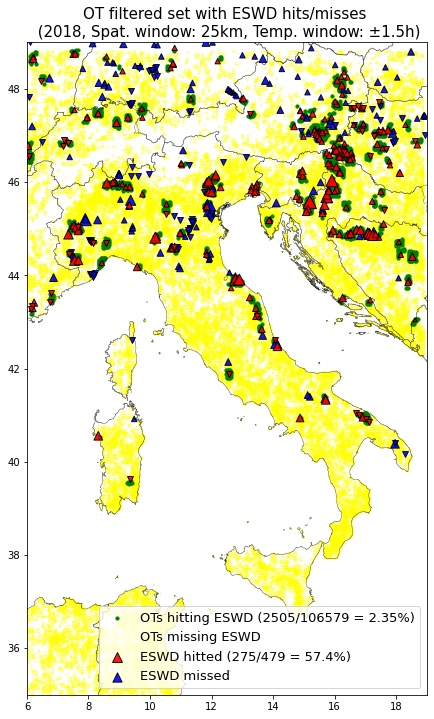

In [55]:
fig, ax = plt.subplots(figsize = (20,12))

plt.ylim(y_lim) #y_lim
plt.xlim(x_lim)  #x_lim

#OTs HITTING:
filt_OTset_land_HITTING_eswd_uniq_2018.plot(ax=ax, markersize=10, column='otpmax', color='green',
                                  zorder=2, label='OTs hitting ESWD (2505/106579 = 2.35%)')   

filt_OTset_land_MISSING_eswd_2018.plot(ax=ax, markersize=1, column='otpmax', color='yellow',
                                  zorder=1,alpha=0.3, label='OTs missing ESWD') 

#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=3)

#ESWD REPORTS:

#HITTED
#divide dataset in subsets with info on size of hail or not:
filt_eswd_HITTED_uniq_2018_NOsize = filt_eswd_HITTED_uniq_2018.loc[np.isnan(filt_eswd_HITTED_uniq_2018['size']) == True].reset_index(drop=True)
filt_eswd_HITTED_uniq_2018_wsize = filt_eswd_HITTED_uniq_2018.loc[np.isnan(filt_eswd_HITTED_uniq_2018['size']) == False].reset_index(drop=True)

pl.scatter(filt_eswd_HITTED_uniq_2018_wsize.lon, filt_eswd_HITTED_uniq_2018_wsize.lat, 
           15*filt_eswd_HITTED_uniq_2018_wsize['size'], c='red',marker="^", edgecolor='k',alpha=0.9, zorder=5, 
           label='ESWD hitted (275/479 = 57.4%)')
pl.scatter(filt_eswd_HITTED_uniq_2018_NOsize.lon, filt_eswd_HITTED_uniq_2018_NOsize.lat, 35,
                c='red',marker="v", edgecolor='k',alpha=0.9,zorder=5)
#MISSED
#divide dataset in subsets with info on size of hail or not:
filt_eswd_MISSED_2018_NOsize = filt_eswd_MISSED_2018.loc[np.isnan(filt_eswd_MISSED_2018['size']) == True].reset_index(drop=True)
filt_eswd_MISSED_2018_wsize = filt_eswd_MISSED_2018.loc[np.isnan(filt_eswd_MISSED_2018['size']) == False].reset_index(drop=True)

pl.scatter(filt_eswd_MISSED_2018_wsize.lon, filt_eswd_MISSED_2018_wsize.lat, 15*filt_eswd_MISSED_2018_wsize['size'],
           c='blue',marker="^", edgecolor='k',alpha=0.9, zorder=4, label='ESWD missed') 
pl.scatter(filt_eswd_MISSED_2018_NOsize.lon, filt_eswd_MISSED_2018_NOsize.lat, 35,
           c='blue',marker="v", edgecolor='k',alpha=0.9, zorder=4)   


#cell.plot(ax=ax, facecolor="none", edgecolor='grey');
plt.title('OT filtered set with ESWD hits/misses \n (2018, Spat. window: 25km, Temp. window: ±1.5h)',
          fontsize=15);
plt.legend(loc='best', fontsize=13)

plt.savefig('/home/ciccuz/phd/KIT/scripts/plots/OT_filter_validation/vsESWD_2016-2018/OTfilt_eswd_valid_2018.png', 
            dpi=300, bbox_inches='tight');

#### - Analysis valid. ESWD for 2016-2018:

In [56]:
#read dictionary from external file
with open(fold + 'data/OTfilter_validation/2016/valid_vs_eswd/filtOTset_vs_eswd.txt', 'rb') as file:
     filtOTset_valid_eswd_2016 = pickle.load(file)
with open(fold + 'data/OTfilter_validation/2016/valid_vs_eswd/unfiltOTset_vs_eswd.txt', 'rb') as file:
     allOTset_valid_eswd_2016 = pickle.load(file)
        
#read dictionary from external file
with open(fold + 'data/OTfilter_validation/2017/valid_vs_eswd/filtOTset_vs_eswd.txt', 'rb') as file:
     filtOTset_valid_eswd_2017 = pickle.load(file)
with open(fold + 'data/OTfilter_validation/2017/valid_vs_eswd/unfiltOTset_vs_eswd.txt', 'rb') as file:
     allOTset_valid_eswd_2017 = pickle.load(file)
        
#read dictionary from external file
with open(fold + 'data/OTfilter_validation/2018/valid_vs_eswd/filtOTset_vs_eswd.txt', 'rb') as file:
     filtOTset_valid_eswd_2018 = pickle.load(file)
with open(fold + 'data/OTfilter_validation/2018/valid_vs_eswd/unfiltOTset_vs_eswd.txt', 'rb') as file:
     allOTset_valid_eswd_2018 = pickle.load(file)

In [47]:
#FILTERED OT SET VALIDATION
filt_eswd_HITTED_uniq_2016 = filtOTset_valid_eswd_2016['reports_HITTED_uniq']
filt_eswd_HITTED_uniq_2017 = filtOTset_valid_eswd_2017['reports_HITTED_uniq']
filt_eswd_HITTED_uniq_2018 = filtOTset_valid_eswd_2018['reports_HITTED_uniq']

filt_OTset_land_HITTING_eswd_uniq_2016 = filtOTset_valid_eswd_2016['OT_HITTING_uniq']
filt_OTset_land_HITTING_eswd_uniq_2017 = filtOTset_valid_eswd_2017['OT_HITTING_uniq']
filt_OTset_land_HITTING_eswd_uniq_2018 = filtOTset_valid_eswd_2018['OT_HITTING_uniq']

#UNFILTERED OT SET VALIDATION
unfilt_eswd_HITTED_uniq_2016 = allOTset_valid_eswd_2016['reports_HITTED_uniq']
unfilt_eswd_HITTED_uniq_2017 = allOTset_valid_eswd_2017['reports_HITTED_uniq']
unfilt_eswd_HITTED_uniq_2018 = allOTset_valid_eswd_2018['reports_HITTED_uniq']

unfilt_OTset_land_HITTING_eswd_uniq_2016 = allOTset_valid_eswd_2016['OT_HITTING_uniq']
unfilt_OTset_land_HITTING_eswd_uniq_2017 = allOTset_valid_eswd_2017['OT_HITTING_uniq']
unfilt_OTset_land_HITTING_eswd_uniq_2018 = allOTset_valid_eswd_2018['OT_HITTING_uniq']

In [50]:
#concat 3 years together:
filt_eswd_HITTED_uniq_2016_2017_2018 = pd.concat([filt_eswd_HITTED_uniq_2016, filt_eswd_HITTED_uniq_2017, 
                                                  filt_eswd_HITTED_uniq_2018])

filt_OTset_land_HITTING_eswd_uniq_2016_2017_2018 = pd.concat([filt_OTset_land_HITTING_eswd_uniq_2016,
                                                             filt_OTset_land_HITTING_eswd_uniq_2017,
                                                             filt_OTset_land_HITTING_eswd_uniq_2018])

unfilt_eswd_HITTED_uniq_2016_2017_2018 = pd.concat([unfilt_eswd_HITTED_uniq_2016, unfilt_eswd_HITTED_uniq_2017,
                                                   unfilt_eswd_HITTED_uniq_2018])

unfilt_OTset_land_HITTING_eswd_uniq_2016_2017_2018 = pd.concat([unfilt_OTset_land_HITTING_eswd_uniq_2016,
                                                               unfilt_OTset_land_HITTING_eswd_uniq_2017,
                                                               unfilt_OTset_land_HITTING_eswd_uniq_2018])

In [52]:
#Fraction of eswd events hitted by filtered OTs:
frac_filt_eswd_HITTED_2016_2017_2018 = len(filt_eswd_HITTED_uniq_2016_2017_2018)/len(eswd)
print('Fraction of eswd events hitted by filtered OTs= ', frac_filt_eswd_HITTED_2016_2017_2018)

#Fraction of missed eswd events by filtered OTs:
filt_eswd_MISSED_2016_2017_2018 = eswd[~eswd.index.isin(filt_eswd_HITTED_uniq_2016_2017_2018.index)]
frac_filt_eswd_MISSED_2016_2017_2018 = len(filt_eswd_MISSED_2016_2017_2018)/len(eswd)
print('Fraction of eswd events missed by filtered OTs= ', frac_filt_eswd_MISSED_2016_2017_2018)

#Fraction of filtered OTs hitting at least 1 eswd report 
frac_filt_OTs_land_HITTING_2016_2017_2018 = len(filt_OTset_land_HITTING_eswd_uniq_2016_2017_2018)/len(filt_OTset_2016_2017_2018_land)
print('Fraction of filtered OTs hitting at least 1 eswd report= ', frac_filt_OTs_land_HITTING_2016_2017_2018)

#Fraction of filtered OTs missing eswd reports
filt_OTset_land_MISSING_eswd_2016_2017_2018 = filt_OTset_2016_2017_2018_land[~filt_OTset_2016_2017_2018_land.index.isin(filt_OTset_land_HITTING_eswd_uniq_2016_2017_2018.index)]
frac_filt_OTs_land_MISSING_eswd_2016_2017_2018 = len(filt_OTset_land_MISSING_eswd_2016_2017_2018)/len(filt_OTset_2016_2017_2018_land)
print('Fraction of filtered OTs missing eswd reports= ', frac_filt_OTs_land_MISSING_eswd_2016_2017_2018)

Fraction of eswd events hitted by filtered OTs=  0.6239255014326648
Fraction of eswd events missed by filtered OTs=  0.37607449856733527
Fraction of filtered OTs hitting at least 1 eswd report=  0.028010274202495064
Fraction of filtered OTs missing eswd reports=  0.9295680100622176


In [53]:
#Fraction of eswd events hitted by UNfiltered OTs:
frac_unfilt_eswd_HITTED_2016_2017_2018 = len(unfilt_eswd_HITTED_uniq_2016_2017_2018)/len(eswd)
print('Fraction of eswd events hitted by UNFILTERED OTs= ', frac_unfilt_eswd_HITTED_2016_2017_2018)

#Fraction of missed eswd events by UNfiltered OTs:
unfilt_eswd_MISSED_2016_2017_2018 = eswd[~eswd.index.isin(unfilt_eswd_HITTED_uniq_2016_2017_2018.index)]
frac_unfilt_eswd_MISSED_2016_2017_2018 = len(unfilt_eswd_MISSED_2016_2017_2018)/len(eswd)
print('Fraction of eswd events missed by UNFILTERED OTs= ', frac_unfilt_eswd_MISSED_2016_2017_2018)

#Fraction of UNfiltered OTs hitting at least 1 eswd report 
frac_unfilt_OTs_land_HITTING_2016_2017_2018 = len(unfilt_OTset_land_HITTING_eswd_uniq_2016_2017_2018)/len(all_OTset_2016_2017_2018_land)
print('Fraction of UNFILTERED OTs hitting at least 1 eswd report= ', frac_unfilt_OTs_land_HITTING_2016_2017_2018)

#Fraction of UNfiltered OTs missing eswd reports
unfilt_OTset_land_MISSING_eswd_2016_2017_2018 = all_OTset_2016_2017_2018_land[~all_OTset_2016_2017_2018_land.index.isin(unfilt_OTset_land_HITTING_eswd_uniq_2016_2017_2018.index)]
frac_unfilt_OTs_land_MISSING_eswd_2016_2017_2018 = len(unfilt_OTset_land_MISSING_eswd_2016_2017_2018)/len(all_OTset_2016_2017_2018_land)
print('Fraction of UNFILTERED OTs missing eswd reports= ', frac_unfilt_OTs_land_MISSING_eswd_2016_2017_2018)

Fraction of eswd events hitted by UNFILTERED OTs=  0.6941260744985673
Fraction of eswd events missed by UNFILTERED OTs=  0.30587392550143266
Fraction of UNFILTERED OTs hitting at least 1 eswd report=  0.02388318782866187
Fraction of UNFILTERED OTs missing eswd reports=  0.9404758258028284


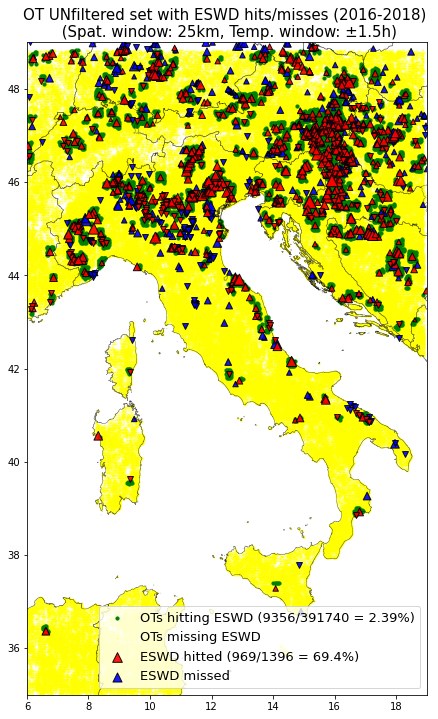

In [94]:
fig, ax = plt.subplots(figsize = (20,12))

plt.ylim(y_lim) #y_lim
plt.xlim(x_lim)  #x_lim

#OTs HITTING:
unfilt_OTset_land_HITTING_eswd_uniq_2016_2017_2018.plot(ax=ax, markersize=10, column='otpmax', color='green',
                                  zorder=2, label='OTs hitting ESWD (9356/391740 = 2.39%)')   

unfilt_OTset_land_MISSING_eswd_2016_2017_2018.plot(ax=ax, markersize=1, column='otpmax', color='yellow',
                                  zorder=1,alpha=0.3, label='OTs missing ESWD') 

#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=3)

#ESWD REPORTS:

#HITTED
#divide dataset in subsets with info on size of hail or not:
unfilt_eswd_HITTED_uniq_2016_2017_2018_NOsize = unfilt_eswd_HITTED_uniq_2016_2017_2018.loc[np.isnan(unfilt_eswd_HITTED_uniq_2016_2017_2018['size']) == True].reset_index(drop=True)
unfilt_eswd_HITTED_uniq_2016_2017_2018_wsize = unfilt_eswd_HITTED_uniq_2016_2017_2018.loc[np.isnan(unfilt_eswd_HITTED_uniq_2016_2017_2018['size']) == False].reset_index(drop=True)

pl.scatter(unfilt_eswd_HITTED_uniq_2016_2017_2018_wsize.lon, unfilt_eswd_HITTED_uniq_2016_2017_2018_wsize.lat, 
           15*unfilt_eswd_HITTED_uniq_2016_2017_2018_wsize['size'], c='red',marker="^", edgecolor='k',alpha=0.9, zorder=5, 
           label='ESWD hitted (969/1396 = 69.4%)')
pl.scatter(unfilt_eswd_HITTED_uniq_2016_2017_2018_NOsize.lon, unfilt_eswd_HITTED_uniq_2016_2017_2018_NOsize.lat, 35,
                c='red',marker="v", edgecolor='k',alpha=0.9,zorder=5)
#MISSED
#divide dataset in subsets with info on size of hail or not:
unfilt_eswd_MISSED_2016_2017_2018_NOsize = unfilt_eswd_MISSED_2016_2017_2018.loc[np.isnan(unfilt_eswd_MISSED_2016_2017_2018['size']) == True].reset_index(drop=True)
unfilt_eswd_MISSED_2016_2017_2018_wsize = unfilt_eswd_MISSED_2016_2017_2018.loc[np.isnan(unfilt_eswd_MISSED_2016_2017_2018['size']) == False].reset_index(drop=True)

pl.scatter(unfilt_eswd_MISSED_2016_2017_2018_wsize.lon, unfilt_eswd_MISSED_2016_2017_2018_wsize.lat, 
           15*unfilt_eswd_MISSED_2016_2017_2018_wsize['size'],
           c='blue',marker="^", edgecolor='k',alpha=0.9, zorder=4, label='ESWD missed') 
pl.scatter(unfilt_eswd_MISSED_2016_2017_2018_NOsize.lon, unfilt_eswd_MISSED_2016_2017_2018_NOsize.lat, 35,
           c='blue',marker="v", edgecolor='k',alpha=0.9, zorder=4)   


#cell.plot(ax=ax, facecolor="none", edgecolor='grey');
plt.title('OT UNfiltered set with ESWD hits/misses (2016-2018) \n (Spat. window: 25km, Temp. window: ±1.5h)',
          fontsize=15);
plt.legend(loc='best', fontsize=13)

plt.savefig('/home/ciccuz/phd/KIT/scripts/plots/OT_filter_validation/vsESWD_2016-2018/OTunfilt_eswd_valid_2016_2018.png', 
            dpi=300, bbox_inches='tight');

### - Validation with UNIPOL

For this validation we need to consider **only OTs and reports over ITALY!!**

In [64]:
#select OT sets over Italy only (since UNIPOL data refer only to this region)
all_OTset_2017_land_IT = gpd.clip(all_OTset_2017_land, sfg_ita).sort_index()
filt_OTset_2017_land_IT = gpd.clip(filt_OTset_2017_land, sfg_ita).sort_index()

all_OTset_2018_land_IT = gpd.clip(all_OTset_2018_land, sfg_ita).sort_index()
filt_OTset_2018_land_IT = gpd.clip(filt_OTset_2018_land, sfg_ita).sort_index()

In [94]:
#concat them together:
filt_OTset_2017_2018_land_IT = pd.concat([filt_OTset_2017_land_IT,filt_OTset_2018_land_IT])
all_OTset_2017_2018_land_IT = pd.concat([all_OTset_2017_land_IT,all_OTset_2018_land_IT])

#### - 2017

A total of **54333** OTs (with p>=50%) were detected over **LAND** and over **ITALY**

After filtering **45122** OTs were retained (**83.0%**)

During 2017 over LAND over ITALY a total number of 107 out of 213 days report at least 1 hailstorm-favouring OT in the filtered dataset (i.e. the **50.2%** of the days), compared to the 127 out of 213 days (59.6%) of the unfiltered (original) dataset over LAND

A total of **73** days with at least 1 **ESWD** report are reported in 2017, while the number of reports in 2017 is **480** 

A total of **72** days with at least 1 **UNIPOL** report are reported in 2017, while the number of reports in 2017 is **812**  (excluding 00utc!)

#### - 2018

TO DO!

A total of **80** (over 213) days with at least 1 **ESWD** report are reported in 2018, while the number of reports in 2017 is **479** 

A total of **199** days with at least 1 **UNIPOL** report are reported in 2018, while the number of reports in 2018 is **23420**  (excluding 00utc!)

#### - Analysis valid. UNIPOL for 2017 alone:

In [526]:
#define which set to consider for validation: filt_ or all_ 
OTset = all_OTset_2017_land_IT

In [528]:
unipol_HITTED = gpd.GeoDataFrame(columns=unipol.columns)
OTset_HITTING = gpd.GeoDataFrame(columns=OTset.columns)

#loop on OT detections
for OT_ind in OTset.index:
    
    OT = OTset[OTset.index == OT_ind]

    OTyear = int(OT.time.apply(lambda x: x.year))
    OTmonth = int(OT.time.apply(lambda x: x.month))
    OTday = int(OT.time.apply(lambda x: x.day))
    OThour = int(OT.time.apply(lambda x: x.hour))
    
    print(OT_ind)

    #select day before and above of OT timing
    OTtime_dAbove = pd.to_datetime(OT.time.item() + pd.to_timedelta(1, unit='d'))
    OTtime_dBefore = pd.to_datetime(OT.time.item() - pd.to_timedelta(1, unit='d'))
    OTtime_dAbove = OTtime_dAbove.replace(tzinfo=None)
    OTtime_dBefore = OTtime_dBefore.replace(tzinfo=None)

    #define unipol subset in the 3 days (before,present,and future) around OT timing: 
    #(this is done to make the loop more efficient!)
    """
    This step could be even more efficient by selecting directly only reports in a 1.5h temp window, for the moment
    lets try with +-1day and see if it is still too slow
    """
    unipol_subset = unipol_NO00_2017[(unipol_NO00_2017.datetime >= OTtime_dBefore) & 
                                     (unipol_NO00_2017.datetime <= OTtime_dAbove)]
    
    #loop on unipol reports
    for unipol_ind in unipol_subset.index:

        #calculate time delta between OT and unipol report:
        tdelta = pd.Timedelta(abs(OT.time.values[0] - 
                                  unipol_subset.datetime[unipol_subset.index == unipol_ind].values[0]))
        
        #condition: if difference between OT and report timing is smaller than (+-)12h keep the report
        if tdelta <= timedelta(minutes=720):
            
            #condition on spatial neighbourhood: if unipol report falls inside OT box:
            if unipol_subset.geometry[unipol_ind].within(OTset.geometry_25km_box[OT_ind]):

                print('Hit!')
                unipol_HITTED = unipol_HITTED.append(unipol_subset[unipol_subset.index == unipol_ind])

                OTset_HITTING = OTset_HITTING.append(OTset[OTset.index == OT_ind])
    
"""
ALLA FINE DI TUTTO BISOGNA RIPULARE I DATASET HITTED E HITTING DAI DOPPIONI!
"""

12
13
14
15
16
17
19
243
244
275
276
277
285
317
318
319
320
338
339
340
349
350
351
352
353
354
355
392
393
394
395
396
397
398
399
400
401
402
403
404
405
406
407
409
410
412
418
421
422
423
424
425
426
427
428
429
438
439
440
441
467
469
470
471
472
473
474
475
476
477
478
479
480
508
509
510
511
539
540
541
542
543
544
546
547
548
549
550
552
553
554
555
556
557
558
559
560
562
563
564
565
574
575
576
577
578
579
580
581
582
583
584
585
586
587
588
589
590
591
592
593
594
595
596
597
598
599
600
601
602
603
604
605
607
661
662
663
664
665
666
667
668
671
672
673
674
677
678
679
680
681
682
685
686
687
688
689
693
701
702
703
704
705
706
707
708
709
710
711
712
713
714
715
716
717
718
720
721
722
723
724
725
726
727
728
729
730
731
732
733
736
739
741
742
743
744
745
746
747
748
749
750
751
752
753
756
757
758
759
760
761
762
763
764
765
766
767
768
769
780
1002
1081
1082
1083
1087
1088
1089
1094
1095
1096
1101
1165
1166
1167
1168
1169
1170
1171
1172
1173
1198
1216
1217
1278
1279
12

7551
7552
7553
7554
7555
7556
7557
7558
7591
7592
7593
7594
7595
7596
7597
7598
7599
7600
7601
7602
7603
7604
7605
7606
7607
7608
7609
7610
7611
7612
7613
7614
7615
7616
7617
7637
7638
7639
7640
7641
7642
7643
7644
7645
7646
7647
7648
7649
7650
7651
7652
7653
7654
7823
7824
7825
7867
7868
7869
7870
7875
7876
7880
7935
7936
7937
7938
7939
7940
7941
7942
7943
7944
7945
7946
7947
7948
7949
7950
7951
7952
7953
7954
7955
7956
7957
7958
7959
7960
7961
7962
7966
7967
7968
7969
7970
7971
7972
7973
7979
7980
7986
7987
7993
8004
8005
8006
8010
8011
8012
8013
8014
8015
8016
8017
8018
8054
8055
8056
8060
8061
8065
8066
8067
8073
8093
8094
8095
8096
8097
8098
8099
8100
8101
8102
8103
8104
8105
8106
8107
8108
8114
8115
8116
8117
8118
8119
8120
Hit!
8121
Hit!
8122
Hit!
8123
Hit!
8124
8125
8126
8141
Hit!
8142
Hit!
8143
Hit!
8144
Hit!
8145
Hit!
8146
Hit!
8147
Hit!
8148
Hit!
8149
Hit!
8150
8151
8152
8153
8154
8155
8156
8157
8158
8186
8187
8188
8189
8190
8191
8192
8193
8194
8195
8196
8197
8198
8199
8200


11028
11029
11030
11031
11032
11033
11034
11035
11036
11037
11038
11039
11040
11041
11042
11043
11044
11045
11046
11047
11048
11049
11050
11051
11052
11053
11054
11055
11056
11057
11058
11059
11060
11061
11062
11063
11064
11065
11066
11067
11068
11069
11070
11071
11072
11083
11084
11085
11086
11087
11088
11089
11090
11091
11102
11103
11104
11105
11641
11642
11645
11646
11647
11648
11649
11650
11651
11652
11653
11654
11655
11656
11657
11658
11659
11660
11661
11662
11663
11664
11697
11700
11701
11702
11704
11705
11706
11707
11708
11709
11710
11711
11712
11713
11714
11715
11716
11717
11718
11719
11720
11721
11722
11723
11724
11725
11726
11727
11728
11729
11730
11731
11732
11733
11734
11735
11736
11737
11738
11739
11740
11741
11742
11743
11744
11749
11750
11751
11752
11753
11754
11760
11761
11762
11773
11775
11776
11777
11778
11779
11780
11782
11783
11784
11785
11786
11787
11788
12284
12285
12286
12287
12311
12312
12313
12314
12315
12316
12317
12318
12319
12320
12321
12322
12323
12324
1232

18539
18540
18541
18545
18546
18547
18548
18549
18550
18551
18552
18553
18554
18555
18559
18560
Hit!
18561
18562
18563
18564
18565
18566
18567
18568
Hit!
18569
18570
18571
18572
18573
18574
Hit!
18575
Hit!
18576
Hit!
18577
18578
Hit!
18579
Hit!
18580
Hit!
18581
18582
Hit!
18583
Hit!
18584
Hit!
18607
18608
18609
18610
18615
18616
18617
18618
18619
18620
18621
18622
18623
18624
18625
18626
18627
18628
18629
18630
18631
18632
18633
18634
18635
18636
18637
18638
18639
18640
18641
Hit!
18642
Hit!
18643
Hit!
18644
Hit!
18645
18646
18647
18648
18649
Hit!
18650
Hit!
18651
Hit!
18652
Hit!
18653
18654
18655
18656
18657
18658
18659
Hit!
18660
Hit!
18661
Hit!
18662
Hit!
18663
18664
18665
18666
18667
18668
Hit!
18669
Hit!
18670
18671
18672
18673
18674
Hit!
18675
Hit!
18676
18677
Hit!
18678
18679
18680
18681
18682
18683
18684
18685
18686
18687
18688
18689
18690
18691
18692
18693
18694
18780
18781
18782
18783
18784
18785
18786
18787
18788
18789
18790
18791
18792
18793
18794
18795
18796
18797
18798
18

20879
20880
20881
20882
20883
20884
20885
20886
20887
20888
20889
20890
20891
20892
20893
20894
20895
20896
20897
20898
20899
20900
20901
20902
20903
20904
20905
20906
20907
20908
20909
20910
20911
20912
20913
20914
20915
20916
20917
20918
20919
20920
20921
20922
20923
20924
20925
20926
20927
20928
20929
20930
20931
20932
20933
20934
20935
20936
20937
20938
20939
20940
20941
20942
20943
20944
20945
20946
20947
20948
20949
20950
20951
20952
20953
20954
20955
20956
20957
20958
20959
20960
20961
20962
20963
20964
20965
20966
20967
20968
20969
20970
20971
20972
20973
20974
20975
20976
20977
20978
20979
20980
20981
20982
20983
20984
20985
20986
20987
20988
20989
20990
20991
20992
20993
20994
20995
20996
20997
20998
20999
21000
21001
21058
21059
21060
21061
21062
21063
21064
21065
21066
21067
21068
21069
21070
21071
21072
21073
21074
21075
21076
21077
21078
21079
21080
21081
21082
21083
21084
21085
21086
21087
21088
21089
21090
21091
21092
21093
21094
21095
21096
21097
21098
21099
21100
2110

25331
25332
25333
25334
25335
25336
25337
25338
25339
25340
25341
25342
25343
25344
25345
25346
25347
25348
25349
25350
25351
25352
25353
25354
25355
25356
25357
25358
25359
25360
25361
25362
25363
25364
25365
25366
25367
25368
25369
25370
25371
25374
25375
25376
25377
25378
25379
25380
25381
25382
25383
25384
25385
25386
25387
25388
25389
25390
25391
25393
25394
25395
25396
25397
25398
25399
25400
25401
25402
25403
25404
25405
25406
25407
25416
25417
25422
25423
25424
25453
25454
25455
25456
25457
25458
25459
25460
25461
25462
25463
25464
25465
25466
25467
25468
25469
25479
25480
25481
25482
25483
25723
25724
25725
25726
25727
25728
25729
25841
25842
25843
25844
25845
25846
25847
25848
25849
25850
25851
25854
25855
25856
25857
25858
25862
25863
25864
26086
26087
26093
26094
26104
26105
26118
26128
26129
26137
26222
26266
26267
26268
26269
26270
26271
26272
26285
26286
26287
26297
26298
26299
26300
26301
26307
26308
26309
26310
26314
26315
26316
26317
26318
26319
26320
26321
26322
2632

31418
31419
31420
31421
31430
31431
31432
31433
31434
31435
31437
31438
31439
31440
31441
31442
31443
31444
31445
31446
31447
31448
31449
31450
31451
31452
31453
31454
31455
31456
31457
31458
31459
31489
31490
31491
31492
31493
31494
31495
31496
31497
31498
31499
31500
31501
31502
31503
31504
31505
31506
31507
31508
31509
31510
31511
31584
31585
31586
31587
31588
31589
31590
31591
31592
31593
31594
31595
31596
31597
31598
31599
31600
31601
31602
31603
31604
31605
31606
31607
31608
31609
31610
31611
31792
31793
31794
31795
31796
31797
31798
31799
31800
31801
31802
31803
31804
31805
31806
31807
31808
31809
31810
31811
31812
31813
31814
31815
31816
31817
31818
31819
31820
31821
31822
31823
31824
31825
31826
31848
31849
31850
31851
31852
31853
31854
31855
31856
32039
32040
32041
32042
32043
32044
32045
32046
32047
32048
32049
32050
32051
32052
32053
32054
32055
32056
32057
32058
32059
32068
32071
32072
32073
32252
32253
32254
32255
32256
32257
32258
32259
32260
32261
32262
32263
32264
3226

35052
35053
35054
35055
35056
35057
35058
35059
35060
35061
35062
35063
35064
35065
35066
35067
35068
35069
35070
35071
35072
35073
35074
35075
35076
35077
35078
35079
35080
35081
35082
35083
35084
35085
35086
35087
35088
35089
35090
35091
35092
35093
35094
35095
35096
35097
35098
35099
35100
35101
35102
35103
35104
35105
35106
35107
35108
35109
35110
35111
35112
35113
35114
35115
35116
35117
35118
35119
35120
35121
35122
35123
35124
35125
35126
35127
35128
35129
35130
35131
35132
35133
35134
35135
35136
35137
35138
35139
35140
35141
35142
35143
35144
35145
35146
35147
35148
35149
35150
35151
35152
35153
35154
35155
35156
35157
35158
35159
35160
35161
35162
35163
35164
35165
35166
35167
35168
35169
35170
35171
35172
35173
35174
35175
35176
35177
35178
35179
35180
35181
35182
35183
35184
35185
35186
35187
35188
35189
35190
35191
35192
35193
35194
35195
35196
35197
35198
35199
35200
35201
35202
35203
35204
35205
35206
35207
35208
35209
35210
35211
35212
35213
35214
35215
35216
35217
3521

36626
36627
36628
36629
36630
36631
36632
36633
36634
36635
36636
36637
36638
36639
36640
36641
36642
36643
36644
36645
36646
36647
36648
36649
36650
36651
36652
36653
36654
36655
36656
36657
36658
36659
36660
36661
36662
36663
36664
36665
36666
36667
36668
36669
36670
36671
36672
36673
36674
36675
36676
36677
36678
36679
36680
36681
36682
36683
36684
36685
36686
36687
36688
36689
36690
36691
36692
36693
36694
36695
36696
36697
36698
36699
36700
36701
36702
36703
36704
36705
36706
36707
36708
36709
36710
36711
36712
36713
36714
36715
36716
36717
36718
36719
36720
36721
36722
36723
36724
36725
36726
36727
36728
36729
36730
36731
36732
36733
36734
36735
36736
36737
36738
36739
36740
36741
36742
36743
36744
36745
36746
36747
36748
36749
36750
36751
36752
36753
36754
36755
36756
36757
36758
36759
36760
36761
36762
36763
36764
36765
36766
36767
36768
36769
36770
36771
36772
36773
36774
36775
36776
Hit!
36777
36778
36779
36780
36781
36782
36783
36784
36785
Hit!
36786
Hit!
36787
36788
36789
3

Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
38833
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
38845
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
38846
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
39077
39078
39085
39086
39087
39100
39101
39102
39103
39104
39105
39106
39107
39108
39109
39110
Hit!
Hit!
39111
Hit!
Hit!
39112
Hit!
Hit!
39113
Hit!
Hit!
39114
39115
Hit!
Hit!
39116
Hit!
Hit!
39117
39118
39119
39121
39122
39123
39124
39126
39127
39578
39579
39593
39594
39607
39608
39609
39617
39618
39619
39626
39627
39642
39643
39644
39650
39651
39652
39653
39654
39655
39656
39657
39658
39659
39660
39666
39667
39668
39669
39670
39671
39672
39673
39674
39675
39676
39677
39684
Hit!
Hit!
39685
Hit!
Hit!
39686
Hit!
Hit!
39687
Hit!
Hit!
39688
Hit!
Hit!
39689
39690
39691
39692
39693
39694
39695
39696
39701
Hit!
Hit!
39702
Hit!
Hit!
39703
Hit!
Hit!
39704
Hit!
Hit!
39705


42738
42739
42740
42741
42754
42755
42756
42757
42758
42759
42760
42761
42762
42763
42764
42767
42768
42771
42772
42773
42774
42964
42965
42966
42967
42968
42995
42996
42997
42998
42999
43000
43001
43002
43003
43004
43005
43006
43007
43008
43009
43010
43011
43012
43013
43014
43015
43016
43017
43018
43019
43020
43021
43022
43023
43024
43025
43026
43027
43028
43029
43097
43098
43099
43100
43139
43140
43141
43142
43143
43144
43145
43146
43147
43148
43149
43150
43151
43152
43153
43154
43155
43156
43157
43158
43159
43160
43161
43162
43163
43164
43165
43166
43167
43168
43169
43261
43262
43263
43264
43265
43266
43267
43268
43269
43270
43271
43272
43276
43277
43278
43279
43542
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
43543
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
43544
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
43545
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
43546
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
43547
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hi

44850
44851
44852
44853
44854
44855
44856
44857
44858
44859
44860
44861
44862
44863
44864
44865
44866
44867
44868
44869
44870
44871
44872
44873
44874
44875
44876
44877
44878
44879
44880
44881
44882
44883
44884
44885
44886
44887
44888
44889
44890
44891
44892
44893
44894
44895
44896
44897
44898
44899
44900
44901
44902
44903
44951
44952
44953
44954
44955
44960
44961
44965
44966
44967
44973
44974
44975
45016
45017
45018
45019
45020
45021
45023
45024
45025
45029
45030
45033
45034
45038
45039
45040
45041
45042
45043
45044
45045
45046
45047
45048
45049
45050
45051
45052
45053
45054
45055
45056
45057
45058
45059
45060
45061
45062
45063
45064
45065
45066
45067
45068
45069
45070
45071
45072
45073
45074
45075
45076
45077
45078
45079
45080
45081
45082
45083
45084
45085
45086
45087
45088
45089
45090
45091
45092
45093
45094
45095
45096
45097
45098
45099
45100
45101
45102
45103
45104
45105
45117
45118
45122
45123
45124
45125
45128
45129
45130
45133
45134
45137
45140
45141
45142
45146
45147
45152
4515

47135
47144
47145
47146
47147
47148
47149
47150
47158
47159
47160
47161
47162
47163
47172
47173
47174
47175
47176
47177
47178
47179
47180
47181
47182
47193
47194
47195
47196
47197
47198
47199
47200
47201
47202
47203
47204
47205
47206
47207
47215
47216
47217
47218
47219
47220
47221
47222
47223
47224
47225
47226
47227
47228
47229
47230
47231
47232
47233
47234
47235
47236
47237
47238
47241
47242
47243
47244
47245
47246
47247
47248
47249
47250
47251
47252
47253
47254
47255
47256
47257
47258
47259
47260
47261
47262
47263
47264
47265
47266
47267
47268
47269
47270
47271
47272
47273
47276
47277
47278
47279
47280
47281
47282
47283
47284
47285
47286
47287
47288
47289
47290
47291
47292
47293
47294
47295
47296
47297
47298
47299
47300
47301
47302
47303
47304
47305
47306
47307
47308
47309
47310
47311
47312
47313
47314
47315
47316
47317
47318
47319
47320
47321
47322
47323
47324
47325
47326
47327
47328
47329
Hit!
47330
Hit!
47331
47332
47333
47334
47335
47336
47337
47338
47339
47340
47341
47342
47343


49066
49067
49068
49069
49070
49071
49072
49073
49074
49075
49076
49077
49078
49079
49080
49081
49082
49083
49084
49085
49086
49087
49088
49089
49090
49091
49092
49093
49094
49095
49096
49097
49098
49099
49100
49101
49102
49103
49104
49105
49106
49107
49108
49109
49110
49111
49112
49113
49114
49115
49116
49117
49118
49119
49120
49121
49122
49123
49124
49125
49126
49127
49128
49129
49130
49131
49132
49133
49134
49135
49136
49137
49138
49139
49140
49141
49142
49143
49144
49145
49146
49147
49148
49149
49150
49151
49152
49153
49154
49155
49156
49157
49158
49159
49160
49161
49162
49163
49164
49165
49166
49167
49168
49169
49170
49171
49172
49173
49174
49175
49176
49177
49178
49179
49180
49181
49182
49183
49184
49185
49186
49187
49188
49189
49190
49191
49192
49193
49194
49195
49196
49197
49198
49199
49200
49203
49204
49205
49206
49207
49208
49209
49212
49213
49214
49215
49216
49217
49218
49219
49220
49221
49222
49223
49224
49225
49226
49227
49228
49229
49230
49231
49232
49233
49234
49235
4923

53174
53175
53176
53177
53178
53179
53198
53199
53200
53201
53202
53203
53204
53205
53258
53259
53260
53261
53262
53263
53273
53274
53275
53276
53277
53278
53279
53280
53281
53282
53390
53391
53392
53393
53394
53395
53396
53397
53398
53470
53473
53474
53475
53476
53477
53478
53479
53480
53481
53482
53483
53484
53485
53571
53656
53657
53658
53659
53660
53661
53662
53663
53664
53665
53666
53667
53723
53724
53725
53726
53727
53728
53729
53730
53731
53732
53733
53734
53735
53736
53737
53738
53739
53740
53762
53763
53764
53765
53766
53767
53768
53769
53770
53791
53792
53793
53794
53795
53796
53797
53805
53806
53807
53808
53809
53810
53811
53812
53813
53814
53815
53816
53817
53818
53819
53820
53821
53822
53823
53824
53825
53840
53841
53842
53843
53844
53845
53846
53847
53848
53849
53850
53851
53852
53853
53854
53855
53856
53857
53858
53859
53860
53861
53862
53863
53864
53865
53866
53867
53868
53869
53870
53871
53872
53873
53874
53875
53876
53877
53878
53879
53952
53953
53954
53955
53956
5395

58706
58707
58708
58709
58710
58711
58712
58713
58714
58715
58716
58717
58718
58719
58720
58721
58722
58723
58724
58725
58726
58727
58728
58729
58730
58731
58732
58733
58734
58735
58736
58737
58738
58739
58740
58741
58742
58743
58744
58745
58746
58747
58748
58749
58750
58751
58752
58753
58754
58755
58756
58757
58758
58759
58760
58761
58762
58763
58764
58765
58766
58767
58768
58769
58770
58771
58772
58773
58774
58775
58776
58777
58778
58779
58780
58781
58782
58783
58784
58785
58786
58787
58788
58789
58790
58791
58792
58793
58794
58795
58796
58797
58798
58799
58800
58801
58802
58803
58804
58805
58806
58807
58808
58809
58810
58811
58812
58813
58814
58815
58817
58818
58819
58820
58821
58822
58823
58824
58825
58826
58827
58828
58829
58830
58831
58832
58833
58834
58835
58836
58837
58838
58839
58840
58841
58843
58844
58845
58846
58847
58848
58849
58850
58851
58852
58853
58854
58855
58856
58857
58858
58859
58860
58861
58862
58863
58864
58865
58866
58867
58868
58869
58870
58871
58872
58873
5887

63792
Hit!
63793
63794
63795
63796
63797
63798
63799
63800
63801
63802
63803
63804
63805
63806
63807
63808
63809
63810
63994
63995
63996
63997
63998
63999
64000
64001
64002
64003
64004
64005
64006
64007
64008
64009
64010
64011
64012
64013
64014
64015
64016
64017
64018
64019
64020
64021
64022
64023
64024
64025
64026
64027
64028
64029
64030
64031
64032
64033
64034
64035
64036
64037
64038
64039
64040
64041
64042
64043
64044
64045
64046
64047
64048
64049
64050
64051
64052
64053
64054
64055
64056
64057
64058
64059
64060
64061
64062
64063
64064
64065
64066
64067
64068
64069
64070
64144
64145
64146
64147
64148
64149
64150
64151
64152
64153
64154
64155
64156
64157
64158
64159
64160
64161
64162
64163
64164
64165
64166
64167
64168
64169
64170
64171
64172
64173
64174
64175
64176
64177
64178
64179
64180
64181
64182
64183
64184
64185
64206
64207
64208
64209
64210
64211
64212
64213
64214
64215
64216
64217
64218
64219
64220
64221
64222
64223
64224
64225
64226
64231
64272
64273
64274
64276
64277
64278

Hit!
67701
Hit!
67702
67703
67704
67705
67706
67707
67708
67709
67710
67711
67712
67713
67714
67715
67716
67717
67718
67719
67720
67721
67722
67723
67724
67725
67726
67727
67728
67729
67730
67731
67732
67733
67734
67735
67736
67737
67738
67739
67740
67741
67742
67743
67744
67745
67746
67747
67748
67749
67750
67751
67752
67753
67754
67755
67756
67757
67758
67759
67760
67761
67762
67763
67764
67765
67766
67767
67768
67769
67770
67771
Hit!
67772
Hit!
67773
Hit!
67774
Hit!
67775
67776
Hit!
67777
Hit!
67778
Hit!
67779
67781
67782
67783
67784
67785
67786
67787
67788
67789
67790
67791
67803
67804
67805
67806
67807
67808
67809
67810
67811
67812
67813
67814
67815
67816
67817
67818
67874
67875
67876
67877
67878
67879
67880
67881
67882
67883
67884
67885
67886
67887
67888
67889
67890
67891
67892
67893
67894
67895
67896
67897
67898
67899
67900
67901
67902
67903
67904
67905
67906
67907
67908
67909
67910
67911
67912
67913
67914
67915
67916
67917
67918
67919
67920
67921
67922
67923
67924
67925
67926
6

73239
73240
73658
73680
Hit!
73681
Hit!
73682
Hit!
73683
73684
73685
Hit!
73686
Hit!
73687
Hit!
73688
Hit!
73689
Hit!
73690
Hit!
73691
73692
73693
73694
Hit!
73695
Hit!
73696
Hit!
73697
Hit!
73698
Hit!
73699
73700
Hit!
73701
Hit!
73702
73703
73704
73705
73706
73707
Hit!
73708
Hit!
73712
73713
73714
73715
73716
73723
73724
73725
73726
73727
73728
73731
73732
73733
73734
73735
73737
73738
73739
73740
73741
73742
73743
73744
73745
73746
73747
73748
73749
73750
73751
73752
73753
73755
73756
73765
73766
73767
73769
73770
73771
73772
73774
73775
73776
73777
73778
73779
73780
73781
73782
73783
73784
73785
73786
73787
73788
73789
73790
74260
74261
74262
74263
74264
74265
74270
74271
74272
74273
74274
74275
74280
74281
74282
74283
74284
74285
74286
74290
74316
74317
74318
74319
74320
74322
74323
74324
74325
74326
74327
74328
74329
74332
74333
74334
74335
74336
74337
74338
74342
Hit!
74343
74344
74345
74346
74347
74348
74349
74353
74354
74355
74356
74357
74361
Hit!
74362
Hit!
74736
74741
74742
7

79524
79525
79526
79527
79528
79529
79530
79531
79532
79533
79534
79535
79536
79537
79538
79539
79540
79541
79542
79543
79544
79545
79546
79547
79548
79549
79550
79551
79552
79553
79554
79555
79556
79557
79558
79559
79560
Hit!
79561
79562
Hit!
79563
Hit!
79564
Hit!
Hit!
79565
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
79566
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
79567
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
79568
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
79569
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
79570
79571
79572
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
79573
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
79574
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
79575
79576
79577
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
79578
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
79579
79580
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
79581
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
79582
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
79583
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
79584
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
79585
Hit!
Hit!
Hit!
Hit!
Hit

80919
80920
80921
80922
80923
80924
80925
80926
80927
80928
80929
80930
80931
80932
80933
80934
80935
80936
80937
80941
Hit!
80942
Hit!
80943
Hit!
80944
Hit!
80945
Hit!
80946
Hit!
80947
80948
80949
80950
80951
80954
80955
80956
80957
Hit!
80958
Hit!
80959
Hit!
80960
Hit!
80961
Hit!
80962
Hit!
80963
80964
80965
80970
80971
80972
80973
80974
80975
Hit!
80976
Hit!
80977
Hit!
80978
Hit!
80979
80980
80983
80984
80985
80986
80987
80988
80989
80990
Hit!
80991
Hit!
80992
80993
80994
80995
80996
80997
80998
80999
81000
Hit!
81001
Hit!
81002
Hit!
81003
Hit!
81004
81005
81006
81007
81008
81009
81010
Hit!
81011
Hit!
81012
Hit!
81013
Hit!
81014
Hit!
81015
81016
81017
81018
Hit!
81019
Hit!
81020
Hit!
81021
Hit!
81022
81023
81024
81025
81026
81027
81028
81029
81030
81031
81032
81033
81034
81035
81036
81037
81038
81039
81040
81041
81042
81043
81044
81045
81046
81047
81048
81049
81050
81051
81052
81053
81054
81055
81056
81057
81058
81059
81060
81061
81062
81063
81064
81065
81066
81067
81068
81069
81070

Hit!
Hit!
84617
84618
84619
Hit!
Hit!
Hit!
84620
Hit!
Hit!
Hit!
84621
Hit!
Hit!
Hit!
84625
84626
84627
Hit!
Hit!
Hit!
84628
Hit!
Hit!
Hit!
84629
Hit!
Hit!
Hit!
84630
Hit!
Hit!
Hit!
84635
Hit!
Hit!
Hit!
84636
Hit!
Hit!
Hit!
84637
Hit!
Hit!
Hit!
84638
Hit!
Hit!
Hit!
84643
Hit!
Hit!
Hit!
84648
84651
84652
84653
84654
84655
84656
84657
84658
84659
84660
84661
84662
84663
84664
84665
84666
84667
84668
84669
84670
84671
84672
84673
84674
84675
84676
84677
84678
84679
84680
84681
84682
84683
84684
84685
84686
84687
84688
84689
84690
84691
84692
84693
84694
84695
84696
84697
84698
84699
84700
84701
84702
84703
84704
84705
84706
84707
84708
84709
84710
84711
84712
84713
84714
84715
84716
84717
84718
84719
84720
84721
84722
84753
84754
84801
84802
84806
84807
84808
84809
84816
84817
84818
84819
84826
84827
84828
84833
84834
84835
84836
84844
84845
84846
Hit!
84847
Hit!
84848
84849
Hit!
84850
84851
Hit!
84852
Hit!
84853
Hit!
84854
84855
84856
84857
84858
Hit!
84859
84860
84861
84862
84863
84864
H

87190
87191
87192
87193
87194
87195
87196
87197
87198
87199
87200
87201
87202
87203
87204
87205
87206
87207
87208
87209
87210
87211
87212
87381
87382
87386
87387
87388
87397
87398
87400
87401
87403
87404
87405
87406
87407
87408
87409
87410
87411
87412
87413
87414
87415
87416
87417
87418
87419
87420
87421
87422
87423
87424
87425
87426
87427
87428
87429
87430
87431
87432
87433
87434
87435
87436
87437
87438
87439
87440
87441
87442
87443
87444
87445
87446
87447
87448
87449
87450
87451
87452
87453
87454
87455
87456
87457
87458
87459
87460
87461
87462
87463
87464
87465
87466
87467
87468
87469
87470
87471
87472
87473
87474
87475
87476
87477
87478
87479
87480
87481
87482
87483
87484
87485
87486
87487
87488
87489
87490
87491
87492
87493
87494
87495
87496
87497
87498
87499
87500
87501
87502
87503
87504
87505
87506
87507
87508
87509
87510
87511
87512
87513
87514
87515
87516
87517
87518
87519
87520
87521
87522
87523
87524
87525
87526
87527
87528
87529
87530
87531
87532
87533
87534
87535
87536
8753

89654
89655
89656
89657
89658
89659
89660
89661
89662
89663
89664
89665
89666
89667
89668
89669
89670
89671
89672
89673
89674
89675
89676
89677
89678
89679
89680
89681
89682
89683
89684
89685
89686
89687
89688
89689
89690
89691
89692
89693
89694
89695
89696
89697
89698
89699
89700
89701
89702
89703
89704
89705
89706
89707
89708
89709
89710
89711
89712
89713
89731
89732
89733
89737
89738
89739
89740
89741
89742
89743
89744
89745
89746
89747
89748
89749
89752
89753
89754
89755
89756
89757
89758
89759
89760
89761
89762
89763
89764
89765
89766
89767
89768
89769
89770
89771
89772
89773
89774
89775
89776
89777
89778
89779
89780
89781
89782
89783
89784
89785
89786
89787
89788
89789
89790
89791
89792
89793
89794
89795
89796
89797
89798
89799
89800
89801
89802
89803
89804
89805
89806
89807
89808
89809
89810
89811
89812
89813
89814
89815
89816
89817
89818
89819
89820
89821
89822
89823
89824
89825
89826
89827
89828
89829
89830
89831
89832
89833
89834
89835
89836
89837
89838
89839
89840
89841
8984

92065
92066
92067
92068
92069
92070
92071
92072
92073
92074
92075
92076
92077
92078
92079
92080
92081
92082
92083
92084
92085
92086
92087
92088
92089
92090
92091
92092
92093
92094
92095
92096
92097
92098
92099
92100
92101
92102
92103
92104
92105
92106
92107
92108
92109
92110
92111
92112
92113
92114
92115
92116
92117
92159
92160
92161
92162
92163
92164
92165
92166
92167
92168
92169
92170
92739
92740
92741
92742
92743
92744
92745
92746
92747
92748
92749
92750
92751
92753
92754
92755
93001
93002
93003
93004
93005
93006
93011
93012
93013
93014
93015
93016
93017
93018
93019
93020
93021
93022
93023
93024
93025
93026
93027
93028
93029
93030
93031
93032
93033
93034
93035
93036
93037
93038
93039
93040
93041
93042
93043
93044
93045
93046
93047
93048
93049
93050
93051
93052
93053
93054
93055
93056
93057
93058
93059
93060
93061
93062
93063
93064
93065
93066
93067
93068
93069
93070
93071
93072
93073
93074
93075
93076
93077
93078
93079
93080
93081
93082
93083
93493
93513
93514
93515
93517
93518
9351

98277
98278
98279
98280
98281
98282
98283
Hit!
98284
Hit!
98285
Hit!
98286
98287
Hit!
98288
Hit!
98289
Hit!
98290
Hit!
98291
Hit!
98292
Hit!
98293
Hit!
98294
98295
98296
98297
98298
98299
98300
98301
98302
98303
98304
98305
98306
98307
98308
98309
Hit!
98310
Hit!
98311
Hit!
98312
98313
98314
98315
Hit!
98316
Hit!
98317
Hit!
98318
98319
98320
98321
98322
98323
98324
98325
98326
98327
98328
98329
98330
98331
98332
98333
98334
98335
98336
Hit!
98337
Hit!
98338
Hit!
98339
Hit!
98340
Hit!
98341
98342
98343
98344
98345
98346
98347
Hit!
98348
Hit!
98349
Hit!
98350
Hit!
98351
98352
98353
98354
98355
98356
98357
98358
Hit!
Hit!
98359
98360
98361
98362
98363
98364
Hit!
Hit!
98365
98366
98367
98368
98369
98370
98371
98372
98373
98374
98375
98376
98377
Hit!
Hit!
98378
Hit!
Hit!
98379
98380
98381
98382
98383
98384
98385
98386
98387
98388
98389
98390
98391
98392
98393
Hit!
Hit!
98394
98395
98396
98397
98398
98399
98400
98401
98402
98403
98404
98405
98406
98407
98408
Hit!
Hit!
98409
Hit!
Hit!
98410
H

100183
100184
100185
100186
100187
100188
100189
100190
100196
100197
100198
100199
100200
100208
100209
100215
100216
100217
100218
100219
100220
100221
100222
100223
100224
100225
100226
100227
100228
100229
100230
100231
100232
100234
100235
100236
100237
100238
100239
100240
100241
100242
100243
100244
100245
100246
100248
100249
100250
100251
100252
100253
100254
100255
100256
100257
100258
100260
100261
100262
100263
100264
100265
100266
100267
100268
100269
100270
100271
100272
100273
100274
Hit!
100275
Hit!
100474
100479
100480
100486
100512
100513
100514
100523
100524
100549
100550
100551
100552
100553
100554
100555
100556
100557
100558
100564
100565
100566
100567
100573
100727
100730
100731
100732
100734
100735
100736
100813
100814
100815
100819
100820
100821
100822
100823
100824
100825
100826
100827
100828
100839
100840
100844
100845
100846
100847
100848
100852
100856
100857
100858
100862
100863
100872
100873
100874
100883
100884
100885
100886
100892
100893
100894
100895
101

102519
102520
102521
102522
102523
102524
102525
102526
102527
102528
102529
102530
102531
102532
102533
102534
102535
102536
102537
102538
102539
102540
102541
102542
102543
102544
102545
102546
102547
102548
102549
102550
102551
102577
102578
102579
102580
102581
102582
102583
102584
102586
102587
102588
102589
102590
102591
102592
102593
102594
102595
102596
102597
102598
102599
102600
102601
102602
102603
102604
102605
102606
102607
102608
102609
102610
102611
102612
102613
102614
102615
102616
102617
102618
102619
102620
102621
102622
102623
Hit!
102624
Hit!
102625
102626
102627
102628
Hit!
Hit!
Hit!
Hit!
Hit!
102629
Hit!
Hit!
102630
Hit!
102631
Hit!
Hit!
Hit!
Hit!
Hit!
102632
Hit!
Hit!
Hit!
Hit!
Hit!
102633
Hit!
Hit!
102634
Hit!
102635
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
102636
Hit!
Hit!
Hit!
102637
Hit!
102638
Hit!
Hit!
102639
Hit!
Hit!
102640
Hit!
Hit!
Hit!
Hit!
Hit!
102641
Hit!
Hit!
102642
Hit!
Hit!
Hit!
Hit!
Hit!
102669
102670
102671
102673
102674
102675
102676
102677
102678
1

Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
103766
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
103767
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
103768
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!

Hit!
104035
104036
104037
104038
104039
104040
104041
Hit!
104042
Hit!
104043
104044
104045
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
104046
Hit!
104047
Hit!
104048
Hit!
104049
104050
104051
104052
104053
104054
104055
Hit!
104056
Hit!
104057
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
104058
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
104059
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
104060
Hit!
104061
104062
104063
104064
104065
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
104066
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
104067
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!

Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
104113
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
104114
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
H

106067
106068
106069
106070
106071
106072
106073
106074
106075
106076
106077
106078
106079
106080
106081
106082
106083
106084
106085
106086
106087
106088
106089
106090
106091
106092
106093
106094
106095
106096
106097
106098
106099
106100
106101
106102
106103
106104
106105
106106
106107
106108
106109
106110
106111
106112
106202
106203
106204
106205
106206
106207
106209
106210
106211
106212
106213
106214
106215
106216
106217
106218
106219
106220
106221
106222
106223
106224
106225
106226
106227
106228
106229
106230
106231
106232
106233
106234
106235
106236
106237
106238
106239
106240
106241
106242
106243
106244
106245
106246
106247
106248
106249
106250
106251
106252
106253
106254
106255
106256
106257
106258
106259
106260
Hit!
106261
106262
106263
106264
106265
106266
106267
106268
106269
106270
106271
106272
106273
106274
Hit!
106275
Hit!
106276
Hit!
106277
Hit!
106278
106279
106280
106284
106285
106286
106287
106288
106289
106290
106291
106292
106293
106296
106297
106298
106299
106300
10

107725
107726
107727
107728
107729
107730
Hit!
107731
Hit!
107732
Hit!
107733
Hit!
107737
107738
107740
107741
107742
107743
Hit!
107744
Hit!
107745
Hit!
107749
107750
107756
107757
107758
107759
107768
107867
107868
107869
107870
Hit!
107871
Hit!
107872
Hit!
107873
Hit!
107874
Hit!
107875
107876
107877
107878
107879
107880
107881
107882
107883
107884
107885
107886
107887
107888
107889
107891
107892
107894
107895
107896
107899
107900
107901
107902
107903
107904
107908
107909
107910
107911
107912
107913
107914
107915
107916
107917
107918
107922
107923
107924
107931
107932
107933
107934
107935
107936
107943
107944
107945
107946
107953
107954
107955
107956
107961
107962
107967
107968
107969
107970
107971
107972
107973
107978
107979
107980
107981
107982
107983
107984
107985
107986
107987
107988
107989
107990
107991
107992
107993
107994
107995
107996
107997
107998
107999
108000
108001
108004
108005
108006
108007
108008
108009
108010
108011
108012
108013
108014
108015
108016
108017
108018
10

109496
109497
109498
109499
109500
109501
109502
109503
109504
109505
109506
109507
109508
109509
109510
109511
Hit!
109512
Hit!
109513
109514
Hit!
109515
Hit!
109516
Hit!
109517
109518
109519
Hit!
109520
Hit!
109521
Hit!
109522
Hit!
109523
109524
109525
Hit!
109526
Hit!
109527
Hit!
109528
Hit!
109529
Hit!
109530
109531
109532
Hit!
109533
Hit!
109534
Hit!
109535
Hit!
109536
Hit!
109537
109538
109539
109540
Hit!
109541
Hit!
109542
Hit!
109543
Hit!
109544
109545
109546
109547
109548
Hit!
109549
109550
109551
109552
109553
109554
109555
109556
109557
109558
109559
109560
109561
109562
109563
109564
109565
109566
109567
109568
109569
109570
109571
Hit!
109572
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
109573
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!

110060
110061
110062
110063
110064
110065
110066
110067
110068
110069
110070
110071
110072
110073
110074
110075
110076
110077
110078
110079
110080
110081
110082
110083
110087
110088
110089
110090
Hit!
110094
110095
110096
110097
110098
110099
110100
110101
110102
110103
110104
110110
110111
110112
110113
110114
110115
110116
110117
110118
110119
110120
110121
110122
110123
110124
110125
110126
110127
110128
110129
110130
110131
110132
110133
110134
110135
110136
110137
110138
110139
110140
110141
110142
110143
110144
110145
110146
110147
110148
110149
110150
110151
110152
110153
110154
110155
110156
110157
110158
110207
110208
110209
110210
110223
110224
110225
110226
110227
110228
110229
110230
110231
Hit!
Hit!
110232
110233
110234
110235
110236
110237
110238
110239
110240
110241
110242
110243
110244
110245
110246
110247
110248
110249
110328
110329
110330
110331
110345
110346
110347
110348
110349
110350
110351
110352
110353
110354
110355
110356
110359
110360
110361
110362
110363
11036

Hit!
113145
Hit!
Hit!
Hit!
113146
Hit!
Hit!
Hit!
113147
Hit!
Hit!
Hit!
113148
113149
Hit!
Hit!
Hit!
113150
Hit!
Hit!
Hit!
113151
Hit!
Hit!
Hit!
113152
113153
113154
113155
113156
113157
113158
113159
113160
114406
114409
114410
114413
114414
114415
114416
114417
114418
114419
114420
114421
114422
114423
114424
114446
114447
114448
114449
114450
114451
114452
114453
114454
114455
114456
114457
114458
114459
114460
114461
114462
114463
114464
114465
114466
114467
114468
114469
114470
114471
114472
114473
114474
114475
114476
114477
114478
114479
114480
114481
114482
114483
114484
114485
114486
114487
114488
114489
114490
114491
114492
114493
114494
114495
114496
114497
114498
114499
114500
114501
114502
114503
114504
114505
114506
114507
114508
114509
114510
114511
114512
114513
114514
114515
114516
114536
114537
114538
114539
114540
114541
114542
114543
114544
114545
114546
114547
114548
114549
114550
114551
114552
114553
114554
114555
114556
114557
114558
114559
114560
114561
114562
11

117644
117645
117646
117647
117648
117649
117650
117651
117652
Hit!
Hit!
117653
Hit!
Hit!
117654
Hit!
Hit!
117655
Hit!
117656
117657
117658
117659
117660
117661
117662
117663
117664
117665
117666
117667
117668
117669
117670
Hit!
Hit!
117671
Hit!
Hit!
117672
117673
117674
117675
117676
117677
Hit!
Hit!
117680
117681
117682
117683
117684
117685
117686
117751
117752
117753
117754
117755
117756
117757
117758
117759
117760
117761
117762
117763
117764
117765
117766
117767
117768
117769
117770
117771
117772
117773
117774
117775
117776
117777
117778
117779
117780
117781
117784
117785
117793
117797
117798
117799
117800
117805
117806
117807
117808
117810
117811
117812
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
117813
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
117814
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
117815
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
117816
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
117817
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
117818
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
117819
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!

118647
118648
118649
118650
118651
118652
118653
118654
118655
118659
118660
118661
118662
118664
118665
118724
118725
118726
118866
118867
118868
118869
118870
118871
118872
118873
118874
118875
118876
118877
118878
118879
118880
118881
118882
118883
118884
118885
118886
118887
118888
118889
118890
118891
118892
118893
118894
118895
118896
118898
118899
118900
118901
118902
118904
118905
118906
118907
118908
118909
118910
118911
118912
118913
118914
118915
118916
118917
119388
119389
119390
119391
119392
119393
119394
119395
119396
119397
119398
119399
119400
119401
119402
119423
119424
119425
119426
119427
119428
119429
119430
119431
119432
119433
119434
119435
119436
119437
119438
119439
119440
119441
119442
119443
119444
119445
119446
119447
119448
119449
119450
119451
119454
Hit!
119455
Hit!
119456
119457
119458
119461
Hit!
119462
Hit!
119463
119464
119465
119466
119468
Hit!
119469
119470
119471
119472
119473
119474
119550
119551
119552
119553
119557
119558
119562
119563
119564
11

123143
123144
Hit!
123145
Hit!
123146
Hit!
123147
Hit!
123148
Hit!
123149
Hit!
123150
Hit!
123151
Hit!
123153
Hit!
123179
123180
123181
123182
123183
123184
123185
123186
123187
123188
Hit!
123189
Hit!
123190
Hit!
123191
Hit!
123192
Hit!
123193
Hit!
123194
Hit!
123195
Hit!
123196
Hit!
123197
Hit!
123198
Hit!
123199
Hit!
123200
Hit!
123201
Hit!
123202
Hit!
123203
Hit!
123204
123207
Hit!
123208
Hit!
123264
Hit!
123265
Hit!
123266
123267
123268
Hit!
123269
Hit!
123270
Hit!
123271
123272
123273
Hit!
123274
Hit!
123275
Hit!
123277
123278
Hit!
123681
123682
123685
123686
124185
124186
124187
124188
124189
124190
124191
124192
124193
124194
124195
124196
124197
124198
124199
124200
124201
124202
124203
124204
124205
124206
124207
124266
124267
124268
Hit!
124269
Hit!
124270
Hit!
124271
124272
124273
124274
124275
124276
124277
124278
124279
124280
124281
124282
124283
124284
124285
124286
124287
124288
124289
124290
124291
124292
124293
124294
124295
124296
124297
124298
124299
124300
124301


126459
126463
126464
126465
126466
126467
126473
126492
126493
126494
126495
126496
126497
126498
126499
126500
126501
126502
126503
126504
126505
126506
126507
126508
126509
126510
126511
126512
126513
126514
126515
126516
126517
126518
126519
126520
126521
126522
126523
126524
126525
126526
126527
126528
126529
126530
126531
126532
126533
126534
126535
126536
126537
126538
126539
126540
126541
126542
126543
126544
126545
126546
126547
126548
126549
126550
126551
126552
126553
126554
126555
126556
126557
126558
126559
126560
126561
126562
126563
126564
126565
126566
126567
126568
126569
126570
126571
126572
126573
126574
126575
126576
126577
126578
126579
126580
126581
126582
126583
126584
126585
126586
126587
126597
126613
126614
126615
126616
126617
126618
126619
126620
126621
126622
126623
126624
126625
126626
126627
126628
126629
126630
126631
126632
126633
126634
126635
126636
126637
126638
126639
126640
126641
126642
126643
126644
126645
126646
126647
126648
126649
126650
126651

Hit!
Hit!
128215
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
128216
128217
128218
128219
128220
128221
128222
128223
128224
128225
128226
128227
128228
128229
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
128230
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
128231
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
128232
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
128233
128234
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
128235
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit

130733
130734
130735
130736
130983
130984
130985
131109
131110
131111
131115
131116
131117
131118
131119
131120
131129
131130
131131
131147
131148
131170
131171
131189
131205
131206
131218
131219
131220
131229
131230
131232
131238
131244
131361
131362
131363
131364
131365
131366
131367
131368
131369
131370
131397
131398
131399
131400
131401
131402
131403
131404
131405
131406
131407
131408
131409
131410
131411
131412
131413
131505
131506
131507
131508
131509
131510
131511
131512
131513
131514
131518
131519
131520
131523
131524
131525
131526
131596
131597
131598
131599
131600
131601
131602
131603
131604
131605
131606
131607
131608
131609
131610
131612
131613
131614
131615
131616
131617
131618
131619
131620
131621
131622
131623
131624
131625
131626
131627
131628
131629
131630
131631
131632
131633
131634
131635
131636
131637
131638
131639
131640
131641
131642
131643
131756
131757
131758
131760
131761
131762
131763
131766
131767
131768
131770
131771
131772
131773
131774
131783
131784
131785

135009
135010
135011
135017
135018
135019
135020
135024
135025
135026
135027
135031
135032
135033
135057
135058
135059
135060
135061
135062
135063
135064
135065
135066
135067
135068
135069
135070
135071
135072
135073
135074
135075
135076
135077
135078
135079
135080
135081
135082
135083
135084
135085
135086
135087
135088
135089
135090
135091
135092
135093
135094
135095
135096
135097
135098
135099
135100
135101
135102
135103
135104
135105
135106
135107
135108
135109
135110
135111
135112
135113
135114
135115
135116
135117
135118
135119
135120
135121
135122
135123
135151
135152
135153
135157
135158
135159
135160
135164
135165
135166
135167
135168
135174
135175
135176
135177
135182
135189
135199
135282
135302
135311
135316
135317
135318
136597
136598
136599
136600
136601
136602
136603
136604
136605
136606
136607
136608
136609
136611
136612
136756
136757
136758
136872
136875
136876
136877
136878
136879
136880
136881
136882
136883
136884
136885
136886
136887
136888
136889
136890
136891
136892

142017
142018
142019
142020
142029
142030
142031
142032
142033
142143
142144
142145
142146
142147
142148
142149
142150
142151
142152
142153
142154
142155
142156
142157
142158
142159
142160
142161
142162
142163
142164
142165
142166
142167
142168
142169
142170
142171
142172
142173
142174
142175
142176
142177
142178
142179
142180
142181
142182
142183
142184
142185
142186
142187
142188
142189
142190
142191
142192
142193
142194
142195
142196
142197
142198
142199
142200
142201
142202
142203
142204
142205
142206
142207
142208
142209
142210
142211
142212
142213
142214
142215
142216
142217
142218
142219
142220
142221
142222
142223
142224
142225
142226
142227
142228
142229
142230
142231
142232
142233
142234
142235
142236
142237
142238
142239
142240
142241
142242
142243
142244
142245
142246
142247
142248
142249
142250
142251
142252
142253
142254
142255
142256
142257
142258
142259
142260
142261
142262
142263
142264
142265
142266
142267
142268
142269
142270
142271
142272
142273
142274
142275
142276

144291
144292
144293
144294
144295
144296
144297
144527
144531
144532
144533
144534
144535
144536
144537
144556
144557
144558
144559
144560
144561
144562
144563
144564
144565
144566
144567
144568
144569
144570
144571
144572
144573
144575
144576
144577
144581
144582
144583
144584
144586
144587
144588
144589
144737
144738
144739
144740
144741
144742
144743
144744
144745
144746
144747
144748
144749
144750
144751
144752
144753
144754
144755
144756
144757
144758
144759
144760
144761
144762
144763
144764
144765
144766
144767
144771
144772
144773
144778
144796
144797
144798
144799
144803
144804
144805
144806
144807
144808
144809
144813
144814
144815
144816
144819
144820
144821
144822
144823
144824
144832
144833
144838
144839
144840
144844
144845
144846
144847
144848
144849
144850
144851
144852
144853
144854
144855
144856
144857
144858
144859
144860
144861
144862
144864
144865
144866
144867
144868
144869
144870
144875
144876
144877
144878
144879
144880
144881
144882
144883
144884
144885
144886

147154
147155
147156
147157
147158
147159
147160
147161
147162
147163
147164
147165
147166
147167
147168
147169
147170
147171
147172
147173
147174
147175
147176
147177
147178
147179
147180
147181
147182
147183
147184
147185
147186
147187
147188
147189
147190
147191
147192
147193
147194
147195
147196
147197
147198
147199
147200
147201
147202
147203
147204
147205
147206
147207
147208
147209
147210
147211
147212
147213
147214
147215
147216
147217
147218
147219
147220
147221
147222
Hit!
Hit!
147223
Hit!
147224
147225
Hit!
Hit!
Hit!
147226
Hit!
Hit!
147227
Hit!
147228
147229
147230
Hit!
Hit!
147231
Hit!
147232
147233
147234
147235
147236
147237
147238
147239
147240
147241
147242
147243
147244
147245
147246
147247
147248
147249
147250
147251
147252
147253
147254
147255
147256
147257
147258
147259
147260
147261
147262
147263
147264
147265
147266
147267
147268
147270
147271
147272
147273
147274
147275
147276
147277
147278
147279
147280
147356
147357
147358
147361
147362
147363
147364
147368
14

152269
152270
152271
152272
152273
152274
152275
152276
152277
152278
152279
152280
152281
152282
152283
152284
152285
152287
152288
152289
152290
152291
152292
152293
152294
152297
152298
152299
152300
152301
152302
152303
152304
152307
152308
152309
152311
152312
152313
152314
152315
152316
152317
152318
152319
152320
152321
152322
152323
152324
152325
152326
152327
152328
152329
152330
152331
152332
152333
152334
152335
152336
152337
152338
152339
152340
152341
152342
152343
152390
152391
152395
152396
152397
152401
152402
152408
152409
152410
152411
152413
152414
152415
152416
152417
152418
152419
152420
152421
152422
152423
152424
152425
152426
152427
152428
152429
152430
152431
152432
152433
152434
152435
152436
152437
152438
152439
152440
152441
152442
152443
152445
152446
152447
152448
152449
152450
152451
152452
152453
152454
152455
152456
152457
152500
152501
152502
152506
152507
152508
152509
152510
152511
152512
152513
152514
152515
152516
152517
152518
152519
152520
152521

156467
156468
156469
156470
156471
156472
156473
156474
156475
156476
156477
156478
156479
156480
156481
156482
156483
156484
156485
156486
156487
156488
156489
156490
156491
156492
156493
156494
156495
156496
156497
156498
156499
156500
156501
156502
156503
156504
156505
156506
156507
156508
156509
156510
156511
156512
156513
156514
156515
156516
156517
156518
156519
156520
156521
156522
156523
156524
156525
156526
156527
156528
156529
156530
156531
156532
156533
156534
156535
156536
156537
156538
156539
156540
156541
156542
156543
156544
156545
156546
156547
156548
156549
156550
156551
156552
156553
156554
156555
156556
156557
156558
156559
156560
156561
156562
156563
156564
156565
156566
156567
156568
156569
156570
156571
156572
156573
156574
156575
156602
156603
156604
156605
156623
156624
156629
156630
156631
156632
156637
156638
156639
156640
156643
156645
156646
156647
156648
156649
156650
156651
156652
156653
156654
156655
156656
156657
156658
156659
156660
156661
156662
156669

164253
164264
164265
164266
164267
164268
164269
164270
164271
164272
164273
164274
164275
164276
164290
164291
164292
164293
164294
164295
164296
164297
164298
164299
164312
164313
164314
164315
164316
164317
164325
164326
164327
164328
164329
164330
164336
164337
164338
164339
164340
164341
164350
164351
164352
164353
164354
164355
164366
164367
164368
164369
164370
164379
164380
164398
164406
164407
164408
164417
164532
164533
164546
164547
164548
164549
164550
164552
164553
164554
164555
164556
164557
164560
164561
164562
164563
164564
164565
164566
164567
164568
164569
164572
164573
164574
164575
164576
164577
164578
164579
164580
164581
164582
164583
164584
164585
164586
164587
164588
164589
164590
164591
164592
164593
164594
164595
164596
164597
164598
164599
164600
164601
164602
164603
164604
164605
164606
164607
164608
164609
164610
164611
164612
164613
164614
164615
164616
164617
164618
164619
164620
164621
164622
164623
164624
164625
164626
164627
164628
164629
164630
164631

186432
186433
186434
186435
186436
186437
Hit!
186438
Hit!
186439
Hit!
186440
Hit!
186441
Hit!
186442
Hit!
186443
186444
186445
186446
186447
Hit!
186448
Hit!
186449
Hit!
186450
Hit!
186451
Hit!
186452
186453
186454
186455
186456
186457
Hit!
186458
Hit!
186459
186460
186461
186462
Hit!
186463
186464
186495
186501
186502
186503
186506
186507
186532
186533
186549
186550
186551
186552
186561
186562
186588
186589
186590
186598
186604
186605
186606
186607
186608
186609
186610
186611
186612
186613
186614
186615
186616
186617
186618
186619
186620
186621
186622
186623
186624
186627
186628
186629
186630
186631
186632
186633
186634
186635
186636
186638
186639
186640
186641
186642
186643
186644
186645
186646
186647
186648
186649
186650
186651
186652
186653
186654
186657
186658
186659
186660
186661
186662
186667
186668
186669
186674
186675
186676
186677
186678
186682
186683
186684
186685
186686
186687
186692
186693
186735
186736
186739
186740
186741
186749
186856
186857
186858
186859
186860
186861

'\nALLA FINE DI TUTTO BISOGNA RIPULARE I DATASET HITTED E HITTING DAI DOPPIONI!\n'

In [529]:
#Clean HITTED and HITTING datasets from duplicates

#eswd: because the same eswd report can be detected in the vicinity of multiple OTs
unipol_HITTED_uniq = unipol_HITTED.drop_duplicates()

#OT: because the same OT can detect multiple eswd reports
OT_HITTING_uniq = OTset_HITTING[~OTset_HITTING.index.duplicated(keep='first')]

In [530]:
result_filt1_dict = dict()

result_filt1_dict['reports_HITTED'] = unipol_HITTED
result_filt1_dict['reports_HITTED_uniq'] = unipol_HITTED_uniq
result_filt1_dict['OTset_HITTING'] = OTset_HITTING
result_filt1_dict['OT_HITTING_uniq'] = OT_HITTING_uniq

In [531]:
#write dictionary to external file
#with open(fold + 'data/OTfilter_validation/2017/valid_vs_unipol/unfiltOTset_vs_unipol.txt', 'wb') as file:
#     pickle.dump(result_filt1_dict,file)

In [61]:
#read dictionary from external file
with open(fold + 'data/OTfilter_validation/2017/valid_vs_unipol/filtOTset_vs_unipol.txt', 'rb') as file:
     filtOTset_valid_unipol_2017 = pickle.load(file)
        
with open(fold + 'data/OTfilter_validation/2017/valid_vs_unipol/unfiltOTset_vs_unipol.txt', 'rb') as file:
     allOTset_valid_unipol_2017 = pickle.load(file)

In [62]:
#FILTERED OT SET VALIDATION
filt_unipol_HITTED_2017 = filtOTset_valid_unipol_2017['reports_HITTED']
filt_unipol_HITTED_uniq_2017 = filtOTset_valid_unipol_2017['reports_HITTED_uniq']
filt_OTset_land_HITTING_unipol_2017 = filtOTset_valid_unipol_2017['OTset_HITTING']
filt_OTset_land_HITTING_unipol_uniq_2017 = filtOTset_valid_unipol_2017['OT_HITTING_uniq']

#UNFILTERED OT SET VALIDATION
unfilt_unipol_HITTED_2017 = allOTset_valid_unipol_2017['reports_HITTED']
unfilt_unipol_HITTED_uniq_2017 = allOTset_valid_unipol_2017['reports_HITTED_uniq']
unfilt_OTset_land_HITTING_unipol_2017 = allOTset_valid_unipol_2017['OTset_HITTING']
unfilt_OTset_land_HITTING_unipol_uniq_2017 = allOTset_valid_unipol_2017['OT_HITTING_uniq']

In [65]:
#Fraction of unipol events hitted by filtered OTs:
frac_filt_unipol_HITTED_2017 = len(filt_unipol_HITTED_uniq_2017)/len(unipol_NO00_2017)
print('Fraction of unipol events hitted by filtered OTs= ', frac_filt_unipol_HITTED_2017)

#Fraction of missed unipol events by filtered OTs:
filt_unipol_MISSED_2017 = unipol_NO00_2017[~unipol_NO00_2017.index.isin(filt_unipol_HITTED_uniq_2017.index)]
frac_filt_unipol_MISSED_2017 = len(filt_unipol_MISSED_2017)/len(unipol_NO00_2017)
print('Fraction of unipol events missed by filtered OTs= ', frac_filt_unipol_MISSED_2017)

#Fraction of filtered OTs hitting at least 1 unipol report 
frac_filt_OTs_land_HITTING_2017 = len(filt_OTset_land_HITTING_unipol_uniq_2017)/len(filt_OTset_2017_land_IT)
print('Fraction of filtered OTs hitting at least 1 unipol report= ', frac_filt_OTs_land_HITTING_2017)

#Fraction of filtered OTs missing unipol reports
filt_OTset_land_MISSING_unipol_2017 = filt_OTset_2017_land_IT[~filt_OTset_2017_land_IT.index.isin(filt_OTset_land_HITTING_unipol_uniq_2017.index)]
frac_filt_OTs_land_MISSING_unipol_2017 = len(filt_OTset_land_MISSING_unipol_2017)/len(filt_OTset_2017_land_IT)
print('Fraction of filtered OTs missing unipol reports= ', frac_filt_OTs_land_MISSING_unipol_2017)

Fraction of unipol events hitted by filtered OTs=  0.45320197044334976
Fraction of unipol events missed by filtered OTs=  0.5467980295566502
Fraction of filtered OTs hitting at least 1 unipol report=  0.06591019901600106
Fraction of filtered OTs missing unipol reports=  0.934089800983999


In [66]:
#Fraction of unipol events hitted by UNfiltered OTs:
frac_unfilt_unipol_HITTED_2017 = len(unfilt_unipol_HITTED_uniq_2017)/len(unipol_NO00_2017)
print('Fraction of unipol events hitted by UNFILTERED OTs= ', frac_unfilt_unipol_HITTED_2017)

#Fraction of missed unipol events by UNfiltered OTs:
unfilt_unipol_MISSED_2017 = unipol_NO00_2017[~unipol_NO00_2017.index.isin(unfilt_unipol_HITTED_uniq_2017.index)]
frac_unfilt_unipol_MISSED_2017 = len(unfilt_unipol_MISSED_2017)/len(unipol_NO00_2017)
print('Fraction of unipol events missed by UNFILTERED OTs= ', frac_unfilt_unipol_MISSED_2017)

#Fraction of UNfiltered OTs hitting at least 1 eswd report 
frac_unfilt_OTs_land_HITTING_2017 = len(unfilt_OTset_land_HITTING_unipol_uniq_2017)/len(all_OTset_2017_land_IT)
print('Fraction of UNFILTERED OTs hitting at least 1 unipol report= ', frac_unfilt_OTs_land_HITTING_2017)

#Fraction of UNfiltered OTs missing unipol reports
unfilt_OTset_land_MISSING_unipol_2017 = all_OTset_2017_land_IT[~all_OTset_2017_land_IT.index.isin(unfilt_OTset_land_HITTING_unipol_uniq_2017.index)]
frac_unfilt_OTs_land_MISSING_unipol_2017 = len(unfilt_OTset_land_MISSING_unipol_2017)/len(all_OTset_2017_land_IT)
print('Fraction of UNFILTERED OTs missing unipol reports= ', frac_unfilt_OTs_land_MISSING_unipol_2017)

Fraction of unipol events hitted by UNFILTERED OTs=  0.46551724137931033
Fraction of unipol events missed by UNFILTERED OTs=  0.5344827586206896
Fraction of UNFILTERED OTs hitting at least 1 unipol report=  0.05803103086522003
Fraction of UNFILTERED OTs missing unipol reports=  0.94196896913478


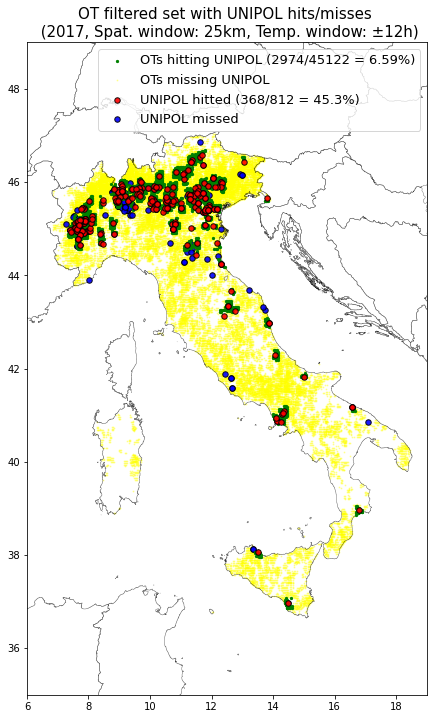

In [559]:
fig, ax = plt.subplots(figsize = (20,12))

plt.ylim(y_lim) #y_lim
plt.xlim(x_lim)  #x_lim

#OTs HITTING:
filt_OTset_land_HITTING_unipol_uniq_2017.plot(ax=ax, markersize=5, column='otpmax', color='green',
                                  zorder=5, label='OTs hitting UNIPOL (2974/45122 = 6.59%)')   

filt_OTset_land_MISSING_unipol_2017.plot(ax=ax, markersize=1, column='otpmax', color='yellow',
                                  zorder=1,alpha=0.3, label='OTs missing UNIPOL') 

#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=3)

#ESWD REPORTS:

#HITTED
pl.scatter(filt_unipol_HITTED_uniq_2017.lon, filt_unipol_HITTED_uniq_2017.lat, 
           30, c='red',marker="o", edgecolor='k',alpha=0.9, zorder=5, 
           label='UNIPOL hitted (368/812 = 45.3%)')
#MISSED
pl.scatter(filt_unipol_MISSED_2017.lon, filt_unipol_MISSED_2017.lat, 30,
           c='blue',marker="o", edgecolor='k',alpha=0.9, zorder=4, label='UNIPOL missed') 

#cell.plot(ax=ax, facecolor="none", edgecolor='grey');
plt.title('OT filtered set with UNIPOL hits/misses \n (2017, Spat. window: 25km, Temp. window: ±12h)',
          fontsize=15);
plt.legend(loc='best', fontsize=13)

#plt.savefig('/home/ciccuz/phd/KIT/scripts/plots/OT_filter_validation/vsUNIPOL_2016-2018/OTfilt_unipol_valid_2017.png', 
#            dpi=300, bbox_inches='tight');

#### - Analysis valid. UNIPOL for 2018 alone:

In [114]:
#define which set to consider for validation: filt_ or all_ 
OTset = all_OTset_2018_land_IT

In [115]:
unipol_HITTED = gpd.GeoDataFrame(columns=unipol.columns)
OTset_HITTING = gpd.GeoDataFrame(columns=OTset.columns)

#loop on OT detections
for OT_ind in OTset.index:
    
    OT = OTset[OTset.index == OT_ind]

    OTyear = int(OT.time.apply(lambda x: x.year))
    OTmonth = int(OT.time.apply(lambda x: x.month))
    OTday = int(OT.time.apply(lambda x: x.day))
    OThour = int(OT.time.apply(lambda x: x.hour))
    
    print(OT_ind)

    #select day before and above of OT timing
    OTtime_dAbove = pd.to_datetime(OT.time.item() + pd.to_timedelta(1, unit='d'))
    OTtime_dBefore = pd.to_datetime(OT.time.item() - pd.to_timedelta(1, unit='d'))
    OTtime_dAbove = OTtime_dAbove.replace(tzinfo=None)
    OTtime_dBefore = OTtime_dBefore.replace(tzinfo=None)

    #define unipol subset in the 3 days (before,present,and future) around OT timing: 
    #(this is done to make the loop more efficient!)
    """
    This step could be even more efficient by selecting directly only reports in a 1.5h temp window, for the moment
    lets try with +-1day and see if it is still too slow
    """
    unipol_subset = unipol_NO00_2018[(unipol_NO00_2018.datetime >= OTtime_dBefore) & 
                                     (unipol_NO00_2018.datetime <= OTtime_dAbove)]
    
    #loop on unipol reports
    for unipol_ind in unipol_subset.index:

        #calculate time delta between OT and unipol report:
        tdelta = pd.Timedelta(abs(OT.time.values[0] - 
                                  unipol_subset.datetime[unipol_subset.index == unipol_ind].values[0]))
        
        #condition: if difference between OT and report timing is smaller than (+-)12h keep the report
        if tdelta <= timedelta(minutes=720):
            
            #condition on spatial neighbourhood: if unipol report falls inside OT box:
            if unipol_subset.geometry[unipol_ind].within(OTset.geometry_25km_box[OT_ind]):

                print('Hit!')
                unipol_HITTED = unipol_HITTED.append(unipol_subset[unipol_subset.index == unipol_ind])

                OTset_HITTING = OTset_HITTING.append(OTset[OTset.index == OT_ind])
    
"""
ALLA FINE DI TUTTO BISOGNA RIPULARE I DATASET HITTED E HITTING DAI DOPPIONI!
"""

40
41
42
43
44
45
46
47
93
111
112
113
114
115
116
117
118
125
126
127
128
129
130
132
133
134
135
136
140
141
142
143
144
145
146
147
148
149
150
151
155
159
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
229
230
231
232
233
237
238
239
244
245
248
310
311
312
313
314
315
316
317
318
319
320
321
322
323
324
325
326
327
328
329
330
331
332
333
Hit!
334
335
336
337
338
339
340
341
342
343
344
345
346
347
348
349
350
Hit!
351
Hit!
352
Hit!
353
Hit!
354
Hit!
355
Hit!
356
Hit!
357
Hit!
358
Hit!
359
Hit!
360
Hit!
361
Hit!
362
Hit!
363
Hit!
364
Hit!
365
Hit!
366
Hit!
367
Hit!
380
381
382
383
384
385
607
608
609
610
668
697
916
920
921
922
923
924
925
926
927
928
929
930
931
988
989
990
991
992
1012
1021
1022
1023
1024
1025
1027
1028
1029
1030
1031
1032
1033
1034
1035
1125
1126
1128
1129
1130
1131
1132
1133
1134
1135
1136
1137

2539
2540
2541
2542
2543
Hit!
Hit!
2544
2545
Hit!
2546
Hit!
2547
Hit!
2548
Hit!
Hit!
Hit!
2549
2550
Hit!
2551
Hit!
2552
2553
2554
Hit!
Hit!
Hit!
Hit!
Hit!
2555
Hit!
Hit!
Hit!
Hit!
2556
Hit!
Hit!
Hit!
Hit!
Hit!
2557
Hit!
Hit!
Hit!
Hit!
Hit!
2558
Hit!
Hit!
2559
Hit!
Hit!
Hit!
2560
2561
2562
2563
2564
2565
2566
2567
2568
2569
2570
2571
2572
2573
2574
2575
2576
2577
2578
2579
2580
2581
2582
2583
2584
2585
2586
2587
2588
2589
2590
2591
2592
2593
2594
2595
2596
2597
2598
2599
2600
2601
2602
2603
2604
2605
2606
2607
2608
2609
2610
2611
2612
2613
2614
2615
2616
2617
2618
2619
2620
2621
2622
2623
2624
2625
2626
2627
2628
2629
2630
Hit!
Hit!
Hit!
Hit!
2631
Hit!
Hit!
Hit!
Hit!
2632
Hit!
Hit!
2633
Hit!
Hit!
2634
Hit!
Hit!
Hit!
Hit!
2635
Hit!
Hit!
2636
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
2637
Hit!
Hit!
2638
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
2639
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!


Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
5318
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!


Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
5347
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!


Hit!
Hit!
5795
Hit!
5796
Hit!
5797
Hit!
5798
5799
Hit!
5800
Hit!
5801
Hit!
5802
Hit!
5803
Hit!
5804
Hit!
5805
5806
Hit!
5807
Hit!
5808
5809
5810
Hit!
5815
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
5816
5817
5818
5819
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
5820
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
5821
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
5822
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
5823
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
5824
5825
5826
Hit!
5827
Hit!
Hit!
Hit!
5828
Hit!
Hit!
5829
Hit!
Hit!
5830
Hit!
Hit!
5831
Hit!
Hit!
Hit!
5832
Hit!
Hit!
5833
Hit!
Hit!
5834
Hit!
Hit!
5835
Hit!
Hit!
5836
Hit!
Hit!
Hit!
Hit!


Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
16415
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
16416
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
16417
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
16418
Hit!
Hit!
Hit!
Hit!
Hit!
H

Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
16472
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
16473
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
16474
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
16475
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
H

Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
16581
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
16582
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit

17915
17916
17917
17918
17919
17920
17921
17922
17923
17924
17925
17926
17927
17934
17935
17936
17937
17938
17939
17940
17941
17942
17943
17944
17945
17946
17947
17948
17949
17950
17951
17952
17953
17954
17955
17956
17957
17958
17959
17960
17961
17962
17963
17964
17965
17966
17967
17968
17969
17970
17971
17972
17973
17974
17975
17976
17977
17978
17979
17980
17981
17982
17983
17984
17985
17986
17987
17988
17989
17990
17991
17992
17993
17994
17995
17996
17997
17998
17999
18000
18001
18002
18003
18004
18005
18006
18007
18008
18009
18010
18011
18012
18013
18014
18015
18016
18017
18018
18019
18020
18021
18022
18023
18024
18025
18026
18027
18028
18029
18030
18031
18068
18069
18070
18071
18072
18073
18074
18075
18076
18077
18078
18079
18080
18081
18082
18083
18084
18085
18086
18087
18088
18089
18090
18091
18092
18093
18094
18095
18096
18097
18098
18099
18100
18101
18102
18103
18104
18105
18106
18107
18108
18109
18110
18111
18112
18113
18114
18115
18116
18117
18118
18119
18120
18121
18122
1812

Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
19045
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
19046
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
19047
19048
19049
19050
19051
19052
19053
19054
19055
19056
19057
19058
19059
19060
19061
19062
19063
19064
19065
19066
19067
19068
19069
19070
19071
19072
19073
19074
19075
19076
19077
19078
19079
19080
19081
19082
19083
19084
19085
19086
19087
19088
19089
19090
19091
19092
19093
19094
19213
19214
19259
19262
Hit!
19265
19266
Hit!
19267
Hit!
19268
Hit!
19269
Hit!
19270
Hit!
Hit!
19271
Hit!
Hit!
19272
Hit!
Hit!
19320
19321
19322
19323
19324
19325
19326
19327
Hit!
19350
19354
Hit!
19355
Hit!
Hit!
19357
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
19358
Hit!
Hit!
Hit!
Hit!
Hit!


Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
19436
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
19437
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
19438
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hi

Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
21447
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
21448
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit

Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
21489
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!

23361
23362
23363
23364
23365
23366
23367
23368
23369
23370
23371
23372
23373
23374
23375
23376
23377
23380
23381
23382
23383
23384
23385
23386
23387
23388
23390
23391
23392
23393
23394
23395
23396
23397
23398
23399
23400
23401
23402
23403
23404
23405
Hit!
23406
Hit!
23407
Hit!
23408
Hit!
23409
23410
23411
23412
Hit!
23413
Hit!
23414
Hit!
23415
Hit!
23416
23417
23418
Hit!
23419
Hit!
23420
Hit!
23421
Hit!
23422
Hit!
23423
23424
23425
23426
23427
23428
23429
23430
23479
23480
23481
23482
23483
23484
23485
23486
23487
23488
23489
23490
23491
23492
23493
23494
23495
23496
23497
23498
23499
23500
23501
23502
23503
23504
23505
23506
23507
23508
23509
23517
23518
23519
23520
23531
23532
23533
23534
23535
23536
23540
23541
23542
23543
23544
23545
23546
23547
23548
23549
23550
23551
23552
23553
23554
23555
23556
23557
23558
23559
23560
23561
23562
23563
23564
23565
23566
23567
23568
23569
23570
23571
23572
23573
23574
23575
23576
23577
23578
23579
23580
23581
23582
23583
23584
23585
23586
23587

29658
29659
29660
29661
29662
29663
29664
29665
29666
29667
29668
29669
29670
29671
29672
29673
29674
29675
29676
29677
29678
29679
29680
29681
29682
29683
29684
29685
29686
29687
29688
29689
29690
29691
29692
29693
29694
29695
29696
29697
29698
29699
Hit!
Hit!
29700
Hit!
Hit!
29701
29702
29703
29704
Hit!
Hit!
29705
29706
29707
29725
29726
29727
29728
29729
29730
29766
29767
29772
29773
29774
29775
29776
29777
29778
29779
29780
29781
29782
29783
29784
29785
29786
29787
29788
29789
29790
29791
29792
29793
29794
29795
29796
29797
29798
29799
29800
29801
29802
29803
29804
29805
29806
29807
29808
29809
29810
29811
29812
29813
29814
29815
29816
29817
29818
29819
29820
29821
Hit!
29822
Hit!
29823
Hit!
29824
29825
29826
29827
29828
Hit!
29829
29830
29831
29832
29833
29834
29835
29836
29837
29838
29839
29840
Hit!
29841
29842
29843
29844
29845
29846
29847
29848
29849
29850
Hit!
29851
29852
29853
29854
Hit!
29855
Hit!
29856
Hit!
29857
Hit!
29858
Hit!
Hit!
29859
Hit!
Hit!
29860
Hit!
Hit!
29861
Hi

Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
30313
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
30404
30412
30413
30414
30415
30416
30418
30419
30420
30421
30422
30423
30425
30426
30427
30428
30429
30430
30431
30432
30433
30434
30435
30436
30437
30438
30439
30440
30441
30442
30443
30444
30445
30446
30447
30448
30449
30450
30451
30452
30453
30454
30455
30456
30457
30458
30459
30460
30461
30462
30463
30464
30465
30466
30467
30468
30469
30470
30471
30472
30473
30474
30475
30476
30477
30478
30479
30480
30481
30482
30483
30484
30485
30486
30487
30488
30489
30490
30491
Hit!
Hit!
Hit!
Hit!
Hit!
30492
Hit!
Hit!
Hit!
Hit!
Hit!
30493
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit

Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
32204
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
32205
Hit!
Hit!
Hit!
Hit!
Hit!
32208
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
32209
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
32210
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
32211
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
32212
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
32213
Hit!
Hit!
Hit!
32214
Hit!
32215
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
32262
32263
32264
32265
32266
32267
32268
32269
32270
32271
32272
32273
32274
32275
32276
32277
32278
32279
32280
32281
32282
32283
32284
32285
32286
32287
32288
32290
32291
32292
32295
32296
32297
32298
32301
32302
32303
32306
32307
32308
32309
32310
32311
32312
32313
32314
32315
32316
32317
32318
32323
32326
32327
32328
32333
32334
32335
32336
32337
32338
32339
32340
32341
32342
32346
32347
32348
32349
32355
32356
32357
32364
32365
32372
32373
32379
3238

Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
33153
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
33154
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
33155
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
33156
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
33157
Hit!
Hit!
Hit!
Hit!
33158
33159
33160
33161
33162
33163
33164
33165
33166
33167
33171
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
33172
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
33173
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hi

34456
34465
34489
34490
34491
34492
34493
34494
34495
34496
34497
34498
34499
34500
34501
34502
34503
34504
34505
34506
34507
34508
34509
34510
34511
34512
34513
34514
34515
34516
34517
34518
34519
34520
34521
34522
34523
34524
34525
34526
34527
34528
34529
34530
34531
34532
34533
34534
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
34535
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
34536
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
34537
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
34538
Hit!
34539
Hit!
34540
Hit!
Hit!
34541
Hit!
Hit!
34542
Hit!
Hit!
34543
Hit!
34544
Hit!
Hit!
34545
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
34546
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
34547
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
34548
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
34549
Hit!
34550
Hit!
34551
Hit!
34552
Hit!
34553
Hit!
34554
Hit!
34555
Hit!
34556
Hit!
34557
Hit!
Hit!
34558
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
34559
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
34560
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
34561
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
34562
Hit!
3456

37262
37263
37264
37265
37266
37267
37268
37269
37270
37271
37272
37282
37283
37284
37285
37286
37295
37296
37297
37299
37300
37306
37368
37399
37400
37401
37402
37403
37404
37405
37414
37415
37416
37417
37418
37419
37420
37427
37428
37429
37430
37431
37432
37437
37438
37439
37440
37452
Hit!
Hit!
Hit!
37453
Hit!
Hit!
37454
Hit!
Hit!
37455
Hit!
Hit!
Hit!
Hit!
Hit!
37456
Hit!
Hit!
Hit!
Hit!
37457
Hit!
Hit!
Hit!
Hit!
37461
37462
Hit!
37463
Hit!
Hit!
Hit!
Hit!
Hit!
37464
Hit!
Hit!
Hit!
Hit!
37466
Hit!
Hit!
Hit!
Hit!
Hit!
37467
Hit!
Hit!
Hit!
Hit!
37468
Hit!
Hit!
Hit!
Hit!
37472
Hit!
Hit!
Hit!
Hit!
37480
37525
37526
Hit!
37527
37528
37529
37530
37531
37532
37533
37534
37535
37536
37612
37626
37643
37644
37645
37649
37650
37651
37652
37653
37654
37657
37658
37659
37660
37661
37662
37663
37664
37665
37666
37667
37668
37669
37670
37671
37672
37673
37674
37675
37676
37677
37678
37679
37680
37681
37691
37777
Hit!
37778
Hit!
37779
Hit!
37780
Hit!
37781
Hit!
37782
Hit!
37783
37784
37785
37786
3778

39393
39394
Hit!
39395
39396
39397
Hit!
Hit!
Hit!
39398
Hit!
Hit!
Hit!
39399
Hit!
Hit!
Hit!
39400
Hit!
Hit!
Hit!
39401
Hit!
Hit!
Hit!
39402
Hit!
Hit!
Hit!
39403
Hit!
Hit!
Hit!
39404
Hit!
Hit!
Hit!
39464
39465
39466
39467
39468
39469
39470
39471
39472
39473
39474
39475
39476
39477
39478
39479
39480
39481
39482
39483
39484
39485
39486
39487
39488
39489
39490
39491
39492
39493
39494
39495
39496
39497
39498
39499
39500
Hit!
39501
39502
Hit!
39503
Hit!
39504
Hit!
39505
Hit!
39506
Hit!
39507
Hit!
39508
39509
39510
39511
39512
Hit!
39513
Hit!
39514
Hit!
39515
Hit!
39516
Hit!
39517
39518
39519
39520
39521
Hit!
39522
Hit!
39523
Hit!
39524
Hit!
39525
Hit!
39526
39527
39528
39529
Hit!
39530
Hit!
39531
Hit!
39532
Hit!
39533
39534
39535
Hit!
39536
Hit!
39537
Hit!
39538
Hit!
39544
Hit!
39545
39547
39550
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
39551
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit

Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!


Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!


Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!


Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!


Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
41431
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!

Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!


43845
43846
43847
43848
43849
43850
43851
43852
43853
43854
43855
43856
43857
43858
43859
43860
43861
43862
43863
43864
43865
43866
43867
43868
43869
43870
43871
43872
43873
43874
43875
43876
43877
43878
43879
43880
43881
43882
43883
43884
43885
43886
43887
Hit!
43888
43889
43890
43891
Hit!
43892
Hit!
43893
43894
43895
43896
43897
43898
43899
43900
43901
43902
43903
43904
43905
43906
43907
43908
43909
43910
43911
43912
43913
43914
43915
43916
43917
43918
43919
43920
43921
43922
43923
43924
43925
43926
43927
43928
43929
43930
43931
43932
43933
43934
43935
43936
43937
43938
43939
43940
43941
43942
43943
43944
43945
43946
43947
43963
43964
43967
43968
43969
43970
43971
43972
43973
43974
43975
43976
43977
43978
43979
43980
43981
43982
43983
43984
43985
43986
43987
43988
43989
43990
43991
43992
43995
43996
43997
43998
44002
44003
44004
44005
44006
44007
44008
44009
44010
44011
44012
44013
44014
44015
44016
44017
44018
44019
44020
44021
44022
44023
44024
44025
44026
44027
44028
44029
Hit!
44

Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
44710
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!

Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
45137
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!

Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
45146
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!

Hit!
Hit!
Hit!
Hit!
Hit!
45693
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
45694
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
45754
45755
45756
45757
45758
45759
45760
45761
45762
45789
Hit!
Hit!
Hit!
Hit!
45790
Hit!
Hit!
Hit!
Hit!
45791
Hit!
Hit!
Hit!
Hit!
45792
Hit!
45793
Hit!
Hit!
45794
Hit!
Hit!
45795
Hit!
Hit!
Hit!
45796
Hit!
Hit!
Hit!
45797
Hit!
Hit!
Hit!
45798
Hit!
Hit!
Hit!
45799
Hit!
Hit!
45800
Hit!
Hit!
45801
Hit!
Hit!
45802
Hit!
Hit!
Hit!
45803
Hit!
Hit!
Hit!
45804
Hit!
45805
Hit!
Hit!
45806
Hit!
Hit!
45807
Hit!
Hit!
Hit!
45808
Hit!
Hit!
Hit!
45809
Hit!
Hit!
Hit!
45967
45971
45972
45973
45974
45981
45982
46063
46064
46065
46066
46067
46068
46069
46070
Hit!
46071
Hit!
Hit!
46072
Hit!
Hit!
46073
Hit!
Hit!
46074
Hit!
Hit!
Hit!
46075
Hit!
Hit!
Hit!
46076
Hit!
Hit!
Hit!
46077
Hit!
Hit!
Hit!
46078
Hit!
Hit!
Hit!
46079
Hit!
Hit!
Hit!
46080
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit

50826
Hit!
50827
Hit!
50828
Hit!
50829
Hit!
50830
Hit!
50831
Hit!
50860
50861
50862
50863
50864
50865
50866
50867
50868
50869
50870
50871
50872
50873
50874
50875
50876
50877
50878
50879
50880
50881
50882
50883
50884
50902
50903
50904
50905
50906
50907
50908
50909
50910
50911
50912
50913
50914
50915
50916
50917
51307
51308
51309
51403
51404
51484
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
51485
Hit!
Hit!
51486
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
51487
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
51488
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
51489
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
51490
Hit!
Hit!
51491
Hit!
Hit!
51492
Hit!
Hit!
51493
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
51494
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
51495
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
51496
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
51497
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
51498
51499
Hit!
51500
Hit!
51501
Hit!
51502
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
51503
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
51504
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
51505
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
5

52053
Hit!
52054
Hit!
52055
Hit!
Hit!
Hit!
52056
Hit!
Hit!
Hit!
52058
52059
52060
52063
52064
52065
52066
52067
52068
52069
52070
52071
52072
52073
52074
52075
52076
52077
52078
52079
52080
52081
52082
52083
Hit!
Hit!
52084
Hit!
Hit!
52085
Hit!
Hit!
52086
Hit!
Hit!
52087
Hit!
Hit!
52088
Hit!
Hit!
52089
52090
52091
52092
52093
52094
52095
52096
52097
52214
52215
52216
52217
52218
52219
Hit!
52220
52221
52222
52223
52224
52225
52226
52227
52228
52229
52230
52231
52232
52233
52234
52235
52236
52237
52238
52239
52240
52241
52242
52243
52244
52245
52246
Hit!
Hit!
Hit!
Hit!
Hit!
52247
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
52248
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
52249
Hit!
Hit!
52250
Hit!
Hit!
Hit!
Hit!
Hit!
52251
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
52252
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
52253
Hit!
Hit!
52254
Hit!
Hit!
Hit!
Hit!
Hit!
52255
Hit!
Hit!
Hit!
Hit!
Hit!
52256
Hit!
Hit!
Hit!
Hit!
Hit!
52257
Hit!
52258
Hit!
Hit!
Hit!
Hit!
Hit!
52259
52260
52261
52262
52263
52264
52265
52266
Hit!
Hit!
52267
52268
52269
52

53557
Hit!
53558
53559
53560
53561
53562
53563
53564
53565
53566
53567
53568
53569
53570
Hit!
53571
53572
53650
53713
53714
53715
53716
53717
53718
53719
53720
53721
53722
53723
53724
53725
53726
53727
53728
53729
53730
53731
53732
53733
53734
53735
53736
53737
53738
53739
53740
53741
53742
53743
53744
53745
53746
53747
53748
53749
53750
53751
53752
53753
53754
53755
53756
53757
53758
53759
53760
53761
53762
53763
53764
53765
53766
53767
53768
53769
53770
53771
53772
53773
53774
53775
53776
53777
53778
53779
53780
53781
53782
53783
53784
53785
53786
53787
53788
53789
Hit!
53790
53791
53792
53793
53794
53795
53796
53797
53798
53799
53800
53801
53802
53803
53804
53805
53806
53807
53808
53809
53810
53811
53812
53813
53814
53815
53816
53817
53818
53819
53820
53821
53822
53823
53824
53825
53826
53827
53828
53829
53830
53831
53832
53833
53834
53835
53836
53837
53838
53839
53840
53841
53842
53843
53844
53845
53846
53847
53848
53849
53850
53851
53852
53853
53854
53855
53856
53857
Hit!
Hit!
Hit

54456
54457
54458
54459
54460
54461
54462
54463
54464
54465
54466
54467
54468
54469
54470
54471
54472
54473
54474
54475
54476
54477
54478
54479
54480
54481
54482
54483
54484
54485
54486
54487
54488
54489
54490
54491
54492
54493
54494
54495
54496
54497
54498
54499
54500
54501
54502
54503
54504
54505
54506
54507
54508
54509
54510
54511
54512
54513
54514
54515
54516
54517
54518
54519
54520
54521
54522
54523
54524
54525
54526
54527
54528
54529
54530
54531
54532
54533
54534
54535
54538
54539
54540
54541
54542
54543
54544
54545
54551
54552
54553
54557
54558
54559
54560
54562
54563
54564
54565
54566
54567
54568
54572
54573
54574
54575
54576
54577
54578
54581
54582
54583
54584
54585
54586
54587
54588
54589
54590
54591
54592
54593
54594
54595
54596
54597
54598
54599
54600
54601
54602
54603
54604
54605
54606
54607
54608
54609
54610
54611
54612
54613
54614
54615
54616
54617
54618
54619
54620
54621
54622
54623
54624
54625
54626
54627
54628
54629
54630
54631
54632
54633
54634
54635
54636
54637
5463

56545
56546
56547
56552
56558
56559
56562
56565
56566
56650
56737
56764
56765
56766
56767
Hit!
Hit!
56768
56769
56770
56771
56772
56773
56774
56775
56776
56777
56778
56779
56780
56781
56782
56783
56784
56785
56786
56787
56788
56789
56790
56791
56792
56793
56794
56795
56796
56797
56798
56799
56800
56801
56805
Hit!
Hit!
56806
Hit!
Hit!
56807
56808
56809
56810
56813
Hit!
Hit!
56814
56815
56816
56818
56819
56820
56821
56822
56823
56824
56858
56859
56860
56861
56862
56863
56864
56865
56866
56867
56868
56869
56870
56871
56872
56873
56874
56875
56877
56878
56879
56880
56881
56882
56891
56892
56893
56894
56899
56900
56901
56902
56903
56909
56910
56911
56912
56913
56920
56921
56922
56927
56931
56933
56934
56935
56936
56937
56938
56939
56940
56941
56942
56943
56944
56945
56946
56947
56948
56949
56950
56951
56952
56953
57150
57151
57152
57153
57154
57155
Hit!
57156
Hit!
57157
Hit!
57158
Hit!
57159
Hit!
57160
57162
57163
57165
57166
57169
57170
57175
57181
57182
57190
57191
57192
57193
57194
57195

63971
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
63972
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
63973
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hi

Hit!
Hit!
64105
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
64106
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit

Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!


Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
64506
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!

Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
64770
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!

Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!


Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
65456
Hit!
Hit!
Hit!
65457
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
65458
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hi

Hit!
Hit!
65472
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
65473
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
65474
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
65475
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
65476
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
65477
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
65478
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit

Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
65552
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!

Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
65558
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
65559
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit

Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
65565
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!

Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!


Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
65582
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!

Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
65623
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
65624
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
65625
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
65626
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
65627
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
65628
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
65629
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit

Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
65654
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!

Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
65662
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!

Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
65681
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!

Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
65731
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
65732
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
65733
Hit!
Hit!
Hit!
Hit!
Hi

65983
65984
65985
65986
Hit!
65987
Hit!
65988
65989
65990
65991
65992
65993
65994
65995
65996
65997
65998
65999
66000
66001
66002
Hit!
Hit!
Hit!
Hit!
Hit!
66003
66004
66005
Hit!
Hit!
Hit!
Hit!
Hit!
66006
66007
Hit!
66008
66009
66010
66011
66012
66013
Hit!
66014
66015
66016
66017
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
66018
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!

Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
66033
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!

Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
66323
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
66324
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
66325
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hi

Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
66336
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
66337
66338
66339
66340
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!


66420
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
66421
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit

Hit!
66821
Hit!
66822
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
66823
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
66824
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
66825
66826
66827
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
66828
66829
66830
66831
66832
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
66833
Hit!
Hit!
Hit!
Hit!
Hit!
66834
Hit!
Hit!
Hit!
Hit!
Hit!
66835
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
66836
Hit!
66837
Hit!
66838
Hit!
66839
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
66840
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
66841
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
66842
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
66843
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
66844
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
66845
Hit!
Hit!
Hit!
Hit!
Hit!
66846
Hit!
Hit!
Hit!
Hit!
Hit!
66847
Hit!
Hit!
Hit!
Hit!
Hit!
66848
Hit!
Hit!
Hit!
Hit!
Hit!
66849
Hit!
Hit!
Hit!
66850
66851
66852
66853
66854
66855
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
66856
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
66857
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
66858
Hit!
Hit!
Hit!
Hit!
Hi

Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
66929
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
66930
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit

Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
67000
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!

Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
67018
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!

Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
67563
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!

Hit!
Hit!
68313
Hit!
Hit!
68314
68315
68316
68317
68318
68319
68320
68321
68322
68323
68324
68325
68326
Hit!
68327
Hit!
68328
Hit!
68329
68330
68331
Hit!
68332
Hit!
68333
Hit!
68334
68335
68336
68337
68338
68339
68340
68341
68342
68343
68344
68345
68346
68347
68348
68349
68350
68351
68352
68353
68354
68355
68356
68357
Hit!
Hit!
Hit!
68358
68359
68360
Hit!
68361
68362
68363
Hit!
68364
Hit!
68402
68403
68404
68405
68406
68407
Hit!
68408
68409
Hit!
68410
68411
68412
68413
Hit!
68414
Hit!
68415
68416
68417
68418
Hit!
68419
68420
68754
Hit!
Hit!
68755
Hit!
Hit!
68757
Hit!
Hit!
Hit!
68763
Hit!
Hit!
Hit!
Hit!
68777
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
68778
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
68783
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
68784
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
68785
Hit!
Hit!
Hit!


72998
72999
73000
73007
73008
73009
73014
73015
73016
73017
73021
73022
73023
73024
73031
73032
73033
73034
73035
73036
73037
73038
73039
73040
73041
73042
73043
73044
73045
73046
73047
73048
73049
73050
73051
73052
73053
73054
73059
73060
73061
73062
73066
73067
73068
73104
73105
Hit!
73106
Hit!
73107
73108
73109
Hit!
73110
Hit!
73111
73112
73113
73114
73115
73116
Hit!
73117
Hit!
73118
73119
73120
73121
73122
73123
73124
73125
73126
73127
73128
Hit!
73129
73130
73131
73132
73133
73134
73135
73136
73137
73138
73139
73140
73141
73142
73143
73144
73145
73146
73147
73148
73149
73150
73151
73152
73153
73154
73155
73156
73157
73158
73159
73160
73161
Hit!
Hit!
73162
73163
73164
73165
73166
73167
Hit!
Hit!
73168
Hit!
Hit!
73169
Hit!
Hit!
73170
Hit!
Hit!
73171
Hit!
Hit!
73172
Hit!
Hit!
73174
73175
73176
73177
73178
73184
73185
73186
73187
73188
73194
73195
73196
73197
73198
73199
73200
73201
73202
73203
73204
73205
73209
73210
73211
73212
73213
73214
73215
73216
73217
73218
73219
73223
73224
7

76249
76250
76251
76252
76253
76254
76255
76256
76257
76258
76259
76260
76261
76262
76263
76264
76265
76266
76267
76268
76269
76270
76271
76272
76273
76274
76275
76276
76277
76278
76279
76280
76281
76282
76283
76284
76285
76287
76288
76290
76291
76292
76293
76294
76295
76296
76297
76298
76299
76300
76301
76311
76312
76313
76314
76315
76316
76317
76318
76319
76320
76321
76322
76323
76324
76325
76326
76327
76328
76329
76330
76331
76332
76333
76334
76336
76337
76343
76344
76345
76346
76347
76348
76349
76350
76351
76352
76353
76354
76359
76360
76361
76365
76366
76369
76370
76371
76372
76373
76374
76375
76376
76377
76378
76379
76380
76381
76391
76392
76393
76394
76395
76415
76432
76433
76434
76435
76436
76437
76442
76443
76444
76459
76460
76461
76483
76484
76485
76557
76558
76559
76560
76561
76562
76563
76564
76565
76566
76567
76663
76664
76665
76666
76667
76668
76669
76670
76671
76672
76673
76674
76721
76722
76723
76724
76725
76726
76727
76728
76730
76766
76767
76768
76769
76770
76771
7677

79428
79429
79430
79431
79432
79433
79434
79435
79436
79437
79438
79439
79440
79441
79442
79443
79444
79445
79446
79447
79448
79449
79450
79451
79452
79453
79465
79473
79476
79477
79481
79518
79519
79520
79521
79522
79523
79524
79525
79526
79527
79528
79529
79530
Hit!
79531
Hit!
79532
Hit!
79533
79534
79535
79536
Hit!
79537
Hit!
79538
79539
79540
79541
79542
79543
79544
79545
79546
79547
79548
79549
79550
79551
79552
79553
79554
79555
79556
79583
79584
79585
79586
79587
79588
Hit!
79589
Hit!
79590
Hit!
79591
Hit!
79592
Hit!
79593
79594
Hit!
79595
Hit!
79596
Hit!
79597
Hit!
79598
Hit!
79599
79600
79601
79602
Hit!
79603
Hit!
79604
Hit!
79605
79606
79607
79608
79609
79610
79611
79612
79613
79614
79615
79616
79617
79618
79619
79620
79621
79639
79640
79641
79642
79643
79644
79645
Hit!
79646
Hit!
79647
Hit!
79648
79649
79650
79651
79652
Hit!
79653
79654
79655
79656
79657
Hit!
79658
Hit!
79659
Hit!
79660
Hit!
79661
Hit!
79662
Hit!
79663
Hit!
79664
Hit!
79665
Hit!
79666
79667
79668
79669
79670

Hit!
Hit!
Hit!
Hit!
Hit!
83213
83214
83215
83216
83217
83218
83219
83220
83221
83222
83223
83224
83225
83226
83227
83228
83229
83230
83231
83232
83233
83234
83235
83236
83237
83238
83239
83240
83241
83242
83243
83244
83245
83246
83247
83248
83249
83250
83252
83253
83254
83257
83258
83259
83263
83264
83265
83266
83267
83268
83269
83270
83271
83272
83273
83274
83275
83276
83277
83278
83279
83280
83281
83282
83283
83284
83285
83286
83287
83289
83290
83291
83292
83293
83294
83295
83296
83297
83298
83299
83300
83301
83302
83303
83304
83305
83306
83307
83308
83309
83310
83311
83312
83313
83314
83315
83316
83317
83318
83319
83320
83321
83322
83323
83324
83325
83326
83327
83328
83329
83330
83331
83332
83333
83334
83335
83336
83337
83338
83339
83340
83341
83342
83343
83344
83345
83346
83347
83348
83349
83350
83351
83352
83353
83354
83355
83356
83357
83358
83359
83360
83361
83362
83363
83364
83365
83366
83367
83368
83369
83370
83371
83372
83373
83374
83375
83376
83377
83378
83379
83380
83381
833

Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
87186
Hit!
Hit!
87187
Hit!
Hit!
87188
87189
87190
87191
87192
87193
87194
87195
87196
87197
87198
87199
87200
87201
87202
Hit!
87203
87204
Hit!
Hit!
Hit!
Hit!
87205
Hit!
87206
Hit!
87207
Hit!
87208
Hit!
87209
Hit!
87210
87211
Hit!
87212
87213
87214
Hit!
87215
87216
87217
Hit!
87218
87219
87220
Hit!
Hit!
Hit!
Hit!
87221
87222
87223
Hit!
Hit!
Hit!
Hit!
87224
Hit!
Hit!
Hit!
Hit!
87225
87226
87227
87228
87229
Hit!
87230
87231
Hit!
87232
Hit!
Hit!
87556
87557
87558
87559
87560
87561
87603
87604
87639
87649
87652
87653
87654
87655
87656
87657
87658
87678
87679
87708
87709
87710
87714
87715
87716
87717
87718
87719
87720
87721
87722
87723
Hit!
87724
Hit!
87725
Hit!
87726
87727
87728
Hit!
87729
Hit!
87730
Hit!
87731
Hit!
87734
87735
87736
Hit!
87737
87738
87740
87741
87742
87743
87744
87746
87747
87748
87760
87761
87762
87763
87764
87765
87766
87767
87768
87769
87770
87771
87772
87773
87774
87775
87776
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit

Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!


Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!


Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!


Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!


Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!


Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
87999
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!

Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!


Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!


Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
88003
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!

Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!


Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
88006
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!

Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!


Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!


Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!


Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!


Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!


Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
88013
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!

Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!


Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!


Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!


Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!


Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!


Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!


Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!


Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!


Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!


Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!


Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!


Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
88225
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!

Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
88231
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!

88495
88496
Hit!
Hit!
Hit!
88497
Hit!
Hit!
88498
Hit!
Hit!
Hit!
88499
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
88500
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
88501
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
88502
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
88503
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
88504
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
88505
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
88506
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit

Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!


Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
89118
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
89119
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit

Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
89134
89135
89136
89137
89138
89139
Hit!
Hit!
89140
Hit!
Hit!
89141
Hit!
Hit!
89142
89143
89144
89145
89146
89147
89148
Hit!
Hit!
89149
Hit!
Hit!
89150
Hit!
Hit!
89151
89152
89153
89154
89155
89156
Hit!
Hit!
89157
Hit!
Hit!
89158
Hit!
Hit!
89159
89160
89161
Hit!
Hit!
89162
Hit!
Hit!
89163
Hit!
Hit!
89164
89165
89166
89199
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
H

Hit!
Hit!
Hit!
Hit!
90068
Hit!
Hit!
90069
90070
90088
Hit!
90089
Hit!
90090
90091
Hit!
90092
Hit!
Hit!
Hit!
Hit!
Hit!
90093
Hit!
Hit!
Hit!
Hit!
Hit!
90094
Hit!
Hit!
Hit!
Hit!
Hit!
90095
90097
90101
90102
90103
90104
90105
90106
90107
90108
90109
90110
90142
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
90143
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
90144
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
90145
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
90146
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
90147
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
90148
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
90149
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
90150
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
90151
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
90152
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
90153
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
90154
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
90155
Hit!

90528
90529
90530
90531
90532
90533
90534
90535
90536
90537
90538
90539
90540
90541
90542
90543
90544
90545
90546
90547
90548
90549
90550
90551
90552
90553
90554
90555
90556
Hit!
90557
Hit!
90558
Hit!
90559
90560
90561
Hit!
90562
Hit!
90563
Hit!
90564
Hit!
90565
Hit!
90566
90567
90568
90569
90570
90571
90572
90573
90574
90575
90576
90577
90578
90579
90580
Hit!
90581
Hit!
90582
Hit!
90583
Hit!
90584
Hit!
90585
Hit!
90586
Hit!
90587
Hit!
90588
90589
90590
90591
90592
90593
90594
90595
90596
90597
90598
90599
90600
90601
90602
90603
90604
90605
90606
90607
90608
90609
90610
90611
90612
90613
90614
90615
90616
90617
90618
90619
90620
90621
90622
90623
90624
90625
90626
90627
90628
90629
90630
90631
90632
90633
90634
90635
90636
90637
90638
90639
90640
90641
90642
90643
90644
90645
90687
90688
90689
90690
90691
90692
90693
90694
90695
90696
90697
90698
90699
90700
90701
90702
90703
90704
90705
90706
90707
90708
90709
90710
90711
90712
90713
90714
90715
90716
90717
90718
90719
90720
90721
90

Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
91396
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!

Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
91406
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
91407
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit

Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
91435
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
91436
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit

Hit!
Hit!
Hit!
91447
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
91448
91449
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
91450
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
91451
Hit!
91452
91453
91454
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
91455
Hit!
91456
91457
91458
Hit

Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
91498
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!

Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
91537
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
91538
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
91539
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
91540
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
H

92287
Hit!
92288
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
92289
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
92290
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
92291
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
92292
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
92293
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
92294
Hit!
Hit!
Hit!
Hit!
Hit!
92295
Hit!
Hit!
Hit!
92296
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
92297
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
92298
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
92299
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
92300
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
92301
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
92302
Hit!
Hit!
Hit!
Hit!
Hit!
92303
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
92304
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
92305
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
92306
Hit!
92307
Hit!
92308
92309
92310
92311
Hit!
92312
Hit!
92313
92314
92315
92316
Hit!
Hit!
Hit!
92317
Hit!
Hit!
92318
Hit!
Hit!
92319
Hit!
92320
Hit!
92321
Hit!
92322
Hit!
92323
Hit!
92324
Hit!
92325
92326
92327
92328
92329
92330
Hit!
Hit!
Hit!
Hit!
92331
Hit!
Hit!
Hit!
Hit!
Hit!
92332
Hit!
Hit!
Hit!

Hit!
93363
93364
93365
93366
93367
Hit!
Hit!
Hit!
Hit!
Hit!
93368
Hit!
Hit!
Hit!
Hit!
93369
Hit!
Hit!
Hit!
93370
Hit!
93371
93372
93373
93374
93375
93376
93377
Hit!
Hit!
Hit!
Hit!
93378
Hit!
Hit!
Hit!
93379
Hit!
Hit!
93380
93381
93382
93383
93384
93385
93386
93387
Hit!
Hit!
93388
Hit!
Hit!
93389
93390
93391
93392
93393
93394
93395
93396
93397
93398
93399
93400
93401
93402
93403
93404
93405
93406
93407
93408
93409
93410
93411
93412
93413
93414
93415
93416
93417
93418
93419
93420
93421
93422
93423
93424
93425
93426
93427
93428
93429
93430
93431
93432
93433
93434
93435
93436
93437
93438
93439
93440
Hit!
Hit!
93441
Hit!
Hit!
93442
Hit!
Hit!
93443
Hit!
Hit!
93444
93445
93446
93447
93448
93449
93450
93451
93452
93453
93454
Hit!
Hit!
93455
Hit!
Hit!
93456
Hit!
Hit!
93457
Hit!
Hit!
93458
93459
93460
93461
93462
93463
Hit!
Hit!
93464
Hit!
Hit!
93465
Hit!
Hit!
93466
Hit!
Hit!
93467
Hit!
Hit!
93468
Hit!
Hit!
93469
Hit!
Hit!
93470
93471
93472
93473
93474
93475
93476
Hit!
Hit!
93477
Hit!
Hit!
93478

Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!


Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!


Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!


Hit!
Hit!
Hit!
93839
Hit!
Hit!
Hit!
Hit!
93840
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
93841
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hi

Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!


Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!


Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
94119
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!

Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!


Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!


Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
94126
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!

Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!


Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!


Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
94138
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!

Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!


Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!


Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
94398
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!

Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!


Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!


Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
94412
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!

95545
95546
95547
95548
95549
95550
95551
95552
95553
95558
Hit!
95559
Hit!
95560
Hit!
95561
Hit!
95566
95567
95568
95569
Hit!
95570
Hit!
95571
Hit!
95572
Hit!
95573
Hit!
95577
95578
95579
Hit!
95580
Hit!
95581
Hit!
95582
Hit!
95583
95584
95585
95586
95587
95588
95589
95590
95594
95595
95596
95597
95598
95599
95600
Hit!
95601
Hit!
95612
95613
95614
95615
Hit!
95616
Hit!
95617
Hit!
95618
95633
95634
95635
Hit!
95636
Hit!
95637
Hit!
95638
Hit!
95639
95640
95654
95655
95656
95657
95743
95744
95745
95746
95747
95748
95752
95753
95754
95755
95756
95757
95764
95765
95766
95767
95768
95769
95778
95779
95780
95781
95789
95790
95791
95792
95793
95794
95795
95796
95797
95798
95799
95800
95801
95802
95803
95804
95805
95806
95807
95808
95827
95828
95829
95830
95831
95832
95833
95834
95850
95851
95852
95853
95854
95855
95856
95857
95858
95859
95860
95861
Hit!
95862
Hit!
95863
Hit!
95864
Hit!
95865
Hit!
95866
Hit!
95867
Hit!
95868
Hit!
95869
95870
95873
Hit!
95874
Hit!
95875
Hit!
95876
95877
95878
9

Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
97010
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!

Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
97025
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
97026
Hit!
Hit

Hit!
Hit!
97044
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
97045
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit

Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
97238
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
97239
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit

Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
97250
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!

Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
97269
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
97270
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
972

Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
97528
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
97529
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
97530
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
97531
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
97532
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!


Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
97692
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
97693
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit

Hit!
Hit!
Hit!
Hit!
97718
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
97719
97720
97721
97722
97723
97724
Hit!
97725
Hit!
97726
Hit!
97727
97728
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
97729
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit

Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
97893
Hit!
Hit!
97894
Hit!
Hit!
97895
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
97896
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
97897
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
97898
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
97899
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
97900
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
97901
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
97902
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
97903
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
97904
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
97905
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hi

Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
97909
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!

Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!


Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
97930
97931
97932
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
97933
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
97934
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
97935
Hit!
Hit!
Hit!
Hit!
Hit!

Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
97941
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!

Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
97951
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!

Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!


Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
97977
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
97978
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit

Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
98009
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
98010
98011
98012
98013
98014
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!

Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
98275
Hit!
Hit!
Hit!
98276
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
98277
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
98278
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
98279
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
98280
Hit!
Hit!
Hit!
Hit!

Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
98421
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
98422
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit

Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
98434
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
98435
Hit!
Hit!
98436
Hit!
Hit!
Hit!
Hit!
Hit!
98437
Hit!
Hit!
Hit!
Hit!
Hit!
98438
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!


Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
98459
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!

Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
98552
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
98553
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
98554
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
98555
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
98556
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!


Hit!
Hit!
Hit!
Hit!
Hit!
98866
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
98867
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
98868
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
98869
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
98870
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
98871
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
98872
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
98873
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
98874
Hit!
98875
Hit!
Hit!
98876
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
98877
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit

Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
98977
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!

99019
Hit!
Hit!
Hit!
Hit!
99020
Hit!
Hit!
Hit!
Hit!
99021
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
99022
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
99023
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
99024
Hit!
Hit!
Hit!
Hit!
99025
Hit!
Hit!
Hit!
Hit!
99026
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
99027
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
99028
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
99029
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
99030
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
99031
Hit!
Hit!
Hit!
Hit!
99032
Hit!
Hit!
Hit!
Hit!
99033
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
99034
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
99035
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
99036
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hi

Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
99080
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!

Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
99095
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
99096
99097
99098
99099
99100
99101
99102
99103
99104
Hit!
99105
Hit!
99106
99107
99108
99109
99110
Hit!
99111
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
99112
Hit!
Hit!
Hit!
99113
Hit!
99114
Hit!
Hit!
Hit!
99115
Hit!
Hit!
9911

99341
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
99342
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
99343
Hit!
Hit!
Hit!
99344
Hit!
Hit!
99345
Hit!
Hit!
99346
Hit!
Hit!
Hit!
99347
Hit!
Hit!
Hit!
99348
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
99349
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
99350
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!


Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
99668
Hit!
99669
Hit!
99670
Hit!
99671
Hit!
99672
Hit!
99673
Hit!
99674
Hit!
99697
99698
99699
99700
99701
99702
99703
99704
99705
99706
99707
Hit!
99708
99709
99710
99711
99712
99713
Hit!
99714
Hit!
99715
99716
99717
99718
99719
99720
99721
99722
99723
99724
Hit!
99725
Hit!
Hit!
99726
Hit!
99727
Hit!
99728
Hit!
99729
99730
99731
99732
99733
99734
99735
99736
99737
99738
Hit!
Hit!
Hit!
99739
Hit!
Hit!
99740
Hit!
Hit!
99741
Hit!
Hit!
99742
Hit!
99743
99744
99745
99746
99747
99748
99749
99750
Hit!
Hit!
99751
Hit!
Hit!
99752
Hit!
99770
Hit!
99771
Hit!
99772
99773
99774
99775
99776
99777
Hit!
99778
Hit!
99779
99780
99781
99782
99783
99784
99785
99786
99787
99788
99789
99790
99791
99792
99793
99794
99795
99796
99797
99798
99799
99800
99801
99802
99803
99804
99805
99806
99807
99808
99809
99810
99811
99812
99813
99814
99815
99816
99817
9981

Hit!
Hit!
100143
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
100144
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
100145
Hit!
100146
100147
100148
100149
100150
100151
Hit!
100152
Hit!
100153
Hit!
Hit!
Hit!
100154
Hit!
Hit!
Hit!
100155
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
100156
Hit!
Hit!
Hit!
Hit!
Hit!
100157
Hit!
Hit!
Hit!
Hit!
Hit!
100158
Hit!
Hit!
Hit!
Hit!
Hit!
100159
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
100160
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
100161
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
100162
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
100163
Hit!
Hit!
Hit

Hit!
Hit!
Hit!
100278
100279
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
100280
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
100281
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
100282
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
100283
100284
100285

Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
100616
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
100617
Hit!
Hit!
100620
Hit!
Hit!
100621
Hit!
Hit!
100622
Hit!
Hit!
100623
Hit!
Hit!
100624
Hit!
100625
Hit!
Hit!
100626
Hit!
Hit!
Hit!
100627
Hit!
Hit!
Hit!
100628
Hit!
Hit!
Hit!
100629
Hit!
100630
Hit!
Hit!
100631
Hit!
Hit!
Hit!
100632
Hit!
Hit!
Hit!
100633
Hit!
Hit!
Hit!
100634
Hit!
100635
Hit!
Hit!
100636
Hit!
Hit!
100637
Hit!
Hit!
100638
Hit!
Hit!
Hit!
100639
Hit!
Hit!
Hit!
Hit!
100640
Hit!
Hit!
Hit!
100641
Hit!
Hit!
100642
Hit!
Hit!
100643
Hit!
Hit!
100644
Hit!
Hit!
Hit!
100645
Hit!
Hit!
Hit!
100646
Hit!
Hit!
100647


102983
Hit!
102984
Hit!
102985
Hit!
102986
Hit!
102987
Hit!
Hit!
Hit!
102988
Hit!
Hit!
Hit!
Hit!
102989
Hit!
Hit!
Hit!
102990
Hit!
Hit!
Hit!
102991
Hit!
Hit!
Hit!
102992
Hit!
102993
Hit!
102994
Hit!
103084
103085
103086
103088
103089
103090
103091
103092
103093
103094
103095
103096
103097
103098
103099
103100
103101
103113
103114
103115
103116
103117
103118
103119
103120
103121
103122
103123
103124
103125
103163
Hit!
103164
Hit!
103165
Hit!
103166
Hit!
103167
Hit!
103168
Hit!
103169
Hit!
103170
Hit!
103171
Hit!
103172
103173
103174
Hit!
103175
Hit!
103176
Hit!
103179
Hit!
103180
Hit!
103181
Hit!
103182
103183
Hit!
103184
Hit!
103185
Hit!
103186
Hit!
103187
Hit!
103188
Hit!
103189
103190
103191
103192
103193
103194
103195
Hit!
103196
Hit!
Hit!
103197
Hit!
103198
103199
103261
103262
103263
103264
103265
103266
103267
103268
103269
103270
103271
103272
103273
103274
103275
103276
103287
103288
103289
103290
103311
103312
103313
103314
103315
103316
103317
103318
103319
103332
103333
1033

Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!


Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
103386
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit

Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
103389
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit

Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
103392
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit

Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!


Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
103565
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit

Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
103573
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit

Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!


Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!


Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!


Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!


Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!


Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!


Hit!
Hit!
Hit!
103731
103732
103733
103734
103735
103736
103737
Hit!
103738
Hit!
Hit!
Hit!
Hit!
103739
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
103740
103741
103742
103743
Hit!
103744
Hit!
Hit!
103745
Hit!
Hit!
103746
Hit!
Hit!
Hit!
103747
Hit!
Hit!
Hit!
Hit!
103748
Hit!
Hit!
103754
103755
103756
103757
103758
103759
103760
103761
103762
103763
103764
103765
103766
103767
103768
103769
103770
103771
103772
103773
103774
103775
103776
103777
103778
103779
103780
103781
103782
103783
103784
103785
103786
103787
103788
103789
103790
103791
103792
103793
103794
103795
103825
103826
103827
103828
103829
103830
103831
103832
103833
103834
103835
103836
103837
103838
103839
103840
103841
103842
103843
103844
103845
103846
103847
103848
103849
103850
103851
103852
103853
103854
103855
103856
103857
103858
103859
103860
103861
103862
103863
103864
103865
103866
Hit!
103867
103868
103869
Hit!
103870
Hit!
103871
103872
103873
Hit!
Hit!
103874
Hit!
Hit!
Hit!
103875
Hit!
Hit!
103876
103877
103878
103879
10388

106952
Hit!
106953
Hit!
106954
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
106955
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
106956
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
106957
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
106958
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
H

Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
106974
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
106975
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
H

Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
106984
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit

Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
106997
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit

Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
107152
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
107153
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
H

108556
108557
Hit!
108558
108559
108560
Hit!
108561
108575
108579
108580
Hit!
Hit!
108581
Hit!
Hit!
108582
Hit!
Hit!
108584
Hit!
Hit!
108585
Hit!
Hit!
108586
Hit!
Hit!
108587
108588
108589
108590
108591
108592
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
108593
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit

Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
108660
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit

110124
110125
110126
110127
110128
110129
110130
110131
110132
110134
110135
110136
110137
110138
110139
110140
110141
110142
110143
110144
110145
110146
110147
110148
110149
110150
110151
110152
110153
110154
110155
110156
110157
110158
110159
110160
110161
110162
110163
110164
110165
110166
110167
110168
110169
110170
110171
110172
110173
110174
110175
110176
110177
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
110178
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
110179
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
110180
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
110181
110182
110183
110184
110185
110186
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
110187
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
110188
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
110189
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
110190
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
110191
110192
110193
110194
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
110195
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
110

110512
110513
110514
110515
110516
110517
110518
110519
110520
110521
110522
110532
110533
110534
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
110535
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
110536
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
110537
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
110538
Hit!
110539
Hit!
110540
110541
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
110542
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
110543
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
110544
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
110545
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!


111396
111397
111398
111399
111400
111401
111402
111403
111404
111405
111406
111407
111408
111409
111410
111411
111412
111413
111414
111415
111416
111417
111418
111419
111420
111421
111422
111423
111424
111425
111426
111427
111428
111429
111430
111431
111432
Hit!
111433
Hit!
111434
111435
111436
111437
111438
111439
111440
111441
111442
111443
111444
111445
111446
111447
111448
Hit!
Hit!
Hit!
111449
Hit!
Hit!
Hit!
111450
Hit!
Hit!
Hit!
111451
Hit!
Hit!
Hit!
111452
Hit!
111453
111454
111455
111456
111457
111458
111459
111460
Hit!
Hit!
Hit!
111461
Hit!
Hit!
Hit!
111462
Hit!
Hit!
Hit!
111463
111464
111465
111466
111467
Hit!
Hit!
Hit!
111468
Hit!
Hit!
Hit!
111469
111470
111471
111472
111473
111474
111475
111476
111477
111478
111479
111480
111481
111482
111483
111497
111498
111499
111500
111501
111502
111503
111504
111505
111506
111507
111508
111509
111510
111511
111512
111513
111514
111515
111516
111517
111518
111519
111520
111521
111522
111523
111524
111525
111526
111527
111528
111529
111

Hit!
Hit!
113517
Hit!
Hit!
113518
Hit!
Hit!
113557
113558
113567
113568
113569
113570
113575
113576
113577
113578
113579
113584
113585
113586
113587
Hit!
113588
Hit!
113594
113595
113841
113842
113843
113844
113845
113846
113847
113848
113849
113850
113851
113852
113853
113854
113855
113856
113857
113858
113859
113860
113861
113862
113863
113864
113865
113866
113867
113868
113869
113870
113871
113872
113873
113874
113875
Hit!
Hit!
Hit!
113876
Hit!
Hit!
Hit!
113877
Hit!
Hit!
Hit!
113878
Hit!
Hit!
Hit!
113879
Hit!
Hit!
Hit!
113880
113881
113882
113883
113884
113885
113886
113891
Hit!
Hit!
Hit!
113892
Hit!
Hit!
Hit!
113893
Hit!
Hit!
Hit!
113894
113895
113896
113903
113904
113905
Hit!
Hit!
Hit!
Hit!
Hit!
113906
Hit!
Hit!
Hit!
113907
Hit!
Hit!
Hit!
113908
Hit!
Hit!
Hit!
113909
Hit!
Hit!
Hit!
113917
113918
113919
Hit!
Hit!
Hit!
Hit!
Hit!
113920
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
113921
Hit!
Hit!
Hit!
Hit!
Hit!
113922
Hit!
Hit!
Hit!
Hit!
113923
Hit!
Hit!
Hit!
113924
113933
113934
113935
Hit!
Hit!


Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
114360
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
114361
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
114362
Hit!
114363
114364
114365
114376
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
114377
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
114378
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
114379
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
114380
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
114381
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
114382
Hit!
114383
Hit!
114384
114385
114386
114397
Hit!
Hit!
Hit!

115886
115887
115888
115889
115890
115891
115892
115893
115894
115895
115896
115897
115898
115899
115900
115901
115903
115904
115905
115906
115907
115908
115909
115910
115911
115912
115913
115914
115915
115916
115917
115918
115919
115920
115921
115922
115923
115924
115925
115926
115927
115928
115929
115930
115931
115932
115933
115934
115935
115936
115937
115938
115939
115940
115941
115942
115943
115944
115945
115946
115947
115948
115949
115950
115951
115952
115953
115954
115955
115956
115957
115958
115959
115960
115961
115962
115963
115964
115965
115966
115967
115968
115969
115970
115971
115972
115973
115974
115975
115976
115977
115978
115979
115980
115981
115982
115983
115984
115985
115986
115987
115988
115989
115990
115991
115992
115993
115994
115995
115996
115997
116044
116048
116049
116050
116054
116055
116056
116059
116060
116063
116064
116065
116066
116067
Hit!
116068
116069
116070
116071
Hit!
116072
116073
116074
116077
Hit!
116078
Hit!
116079
Hit!
116080
116081
116082
Hit!
Hit!

118531
118532
118533
118534
118535
118536
118537
118538
118539
118540
118541
118542
118543
118544
118545
118546
118547
118555
118556
118557
118561
118562
118563
118564
118565
118568
118569
118570
118571
118572
118573
118574
118575
118576
118577
118578
118579
118580
118581
118582
118583
118584
118585
118586
118587
118588
118589
118590
118591
118592
118593
118594
118595
118596
118597
118598
118599
118600
118601
118602
118603
118604
118605
118606
118607
118608
118609
118610
118611
118612
118613
118614
118615
118617
118618
118619
118620
118621
118622
118623
118629
118630
118635
118636
118642
118643
118665
118670
118671
118672
118673
118674
118675
118676
118677
118678
118679
118680
118681
118682
118683
118684
118685
118686
118687
118688
118689
118690
118691
118692
118693
118694
118695
118696
119208
119211
119212
119282
119283
119284
119285
119286
119287
119288
119289
119290
119291
119292
119294
119295
119296
119297
119298
119299
119300
119301
119302
119303
119306
119307
119308
119309
119310

122911
122912
122913
122914
122915
122916
122917
122918
122919
122920
122921
122922
122923
122924
122925
122926
122927
122928
122929
122930
122931
122932
122933
122934
122935
122936
122937
122938
122939
122940
122941
122942
122943
122944
122945
122946
122947
122948
122949
122950
122951
122952
122953
122954
122955
122956
122957
122958
122959
122960
122961
122962
122963
122964
122965
122966
122967
122968
122969
122970
122971
122972
122973
122974
122975
122976
122977
122978
122979
122980
122981
122982
122983
122984
122985
122986
122987
122988
122989
122990
122991
122992
122993
122994
122995
122996
122997
122998
122999
123000
123001
123002
123003
123004
123005
123006
123007
123008
123009
123010
123011
123012
123013
123014
123015
123016
123017
123018
123019
123020
123021
123022
123023
123024
123025
123026
123027
123028
123029
123030
123031
123032
123033
123034
123035
123036
123037
123038
123039
123040
123041
123042
123043
123044
123162
123163
123164
123165
123166
123167
123168
123169
123170

125904
125905
125906
125907
125908
125909
125910
125911
125912
125915
125916
125917
125918
125919
125920
125921
125924
125925
125926
125927
125928
125929
125930
125931
125932
125933
125934
125935
125939
125940
125941
125942
125943
125944
125945
125946
125947
125948
125949
125950
125952
125953
125954
125955
125956
125957
125958
125959
125960
125961
125962
125963
125964
125968
125969
125970
125971
125972
125973
125974
125975
125976
125977
125978
125985
125986
125987
125988
125989
125990
125998
125999
126000
126001
126007
126009
126010
126011
126012
126013
126014
126015
126016
126017
126018
126019
126020
126021
126022
126023
126024
126025
126026
126027
126028
126029
126126
126127
126128
126129
126131
126132
126133
126134
126135
126136
126137
126138
126139
126140
126141
126142
126143
126144
126145
126146
126147
126148
126149
126150
126151
126152
126153
126154
126155
126156
126157
126158
126159
126160
126161
126162
126163
126164
126165
126166
126167
126168
126171
126172
126173
126174
126177

Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!


Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
128730
128731
128732
128733
128734
128735
128736
128737
128748
128749
128750
128751
128752
128753
128754
128755
128756
128757
128758
128759
128760
128761
128762
128763
128764
128765
128766
128767
128768
128769
128770
128771
128772
128773
128774
128775
128776
128777
128778
128779
128780
128781
128782
128783
128784
128785
128786
128787
128788
128789
128790
128791
128792
128793
128794
128795
128796
128797
128798
128799
128800
128801
128802
128803
128804
128805
128806
128807
128808
128809
128810
128811
128812
128813
128814
128815
128816
128817
128927
128928
128929
128930
128932
128933
128934
128935
128938
128939
128940
128941
128942
128943
128944
128946
128947
128948
128949
128950
128951
128952
128953
128954
128956
128957
128958
128959
128960
128961
128962
128964
128965
128966
128967
128968
128977
128978
128993
H

Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!


Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!


129467
Hit!
129468
Hit!
Hit!
129469
Hit!
Hit!
129470
Hit!
Hit!
129471
Hit!
Hit!
129472
Hit!
129473
Hit!
Hit!
129474
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
129475
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
129476
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!


Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
129690
129691
129692
129693
129694
129697
129698
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
129699
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
129700
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hi

131256
131257
131258
131259
131260
131261
131262
131263
131264
131265
131266
131267
131268
131269
131270
131271
131272
131273
131274
131275
131276
131277
131278
131279
131280
131281
131282
131283
131284
131285
131286
131287
131288
131289
131290
131291
131292
131293
131294
131295
131296
131297
131298
131299
131300
131301
131302
131303
131304
131305
131306
131307
131308
131309
131310
131311
131312
131313
131314
131315
131316
131317
131318
131319
131320
131321
131322
131323
131324
131325
131326
131327
131328
131329
131330
131331
131332
131333
131334
131335
131336
131337
131338
131339
131340
131341
Hit!
131342
131343
Hit!
131344
Hit!
131345
Hit!
131346
131347
131348
131349
131350
131351
131352
131353
131354
131355
131356
131357
131358
131359
131360
131361
131362
131363
131364
131365
131366
131367
131368
131369
131370
131371
131372
131373
131374
131375
131376
131377
131378
131379
131380
131381
131382
131383
131384
131385
131386
131387
131388
131389
131390
131391
131392
131393
131395
131534


Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
131582
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
131583
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
131584
Hit!
131585
131586
131587
131588
131589
131590
131591
131592
131593
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
131594
Hit!
131595
Hit!
131596
Hit!
131597
131598
131599
131600
131601
131602
131603
Hit!
131604
Hit!
131605
Hit!
131606
131607
131608
131609
131610
131611
131612
131613
131614
131615
131616
131617
131618
131619
131620
131621
131622
131623
131624
131625
131626
131627
131628
131629
131630
131631
131632
131633
131634
131635
131636
131637
131638
131639
131640
131641
131642
131643
131644
131645
131646
131647
131648
131649
131650
131651
131652
131653
131654
131655
131656
131657
131658
131659
1316

132834
132835
Hit!
132836
Hit!
132837
Hit!
132838
Hit!
132839
132840
Hit!
132841
Hit!
132842
Hit!
132843
Hit!
132844
Hit!
132845
Hit!
132846
Hit!
132847
Hit!
132848
Hit!
132849
Hit!
132850
132851
132852
132853
132854
132855
132856
132857
132858
132859
132860
132861
132862
132863
132864
132865
132866
132867
132868
132869
132870
132871
132872
132873
132894
132895
132896
132897
132898
132899
132900
132901
132902
132903
132904
132905
132906
132907
132908
132909
132910
132911
132912
132913
132914
132925
132926
132927
132928
132929
132930
132931
132932
132933
132934
132935
132936
Hit!
132937
132938
132939
132940
132941
132942
132943
132944
132945
132946
132947
132948
132949
132950
132951
132952
132953
132954
132955
132956
132957
132958
132960
132961
132962
132963
132964
132965
132966
132967
132968
132969
132970
132971
132972
132973
132974
132975
132976
132977
132978
132979
132980
132981
132982
132983
132989
132990
132991
132992
132993
132994
132995
132996
132997
132998
132999
133000
133001
1

135927
135928
135930
135931
135932
135933
135934
135935
135939
135940
135941
135942
135943
135944
135945
135950
135951
135952
135953
135954
135955
135956
135961
135962
135963
135964
135965
135966
135967
135970
135971
135972
135973
135974
135975
135976
135977
135978
135979
135980
135981
135982
135983
135984
135985
135986
135987
135988
135989
135990
135991
135992
135993
135994
136000
Hit!
136001
Hit!
136002
Hit!
136003
Hit!
136004
Hit!
136005
Hit!
136006
Hit!
136007
Hit!
136008
Hit!
136009
Hit!
136010
Hit!
136011
136012
136013
136014
136015
136016
136017
136018
136019
136020
136021
136022
136023
136024
136025
136026
136027
136028
136029
136030
136031
136032
136033
136034
136035
136036
136037
136038
136039
136040
136041
Hit!
136042
Hit!
136043
Hit!
136044
Hit!
136045
136046
Hit!
136047
Hit!
136048
Hit!
136049
Hit!
136050
Hit!
136051
Hit!
136052
136054
Hit!
136055
Hit!
136056
Hit!
136057
Hit!
136058
Hit!
136059
Hit!
136060
136061
136062
136066
136067
136068
136069
136070
Hit!
136071
Hit!
1

137920
137921
137922
137923
137924
137925
137926
137927
137928
137929
137930
137931
137932
137933
137934
137935
137936
137937
137938
137939
137940
137941
137942
137943
137944
137945
137946
137947
137948
137949
137950
137951
137952
137953
137954
137955
137956
137957
Hit!
137958
Hit!
137959
137960
137961
137962
137963
137964
137965
137966
137967
137968
137969
137970
137971
137972
137973
137974
137975
137976
137977
137978
137979
Hit!
137980
Hit!
137981
137982
137983
137984
137985
137986
137987
137988
138006
138007
138008
138009
138010
138011
138012
138013
138014
138015
138016
138017
138019
138020
138021
138022
138023
138024
138027
138028
138029
138030
138031
138032
138033
138034
138035
138036
138037
138041
138042
138043
138044
138045
138046
138047
138048
138054
138055
138056
138057
138058
138059
138060
138065
138066
138067
138068
Hit!
138069
Hit!
138070
Hit!
138071
Hit!
138072
138073
138074
138075
Hit!
138076
Hit!
138077
Hit!
138078
138079
Hit!
138080
Hit!
138081
Hit!
138082
138132
138133

Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
141544
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
141545
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
H

142676
142677
142678
142679
142680
142681
142682
142683
142684
142685
142686
142687
142688
142689
142690
142691
142692
142693
142694
142695
142697
142699
142700
142716
142717
142718
142719
142757
142758
142759
142760
142761
142762
142763
142764
142765
142769
142770
142771
142774
142779
Hit!
142780
Hit!
142783
Hit!
142784
142785
142786
142787
142788
142789
142790
Hit!
142791
142792
142793
142794
142795
142796
142797
142798
142799
142800
142801
142802
142803
142804
142805
142806
142807
142808
142809
142810
142811
142812
142813
142814
142815
142816
142818
142819
142820
142821
142822
142823
142824
142825
142826
142827
142828
142829
142830
142831
142832
142833
142834
142835
142836
142837
142838
142839
142840
142841
142842
142843
142844
142845
142846
142847
142848
142849
142850
142851
Hit!
142852
142853
142854
142855
142856
142857
142858
142859
142860
142861
142862
142863
142864
142865
142866
142867
142868
142869
142870
142871
142872
142873
142874
142875
142877
142879
Hit!
142880
Hit!
142881

147549
147550
147551
147552
147553
147554
147555
147556
147557
147611
147615
147621
147622
147627
147635
147789
147802
148152
148153
148154
148155
148156
148157
148158
148159
148160
Hit!
148161
Hit!
Hit!
148162
Hit!
Hit!
148163
Hit!
Hit!
148164
Hit!
Hit!
148165
148166
Hit!
148167
Hit!
Hit!
148168
Hit!
Hit!
148169
Hit!
Hit!
148170
148171
Hit!
Hit!
148172
Hit!
Hit!
148173
Hit!
Hit!
148174
Hit!
Hit!
148175
Hit!
Hit!
148176
Hit!
Hit!
148177
Hit!
Hit!
148178
Hit!
Hit!
148182
Hit!
Hit!
148183
Hit!
Hit!
148184
Hit!
Hit!
148267
Hit!
148272
Hit!
148277
Hit!
148278
Hit!
148279
Hit!
148280
Hit!
148281
Hit!
148287
Hit!
148288
Hit!
148289
Hit!
148290
Hit!
148291
Hit!
148292
148294
148296
148297
148298
148299
148302
148303
148304
148305
148306
148307
148310
148311
148312
148313
148314
148317
148346
148503
148504
148510
148535
148538
Hit!
148539
Hit!
148540
Hit!
148541
Hit!
148542
Hit!
148543
Hit!
148544
Hit!
148545
Hit!
148546
148547
148548
148549
148550
148551
148552
148553
148587
148588
148589
148

150077
150078
150079
150080
150081
150087
150088
150089
150090
150091
150092
150093
150094
150099
150100
150101
150102
150103
150104
150105
150106
Hit!
Hit!
150107
Hit!
Hit!
150108
150109
150110
150111
150112
150113
150114
150115
150116
150117
150118
Hit!
Hit!
150119
Hit!
Hit!
150120
Hit!
Hit!
150121
Hit!
Hit!
150122
150123
150124
150125
150126
150127
150128
150129
150130
150131
150132
150133
150134
150135
150136
150137
150138
150139
150140
Hit!
150141
Hit!
150142
Hit!
150143
Hit!
150144
Hit!
150145
Hit!
150146
150147
150148
150149
150150
150151
150152
150153
150154
Hit!
150155
Hit!
150156
Hit!
150157
150158
150159
150160
150161
150162
150163
150164
150165
150166
150167
150168
150169
150170
150171
150172
150173
150174
150175
150176
150177
150178
150179
150180
150181
150182
150183
150184
150185
150186
150187
150188
150189
150190
150191
150192
150193
150194
150195
150196
150197
150198
150199
150200
150201
150202
150203
150204
150205
150206
150207
150208
150209
150210
150211
150212
150213

155047
155048
155049
155050
155051
155052
155053
155054
155055
155056
155057
155058
155059
155060
155061
155062
155063
155064
155065
155066
155067
155068
155069
155070
155071
155072
155073
155074
155075
155076
155077
155078
155079
155080
155081
155082
Hit!
155083
Hit!
155084
Hit!
155085
155086
Hit!
155087
Hit!
155088
Hit!
155089
Hit!
155090
Hit!
155091
Hit!
155092
155093
155094
155095
155096
155097
155098
155099
155100
155101
155102
155103
155104
155105
155106
155107
155108
155109
155110
155111
155112
155113
155114
155115
155116
155117
155118
155119
155120
155121
155122
155123
155124
155125
155126
155127
155128
155129
155130
155131
155132
155236
155237
155245
155272
155273
155274
155275
155276
155277
156240
156241
156242
156243
156244
156258
Hit!
156259
Hit!
156260
Hit!
156261
Hit!
156262
Hit!
156263
156264
Hit!
156265
Hit!
156266
Hit!
156270
Hit!
156271
Hit!
156272
156273
156274
156275
156276
156277
156278
156279
156280
156281
156282
156283
156284
156285
Hit!
156286
Hit!
156288
Hit!
1

157108
Hit!
157109
Hit!
157110
Hit!
Hit!
157111
Hit!
Hit!
157112
Hit!
157113
Hit!
157114
Hit!
157115
Hit!
Hit!
157116
Hit!
157117
Hit!
157118
Hit!
157119
Hit!
157120
157121
157122
157123
157124
157125
Hit!
Hit!
157126
Hit!
Hit!
157127
157128
157129
157130
Hit!
Hit!
157131
Hit!
Hit!
157132
157133
157134
Hit!
Hit!
157135
Hit!
Hit!
157136
Hit!
Hit!
157137
Hit!
Hit!
157138
Hit!
Hit!
157139
157140
157141
157142
157143
157230
157231
157232
157233
Hit!
157234
Hit!
157235
157236
157304
157305
157306
157307
157308
157309
157310
157311
157312
157444
157445
157446
157447
157448
157449
157450
157451
157452
157453
157454
157455
157456
157457
157458
157459
157610
157611
157823
157828
157829
157833
157834
157894
157895
157898
157899
158774
158775
158776
158777
158778
158779
158780
158898
158918
Hit!
158919
Hit!
158920
Hit!
158921
Hit!
158922
Hit!
158923
Hit!
158924
Hit!
158925
Hit!
158926
Hit!
158927
Hit!
158928
158929
158930
158931
158932
158933
158934
158935
158936
158937
158938
158939
158940
15894

162730
162731
162732
162733
162734
162740
162741
162742
162768
162769
162893
162894
162895
162896
162897
162898
162899
162900
162901
162902
162903
162904
162905
162906
162907
162908
162911
162912
162913
162914
162917
162918
162919
162920
162921
162922
162923
162924
162946
162947
162948
162949
162950
162951
162952
162953
162954
162955
162956
162957
162958
162959
162960
162961
162962
162963
162964
162965
162966
162967
162968
162969
162970
162971
162972
162974
162975
162976
162977
162978
162981
162982
162983
162987
162988
162989
162990
162993
162994
163016
163100
163101
163102
163103
163104
163105
163106
163107
163108
163109
163110
163111
163112
163113
163114
163115
163116
163117
163118
163119
163120
163121
163122
163123
163125
163126
163127
163128
163129
163130
163224
163225
163226
163227
163228
163229
163230
163231
163232
163233
163234
163235
163236
163237
163238
163239
163240
163241
163242
163243
163244
163245
163246
163247
163248
163249
163251
163252
163253
163254
163255
163256
163257

Hit!
164276
Hit!
Hit!
Hit!
164277
Hit!
Hit!
164278
Hit!
Hit!
164279
164280
164281
164289
Hit!
Hit!
Hit!
164290
Hit!
Hit!
Hit!
164291
Hit!
Hit!
Hit!
164292
Hit!
164293
164294
164295
164301
Hit!
164302
Hit!
164303
Hit!
164308
Hit!
164309
Hit!
164310
164311
164312
164313
164314
164315
164316
164317
164318
164319
164320
164321
164322
164323
164324
164325
164326
164327
164328
164329
164330
164331
164332
164333
164334
164335
164336
164337
164338
164339
164340
164341
164342
164343
164344
164345
164346
164347
164348
164349
164350
164351
164352
164353
164354
164355
164356
Hit!
Hit!
164357
Hit!
Hit!
164358
Hit!
Hit!
164359
164360
164361
164362
164363
164364
164365
164366
164367
164368
164369
164370
164371
164372
164373
164378
Hit!
Hit!
164379
164380
164381
Hit!
Hit!
164382
Hit!
Hit!
164383
Hit!
Hit!
164384
164385
164386
164387
Hit!
Hit!
164388
Hit!
Hit!
164389
Hit!
Hit!
164390
164391
164392
Hit!
Hit!
164393
Hit!
Hit!
164394
Hit!
Hit!
164395
164396
Hit!
Hit!
164397
Hit!
Hit!
164398
Hit!
Hit!
1643

Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
167199
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit

Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
167367
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
167368
167369
167370
Hit!
167371
Hit!
167372
Hit!
167373
Hit!
167374
167375
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
167376
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
167377
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
167378
Hit!
167379
Hit!

Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
167562
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
167563
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
H

Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
167788
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit

Hit!
Hit!
Hit!
Hit!
169202
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
169203
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
169204
Hit!
Hit!
Hit!
Hit!
169205
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
169206
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
169207
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
169208
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
169209
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
169210
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
169211
169212
169213
169214
169215
169216
169217
169218
169219
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
169220
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
169221
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
169222
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit

169593
169594
169595
169596
169597
169598
169599
169600
169601
169602
169630
169631
169632
169633
169634
169635
169636
169637
169638
169639
169640
169641
169642
169643
169644
Hit!
Hit!
Hit!
169645
Hit!
Hit!
Hit!
169646
Hit!
Hit!
Hit!
169647
Hit!
Hit!
Hit!
169648
169649
169650
169651
169652
169653
169654
Hit!
Hit!
Hit!
169655
Hit!
Hit!
Hit!
169656
Hit!
Hit!
Hit!
169657
169658
169659
169660
169661
169662
169663
169664
169665
169666
Hit!
Hit!
Hit!
169667
Hit!
Hit!
Hit!
169668
Hit!
Hit!
Hit!
169669
169670
169671
169672
169673
169674
169675
169676
169677
Hit!
Hit!
Hit!
169678
Hit!
Hit!
Hit!
169679
Hit!
Hit!
Hit!
169680
169681
169682
169683
169684
Hit!
Hit!
Hit!
169685
169686
169687
169688
169689
169690
169691
169692
169693
169694
169695
169696
169697
169698
169700
169701
169702
169703
169704
169705
169706
169707
169708
169709
169710
169711
169712
169713
169714
169715
169716
169717
169718
169719
169790
169791
169792
169793
Hit!
169794
169795
169796
169797
Hit!
169798
169799
169800
169801
169

Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
172324
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
172325
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
H

Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
172535
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit

173727
173728
Hit!
173729
Hit!
173730
173731
173732
173733
173734
173735
173797
Hit!
173798
Hit!
173799
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
173800
Hit!
173801
173802
173803
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
173804
173866
173867
173868
173869
173870
173871
173914
173915
173916
173917
173918
173919
173920
173921
173922
173923
173924
173948
173949
173950
173951
173952
173953
173954
173955
173956
173957
173958
173959
173960
173969
173970
173971
173972
173977
173978
173979
173980
173981
173985
173986
173987
173988
173989
173990
173991
173992
173993
174000
174001
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
174002
174003
Hit!
Hit!
174004
Hit!
Hit!
174005
Hit!
Hit!
Hit!
Hit!
174006
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
174007
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
174008
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hi

174071
174072
174073
Hit!
Hit!
Hit!
Hit!
174074
Hit!
Hit!
Hit!
Hit!
174075
174076
174129
174130
174131
174132
174133
174134
174137
174138
174142
174143
174144
174178
Hit!
174179
174180
174181
174182
174183
174184
174185
174187
Hit!
Hit!
Hit!
Hit!
174188
Hit!
174189
Hit!
Hit!
Hit!
174190
Hit!
Hit!
Hit!
174191
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!


Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!


181292
181293
181294
181295
181296
181297
181298
181299
181300
181301
181302
181303
181304
181305
181306
181307
181308
181309
181310
181311
181312
181313
181314
181315
181316
181317
181318
181319
181320
181321
181322
181323
181324
181325
181326
181327
181328
181329
181330
181331
181332
181333
181334
181335
181336
181337
181338
181339
181340
181341
181342
181343
181344
181345
181346
181347
181348
181349
181350
181351
181352
181353
181354
181355
181356
181357
181358
181359
181360
181361
181362
181363
181364
181365
181366
181367
181368
181369
181370
181371
181372
181373
181374
181375
181376
181377
181378
181379
181380
181381
181382
181383
181384
181385
181386
181387
181388
181389
181390
181391
181392
181393
181394
181395
181396
181397
181398
181399
181400
181401
181402
181403
181404
181405
181406
181407
181408
181409
Hit!
181410
Hit!
181411
Hit!
181412
Hit!
181413
181414
181415
181416
181417
181418
181419
181420
Hit!
181421
Hit!
181422
Hit!
181423
181424
181425
181426
181427
181428
181429

Hit!
Hit!
197434
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
197435
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
197441
Hit!
197448
Hit!
197449
Hit!
197450
Hit!
197457
Hit!
197458
Hit!
197465
Hit!
197473
197474
197475
197476
197477
197478
197479
197480
197481
197482
197483
197484
197586
197587
197588
197589
197590
197591
197592
197593
197594
197595
197596
197597
197598
197664
197665
197666
197667
197668
197669
197670
197671
197672
197673
197674
197675
197676
197677
197678
197679
197680
197681
197682
197683
197684
197685
197686
197687
197688
197689
197690
197691
197693
197694
197695
197696
197697
197698
197699
197700
197701
197702
197703
197704
197706
197707
197708
198595
199032
199033
199034
199953
199954
199955
199956
199957
199958
199959
199960
200014
200015
200016
200445
200446
200447
200448
200449
200450
200451
200452
200453
200454
200455
200456
200457
200458
200459
200460
201193
201195
201196
201201
201202
203832
203833
203868
203869
203870
203871
203876
203877
203879
203880
203881
203882
203884
203885
203886

208519
208520
208521
208522
208523
208524
208525
208526
208527
208528
208529
208530
208531
208532
208533
208534
208537
208538
208539
208540
208541
208542
208543
208547
208548
208549
208550
208551
208552
208553
208557
208558
208559
208560
208565
208566
208574
208575
208576
208585
Hit!
208586
Hit!
208587
Hit!
208588
Hit!
208603
Hit!
208604
Hit!
208605
Hit!
208606
Hit!
208623
Hit!
208624
Hit!
208625
Hit!
208626
Hit!
208644
Hit!
Hit!
208645
Hit!
Hit!
208646
Hit!
Hit!
208647
Hit!
Hit!
208655
Hit!
Hit!
208656
Hit!
Hit!
208657
Hit!
Hit!
208658
Hit!
Hit!
208659
Hit!
Hit!
208660
Hit!
Hit!
208661
Hit!
Hit!
208662
Hit!
Hit!
208663
Hit!
Hit!
208664
Hit!
208665
Hit!
Hit!
208666
208668
Hit!
208669
Hit!
208670
Hit!
208671
Hit!
208672
Hit!
208673
208674
208677
Hit!
208678
Hit!
208679
Hit!
208680
Hit!
208681
208682
208683
208687
Hit!
208688
Hit!
208689
Hit!
208690
208698
208699
208700
208701
208702
208703
208704
208705
208706
208707
208708
208709
208710
208711
208712
208713
208714
208715
208716
208718


211278
211289
211290
211291
211292
211293
211294
211295
211309
211310
211311
211312
211313
211314
211324
211325
211326
211332
211333
211334
211336
211337
211338
211344
211345
211346
211459
211473
211474
211475
211476
211494
211495
211496
211497
211507
211515
211522
211523
211524
211525
211526
211527
211534
211535
211536
211537
211538
211539
211540
211541
211547
211548
211549
211550
211551
211552
211553
211557
211558
211559
211560
211561
211562
211563
211565
211566
211567
211568
211569
211570
211571
211572
211573
211574
211575
211576
211577
211578
211579
211580
211581
211582
211583
211584
211585
211586
211587
211588
211589
211590
211591
211592
211593
211594
211595
211596
211597
211598
211599
211600
211601
211602
211603
211604
211605
211606
211607
211608
211609
211610
211611
211612
211613
211614
211615
211616
211617
211618
211619
211620
211621
211622
211623
211624
211625
211626
211627
211628
211629
211630
211631
211632
Hit!
211633
Hit!
211638
Hit!
211641
211642
211643
211644
211648
21164

221664
Hit!
221665
221666
221669
Hit!
221670
221671
221673
221674
221676
221677
221678
221681
221682
221685
221686
221747
221754
221755
221756
221757
221758
221759
221760
221761
221762
221763
221794
221795
221796
221797
221798
221840
221841
221842
221843
221844
221846
221847
221848
221849
221850
221851
221852
221853
221854
221855
221856
221857
221970
221971
221972
221973
221974
221975
221976
221977
221978
221979
221980
222084
222085
222086
222087
222088
222089
222090
222091
222093
222094
222095
222097
222098
222155
222156
222157
222158
222159
222161
222162
222165
222166
222169
222170
222427
222490
222491
222726
222727
222728
223055
223056
223057
223058
223059
223060
223061
223062
223063
223064
223065
223066
223067
223069
223070
223071
223072
223073
223074
223075
223077
223078
223079
223080
223081
223083
223085
223086
223443
223446
223449
223450
223451
223452
223453
223454
223455
223456
223457
223458
223459
223460
223461
223462
223463
223464
223465
223466
223467
223468
223469
223470
223

Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
245744
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
245745
Hit!
Hit!
Hit!
245746
Hit!
Hit!
Hit!
245747
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hi

Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
245934
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit

Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
245963
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
245964
Hit!
Hit!
Hit!
245965
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
245966
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
245967
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
245968
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
245969
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
245970
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
245971
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
245972
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
245973
Hit!
Hit!
Hit

Hit!
252282
Hit!
Hit!
Hit!
252283
Hit!
Hit!
252284
Hit!
Hit!
Hit!
252285
Hit!
Hit!
Hit!
252286
Hit!
Hit!
Hit!
252288
Hit!
Hit!
252289
Hit!
Hit!
252290
Hit!
Hit!
252291
252292
252293
252298
252299
252300
252305
252307
252405
252406
252407
252408
252409
252410
252411
252412
252414
252415
252416
252417
252418
252419
252420
252421
252422
252423
252424
252425
252426
252427
252428
252429
252430
252431
252432
252433
252434
Hit!
252435
Hit!
252436
Hit!
252437
Hit!
252438
Hit!
252439
Hit!
252440
Hit!
252441
Hit!
252442
Hit!
252443
Hit!
Hit!
Hit!
252444
Hit!
Hit!
Hit!
252445
Hit!
Hit!
Hit!
252446
Hit!
Hit!
Hit!
252447
Hit!
Hit!
Hit!
252448
Hit!
Hit!
Hit!
252449
Hit!
Hit!
Hit!
252450
Hit!
Hit!
Hit!
252482
252491
252492
252493
252494
252495
252496
252497
252498
252499
252500
252501
252502
252503
252504
252505
252506
252507
252508
252509
252510
252511
252512
252516
252521
252531
252532
252533
252534
252538
252539
252540
252541
252542
252543
252544
252545
252546
252547
252548
252549
252550
252551
25

255291
255293
255294
255295
255296
255297
255298
255299
255300
255301
255302
255303
255304
255305
255317
255318
255319
255320
255321
255322
255478
255485
255491
255497
255500
255501
255502
255503
255504
255505
255506
255507
255510
255511
255512
255513
255514
255515
255516
255517
255518
255519
255520
255521
255522
255523
255524
255525
255526
255527
255528
255529
255530
255531
255532
255533
255534
255535
255536
255537
255538
255539
255540
255541
255542
255543
255544
255545
255546
255547
255548
255549
255550
255551
255552
255553
255554
255614
255615
255616
255617
255618
255848
255849
255856
Hit!
255857
255858
255859
Hit!
255860
255861
Hit!
255862
Hit!
Hit!
255863
Hit!
Hit!
256031
256032
256033
256034
256035
256036
256037
Hit!
Hit!
256038
Hit!
Hit!
256039
Hit!
256058
256059
256060
256072
256078
256079
256080
256081
256082
256083
256084
256085
256086
256087
256088
256090
Hit!
256094
256223
256224
256225
256226
Hit!
256227
256228
256229
256230
256231
256249
256250
256251
256252
256253
256254

Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
257070
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
257071
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
257072
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
257073
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
257074
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!


Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
258181
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
258182
258183
258184
258185
Hit!
Hit!
Hit!
Hit!
258186
258187
Hit!
Hit!
Hit!
Hit!
258188
258189
Hit!
Hit!
258190
258191
Hit!
Hit!
258192
Hit!
Hit!
258196
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
258197
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hi

Hit!
Hit!
259322
Hit!
Hit!
259323
259324
259325
259326
259327
259328
259330
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
259331
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
259332
Hit!
Hit!
259333
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
259334
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
259335
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
259336
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
259337
Hit!
Hit!
Hit!
Hit!
259338
Hit!
Hit!
Hit!
Hit!
259339
Hit!
Hit!
Hit!
Hit!
259340
259341
259342
259343
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
259344
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
259345
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
259346
Hit!
Hit!
259347
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
259348
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
259349
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
259350
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
259351
Hit!
Hit!
Hit!
Hit!
259352
Hit!
Hit!
Hit!
Hit!
259353
Hit!
Hit!
Hit!
Hit!
259

Hit!
Hit!
260956
Hit!
260957
Hit!
260958
Hit!
Hit!
Hit!
260959
Hit!
Hit!
Hit!
Hit!
Hit!
260960
Hit!
Hit!
Hit!
260961
Hit!
Hit!
Hit!
260962
Hit!
Hit!
Hit!
Hit!
Hit!
260963
Hit!
Hit!
Hit!
260964
Hit!
Hit!
Hit!
260965
Hit!
Hit!
Hit!
Hit!
Hit!
260966
260967
260968
260969
260970
260971
260972
260973
260974
260975
Hit!
Hit!
Hit!
260976
260977
Hit!
Hit!
Hit!
Hit!
260978
Hit!
Hit!
260979
260980
260981
260982
260983
260984
Hit!
260985
260986
260987
260988
260989
260990
260991
260992
260993
260994
260995
Hit!
260996
260997
260998
Hit!
260999
Hit!
261000
Hit!
261001
Hit!
261002
Hit!
261003
Hit!
261004
Hit!
261005
Hit!
Hit!
Hit!
261006
261007
Hit!
Hit!
261008
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
261009
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
261010
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
261011
261012
Hit!
261013
Hit!
261014
Hit!
261015
Hit!
261016
Hit!
Hit!
261017
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
261018
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
261019
Hit!
Hit!
Hit!
Hit!
Hit!
Hit!
Hi

262410
Hit!
Hit!
262411
Hit!
Hit!
262415
Hit!
Hit!
Hit!
Hit!
262419
262420
262421
262422
262423
262424
262425
262426
262427
262428
Hit!
262429
Hit!
262430
262431
262432
262433
262434
262435
262436
262437
262438
262439
262440
262441
262442
262443
262444
262445
262446
262447
262448
Hit!
262449
262450
Hit!
262451
262452
Hit!
262453
Hit!
262454
Hit!
262456
262457
262458
262459
262460
262461
262462
262463
262464
Hit!
Hit!
Hit!
Hit!
262465
Hit!
Hit!
Hit!
Hit!
262466
Hit!
Hit!
Hit!
Hit!
262467
Hit!
Hit!
Hit!
Hit!
262468
Hit!
Hit!
Hit!
Hit!
262469
262470
Hit!
Hit!
Hit!
Hit!
262471
262472
Hit!
Hit!
Hit!
Hit!
262473
Hit!
Hit!
Hit!
Hit!
262474
262475
262476
262477
262478
262479
262480
Hit!
262481
Hit!
Hit!
262482
Hit!
Hit!
262483
262484
262485
262486
262487
262488
262489
262490
262491
262492
262493
262494
262495
262496
262497
262498
262499
262500
Hit!
262501
262502
262503
Hit!
262504
Hit!
262505
Hit!
262506
Hit!
262507
Hit!
262508
Hit!
262509
262510
262511
Hit!
262512
262513
262514
262515
Hit!
26

263554
263555
263556
Hit!
263557
Hit!
263558
Hit!
263559
Hit!
263560
263561
263562
263563
263564
263565
263566
263567
263568
263569
Hit!
263570
Hit!
Hit!
263571
Hit!
Hit!
263572
Hit!
263573
263574
263575
263576
Hit!
263577
263578
263579
263580
263581
263582
263583
263584
263585
263586
Hit!
Hit!
263587
Hit!
Hit!
263588
Hit!
Hit!
263589
263590
263591
263592
263593
263594
263595
263596
263597
263598
263599
263600
263601
Hit!
263602
Hit!
Hit!
263603
Hit!
Hit!
263604
Hit!
263605
Hit!
263606
Hit!
263607
263608
263609
263610
263611
263612
263613
Hit!
263614
Hit!
263615
Hit!
263616
Hit!
263617
263618
263619
Hit!
263620
Hit!
263621
263622
263623
263624
263625
263626
263627
263628
263629
263630
263631
263632
263633
263634
263635
263636
263637
263638
263639
263640
263641
263642
263643
263644
263645
263646
263647
263648
263649
263650
263651
263652
263653
263654
263655
263656
263657
263658
263659
263660
263661
263662
263663
263664
263665
263666
263667
263668
263669
263670
263671
263672
263673
26367

264914
264915
264916
264917
264918
264919
264920
264921
264922
264923
264924
264925
264926
264927
264928
264929
264930
264931
264932
264933
264934
264935
264936
264937
264938
264939
264940
264941
264942
264943
264944
264945
264946
264947
264948
264949
264950
264951
264952
264953
264954
264955
264956
264957
264958
264959
264960
264961
264962
264963
264964
264965
264966
264967
264968
264969
264970
264971
264972
264973
264974
264975
264976
264977
264978
264979
264980
264981
264982
264983
264984
264985
264986
264987
264988
264989
264990
264991
264992
264993
264994
264995
264996
264997
264998
264999
265000
265001
265002
265003
265004
265005
265006
265007
265008
265009
265010
265011
265012
265013
265014
265015
265016
Hit!
265017
Hit!
265018
265019
265020
265021
265022
265023
265024
265025
265026
265027
265029
265030
265031
265032
265033
265034
265035
265036
265037
265038
265039
265040
265041
265042
265043
265044
265045
265046
265047
265048
265049
265050
265051
265052
265053
265054
265055
265

267572
267574
267575
267576
267581
267582
267583
267584
267589
267590
267591
267592
267599
267600
267601
267602
267603
267604
267606
267607
267608
267609
267610
267611
267612
267613
267614
267615
267616
267617
267621
267622
267623
267624
267631
267632
267691
267692
267693
267694
267706
267707
267708
267709
267741
267742
267744
267745
267746
267751
267757
267758
267759
267760
267761
267763
267764
267765
267766
267767
267768
267769
267770
267771
267772
267773
267774
267775
267776
267777
267779
267780
267781
267798
267799
267805
267806
267807
267812
267813
267900
267908
267909
267910
267911
267995
Hit!
268004
268005
268006
Hit!
268007
Hit!
268011
268012
268013
268014
Hit!
268015
268016
268017
268018
Hit!
268060
268073
268097
268120
268121
268122
268123
268124
268125
268126
268127
268128
268129
268130
268131
268132
268133
268134
268135
268136
268137
268138
268139
268140
268141
268142
268143
268376
268377
268378
268379
Hit!
268380
268381
268382
Hit!
Hit!
268383
Hit!
Hit!
268384
Hit!
268385


'\nALLA FINE DI TUTTO BISOGNA RIPULARE I DATASET HITTED E HITTING DAI DOPPIONI!\n'

In [116]:
#Clean HITTED and HITTING datasets from duplicates

#eswd: because the same eswd report can be detected in the vicinity of multiple OTs
unipol_HITTED_uniq = unipol_HITTED.drop_duplicates()

#OT: because the same OT can detect multiple eswd reports
OT_HITTING_uniq = OTset_HITTING[~OTset_HITTING.index.duplicated(keep='first')]

In [117]:
result_filt1_dict = dict()

result_filt1_dict['reports_HITTED'] = unipol_HITTED
result_filt1_dict['reports_HITTED_uniq'] = unipol_HITTED_uniq
result_filt1_dict['OTset_HITTING'] = OTset_HITTING
result_filt1_dict['OT_HITTING_uniq'] = OT_HITTING_uniq

In [118]:
#write dictionary to external file
#with open(fold + 'data/OTfilter_validation/2018/valid_vs_unipol/unfiltOTset_vs_unipol.txt', 'wb') as file:
#     pickle.dump(result_filt1_dict,file)

In [74]:
#read dictionary from external file
with open(fold + 'data/OTfilter_validation/2018/valid_vs_unipol/filtOTset_vs_unipol.txt', 'rb') as file:
     filtOTset_valid_unipol_2018 = pickle.load(file)
        
with open(fold + 'data/OTfilter_validation/2018/valid_vs_unipol/unfiltOTset_vs_unipol.txt', 'rb') as file:
     allOTset_valid_unipol_2018 = pickle.load(file)

In [75]:
#FILTERED OT SET VALIDATION
filt_unipol_HITTED_2018 = filtOTset_valid_unipol_2018['reports_HITTED']
filt_unipol_HITTED_uniq_2018 = filtOTset_valid_unipol_2018['reports_HITTED_uniq']
filt_OTset_land_HITTING_unipol_2018 = filtOTset_valid_unipol_2018['OTset_HITTING']
filt_OTset_land_HITTING_unipol_uniq_2018 = filtOTset_valid_unipol_2018['OT_HITTING_uniq']

#UNFILTERED OT SET VALIDATION
unfilt_unipol_HITTED_2018 = allOTset_valid_unipol_2018['reports_HITTED']
unfilt_unipol_HITTED_uniq_2018 = allOTset_valid_unipol_2018['reports_HITTED_uniq']
unfilt_OTset_land_HITTING_unipol_2018 = allOTset_valid_unipol_2018['OTset_HITTING']
unfilt_OTset_land_HITTING_unipol_uniq_2018 = allOTset_valid_unipol_2018['OT_HITTING_uniq']

In [76]:
#Fraction of unipol events hitted by filtered OTs:
frac_filt_unipol_HITTED_2018 = len(filt_unipol_HITTED_uniq_2018)/len(unipol_NO00_2018)
print('Fraction of unipol events hitted by filtered OTs= ', frac_filt_unipol_HITTED_2018)

#Fraction of missed unipol events by filtered OTs:
filt_unipol_MISSED_2018 = unipol_NO00_2018[~unipol_NO00_2018.index.isin(filt_unipol_HITTED_uniq_2018.index)]
frac_filt_unipol_MISSED_2018 = len(filt_unipol_MISSED_2018)/len(unipol_NO00_2018)
print('Fraction of unipol events missed by filtered OTs= ', frac_filt_unipol_MISSED_2018)

#Fraction of filtered OTs hitting at least 1 unipol report 
frac_filt_OTs_land_HITTING_2018 = len(filt_OTset_land_HITTING_unipol_uniq_2018)/len(filt_OTset_2018_land_IT)
print('Fraction of filtered OTs hitting at least 1 unipol report= ', frac_filt_OTs_land_HITTING_2018)

#Fraction of filtered OTs missing unipol reports
filt_OTset_land_MISSING_unipol_2018 = filt_OTset_2018_land_IT[~filt_OTset_2018_land_IT.index.isin(filt_OTset_land_HITTING_unipol_uniq_2018.index)]
frac_filt_OTs_land_MISSING_unipol_2018 = len(filt_OTset_land_MISSING_unipol_2018)/len(filt_OTset_2018_land_IT)
print('Fraction of filtered OTs missing unipol reports= ', frac_filt_OTs_land_MISSING_unipol_2018)

Fraction of unipol events hitted by filtered OTs=  0.198334756618275
Fraction of unipol events missed by filtered OTs=  0.8016652433817251
Fraction of filtered OTs hitting at least 1 unipol report=  0.23591505823284908
Fraction of filtered OTs missing unipol reports=  0.7640849417671509


In [77]:
#Fraction of unipol events hitted by UNfiltered OTs:
frac_unfilt_unipol_HITTED_2018 = len(unfilt_unipol_HITTED_uniq_2018)/len(unipol_NO00_2018)
print('Fraction of unipol events hitted by UNFILTERED OTs= ', frac_unfilt_unipol_HITTED_2018)

#Fraction of missed unipol events by UNfiltered OTs:
unfilt_unipol_MISSED_2018 = unipol_NO00_2018[~unipol_NO00_2018.index.isin(unfilt_unipol_HITTED_uniq_2018.index)]
frac_unfilt_unipol_MISSED_2018 = len(unfilt_unipol_MISSED_2018)/len(unipol_NO00_2018)
print('Fraction of unipol events missed by UNFILTERED OTs= ', frac_unfilt_unipol_MISSED_2018)

#Fraction of UNfiltered OTs hitting at least 1 eswd report 
frac_unfilt_OTs_land_HITTING_2018 = len(unfilt_OTset_land_HITTING_unipol_uniq_2018)/len(all_OTset_2018_land_IT)
print('Fraction of UNFILTERED OTs hitting at least 1 unipol report= ', frac_unfilt_OTs_land_HITTING_2018)

#Fraction of UNfiltered OTs missing unipol reports
unfilt_OTset_land_MISSING_unipol_2018 = all_OTset_2018_land_IT[~all_OTset_2018_land_IT.index.isin(unfilt_OTset_land_HITTING_unipol_uniq_2018.index)]
frac_unfilt_OTs_land_MISSING_unipol_2018 = len(unfilt_OTset_land_MISSING_unipol_2018)/len(all_OTset_2018_land_IT)
print('Fraction of UNFILTERED OTs missing unipol reports= ', frac_unfilt_OTs_land_MISSING_unipol_2018)

Fraction of unipol events hitted by UNFILTERED OTs=  0.22254483347566184
Fraction of unipol events missed by UNFILTERED OTs=  0.7774551665243382
Fraction of UNFILTERED OTs hitting at least 1 unipol report=  0.21245308558419984
Fraction of UNFILTERED OTs missing unipol reports=  0.7875469144158002


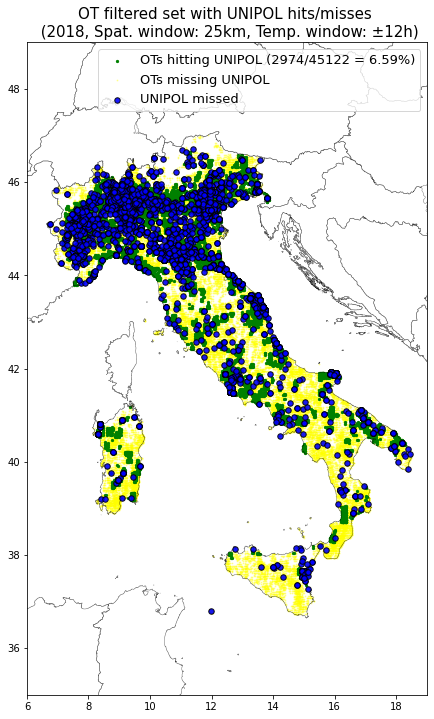

In [129]:
fig, ax = plt.subplots(figsize = (20,12))

plt.ylim(y_lim) #y_lim
plt.xlim(x_lim)  #x_lim

#OTs HITTING:
filt_OTset_land_HITTING_unipol_uniq_2018.plot(ax=ax, markersize=5, column='otpmax', color='green',
                                  zorder=2, label='OTs hitting UNIPOL (2974/45122 = 6.59%)')   

filt_OTset_land_MISSING_unipol_2018.plot(ax=ax, markersize=1, column='otpmax', color='yellow',
                                  zorder=1,alpha=0.3, label='OTs missing UNIPOL') 

#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=3)

#ESWD REPORTS:

#HITTED
pl.scatter(filt_unipol_HITTED_uniq_2018.lon, filt_unipol_HITTED_uniq_2018.lat, 
           30, c='red',marker="o", edgecolor='k',alpha=0.9, zorder=5, 
           label='UNIPOL hitted (368/812 = 45.3%)')
#MISSED
pl.scatter(filt_unipol_MISSED_2018.lon, filt_unipol_MISSED_2018.lat, 30,
           c='blue',marker="o", edgecolor='k',alpha=0.9, zorder=4, label='UNIPOL missed') 

#cell.plot(ax=ax, facecolor="none", edgecolor='grey');
plt.title('OT filtered set with UNIPOL hits/misses \n (2018, Spat. window: 25km, Temp. window: ±12h)',
          fontsize=15);
plt.legend(loc='best', fontsize=13)

#plt.savefig('/home/ciccuz/phd/KIT/scripts/plots/OT_filter_validation/vsUNIPOL_2016-2018/OTfilt_unipol_valid_2017.png', 
#            dpi=300, bbox_inches='tight');

#### - Analysis valid. UNIPOL for 2016-2018:

In [86]:
#read dictionary from external file
with open(fold + 'data/OTfilter_validation/2017/valid_vs_unipol/filtOTset_vs_unipol.txt', 'rb') as file:
     filtOTset_valid_unipol_2017 = pickle.load(file)
with open(fold + 'data/OTfilter_validation/2017/valid_vs_unipol/unfiltOTset_vs_unipol.txt', 'rb') as file:
     allOTset_valid_unipol_2017 = pickle.load(file)
        
#read dictionary from external file
with open(fold + 'data/OTfilter_validation/2018/valid_vs_unipol/filtOTset_vs_unipol.txt', 'rb') as file:
     filtOTset_valid_unipol_2018 = pickle.load(file)
with open(fold + 'data/OTfilter_validation/2018/valid_vs_unipol/unfiltOTset_vs_unipol.txt', 'rb') as file:
     allOTset_valid_unipol_2018 = pickle.load(file)

In [87]:
#FILTERED OT SET VALIDATION
filt_unipol_HITTED_uniq_2017 = filtOTset_valid_unipol_2017['reports_HITTED_uniq']
filt_unipol_HITTED_uniq_2018 = filtOTset_valid_unipol_2018['reports_HITTED_uniq']

filt_OTset_land_HITTING_unipol_uniq_2017 = filtOTset_valid_unipol_2017['OT_HITTING_uniq']
filt_OTset_land_HITTING_unipol_uniq_2018 = filtOTset_valid_unipol_2018['OT_HITTING_uniq']

#UNFILTERED OT SET VALIDATION
unfilt_unipol_HITTED_uniq_2017 = allOTset_valid_unipol_2017['reports_HITTED_uniq']
unfilt_unipol_HITTED_uniq_2018 = allOTset_valid_unipol_2018['reports_HITTED_uniq']

unfilt_OTset_land_HITTING_unipol_uniq_2017 = allOTset_valid_unipol_2017['OT_HITTING_uniq']
unfilt_OTset_land_HITTING_unipol_uniq_2018 = allOTset_valid_unipol_2018['OT_HITTING_uniq']

In [104]:
#concat 3 years together:
filt_unipol_HITTED_uniq_2017_2018 = pd.concat([filt_unipol_HITTED_uniq_2017, 
                                                  filt_unipol_HITTED_uniq_2018])

filt_OTset_land_HITTING_unipol_uniq_2017_2018 = pd.concat([filt_OTset_land_HITTING_unipol_uniq_2017,
                                                             filt_OTset_land_HITTING_unipol_uniq_2018])

unfilt_unipol_HITTED_uniq_2017_2018 = pd.concat([unfilt_unipol_HITTED_uniq_2017,
                                                   unfilt_unipol_HITTED_uniq_2018])

unfilt_OTset_land_HITTING_unipol_uniq_2017_2018 = pd.concat([unfilt_OTset_land_HITTING_unipol_uniq_2017,
                                                               unfilt_OTset_land_HITTING_unipol_uniq_2018])

In [107]:
#Fraction of unipol events hitted by filtered OTs:
frac_filt_unipol_HITTED_2017_2018 = len(filt_unipol_HITTED_uniq_2017_2018)/len(unipol_NO00)
print('Fraction of unipol events hitted by filtered OTs= ', frac_filt_unipol_HITTED_2017_2018)

#Fraction of missed unipol events by filtered OTs:
filt_unipol_MISSED_2017_2018 = unipol_NO00[~unipol_NO00.index.isin(filt_unipol_HITTED_uniq_2017_2018.index)]
frac_filt_unipol_MISSED_2017_2018 = len(filt_unipol_MISSED_2017_2018)/len(unipol_NO00)
print('Fraction of unipol events missed by filtered OTs= ', frac_filt_unipol_MISSED_2017_2018)

#Fraction of filtered OTs hitting at least 1 unipol report 
frac_filt_OTs_land_HITTING_2017_2018 = len(filt_OTset_land_HITTING_unipol_uniq_2017_2018)/len(filt_OTset_2017_2018_land_IT)
print('Fraction of filtered OTs hitting at least 1 unipol report= ', frac_filt_OTs_land_HITTING_2017_2018)

#Fraction of filtered OTs missing unipol reports
filt_OTset_land_MISSING_unipol_2017_2018 = filt_OTset_2017_2018_land_IT[~filt_OTset_2017_2018_land_IT.index.isin(filt_OTset_land_HITTING_unipol_uniq_2017_2018.index)]
frac_filt_OTs_land_MISSING_unipol_2017_2018 = len(filt_OTset_land_MISSING_unipol_2017_2018)/len(filt_OTset_2017_2018_land_IT)
print('Fraction of filtered OTs missing unipol reports= ', frac_filt_OTs_land_MISSING_unipol_2017_2018)

Fraction of unipol events hitted by filtered OTs=  0.20687520633872566
Fraction of unipol events missed by filtered OTs=  0.7931247936612743
Fraction of filtered OTs hitting at least 1 unipol report=  0.1540653008962868
Fraction of filtered OTs missing unipol reports=  0.801920614596671


In [108]:
#Fraction of unipol events hitted by unfiltered OTs:
frac_unfilt_unipol_HITTED_2017_2018 = len(unfilt_unipol_HITTED_uniq_2017_2018)/len(unipol_NO00)
print('Fraction of unipol events hitted by unfiltered OTs= ', frac_unfilt_unipol_HITTED_2017_2018)

#Fraction of missed unipol events by nufiltered OTs:
unfilt_unipol_MISSED_2017_2018 = unipol_NO00[~unipol_NO00.index.isin(unfilt_unipol_HITTED_uniq_2017_2018.index)]
frac_unfilt_unipol_MISSED_2017_2018 = len(unfilt_unipol_MISSED_2017_2018)/len(unipol_NO00)
print('Fraction of unipol events missed by unfiltered OTs= ', frac_unfilt_unipol_MISSED_2017_2018)

#Fraction of unfiltered OTs hitting at least 1 unipol report 
frac_unfilt_OTs_land_HITTING_2017_2018 = len(unfilt_OTset_land_HITTING_unipol_uniq_2017_2018)/len(all_OTset_2017_2018_land_IT)
print('Fraction of unfiltered OTs hitting at least 1 unipol report= ', frac_unfilt_OTs_land_HITTING_2017_2018)

#Fraction of unfiltered OTs missing unipol reports
unfilt_OTset_land_MISSING_unipol_2017_2018 = all_OTset_2017_2018_land_IT[~all_OTset_2017_2018_land_IT.index.isin(unfilt_OTset_land_HITTING_unipol_uniq_2017_2018.index)]
frac_unfilt_OTs_land_MISSING_unipol_2017_2018 = len(unfilt_OTset_land_MISSING_unipol_2017_2018)/len(all_OTset_2017_2018_land_IT)
print('Fraction of unfiltered OTs missing unipol reports= ', frac_unfilt_OTs_land_MISSING_unipol_2017_2018)

Fraction of unipol events hitted by unfiltered OTs=  0.23068669527896996
Fraction of unipol events missed by unfiltered OTs=  0.76931330472103
Fraction of unfiltered OTs hitting at least 1 unipol report=  0.1421509070342285
Fraction of unfiltered OTs missing unipol reports=  0.822455905148938


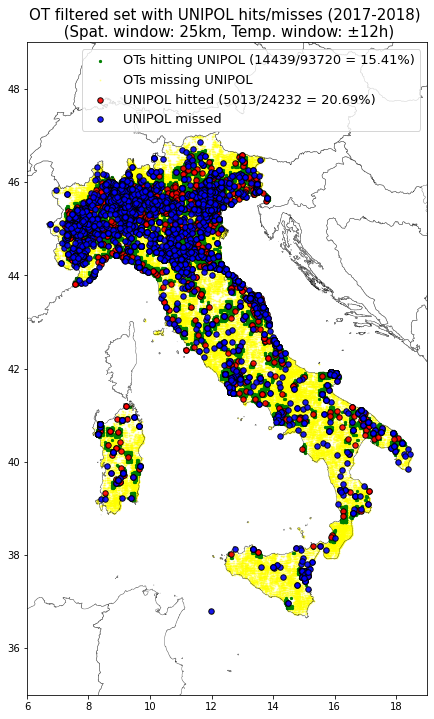

In [112]:
fig, ax = plt.subplots(figsize = (20,12))

plt.ylim(y_lim) #y_lim
plt.xlim(x_lim)  #x_lim

#OTs HITTING:
filt_OTset_land_HITTING_unipol_uniq_2017_2018.plot(ax=ax, markersize=5, column='otpmax', color='green',
                                  zorder=2, label='OTs hitting UNIPOL (14439/93720 = 15.41%)')   

filt_OTset_land_MISSING_unipol_2017_2018.plot(ax=ax, markersize=1, column='otpmax', color='yellow',
                                  zorder=1,alpha=0.3, label='OTs missing UNIPOL') 

#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=3)

#UNIPOL REPORTS:

#HITTED
pl.scatter(filt_unipol_HITTED_uniq_2017_2018.lon, filt_unipol_HITTED_uniq_2017_2018.lat, 
           30, c='red',marker="o", edgecolor='k',alpha=0.9, zorder=4, 
           label='UNIPOL hitted (5013/24232 = 20.69%)')
#MISSED
pl.scatter(filt_unipol_MISSED_2017_2018.lon, filt_unipol_MISSED_2017_2018.lat, 30,
           c='blue',marker="o", edgecolor='k',alpha=0.9, zorder=5, label='UNIPOL missed') 

#cell.plot(ax=ax, facecolor="none", edgecolor='grey');
plt.title('OT filtered set with UNIPOL hits/misses (2017-2018) \n (Spat. window: 25km, Temp. window: ±12h)',
          fontsize=15);
plt.legend(loc='best', fontsize=13)

#plt.savefig('/home/ciccuz/phd/KIT/scripts/plots/OT_filter_validation/vsUNIPOL_2017-2018/OTfilt_unipol_valid_2017_2018.png', 
#            dpi=300, bbox_inches='tight');

### - Characterization of MISSED/HITTED UNIPOL reports

to see if there is some spatio-temporal bias in the reports?

In [121]:
unfilt_unipol_HITTED_uniq_2017_2018

,datetime,lon,lat,geometry
3,2017-04-16 18:30:00,11.477947,44.430923,POINT (11.47795 44.43092)
9,2017-05-14 21:00:00,11.474804,45.762646,POINT (11.47480 45.76265)
10,2017-05-19 17:30:00,9.176778,45.700500,POINT (9.17678 45.70050)
11,2017-05-19 20:00:00,9.278058,45.587769,POINT (9.27806 45.58777)
15,2017-06-05 14:00:00,10.717331,45.110283,POINT (10.71733 45.11028)
...,...,...,...,...
26997,2018-10-29 17:00:00,11.267406,44.473587,POINT (11.26741 44.47359)
26973,2018-10-29 16:00:00,11.074986,44.600754,POINT (11.07499 44.60075)
27188,2018-10-30 01:00:00,11.074986,44.600754,POINT (11.07499 44.60075)
27055,2018-10-29 19:00:00,11.903707,45.948791,POINT (11.90371 45.94879)


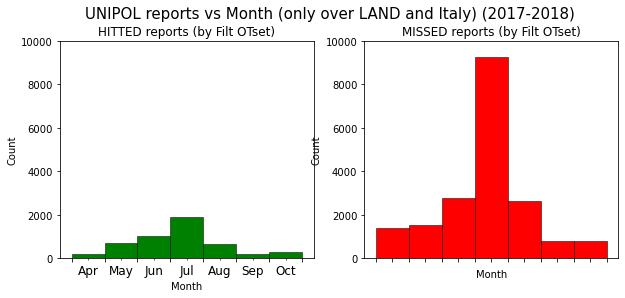

In [167]:
#Histogram of OTs distribution dep. on the MONTH only OVER LAND:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,4))

ax1.hist(filt_unipol_HITTED_uniq_2017_2018.datetime.dt.month, bins=np.arange(4,12,1),
         facecolor = 'green', edgecolor='black', linewidth=0.5)
pl.locator_params(axis='x', nbins=8)
ax1.set_xticklabels('')
ax1.set_xticks([4.5,5.5,6.5,7.5,8.5,9.5,10.5], minor=True)
ax1.set_xticklabels(['Apr','May','Jun','Jul','Aug','Sep','Oct'], minor=True, fontsize=12)
ax1.set_ylabel('Count', fontsize=10)
ax1.set_xlabel('Month', fontsize=10)
ax1.set_title('HITTED reports (by Filt OTset)', fontsize=12);
ax1.set_ylim([0,10000])

ax2.hist(filt_unipol_MISSED_2017_2018.datetime.dt.month, bins=np.arange(4,12,1),
         facecolor = 'red', edgecolor='black', linewidth=0.5)
pl.locator_params(axis='x', nbins=24)
ax2.set_xticklabels('')
ax2.set_xticks([4.5,5.5,6.5,7.5,8.5,9.5,10.5], minor=True)
ax2.set_xticklabels(['Apr','May','Jun','Jul','Aug','Sep','Oct'], minor=True, fontsize=12)
ax2.set_ylabel('Count', fontsize=10)
ax2.set_xlabel('Month', fontsize=10)
ax2.set_title('MISSED reports (by Filt OTset)', fontsize=12);
ax2.set_ylim([0,10000])

"""
ax3.hist(unfilt_unipol_HITTED_uniq_2017_2018.datetime.dt.month, bins=np.arange(4,12,1),
         facecolor = 'green', edgecolor='black', linewidth=0.5)
pl.locator_params(axis='x', nbins=24)
ax3.set_xticklabels('')
ax3.set_xticks([4.5,5.5,6.5,7.5,8.5,9.5,10.5], minor=True)
ax3.set_xticklabels(['Apr','May','Jun','Jul','Aug','Sep','Oct'], minor=True, fontsize=12)
ax3.set_ylabel('Count', fontsize=10)
ax3.set_xlabel('Month', fontsize=10)
ax3.set_title('HITTED reports (by UNFilt OTset)', fontsize=12);
ax3.set_ylim([0,10000])

ax4.hist(unfilt_unipol_MISSED_2017_2018.datetime.dt.month, bins=np.arange(4,12,1),
         facecolor = 'red', edgecolor='black', linewidth=0.5)
pl.locator_params(axis='x', nbins=24)
ax4.set_xticklabels('')
ax4.set_xticks([4.5,5.5,6.5,7.5,8.5,9.5,10.5], minor=True)
ax4.set_xticklabels(['Apr','May','Jun','Jul','Aug','Sep','Oct'], minor=True, fontsize=12)
ax4.set_ylabel('Count', fontsize=10)
ax4.set_xlabel('Month', fontsize=10)
ax4.set_title('MISSED reports (by UNFilt OTset)', fontsize=12);
ax4.set_ylim([0,10000])
"""

fig.suptitle('UNIPOL reports vs Month (only over LAND and Italy) (2017-2018)', fontsize=15, y=1);

plt.savefig('/home/ciccuz/phd/KIT/scripts/plots/OT_filter_validation/vsUNIPOL_2017-2018/unipol_HIT_MISS_vMonth_2017_2018.png', 
            dpi=300, bbox_inches='tight');

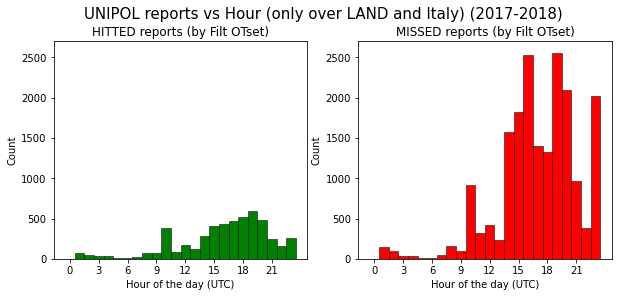

In [168]:
#Histogram of OTs distribution dep. on the MONTH only OVER LAND:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,4))

ax1.hist(filt_unipol_HITTED_uniq_2017_2018.datetime.dt.hour, bins=np.arange(25)-0.5,
         facecolor = 'green', edgecolor='black', linewidth=0.5)
pl.locator_params(axis='x', nbins=24)
ax1.set_xticks(np.arange(0, 24, 3))
ax1.set_ylabel('Count', fontsize=10)
ax1.set_xlabel('Hour of the day (UTC)', fontsize=10)
ax1.set_ylabel('Count', fontsize=10)
ax1.set_title('HITTED reports (by Filt OTset)', fontsize=12);
ax1.set_ylim([0,2700])

ax2.hist(filt_unipol_MISSED_2017_2018.datetime.dt.hour, bins=np.arange(25)-0.5,
         facecolor = 'red', edgecolor='black', linewidth=0.5)
pl.locator_params(axis='x', nbins=24)
ax2.set_xticks(np.arange(0, 24, 3))
ax2.set_ylabel('Count', fontsize=10)
ax2.set_xlabel('Hour of the day (UTC)', fontsize=10)
ax2.set_ylabel('Count', fontsize=10)
ax2.set_title('MISSED reports (by Filt OTset)', fontsize=12);
ax2.set_ylim([0,2700])
"""
ax3.hist(unfilt_unipol_HITTED_uniq_2017_2018.datetime.dt.hour, bins=np.arange(25)-0.5,
         facecolor = 'green', edgecolor='black', linewidth=0.5)
pl.locator_params(axis='x', nbins=24)
ax3.set_xticks(np.arange(0, 24, 3))
ax3.set_ylabel('Count', fontsize=10)
ax3.set_xlabel('Hour of the day (UTC)', fontsize=10)
ax3.set_ylabel('Count', fontsize=10)
ax3.set_title('HITTED reports (by Filt OTset)', fontsize=12);
ax3.set_ylim([0,3000])

ax4.hist(unfilt_unipol_MISSED_2017_2018.datetime.dt.hour, bins=np.arange(25)-0.5,
          facecolor = 'red', edgecolor='black', linewidth=0.5)
pl.locator_params(axis='x', nbins=24)
ax4.set_xticks(np.arange(0, 24, 3))
ax4.set_ylabel('Count', fontsize=10)
ax4.set_xlabel('Hour of the day (UTC)', fontsize=10)
ax4.set_ylabel('Count', fontsize=10)
ax4.set_title('MISSED reports (by Filt OTset)', fontsize=12);
ax4.set_ylim([0,3000])
"""
fig.suptitle('UNIPOL reports vs Hour (only over LAND and Italy) (2017-2018)', fontsize=15, y=1);

plt.savefig('/home/ciccuz/phd/KIT/scripts/plots/OT_filter_validation/vsUNIPOL_2017-2018/unipol_HIT_MISS_vHour_2017_2018.png', 
            dpi=300, bbox_inches='tight');

In [169]:
filt_unipol_MISSED_2017_2018[filt_unipol_MISSED_2017_2018.datetime.dt.hour == 23]

,datetime,lon,lat,geometry
32,2017-06-15 23:00:00,8.970179,45.738869,POINT (8.97018 45.73887)
101,2017-06-27 23:00:00,7.785202,44.946934,POINT (7.78520 44.94693)
102,2017-06-27 23:00:00,7.785202,44.946934,POINT (7.78520 44.94693)
751,2017-09-11 23:00:00,13.332579,38.133080,POINT (13.33258 38.13308)
834,2017-09-16 23:00:00,9.608865,45.689301,POINT (9.60886 45.68930)
...,...,...,...,...
27133,2018-10-29 23:30:00,8.208807,44.100613,POINT (8.20881 44.10061)
27135,2018-10-29 23:30:00,8.463366,45.129009,POINT (8.46337 45.12901)
27136,2018-10-29 23:30:00,8.646701,44.911941,POINT (8.64670 44.91194)
27138,2018-10-29 23:45:00,8.463366,45.129009,POINT (8.46337 45.12901)


In [171]:
2023/19219

0.10526041937665852

In [170]:
filt_unipol_MISSED_2017_2018

,datetime,lon,lat,geometry
0,2017-04-15 17:00:00,7.893009,45.456619,POINT (7.89301 45.45662)
1,2017-04-15 17:06:00,7.679822,45.074093,POINT (7.67982 45.07409)
2,2017-04-16 10:00:00,12.029904,44.006611,POINT (12.02990 44.00661)
6,2017-04-17 08:00:00,11.355955,44.574921,POINT (11.35596 44.57492)
7,2017-05-09 18:00:00,9.653610,45.647407,POINT (9.65361 45.64741)
...,...,...,...,...
27214,2018-10-30 18:00:00,9.548065,45.548222,POINT (9.54807 45.54822)
27216,2018-10-31 09:00:00,9.199469,44.312763,POINT (9.19947 44.31276)
27217,2018-10-31 10:46:00,14.508273,40.781990,POINT (14.50827 40.78199)
27218,2018-10-31 16:00:00,8.852163,44.726948,POINT (8.85216 44.72695)


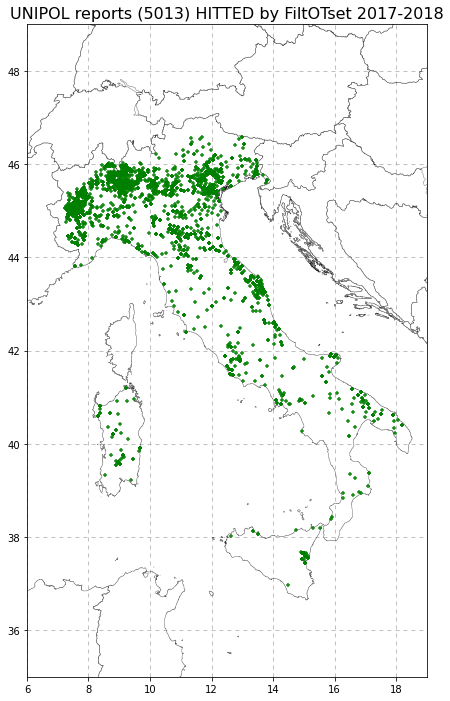

In [172]:
fig, ax = plt.subplots(figsize = (10,12))

plt.xlim(x_lim)
plt.ylim(y_lim)

#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=3)
    
'''
PLOT UNIPOL data 
'''

c=pl.scatter(filt_unipol_HITTED_uniq_2017_2018.lon,filt_unipol_HITTED_uniq_2017_2018.lat,15,c='green',
                marker="+",edgecolor='k',alpha=0.9,zorder=4)
pl.grid(ls=(0,(5,5)))
pl.title('UNIPOL reports (5013) HITTED by FiltOTset 2017-2018', fontsize=16);

plt.savefig('/home/ciccuz/phd/KIT/scripts/plots/OT_filter_validation/vsUNIPOL_2017-2018/unipol_HIT_map_2017_2018.png', 
            dpi=300, bbox_inches='tight');

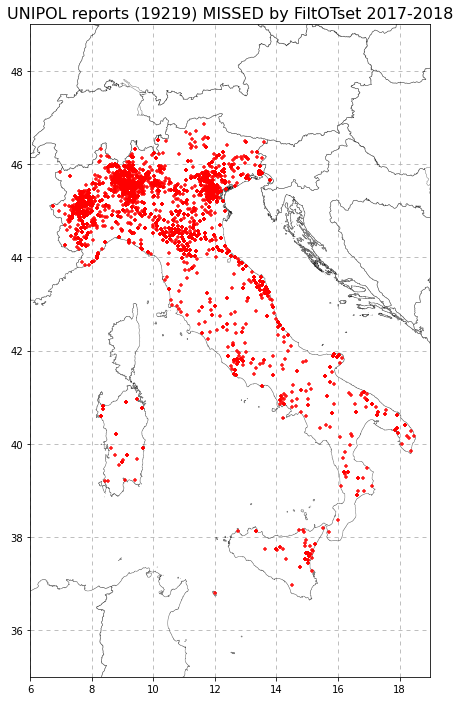

In [173]:
fig, ax = plt.subplots(figsize = (10,12))

plt.xlim(x_lim)
plt.ylim(y_lim)

#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=3)
    
'''
PLOT UNIPOL data 
'''

c=pl.scatter(filt_unipol_MISSED_2017_2018.lon,filt_unipol_MISSED_2017_2018.lat,15,c='red',
                marker="+",edgecolor='k',alpha=0.9,zorder=4)
pl.grid(ls=(0,(5,5)))
pl.title('UNIPOL reports (19219) MISSED by FiltOTset 2017-2018', fontsize=16);

plt.savefig('/home/ciccuz/phd/KIT/scripts/plots/OT_filter_validation/vsUNIPOL_2017-2018/unipol_MISS_map_2017_2018.png', 
            dpi=300, bbox_inches='tight');